In [1]:
import pandas as pd
import itertools
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('Solarize_Light2')

pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

import matplotlib
matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 12
matplotlib.rcParams['ytick.labelsize'] = 12
matplotlib.rcParams['text.color'] = 'k'
import seaborn as sns

import statsmodels.api as sm
from scipy.stats import boxcox, jarque_bera, probplot
from scipy.special import inv_boxcox
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_breusch_godfrey
from pmdarima import auto_arima

from datetime import timedelta
from math import sqrt
import random

from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, median_absolute_error

import os
print(os.listdir("/Users/yc00027/Documents/air-quality-madrid/"))

import warnings
warnings.filterwarnings("ignore")

['.DS_Store', 'new_data', 'csvs_per_year', 'stations.csv', 'madrid.h5', '.ipynb_checkpoints']


In [2]:
# Define functions to fit an auto ARIMA model and generate predictions

def fit_autoARIMA(train):
    model = auto_arima(train.rename(None), trace=True, error_action='ignore', suppress_warnings=True) 
    model_fit = model.fit(train, transparams=False, disp=-1)
    return model_fit

def predict_autoARIMA(model_fit, test):
    predictions = model_fit.predict(n_periods=len(test))
    return predictions[0]

# Define function to plot actuals vs predictions

def plot_actuals_predictions(target, predictions_final, results_df):
    fig, ax = plt.subplots(figsize=(21,7))
    actuals = plt.plot(target, label='Actuals')
    predictions = plt.plot(predictions_final, label='Predictions')
    error = results_df['rmse'].mean()
    plt.legend(loc='best')
    plt.title('RMSE: %.2f'% error)
    plt.show()

# Define model evaluation function

def evaluate_forecast(target, predictions_final, model_name):
    results = {'models': model_name}
    results['r2_score'] = r2_score(target, predictions_final)
    results['mean_abs_error'] = mean_absolute_error(target, predictions_final)
    results['median_abs_error'] = median_absolute_error(target, predictions_final)
    results['mse'] = mean_squared_error(target, predictions_final)
    results['rmse'] = np.sqrt(results['mse'])
    return results

# Air quality Madrid - Rolling predictions

### Extracting the data

In [3]:
# Import full dataframe

df_full = pd.read_csv('full_madrid_air_quality.csv').set_index('date').sort_index()
df_full.index = pd.to_datetime(df_full.index)

# Select data for the time period, particles and stations of interest

first_date = '2012-01-01 00:00:00'
last_date = '2018-04-30 23:00:00'

particles_of_interest = ['NO_2', 'O_3', 'PM10', 'SO_2']

particle_of_interest = 'PM10'

df_full['all_particles'] = df_full[particles_of_interest].sum(axis=1)

particles_of_interest = particles_of_interest + ['all_particles']

df_temp = df_full.loc[first_date:last_date][particles_of_interest + ['station']].sort_index()

print(f'The time period is from {first_date} to {last_date}')
print('')
print(f'The particle of interest is: {particle_of_interest}')
print('')
print(f'One particle DF shape: {df_temp.shape}')

df_temp.head()

The time period is from 2012-01-01 00:00:00 to 2018-04-30 23:00:00

The particle of interest is: PM10

One particle DF shape: (2164032, 6)


,NO_2,O_3,PM10,SO_2,all_particles,station
date,,,,,,
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079001
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079022
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079019
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079021
2012-01-01,NaN,NaN,NaN,NaN,0.0,28079012


## Rolling predictions

### Rolling autoARIMA: target = particle_of_interest

### Station nr 28079008 - Parque del Retiro/ Escuelas Aguirre

In [4]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079008

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079008

Missing values for particle and station of interest: 1.52%

One particle, one station DF shape: (54647, 9)


,PM10,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,58.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,93.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,121.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,97.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,40.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.607, BIC=2684.045, Time=0.623 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.283, BIC=2676.762, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2665.382, BIC=2676.601, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.578, BIC=2676.797, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2960.285, BIC=2964.025, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.669, BIC=2682.368, Time=0.351 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.673, BIC=2682.372, Time=0.473 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.722, BIC=2687.900, Time=0.685 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2661.398, BIC=2687.577, Time=0.514 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.051, BIC=2801.260, Time=0.187 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2983.328, BIC=2987.064, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.019, BIC=2811.702, Time=0.489 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.564, BIC=2812.247, Time=0.526 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2796.627, BIC=2822.783, Time=0.677 seconds
Near non-invertible roots for order

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.609, BIC=2574.976, Time=0.328 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2556.672, BIC=2575.038, Time=0.403 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.424, BIC=2579.137, Time=0.843 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.162, BIC=2580.201, Time=0.447 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.298, BIC=2584.685, Time=0.810 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2557.922, BIC=2587.308, Time=0.822 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2559.453, BIC=2585.166, Time=0.596 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2559.998, BIC=2585.712, Time=0.265 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2557.338, BIC=2590.398, Time=0.939 seconds
Total fit time: 6.395 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.139, BIC=2998.805, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2981.439, BIC=3000.106, Time=0.327 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2976.107, BIC=3002.240, Time=0.566 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.858, BIC=2999.258, Time=0.488 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.089, BIC=3007.956, Time=0.766 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2977.945, BIC=3007.812, Time=0.742 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.039, BIC=3002.172, Time=0.556 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2974.122, BIC=2996.522, Time=0.391 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2997.979, BIC=3016.645, Time=0.266 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2976.048, BIC=3002.181, Time=0.552 seconds
Fit ARIMA: (0, 0, 2)

Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2343.531, BIC=2373.397, Time=1.448 seconds
Total fit time: 8.321 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.685, BIC=2476.085, Time=1.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2454.541, BIC=2462.008, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2452.818, BIC=2464.018, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.187, BIC=2463.387, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2730.594, BIC=2734.327, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.713, BIC=2467.647, Time=0.288 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2452.872, BIC=2467.805, Time=0.246 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.524, BIC=2473.191, Time=0.485 seconds
Total fit time: 2.428 seconds
Performing ste

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2504.261, BIC=2530.257, Time=1.210 seconds
Near non-invertible roots for order (1, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 3.420 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2560.754, BIC=2583.075, Time=1.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.392, BIC=2579.833, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.055, BIC=2579.216, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.351, BIC=2579.512, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3003.031, BIC=3006.751, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.353, BIC=2576.955, Time=0.637 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.238, BIC=2585.119, Tim

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.713, BIC=2519.152, Time=0.758 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.126, BIC=2524.606, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2499.137, BIC=2510.357, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.714, BIC=2512.934, Time=0.349 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2918.296, BIC=2922.035, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.013, BIC=2513.712, Time=0.804 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2501.845, BIC=2516.804, Time=0.226 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.843, BIC=2508.802, Time=0.290 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.219, BIC=2513.918, Time=0.558 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2499.885, BIC=2514.845, Time=0.141 seconds
Total fit time: 3.2

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2923.485, BIC=2949.618, Time=0.580 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2942.472, BIC=2957.405, Time=0.158 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2929.672, BIC=2952.072, Time=0.424 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2921.168, BIC=2951.035, Time=0.989 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 6.390 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.397, BIC=2740.797, Time=0.695 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.569, BIC=2739.036, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.410, BIC=2735.610, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.093, BIC=2736.293, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2350.069, BIC=2368.751, Time=0.536 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2350.368, BIC=2369.051, Time=0.558 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2346.971, BIC=2373.127, Time=0.909 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2345.543, BIC=2367.962, Time=0.529 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2353.515, BIC=2372.198, Time=0.244 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2345.610, BIC=2371.766, Time=0.732 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2359.788, BIC=2374.734, Time=0.245 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2343.679, BIC=2366.098, Time=0.335 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2345.650, BIC=2371.806, Time=0.300 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2347.377, BIC=2377.269, Time=1.103 seconds
Total fit time: 6.50

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.015, BIC=2568.649, Time=0.669 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.444, BIC=2574.352, Time=0.218 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.335, BIC=2564.242, Time=0.607 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.476, BIC=2569.110, Time=0.710 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2559.380, BIC=2574.288, Time=0.237 seconds
Total fit time: 3.594 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.462, BIC=2743.862, Time=0.876 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.099, BIC=2727.566, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2721.805, BIC=2733.005, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.784, BIC=2732.984, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.570, BIC=2908.950, Time=0.675 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.069, BIC=2913.529, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2906.323, BIC=2917.513, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.877, BIC=2918.067, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3203.100, BIC=3206.830, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2885.232, BIC=2903.882, Time=0.447 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2894.319, BIC=2909.239, Time=0.191 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.725, BIC=2905.645, Time=0.372 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2886.430, BIC=2908.811, Time=0.731 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.152, BIC=2908.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.031, BIC=2743.698, Time=0.341 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.137, BIC=2755.070, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.866, BIC=2749.799, Time=0.352 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2726.742, BIC=2749.142, Time=0.572 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2737.902, BIC=2756.568, Time=0.294 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.220, BIC=2744.887, Time=0.369 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2726.483, BIC=2752.616, Time=0.465 seconds
Total fit time: 3.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.139, BIC=2709.539, Time=0.503 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.128, BIC=2707.595, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.045, BIC=2702.235, Time=0.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2979.313, BIC=2983.043, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.976, BIC=2700.627, Time=0.477 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.127, BIC=2704.047, Time=0.232 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.364, BIC=2698.284, Time=0.474 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.603, BIC=2705.983, Time=1.024 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2684.096, BIC=2702.747, Time=0.290 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.406, BIC=2701.057, Time=0.522 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.354, BIC=2711.464, Time=0.836 seconds
Total fit time: 5.284 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.272, BIC=2949.192, Time=0.387 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2930.916, BIC=2953.297, Time=0.619 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2935.678, BIC=2954.329, Time=0.282 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2932.339, BIC=2958.449, Time=0.699 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2932.027, BIC=2958.138, Time=0.914 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2935.036, BIC=2957.416, Time=0.483 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2932.779, BIC=2962.620, Time=1.098 seconds
Total fit time: 6.373 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.899, BIC=2801.299, Time=0.806 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2796.158, BIC=2803.625, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.139, BIC=2596.273, Time=1.267 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.128, BIC=2604.995, Time=1.555 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2576.926, BIC=2606.792, Time=1.640 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2570.139, BIC=2596.272, Time=1.346 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2571.219, BIC=2593.619, Time=0.720 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2573.205, BIC=2603.072, Time=1.423 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.199, BIC=2590.866, Time=0.524 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2572.570, BIC=2598.703, Time=0.772 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2573.654, BIC=2607.254, Time=1.622 seconds
Total fit time: 18.874 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2710.673, BIC=2736.738, Time=0.619 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2723.094, BIC=2745.436, Time=0.568 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2711.789, BIC=2741.577, Time=1.301 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2712.143, BIC=2741.932, Time=0.854 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2722.300, BIC=2748.366, Time=0.659 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2712.869, BIC=2746.381, Time=1.858 seconds
Total fit time: 10.207 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.393, BIC=2642.735, Time=1.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.908, BIC=2661.355, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2644.450, BIC=2655.621, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.441, BIC=2577.861, Time=0.730 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2567.292, BIC=2574.765, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.573, BIC=2579.783, Time=0.043 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.799, BIC=2580.009, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2949.001, BIC=2952.737, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.602, BIC=2574.285, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.275, BIC=2572.958, Time=0.672 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2559.746, BIC=2574.692, Time=0.546 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.385, BIC=2568.332, Time=0.198 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.575, BIC=2573.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.969, BIC=2830.928, Time=0.378 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.966, BIC=2836.664, Time=0.533 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.150, BIC=2843.109, Time=0.213 seconds
Total fit time: 2.834 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.710, BIC=2799.129, Time=0.811 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.095, BIC=2792.568, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.948, BIC=2795.158, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.444, BIC=2795.653, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3076.890, BIC=3080.627, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.944, BIC=2791.627, Time=0.694 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2314.772, BIC=2333.455, Time=0.548 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2324.065, BIC=2339.011, Time=0.372 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2312.776, BIC=2327.722, Time=0.676 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2314.773, BIC=2333.456, Time=0.655 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2322.085, BIC=2337.031, Time=0.248 seconds
Total fit time: 3.543 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2336.370, BIC=2358.770, Time=0.569 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.610, BIC=2493.077, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2410.580, BIC=2421.780, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2330.704, BIC=2341.904, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2404.360, BIC=2423.059, Time=0.649 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2404.232, BIC=2430.411, Time=0.875 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2404.275, BIC=2430.453, Time=1.214 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.377, BIC=2417.336, Time=0.521 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2413.786, BIC=2428.746, Time=0.130 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2412.510, BIC=2427.469, Time=0.219 seconds
Total fit time: 5.986 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2405.150, BIC=2427.608, Time=0.943 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2418.485, BIC=2425.971, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2413.113, BIC=2424.342, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.276, BIC=2688.991, Time=0.607 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.875, BIC=2699.076, Time=1.034 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2668.604, BIC=2694.805, Time=0.839 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.960, BIC=2683.932, Time=0.594 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2671.214, BIC=2693.672, Time=0.874 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.385, BIC=2692.843, Time=0.756 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2665.134, BIC=2695.078, Time=1.218 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.419, BIC=2635.638, Time=0.177 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.305, BIC=2635.524, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2935.839, BIC=2939.579, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2626.151, BIC=2641.111, Time=0.472 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.241, BIC=2641.200, Time=0.223 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.290, BIC=2646.989, Time=0.390 seconds
Total fit time: 2.705 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.571, BIC=2536.912, Time=1.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.864, BIC=2522.311, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2512.900, BIC=2524.071, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2349.067, BIC=2371.506, Time=1.296 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2527.831, BIC=2535.310, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2453.426, BIC=2464.646, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2350.628, BIC=2361.848, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2525.834, BIC=2529.573, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2347.393, BIC=2366.092, Time=0.840 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2349.815, BIC=2368.514, Time=0.765 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2344.132, BIC=2362.847, Time=0.461 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2344.205, BIC=2362.920, Time=0.547 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2343.457, BIC=2369.658, Time=0.994 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2343.348, BIC=2369.549, Time=0.661 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2342.414, BIC=2357.386, Time=0.354 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2342.063, BIC=2364.521, Time=0.442 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2343.049, BIC=2365.507, Time=0.587 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2345.498, BIC=2375.442, Time=1.047 seconds
Total fit time: 5.880 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2437.117, BIC=2459.575, Time=0.777 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.512, BIC=2718.951, Time=0.998 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.109, BIC=2701.588, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.709, BIC=2706.929, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.721, BIC=2706.941, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2992.863, BIC=2996.602, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.277, BIC=2709.236, Time=0.553 seconds
Total fit time: 1.808 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.235, BIC=2730.674, Time=0.596 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2727.228, BIC=2734.707, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.410, BIC=2734.629, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.632, BIC=2602.871, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2812.771, BIC=2816.517, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.650, BIC=2608.635, Time=0.134 seconds
Total fit time: 1.194 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.138, BIC=2608.615, Time=0.873 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.307, BIC=2589.799, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2583.512, BIC=2594.751, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2583.556, BIC=2594.794, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2774.947, BIC=2778.694, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2583.358, BIC=2598.342, Time=0.413 seconds
Total fit time: 1.487 seconds
Performing st

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.285, BIC=2834.396, Time=0.884 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2806.487, BIC=2832.598, Time=1.144 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.008, BIC=2817.929, Time=0.728 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2806.965, BIC=2829.346, Time=0.388 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.766, BIC=2838.976, Time=0.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3019.936, BIC=3023.673, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.773, BIC=2844.719, Time=0.155 seconds
Total fit time: 1.427 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.718, BIC=2708.157, Time=0.856 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.440, BIC=2691.919, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.317, BIC=2695.537, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.344, BIC=2695.564, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2974.920, BIC=2978.660, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2686.272, BIC=2701.231, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.827, BIC=2662.510, Time=0.374 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.555, BIC=2681.501, Time=0.217 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2642.913, BIC=2657.859, Time=0.375 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.274, BIC=2662.957, Time=0.557 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.433, BIC=2675.379, Time=0.122 seconds
Total fit time: 2.746 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2503.948, BIC=2526.367, Time=1.054 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.527, BIC=2533.000, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2521.071, BIC=2532.280, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.022, BIC=2533.232, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2263.591, BIC=2282.242, Time=0.433 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2257.583, BIC=2276.234, Time=0.304 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2261.484, BIC=2276.404, Time=0.633 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2300.535, BIC=2315.455, Time=0.166 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2258.179, BIC=2280.560, Time=0.744 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2268.095, BIC=2286.745, Time=0.329 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2260.141, BIC=2286.252, Time=0.579 seconds
Total fit time: 3.751 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2381.679, BIC=2404.040, Time

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.268, BIC=2510.356, Time=1.563 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2478.763, BIC=2512.305, Time=3.554 seconds
Total fit time: 23.076 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.192, BIC=2533.592, Time=1.656 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.160, BIC=2521.626, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2512.317, BIC=2523.517, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.105, BIC=2523.305, Time=0.316 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2950.637, BIC=2954.370, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2509.182, BIC=2527.849, Time=1.525 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.944, BIC=2528.877, Time=0.422 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.743, BIC=2690.442, Time=1.273 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.260, BIC=2690.219, Time=0.462 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.845, BIC=2686.805, Time=0.961 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2669.867, BIC=2692.306, Time=1.389 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2671.909, BIC=2690.608, Time=0.554 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2671.684, BIC=2697.862, Time=1.658 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2670.864, BIC=2697.043, Time=1.609 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2668.898, BIC=2691.337, Time=0.657 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2670.854, BIC=2697.033, Time=0.844 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2672.814, BIC=2702.732, Time=0.933 seconds
Total fit time: 12.6

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2559.349, BIC=2593.008, Time=2.036 seconds
Total fit time: 15.930 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2491.956, BIC=2514.394, Time=1.372 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.355, BIC=2500.834, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2492.376, BIC=2503.595, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.366, BIC=2503.585, Time=0.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2812.697, BIC=2816.436, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.387, BIC=2509.086, Time=1.130 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.354, BIC=2509.314, Time=0.408 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2488.411, BIC=2503.370, Time=1.372 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.438, BIC=2680.599, Time=0.193 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.142, BIC=2590.303, Time=0.183 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2749.265, BIC=2752.985, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2580.954, BIC=2595.836, Time=0.289 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2580.928, BIC=2595.809, Time=0.225 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.035, BIC=2601.637, Time=0.535 seconds
Total fit time: 2.416 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.690, BIC=2522.012, Time=1.172 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2513.511, BIC=2520.952, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2511.713, BIC=2522.874, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2584.163, BIC=2599.070, Time=0.606 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2585.313, BIC=2603.947, Time=0.797 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.068, BIC=2603.702, Time=0.766 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.778, BIC=2605.686, Time=0.224 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2590.122, BIC=2605.029, Time=0.190 seconds
Total fit time: 3.498 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2591.033, BIC=2613.413, Time=1.146 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2591.904, BIC=2599.364, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.975, BIC=2604.165, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.035, BIC=2604.225, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.758, BIC=3003.914, Time=1.417 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2976.951, BIC=3003.107, Time=0.888 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.395, BIC=2992.341, Time=0.462 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2978.294, BIC=3000.713, Time=0.854 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2977.974, BIC=3000.393, Time=1.073 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2977.466, BIC=3007.359, Time=1.673 seconds
Total fit time: 8.756 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.566, BIC=2784.986, Time=1.019 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.851, BIC=2794.324, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.175, BIC=2796.385, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2513.877, BIC=2536.277, Time=1.000 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2519.866, BIC=2538.533, Time=0.441 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.132, BIC=2530.798, Time=0.725 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.624, BIC=2541.758, Time=1.630 seconds
Total fit time: 6.905 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2442.716, BIC=2465.116, Time=1.354 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2445.148, BIC=2452.615, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2446.983, BIC=2458.183, Time=0.030 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2447.012, BIC=2458.212, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2720.798, BIC=2724.531, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.066, BIC=2723.247, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3021.158, BIC=3024.885, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.091, BIC=2723.726, Time=0.818 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.887, BIC=2726.795, Time=0.275 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.008, BIC=2719.915, Time=0.706 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.328, BIC=2723.962, Time=1.131 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2710.884, BIC=2725.792, Time=0.537 seconds
Total fit time: 5.080 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.850, BIC=2748.191, Time=1.434 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.517, BIC=2733.964, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.722, BIC=2768.932, Time=0.179 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2950.768, BIC=2954.504, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.234, BIC=2773.180, Time=0.245 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.070, BIC=2773.017, Time=0.211 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.965, BIC=2778.648, Time=0.436 seconds
Total fit time: 1.711 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.299, BIC=2886.699, Time=1.175 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3057.723, BIC=3065.190, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2942.931, BIC=2954.131, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.617, BIC=2875.817, Time=0.118 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.714, BIC=2670.365, Time=0.638 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.405, BIC=2674.326, Time=0.352 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.500, BIC=2667.420, Time=0.791 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2650.807, BIC=2673.188, Time=1.127 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2656.213, BIC=2674.864, Time=0.402 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2650.581, BIC=2676.692, Time=1.259 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2652.170, BIC=2682.011, Time=1.271 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2652.693, BIC=2682.533, Time=1.284 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2652.721, BIC=2678.832, Time=1.217 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2653.265, BIC=2679.375, Time=0.949 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2801.678, BIC=2805.411, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2619.370, BIC=2634.303, Time=0.212 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.437, BIC=2634.370, Time=0.164 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.369, BIC=2640.035, Time=0.369 seconds
Total fit time: 1.311 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.999, BIC=2730.320, Time=0.442 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.910, BIC=2907.351, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.025, BIC=2818.186, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.130, BIC=2734.291, Time=0.099 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2897.911, BIC=2901.631, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.289, BIC=2632.728, Time=1.166 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.739, BIC=2622.219, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.046, BIC=2625.266, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.449, BIC=2625.668, Time=0.231 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3002.655, BIC=3006.395, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.035, BIC=2627.734, Time=0.879 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.404, BIC=2629.363, Time=0.300 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.750, BIC=2622.709, Time=0.761 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2609.099, BIC=2627.798, Time=0.929 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2613.257, BIC=2628.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.969, BIC=2806.198, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3145.464, BIC=3149.207, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.523, BIC=2799.238, Time=0.772 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.231, BIC=2808.203, Time=0.242 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.543, BIC=2793.515, Time=0.650 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.526, BIC=2799.241, Time=0.822 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.908, BIC=2804.880, Time=0.330 seconds
Total fit time: 4.490 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.090, BIC=2863.548, Time=1.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.861, BIC=2898.347, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2408.087, BIC=2419.306, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2741.726, BIC=2745.466, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2409.683, BIC=2424.642, Time=0.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2404.585, BIC=2419.544, Time=0.671 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2406.450, BIC=2425.149, Time=0.783 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2406.412, BIC=2425.111, Time=0.717 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2409.924, BIC=2424.883, Time=0.108 seconds
Total fit time: 3.903 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2328.939, BIC=2351.377, Time=1.001 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2337.168, BIC=2344.648, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2416.545, BIC=2435.260, Time=0.894 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2432.638, BIC=2447.610, Time=0.277 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2414.950, BIC=2429.922, Time=0.739 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2416.624, BIC=2435.339, Time=1.482 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2429.106, BIC=2444.078, Time=0.183 seconds
Total fit time: 5.028 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2405.093, BIC=2427.551, Time=1.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2415.026, BIC=2422.512, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2411.540, BIC=2422.769, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2411.803, BIC=2423.032, Time=0.185 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.127, BIC=2565.605, Time=1.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.697, BIC=2576.189, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.886, BIC=2565.125, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2556.507, BIC=2567.746, Time=0.224 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2921.954, BIC=2925.700, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.643, BIC=2567.374, Time=0.890 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.665, BIC=2567.396, Time=1.102 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.125, BIC=2571.349, Time=1.531 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2545.126, BIC=2571.349, Time=1.414 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.766, BIC=2562.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.689, BIC=2667.918, Time=0.741 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3015.047, BIC=3018.790, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.375, BIC=2673.347, Time=1.246 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.583, BIC=2670.555, Time=0.869 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.049, BIC=2675.764, Time=0.924 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.943, BIC=2675.658, Time=1.061 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.590, BIC=2673.562, Time=0.291 seconds
Total fit time: 6.532 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.144, BIC=2627.602, Time=1.509 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2610.758, BIC=2618.244, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2442.359, BIC=2453.597, Time=0.225 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2737.976, BIC=2741.723, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2438.884, BIC=2457.615, Time=1.005 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2438.885, BIC=2457.616, Time=1.048 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2438.544, BIC=2464.767, Time=1.473 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2438.334, BIC=2464.558, Time=1.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2436.887, BIC=2451.872, Time=0.733 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2444.194, BIC=2459.179, Time=0.270 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2443.883, BIC=2458.868, Time=0.344 seconds
Total fit time: 7.632 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2413.092, BIC=2435.550, Time=1.079 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2413.457, BIC=2443.401, Time=1.919 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 11.134 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2405.763, BIC=2428.221, Time=0.552 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.686, BIC=2574.172, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2500.150, BIC=2511.379, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2405.353, BIC=2416.582, Time=0.174 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.717, BIC=2479.175, Time=1.126 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2455.826, BIC=2485.770, Time=1.821 seconds
Total fit time: 9.630 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2390.727, BIC=2413.166, Time=1.175 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2403.488, BIC=2410.968, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2394.428, BIC=2405.647, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2395.831, BIC=2407.051, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2768.892, BIC=2772.632, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2390.800, BIC=2409.499, Time=0.715 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2390.826, BIC=2409.525, Time=0.737 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2738.129, BIC=2764.330, Time=0.968 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2737.707, BIC=2760.165, Time=0.554 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2751.796, BIC=2770.511, Time=0.347 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2739.245, BIC=2765.446, Time=0.939 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.734, BIC=2772.706, Time=0.361 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2752.192, BIC=2774.650, Time=0.444 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2739.121, BIC=2769.065, Time=1.295 seconds
Total fit time: 8.784 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.067, BIC=2699.544, Time=0.871 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2685.197, BIC=2692.689, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.663, BIC=2706.901, Time=0.567 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2899.036, BIC=2902.782, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.967, BIC=2717.698, Time=0.766 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.574, BIC=2718.305, Time=0.838 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.836, BIC=2729.059, Time=1.365 seconds
Near non-invertible roots for order

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.673, BIC=2734.843, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.701, BIC=2734.872, Time=0.260 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3029.348, BIC=3033.072, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.377, BIC=2735.271, Time=0.710 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.030, BIC=2740.648, Time=0.995 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.853, BIC=2740.471, Time=0.651 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.699, BIC=2740.593, Time=0.299 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.564, BIC=2740.458, Time=0.177 seconds
Total fit time: 4.626 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.632, BIC=2611.895, Time=1.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.925, BIC=2684.871, Time=0.757 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.806, BIC=2690.489, Time=0.844 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.757, BIC=2690.440, Time=0.856 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.333, BIC=2689.279, Time=0.520 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.368, BIC=2689.315, Time=0.141 seconds
Total fit time: 4.532 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.329, BIC=2767.768, Time=1.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.033, BIC=2754.513, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.458, BIC=2756.677, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.501, BIC=2756.721, Time=0.294 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2507.079, BIC=2529.518, Time=0.634 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2486.231, BIC=2516.149, Time=0.871 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.671, BIC=2510.850, Time=0.795 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2482.846, BIC=2505.285, Time=0.474 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2523.158, BIC=2541.857, Time=0.383 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2484.633, BIC=2510.811, Time=0.377 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.520, BIC=2516.438, Time=1.240 seconds
Total fit time: 8.295 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.412, BIC=2475.851, Time=1.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2471.602, BIC=2479.081, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2264.482, BIC=2286.882, Time=0.430 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2274.481, BIC=2293.148, Time=0.313 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2266.446, BIC=2292.579, Time=0.536 seconds
Total fit time: 3.243 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2388.423, BIC=2410.803, Time=0.353 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2539.311, BIC=2546.771, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.925, BIC=2497.115, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2391.324, BIC=2402.515, Time=0.142 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2537.313, BIC=2541.043, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2390.924, BIC=2409.574, Time=0.321 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.500, BIC=2536.447, Time=0.258 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2504.826, BIC=2527.246, Time=1.432 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2521.451, BIC=2540.134, Time=0.449 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2501.190, BIC=2527.346, Time=2.409 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2501.066, BIC=2530.959, Time=2.088 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.145, BIC=2525.301, Time=1.454 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2508.153, BIC=2530.573, Time=1.011 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2501.107, BIC=2531.000, Time=1.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.404, BIC=2542.087, Time=0.308 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.913, BIC=2529.069, Time=0.910 seconds
Fit ARIMA: (4, 0, 3)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.837, BIC=2893.275, Time=0.892 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.275, BIC=2912.755, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.732, BIC=2899.951, Time=0.126 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.602, BIC=2904.821, Time=0.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3229.200, BIC=3232.940, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.364, BIC=2888.063, Time=0.642 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.677, BIC=2903.636, Time=0.343 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.907, BIC=2883.866, Time=0.512 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.686, BIC=2888.385, Time=0.641 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.149, BIC=2894.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2498.503, BIC=2517.218, Time=0.885 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2502.770, BIC=2517.742, Time=0.351 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.538, BIC=2511.510, Time=0.711 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.513, BIC=2517.228, Time=0.831 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2502.757, BIC=2517.729, Time=0.212 seconds
Total fit time: 4.529 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2461.205, BIC=2483.663, Time=1.062 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2464.378, BIC=2471.864, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2464.983, BIC=2476.212, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2464.971, BIC=2476.200, Time=0.177 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2506.945, BIC=2529.287, Time=1.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2520.774, BIC=2528.221, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.933, BIC=2530.104, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.535, BIC=2530.706, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2981.519, BIC=2985.243, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2501.882, BIC=2520.500, Time=0.763 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2519.816, BIC=2534.711, Time=0.268 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.971, BIC=2517.866, Time=0.659 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2498.718, BIC=2521.060, Time=0.796 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.293, BIC=2533.911, Time=0.312 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2600.526, BIC=2611.726, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2968.077, BIC=2971.811, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.925, BIC=2614.592, Time=0.708 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2602.311, BIC=2617.244, Time=0.180 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2595.737, BIC=2610.670, Time=0.665 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.422, BIC=2615.088, Time=0.809 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2601.885, BIC=2616.818, Time=0.196 seconds
Total fit time: 3.910 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.881, BIC=2641.300, Time=1.019 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.627, BIC=2633.101, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.531, BIC=2805.751, Time=0.296 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3093.801, BIC=3097.541, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.100, BIC=2787.799, Time=0.726 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.639, BIC=2794.598, Time=0.318 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.910, BIC=2788.869, Time=0.521 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2769.969, BIC=2792.408, Time=0.960 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2773.556, BIC=2792.255, Time=1.066 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.468, BIC=2787.167, Time=1.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.092, BIC=2790.052, Time=0.259 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.467, BIC=2792.905, Time=1.083 seconds
Fit ARIMA: (3, 0, 0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2449.877, BIC=2472.297, Time=0.878 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2452.578, BIC=2460.051, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2454.431, BIC=2465.641, Time=0.030 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.457, BIC=2465.667, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2728.688, BIC=2732.425, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2448.006, BIC=2466.689, Time=0.790 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.164, BIC=2468.111, Time=0.239 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.577, BIC=2471.523, Time=0.175 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2449.963, BIC=2472.383, Time=0.943 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2453.173, BIC=2471.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.036, BIC=2727.956, Time=0.795 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.360, BIC=2732.010, Time=0.811 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.098, BIC=2734.019, Time=0.326 seconds
Total fit time: 4.450 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.808, BIC=2756.169, Time=1.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2734.681, BIC=2742.135, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.066, BIC=2747.247, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.139, BIC=2747.320, Time=0.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3019.529, BIC=3023.256, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.074, BIC=2749.708, Time=0.747 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.889, BIC=2786.588, Time=0.436 seconds
Total fit time: 1.649 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.705, BIC=2895.124, Time=1.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.033, BIC=3074.506, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2951.943, BIC=2963.153, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.082, BIC=2884.292, Time=0.145 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3065.036, BIC=3068.772, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.365, BIC=2890.048, Time=0.427 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.931, BIC=2885.878, Time=0.215 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2872.829, BIC=2891.512, Time=0.466 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2663.803, BIC=2682.470, Time=0.408 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2658.025, BIC=2684.158, Time=1.211 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2659.728, BIC=2689.595, Time=1.253 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2660.359, BIC=2690.226, Time=1.028 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2660.314, BIC=2686.447, Time=0.977 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.834, BIC=2686.967, Time=0.982 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2657.997, BIC=2691.597, Time=1.521 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2658.273, BIC=2695.607, Time=1.718 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2658.385, BIC=2695.718, Time=2.200 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2657.864, BIC=2691.464, Time=1.872 seconds
Fit ARIMA: (1, 0, 5)

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.228, BIC=2738.570, Time=0.352 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.508, BIC=2915.955, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.489, BIC=2826.660, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.226, BIC=2742.397, Time=0.109 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2906.508, BIC=2910.232, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.049, BIC=2746.667, Time=0.373 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.805, BIC=2737.423, Time=0.407 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.290, BIC=2727.355, Time=1.381 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=27

Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2696.387, BIC=2733.849, Time=1.637 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2696.611, BIC=2734.073, Time=2.003 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2694.709, BIC=2728.425, Time=1.763 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.516, BIC=2739.232, Time=1.728 seconds
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2698.364, BIC=2739.572, Time=2.128 seconds
Total fit time: 21.138 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.525, BIC=2640.983, Time=1.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2622.646, BIC=2630.132, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.936, BIC=2633.165, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2622.332, BIC=2633.561, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.424, BIC=2814.662, Time=0.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3154.660, BIC=3158.406, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.658, BIC=2807.389, Time=0.865 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.573, BIC=2816.558, Time=0.355 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.676, BIC=2801.661, Time=0.774 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.660, BIC=2807.391, Time=0.923 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.146, BIC=2813.131, Time=0.323 seconds
Total fit time: 4.931 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.163, BIC=2871.641, Time=0.902 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.305, BIC=2906.798, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2416.100, BIC=2427.329, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2751.983, BIC=2755.726, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.787, BIC=2432.759, Time=0.267 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2413.013, BIC=2427.985, Time=0.788 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2414.795, BIC=2433.510, Time=0.714 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2414.733, BIC=2433.448, Time=0.755 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2417.973, BIC=2432.945, Time=0.122 seconds
Total fit time: 4.000 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2336.650, BIC=2359.108, Time=0.991 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2344.473, BIC=2351.959, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2423.431, BIC=2442.162, Time=0.724 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2439.427, BIC=2454.412, Time=0.276 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2421.810, BIC=2436.794, Time=0.531 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2423.506, BIC=2442.237, Time=0.877 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2435.920, BIC=2450.905, Time=0.273 seconds
Total fit time: 3.982 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2412.490, BIC=2434.967, Time=1.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2422.094, BIC=2429.586, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2418.613, BIC=2429.852, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2418.854, BIC=2430.093, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.892, BIC=2575.140, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2930.538, BIC=2934.287, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.777, BIC=2574.524, Time=0.829 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.798, BIC=2574.545, Time=0.847 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.927, BIC=2579.173, Time=0.649 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2552.217, BIC=2578.463, Time=1.275 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.905, BIC=2569.903, Time=0.563 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2553.419, BIC=2575.916, Time=0.759 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2551.718, BIC=2574.214, Time=0.717 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2549.623, BIC=2579.618, Time=1.341 seconds
Near non-invertible

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.917, BIC=2681.902, Time=0.387 seconds
Total fit time: 6.643 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.704, BIC=2635.181, Time=1.074 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.057, BIC=2626.550, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.305, BIC=2627.544, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.729, BIC=2627.967, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2960.918, BIC=2964.664, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.330, BIC=2632.061, Time=0.762 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.330, BIC=2632.061, Time=0.915 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.338, BIC=2642.561, Time=1.199 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2401.866, BIC=2420.597, Time=1.222 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2407.569, BIC=2426.300, Time=1.067 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2405.024, BIC=2431.248, Time=1.277 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2396.036, BIC=2422.259, Time=1.496 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2409.732, BIC=2424.717, Time=0.735 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2406.999, BIC=2425.730, Time=1.307 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 3.705 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2357.546, BIC=2380.023, Time=1.029 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2375.644, BIC=2383.137, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2366.018, BIC=2377.257, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2368.229, BIC=2379.468, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2488.316, BIC=2510.793, Time=1.354 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2490.827, BIC=2498.319, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2487.412, BIC=2498.650, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.630, BIC=2498.869, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2812.984, BIC=2816.730, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2489.267, BIC=2504.252, Time=0.213 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.219, BIC=2501.203, Time=0.788 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.899, BIC=2506.630, Time=0.939 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2487.834, BIC=2506.565, Time=1.007 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.501, BIC=2504.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.987, BIC=2711.233, Time=1.320 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2684.663, BIC=2710.908, Time=0.975 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.995, BIC=2706.491, Time=0.798 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2688.122, BIC=2706.869, Time=0.277 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2685.994, BIC=2712.240, Time=0.874 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.249, BIC=2706.247, Time=0.287 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2689.997, BIC=2712.493, Time=0.371 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2686.131, BIC=2716.126, Time=1.156 seconds
Total fit time: 8.628 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.488, BIC=2677.984, Time=1.303 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.296, BIC=2720.294, Time=0.785 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2708.583, BIC=2731.079, Time=1.166 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.290, BIC=2730.786, Time=1.011 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2710.322, BIC=2740.317, Time=1.635 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2597.936, BIC=2616.505, Time=0.790 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.140, BIC=2621.136, Time=1.073 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.084, BIC=2621.366, Time=0.685 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.895, BIC=2625.605, Time=1.324 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2595.825, BIC=2625.535, Time=1.376 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2601.778, BIC=2627.775, Time=0.345 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2600.971, BIC=2626.967, Time=0.419 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2601.640, BIC=2635.064, Time=1.501 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.469 seconds
Performing stepwise search t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.817, BIC=2856.256, Time=0.886 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.176, BIC=2867.656, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.129, BIC=2859.349, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.722, BIC=2861.942, Time=0.232 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3178.574, BIC=3182.313, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.281, BIC=2850.980, Time=0.627 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.200, BIC=2865.159, Time=0.275 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.928, BIC=2845.887, Time=0.470 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.472, BIC=2851.171, Time=0.684 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.270, BIC=2860.

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2445.213, BIC=2478.900, Time=1.525 seconds
Total fit time: 7.183 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2384.823, BIC=2407.281, Time=0.988 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2400.734, BIC=2408.220, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2394.533, BIC=2405.762, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2394.754, BIC=2405.983, Time=0.202 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2732.609, BIC=2736.352, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2387.620, BIC=2406.335, Time=0.985 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2387.721, BIC=2406.436, Time=0.787 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2365.684, BIC=2391.885, Time=0.809 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2638.207, BIC=2641.940, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2504.540, BIC=2519.473, Time=0.271 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.277, BIC=2519.210, Time=0.156 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.874, BIC=2523.541, Time=0.348 seconds
Total fit time: 1.389 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2535.015, BIC=2557.357, Time=0.423 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.812, BIC=2682.259, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.324, BIC=2635.495, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.551, BIC=2546.721, Time=0.130 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2672.813, BIC=2676.537, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.462, BIC=2517.177, Time=0.888 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2505.570, BIC=2520.542, Time=0.282 seconds
Total fit time: 4.157 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2498.906, BIC=2521.364, Time=1.044 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2509.034, BIC=2516.520, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2502.030, BIC=2513.259, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.584, BIC=2513.813, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2933.438, BIC=2937.181, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.877, BIC=2515.592, Time=0.741 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.295, BIC=2519.267, Time=0.258 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3052.822, BIC=3071.553, Time=0.626 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.806, BIC=3082.791, Time=0.217 seconds
Total fit time: 3.438 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2950.233, BIC=2972.691, Time=0.670 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2975.690, BIC=2983.176, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2967.134, BIC=2978.363, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2969.051, BIC=2980.280, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3249.871, BIC=3253.614, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.659, BIC=2970.374, Time=0.506 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.277, BIC=2970.992, Time=0.647 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2397.087, BIC=2408.316, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2707.481, BIC=2711.224, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2392.371, BIC=2411.086, Time=0.635 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2398.900, BIC=2413.872, Time=0.235 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2391.572, BIC=2406.544, Time=0.537 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2392.711, BIC=2411.426, Time=0.653 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2398.500, BIC=2413.472, Time=0.274 seconds
Total fit time: 3.632 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2370.894, BIC=2393.371, Time=0.861 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2382.406, BIC=2389.898, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.133, BIC=2539.324, Time=0.137 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2697.657, BIC=2701.388, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.130, BIC=2545.050, Time=0.197 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.129, BIC=2545.049, Time=0.223 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.966, BIC=2550.616, Time=0.396 seconds
Total fit time: 1.686 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.592, BIC=2598.011, Time=1.044 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2579.714, BIC=2587.187, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2579.857, BIC=2591.067, Time=0.103 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.884, BIC=2591.094, Time=0.172 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.547, BIC=2802.776, Time=0.243 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3129.847, BIC=3133.590, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.071, BIC=2798.786, Time=0.535 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.973, BIC=2799.945, Time=0.280 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.007, BIC=2796.979, Time=0.459 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2781.964, BIC=2804.422, Time=0.852 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2782.346, BIC=2801.061, Time=0.366 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.027, BIC=2798.743, Time=0.657 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.601, BIC=2797.573, Time=0.238 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.985, BIC=2804.443, Time=0.920 seconds
Fit ARIMA: (3, 0, 0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.830, BIC=2715.545, Time=0.556 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.279, BIC=2725.251, Time=0.273 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.902, BIC=2718.874, Time=0.452 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2698.819, BIC=2721.277, Time=0.855 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2703.171, BIC=2721.886, Time=0.391 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.378, BIC=2716.093, Time=0.620 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.789, BIC=2726.990, Time=1.151 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 5.518 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.618, BIC=2776.076, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2424.195, BIC=2442.878, Time=0.735 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2431.213, BIC=2446.159, Time=0.240 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2423.053, BIC=2437.999, Time=0.529 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2424.274, BIC=2442.957, Time=0.801 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2429.517, BIC=2444.463, Time=0.260 seconds
Total fit time: 3.899 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.399, BIC=2512.818, Time=0.281 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.897, BIC=2654.370, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.433, BIC=2579.643, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.425, BIC=2495.635, Time=0.144 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.907, BIC=2729.136, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3032.208, BIC=3035.951, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.743, BIC=2728.458, Time=0.684 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.721, BIC=2732.693, Time=0.281 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.294, BIC=2725.266, Time=0.593 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2710.459, BIC=2732.917, Time=0.850 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2714.354, BIC=2733.069, Time=0.354 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.155, BIC=2728.870, Time=0.753 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2711.379, BIC=2737.580, Time=1.274 seconds
Total fit time: 6.207 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3001.723, BIC=3016.695, Time=0.344 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2983.017, BIC=2997.989, Time=0.450 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2982.985, BIC=3005.443, Time=0.725 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2994.798, BIC=3013.513, Time=0.442 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.294, BIC=3001.009, Time=0.625 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2984.570, BIC=3010.771, Time=1.012 seconds
Total fit time: 5.376 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2957.490, BIC=2979.929, Time=0.945 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2980.193, BIC=2987.673, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.989, BIC=2988.208, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.053, BIC=2671.492, Time=1.195 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2648.317, BIC=2655.797, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.310, BIC=2661.530, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.311, BIC=2661.530, Time=0.160 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2866.739, BIC=2870.478, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.887, BIC=2660.846, Time=0.809 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.833, BIC=2662.532, Time=0.701 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.390, BIC=2666.349, Time=0.241 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.651, BIC=2664.089, Time=0.711 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2644.213, BIC=2662.912, Time=0.356 seconds
Fit ARIMA: (4, 0, 1

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2716.211, BIC=2746.026, Time=1.260 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2715.004, BIC=2744.819, Time=1.121 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2729.495, BIC=2755.583, Time=0.789 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2710.483, BIC=2744.025, Time=1.543 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2699.221, BIC=2736.490, Time=2.604 seconds
Near non-invertible roots for order (4, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2710.400, BIC=2747.668, Time=1.982 seconds
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2711.451, BIC=2744.993, Time=1.105 seconds
Fit ARIMA: (4, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2711.964, BIC=2752.959, Time=2.311 seconds
Total fit time: 16.584 seconds
Performing stepwise search 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.033, BIC=2644.764, Time=0.590 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.624, BIC=2646.609, Time=0.256 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.801, BIC=2639.786, Time=0.642 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2626.111, BIC=2644.842, Time=0.817 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.504, BIC=2645.489, Time=0.304 seconds
Total fit time: 5.122 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.222, BIC=2603.699, Time=1.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2585.690, BIC=2593.182, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2586.485, BIC=2597.724, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2586.753, BIC=2597.991, Time=0.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.313, BIC=2825.310, Time=0.213 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2795.056, BIC=2810.053, Time=0.511 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.040, BIC=2815.787, Time=0.765 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.739, BIC=2821.736, Time=0.330 seconds
Total fit time: 3.823 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.071, BIC=2880.567, Time=1.617 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.915, BIC=2916.413, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.611, BIC=2891.859, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.600, BIC=2900.848, Time=0.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3225.331, BIC=3229.081, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2426.521, BIC=2441.506, Time=0.261 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2421.563, BIC=2436.547, Time=0.614 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2423.407, BIC=2442.138, Time=0.835 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2423.359, BIC=2442.090, Time=0.847 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.659, BIC=2441.644, Time=0.221 seconds
Total fit time: 4.083 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2344.079, BIC=2366.556, Time=1.027 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2352.068, BIC=2359.561, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2346.894, BIC=2358.132, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2347.914, BIC=2359.153, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2448.185, BIC=2463.182, Time=0.276 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2429.911, BIC=2444.908, Time=0.575 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2431.563, BIC=2450.310, Time=0.803 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2444.624, BIC=2459.622, Time=0.171 seconds
Total fit time: 3.622 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2420.868, BIC=2443.364, Time=1.200 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2431.061, BIC=2438.560, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2427.839, BIC=2439.087, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2428.071, BIC=2439.319, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2846.241, BIC=2849.991, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2571.261, BIC=2582.519, Time=0.177 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2939.121, BIC=2942.873, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.915, BIC=2581.677, Time=0.759 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.938, BIC=2581.701, Time=0.865 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2560.097, BIC=2586.365, Time=0.636 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2559.355, BIC=2585.623, Time=1.221 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.052, BIC=2577.062, Time=0.503 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2560.646, BIC=2583.161, Time=0.742 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.919, BIC=2581.434, Time=0.724 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2556.199, BIC=2586.220, Time=1.511 seconds
Near non-invertible

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.465, BIC=2689.462, Time=0.425 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.287, BIC=2686.285, Time=0.882 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.811, BIC=2691.558, Time=1.077 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.631, BIC=2691.378, Time=1.053 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.725, BIC=2689.723, Time=0.340 seconds
Total fit time: 5.745 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.261, BIC=2642.757, Time=1.393 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2626.924, BIC=2634.423, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.002, BIC=2635.250, Time=0.128 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.456, BIC=2635.704, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.021, BIC=2475.517, Time=0.510 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2626.176, BIC=2633.675, Time=0.027 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2556.386, BIC=2567.634, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2451.134, BIC=2462.382, Time=0.150 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2624.189, BIC=2627.938, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.417, BIC=2467.415, Time=0.374 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.300, BIC=2466.298, Time=0.594 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.084, BIC=2469.831, Time=0.386 seconds
Fit ARIMA: (1,

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2425.901, BIC=2448.397, Time=1.104 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2426.955, BIC=2449.451, Time=0.934 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2427.415, BIC=2457.410, Time=1.606 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.127 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2419.554, BIC=2442.050, Time=0.589 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2581.1

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2471.008, BIC=2489.755, Time=0.792 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2472.855, BIC=2499.100, Time=1.273 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2470.549, BIC=2496.795, Time=0.932 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2469.287, BIC=2484.285, Time=0.581 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2470.807, BIC=2493.303, Time=0.867 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2471.170, BIC=2493.667, Time=0.896 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2469.712, BIC=2499.708, Time=1.280 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 8.539 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2404.236, BIC=2426.713, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.306, BIC=2786.554, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3098.129, BIC=3101.878, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.429, BIC=2775.176, Time=0.494 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.431, BIC=2775.178, Time=0.609 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.162, BIC=2780.408, Time=0.940 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.728, BIC=2779.974, Time=0.859 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.349, BIC=2775.845, Time=0.601 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2767.861, BIC=2786.608, Time=0.367 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2754.854, BIC=2781.099, Time=0.907 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.843, BIC=2788.840, Time=0.357 seconds
Fit ARIMA: (0, 0, 4

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.558, BIC=2699.826, Time=1.126 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2673.585, BIC=2699.853, Time=1.129 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.424, BIC=2684.434, Time=0.195 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2672.163, BIC=2694.679, Time=0.275 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.280, BIC=2694.796, Time=0.350 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2669.279, BIC=2699.299, Time=1.423 seconds
Total fit time: 6.350 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.352, BIC=2738.867, Time=0.997 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.615, BIC=2925.120, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.551, BIC=2841.808, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.701, BIC=2850.139, Time=0.938 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2831.870, BIC=2861.788, Time=1.645 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.259 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.320, BIC=2762.701, Time=0.953 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.795, BIC=2747.255, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.979, BIC=2751.169, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.010, BIC=2751.200, Time=0.206 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.826, BIC=2726.573, Time=0.853 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.405, BIC=2724.402, Time=0.294 seconds
Total fit time: 4.395 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.340, BIC=2711.798, Time=1.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.190, BIC=2694.676, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.760, BIC=2698.989, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.750, BIC=2698.979, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3013.362, BIC=3017.105, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.315, BIC=2700.287, Time=0.776 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.194, BIC=2705.909, Time=0.859 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2526.229, BIC=2544.960, Time=0.620 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2527.994, BIC=2546.725, Time=0.694 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.245, BIC=2533.469, Time=1.004 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.411, BIC=2543.888, Time=0.661 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2500.538, BIC=2530.507, Time=0.891 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.921, BIC=2525.145, Time=0.991 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2497.063, BIC=2519.540, Time=0.433 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2537.693, BIC=2556.424, Time=0.250 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2498.892, BIC=2525.115, Time=0.396 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2500.795, BIC=2530.764, Time=1.345 seconds
Total fit time: 8.48

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2280.732, BIC=2295.691, Time=0.748 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2319.986, BIC=2334.945, Time=0.136 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2277.076, BIC=2299.515, Time=0.503 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2287.132, BIC=2305.831, Time=0.298 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2279.040, BIC=2305.219, Time=0.530 seconds
Total fit time: 3.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2401.849, BIC=2424.268, Time=0.352 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.882, BIC=2561.355, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2500.285, BIC=2511.494, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.146, BIC=2545.375, Time=0.203 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2977.716, BIC=2981.459, Time=0.167 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.001, BIC=2549.716, Time=0.812 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2535.970, BIC=2550.942, Time=0.238 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2536.451, BIC=2551.423, Time=0.223 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2519.081, BIC=2541.539, Time=0.908 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2536.341, BIC=2555.056, Time=0.415 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.411, BIC=2541.612, Time=1.050 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.206, BIC=2545.150, Time=1.333 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.279, BIC=2539.480, Time=1.177 seconds
Fit ARIMA: (3, 0, 1

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2694.073, BIC=2720.319, Time=0.875 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2692.123, BIC=2714.620, Time=0.502 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2694.060, BIC=2720.306, Time=0.558 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2696.006, BIC=2726.001, Time=0.501 seconds
Total fit time: 7.255 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.705, BIC=2918.163, Time=0.611 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3044.036, BIC=3051.522, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.104, BIC=2967.333, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.943, BIC=2901.172, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3042.040, BIC=3045.783, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.381, BIC=2526.629, Time=0.183 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2837.199, BIC=2840.948, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.873, BIC=2531.620, Time=0.684 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.377, BIC=2532.375, Time=0.270 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.900, BIC=2525.898, Time=0.665 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.881, BIC=2531.628, Time=0.915 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.347, BIC=2532.345, Time=0.200 seconds
Total fit time: 4.214 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2475.027, BIC=2497.524, Time=1.022 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2478.516, BIC=2486.015, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2604.307, BIC=2619.227, Time=0.209 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.402, BIC=2625.053, Time=0.399 seconds
Total fit time: 1.856 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.685, BIC=2544.066, Time=1.055 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2536.104, BIC=2543.564, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2534.219, BIC=2545.409, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.831, BIC=2546.022, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2999.871, BIC=3003.601, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.613, BIC=2535.264, Time=0.707 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2535.106, BIC=2550.026, Time=0.290 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.858, BIC=2635.297, Time=1.046 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.341, BIC=2621.821, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2615.392, BIC=2626.611, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.454, BIC=2626.673, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2986.759, BIC=2990.499, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.926, BIC=2629.625, Time=0.602 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.244, BIC=2632.203, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.717, BIC=2625.677, Time=0.632 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.417, BIC=2630.116, Time=0.730 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.826, BIC=2631.

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.648, BIC=3027.125, Time=0.666 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3004.343, BIC=3026.820, Time=0.952 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3004.014, BIC=3033.984, Time=1.265 seconds
Total fit time: 7.702 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.289, BIC=2810.766, Time=0.799 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.867, BIC=2819.360, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.104, BIC=2821.342, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.326, BIC=2822.565, Time=0.163 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3114.473, BIC=3118.219, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.897, BIC=2805.628, Time=0.546 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.768, BIC=2552.740, Time=0.584 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2537.052, BIC=2559.510, Time=0.895 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2542.700, BIC=2561.415, Time=0.332 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.286, BIC=2554.001, Time=0.629 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2538.757, BIC=2564.958, Time=1.195 seconds
Total fit time: 5.597 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2465.352, BIC=2487.810, Time=1.035 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2467.441, BIC=2474.927, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2469.267, BIC=2480.496, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2469.298, BIC=2480.527, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.516, BIC=2748.725, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3051.027, BIC=3054.763, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.295, BIC=2749.978, Time=0.745 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.471, BIC=2752.418, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.977, BIC=2745.924, Time=0.648 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.500, BIC=2750.183, Time=0.853 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.525, BIC=2751.471, Time=0.298 seconds
Total fit time: 4.138 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.833, BIC=2773.233, Time=0.996 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.259, BIC=2758.725, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2782.337, BIC=2797.322, Time=0.505 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.166, BIC=2797.151, Time=0.319 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.053, BIC=2802.785, Time=0.541 seconds
Total fit time: 2.320 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.060, BIC=2914.518, Time=1962.656 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.317, BIC=3092.803, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2969.581, BIC=2980.810, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.420, BIC=2901.649, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3083.329, BIC=3087.072, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.098, BIC=2903.070, Time=0.224 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (consta

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2674.443, BIC=2696.882, Time=0.774 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2680.070, BIC=2698.769, Time=0.379 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2674.386, BIC=2700.565, Time=1.226 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.757, BIC=2705.676, Time=1.237 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2676.362, BIC=2706.280, Time=1.155 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2676.375, BIC=2702.553, Time=0.916 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.875, BIC=2703.053, Time=0.991 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2674.035, BIC=2707.693, Time=1.540 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2674.370, BIC=2711.768, Time=1.743 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2674.568, BIC=2711.966, Time=2.084 seconds
Fit ARIMA: (2, 0, 5)

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2826.007, BIC=2829.750, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.866, BIC=2656.838, Time=0.251 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.931, BIC=2656.903, Time=0.235 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.866, BIC=2662.581, Time=0.377 seconds
Total fit time: 1.547 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.898, BIC=2754.279, Time=0.392 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2925.673, BIC=2933.133, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2831.984, BIC=2843.174, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.091, BIC=2758.281, Time=0.116 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2923.673, BIC=2927.404, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2717.805, BIC=2740.321, Time=1.575 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.925, BIC=2740.441, Time=1.643 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2716.477, BIC=2746.497, Time=3.292 seconds
Total fit time: 19.786 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2635.910, BIC=2658.407, Time=3.838 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.659, BIC=2648.158, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.845, BIC=2651.093, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.239, BIC=2651.487, Time=0.518 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3030.161, BIC=3033.911, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.833, BIC=2653.580, Time=2.186 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.900, BIC=2832.158, Time=0.642 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3172.903, BIC=3176.656, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.266, BIC=2824.029, Time=1.624 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.866, BIC=2833.877, Time=0.502 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.283, BIC=2818.293, Time=1.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.268, BIC=2824.031, Time=2.074 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.175, BIC=2830.185, Time=0.583 seconds
Total fit time: 9.630 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.250, BIC=2888.765, Time=3.263 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.802, BIC=2925.307, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2431.706, BIC=2442.954, Time=0.405 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2767.779, BIC=2771.528, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2433.540, BIC=2448.538, Time=0.651 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2433.499, BIC=2448.497, Time=0.296 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2430.526, BIC=2449.273, Time=2.050 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2429.217, BIC=2451.713, Time=1.616 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2433.828, BIC=2452.575, Time=0.671 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2429.405, BIC=2455.651, Time=1.947 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2429.138, BIC=2455.383, Time=2.539 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2429.896, BIC=2459.891, Time=2.587 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2448.275, BIC=2470.771, Time=2.218 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2463.146, BIC=2481.893, Time=0.942 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2450.123, BIC=2476.368, Time=1.820 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2469.894, BIC=2484.891, Time=0.495 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2461.550, BIC=2484.047, Time=0.971 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2448.687, BIC=2478.682, Time=4.098 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 26.508 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2438.858, BIC=2461.373, Time=2.493 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2461.668, BIC=2469.173, Tim

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.792, BIC=2516.327, Time=1.445 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.318, BIC=2521.829, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2503.423, BIC=2514.690, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.698, BIC=2516.965, Time=0.407 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2876.602, BIC=2880.358, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.793, BIC=2515.572, Time=1.514 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.795, BIC=2515.574, Time=2.291 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.585, BIC=2519.875, Time=2.394 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.633, BIC=2515.167, Time=1.997 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2495.313, BIC=2514.092, Time=1.597 seconds
Fit ARIMA: (4, 0, 1

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.378, BIC=2744.140, Time=1.055 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.395, BIC=2744.158, Time=1.464 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.126, BIC=2748.394, Time=1.823 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.953, BIC=2743.469, Time=1.259 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.818, BIC=2744.581, Time=0.578 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.916, BIC=2749.184, Time=1.566 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.982, BIC=2748.993, Time=0.106 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.797, BIC=2749.313, Time=0.466 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.489, BIC=2751.509, Time=2.457 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.076, BIC=2540.591, Time=2.300 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2519.101, BIC=2549.121, Time=3.288 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 18.159 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.557, BIC=2503.091, Time=2.364 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2489.280, BIC=2496.792, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2486.297, BIC=2497.564, Time=0.171 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.365, BIC=2497.633, Time=0.476 seconds
Fit ARIMA: (0, 0, 0)x(

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2379.060, BIC=2409.080, Time=4.080 seconds
Near non-invertible roots for order (2, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2378.345, BIC=2408.366, Time=2.960 seconds
Near non-invertible roots for order (4, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2381.089, BIC=2418.615, Time=4.291 seconds
Near non-invertible roots for order (4, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 43.805 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2433.355, BIC=2455.871, Time=2.247 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2603.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.932, BIC=2486.711, Time=1.590 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.033, BIC=2486.812, Time=2.234 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2468.518, BIC=2494.808, Time=3.520 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2468.795, BIC=2495.086, Time=3.449 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2466.343, BIC=2481.366, Time=1.258 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2466.800, BIC=2489.334, Time=1.807 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2467.121, BIC=2489.655, Time=2.301 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2470.942, BIC=2500.988, Time=3.195 seconds
Total fit time: 21.929 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2474.044, BIC=2496.560, Time=1.949 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.558, BIC=2768.815, Time=0.691 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3089.781, BIC=3093.534, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.766, BIC=2758.529, Time=1.161 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.731, BIC=2759.494, Time=1.402 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.439, BIC=2764.707, Time=2.094 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.970, BIC=2760.485, Time=1.337 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.226, BIC=2758.989, Time=0.518 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.642, BIC=2765.910, Time=2.075 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.403, BIC=2767.413, Time=0.433 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.454, BIC=2760.969, Time=0.735 seconds
Fit ARIMA: (4, 0, 2

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.280, BIC=2625.557, Time=0.273 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2806.502, BIC=2810.260, Time=0.018 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.620, BIC=2628.656, Time=1.316 seconds
Total fit time: 4.212 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.618, BIC=2635.171, Time=3.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2607.424, BIC=2614.942, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2609.315, BIC=2620.592, Time=0.160 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2609.313, BIC=2620.590, Time=0.573 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2785.868, BIC=2789.627, Time=0.013 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.308, BIC=2626.344, Time=0.634 seconds
Total fit time: 4.573 seconds
Performing st

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.634, BIC=2867.655, Time=4.699 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 27.546 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.152, BIC=2861.610, Time=3.252 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.862, BIC=3028.348, Time=0.032 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.188, BIC=2954.418, Time=0.314 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.424, BIC=2846.653, Time=1.348 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3018.862, BIC=3022.605, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.655, BIC=2782.855, Time=0.367 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3000.448, BIC=3004.181, Time=0.013 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.657, BIC=2788.591, Time=0.411 seconds
Total fit time: 3.075 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.489, BIC=2864.927, Time=2.455 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.070, BIC=2844.550, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.070, BIC=2850.289, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.070, BIC=2850.289, Time=0.490 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3038.800, BIC=3042.540, Time=0.023 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.070, BIC=2856.029, Time=0.383 seconds
Total fit time: 3.454 seconds
Performing st

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.595, BIC=2922.342, Time=1.096 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2903.881, BIC=2922.628, Time=1.248 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.739, BIC=2916.985, Time=1.928 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2894.709, BIC=2917.205, Time=1.448 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.287, BIC=2921.282, Time=2.621 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.954, BIC=2920.949, Time=3.504 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2892.828, BIC=2919.074, Time=2.057 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2892.006, BIC=2918.252, Time=1.587 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2892.159, BIC=2925.903, Time=2.720 seconds
Total fit time: 21.032 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2314.404, BIC=2340.650, Time=2.323 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2317.690, BIC=2340.187, Time=1.607 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2315.800, BIC=2345.795, Time=2.577 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2315.863, BIC=2345.858, Time=3.318 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2317.704, BIC=2343.950, Time=1.974 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2314.612, BIC=2340.857, Time=1.840 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2317.728, BIC=2351.473, Time=3.488 seconds
Total fit time: 22.182 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2310.897, BIC=2333.394, Time=1.946 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2324.402, BIC=2331.901, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2594.271, BIC=2609.217, Time=1.818 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.091, BIC=2614.774, Time=2.153 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2608.158, BIC=2623.104, Time=0.365 seconds
Total fit time: 9.900 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.477, BIC=2550.896, Time=2.595 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2549.809, BIC=2557.282, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2544.509, BIC=2555.719, Time=0.149 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2545.360, BIC=2556.569, Time=0.706 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3003.774, BIC=3007.511, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2525.407, BIC=2544.090, Time=1.699 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.269, BIC=2540.292, Time=0.569 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.315, BIC=2538.338, Time=1.993 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.957, BIC=2541.735, Time=2.173 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.496, BIC=2546.030, Time=2.351 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.430, BIC=2541.208, Time=1.343 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2526.979, BIC=2542.002, Time=0.499 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2523.975, BIC=2546.510, Time=1.712 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2528.296, BIC=2547.074, Time=0.891 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2526.201, BIC=2552.491, Time=3.829 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.985, BIC=2680.243, Time=0.627 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2993.893, BIC=2997.646, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.654, BIC=2681.417, Time=1.396 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.934, BIC=2684.944, Time=0.419 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.243, BIC=2676.253, Time=1.453 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.810, BIC=2681.573, Time=2.013 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2668.179, BIC=2683.190, Time=0.336 seconds
Total fit time: 9.316 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.025, BIC=2616.541, Time=2.285 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2598.926, BIC=2606.431, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2357.115, BIC=2387.136, Time=1.210 seconds
Total fit time: 25.856 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2482.562, BIC=2505.059, Time=0.706 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.855, BIC=2664.354, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2574.270, BIC=2585.518, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.086, BIC=2488.335, Time=0.275 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2654.856, BIC=2658.605, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2478.605, BIC=2493.602, Time=0.502 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.467, BIC=2493.464, Time=0.401 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.688, BIC=2499.435, Time=0.425 seconds
Total fit time: 2.441 seconds
Performing st

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2592.883, BIC=2619.084, Time=2.381 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.756, BIC=2619.957, Time=3.504 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2594.242, BIC=2627.929, Time=4.863 seconds
Total fit time: 29.636 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2602.253, BIC=2624.711, Time=2.699 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2606.181, BIC=2613.667, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.629, BIC=2615.858, Time=0.144 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.767, BIC=2615.996, Time=0.485 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2976.585, BIC=2980.328, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.024, BIC=2618.739, Time=1.698 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3051.066, BIC=3077.289, Time=2.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.500, BIC=3066.485, Time=1.170 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3053.608, BIC=3076.085, Time=1.887 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3053.428, BIC=3075.905, Time=2.657 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.157, BIC=3078.127, Time=2.923 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3049.747, BIC=3083.463, Time=3.866 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3049.714, BIC=3083.430, Time=5.319 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3051.164, BIC=3081.133, Time=2.737 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3051.617, BIC=3081.587, Time=3.056 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3051.541, BIC=3089.003, Time=5.894 seconds
Total fit time: 40.9

Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2727.310, BIC=2764.804, Time=4.411 seconds
Total fit time: 36.065 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.607, BIC=2641.084, Time=2.843 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2622.548, BIC=2630.040, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.542, BIC=2635.781, Time=0.207 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.543, BIC=2635.782, Time=0.556 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2862.730, BIC=2866.476, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.195, BIC=2633.926, Time=2.045 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.927, BIC=2638.912, Time=0.507 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2619.469, BIC=2634.454, Time=2.078 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.869, BIC=2657.552, Time=2.094 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.682, BIC=2656.628, Time=0.621 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.950, BIC=2651.897, Time=1.656 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.916, BIC=2657.598, Time=2.543 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2641.369, BIC=2656.316, Time=0.388 seconds
Total fit time: 10.588 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.411, BIC=2642.792, Time=2.317 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.528, BIC=2634.989, Time=0.043 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.272, BIC=2638.463, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.756, BIC=2638.946, Time=0.511 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.425, BIC=2669.410, Time=0.668 seconds
Total fit time: 7.904 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.961, BIC=2677.438, Time=2.777 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.182, BIC=2674.674, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.946, BIC=2674.184, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.200, BIC=2675.439, Time=0.458 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3018.195, BIC=3021.941, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.608, BIC=2670.339, Time=1.176 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.554, BIC=2677.538, Time=0.818 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.512, BIC=2666.496, Time=1.163 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.467, BIC=2708.715, Time=0.494 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3030.080, BIC=3033.830, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.671, BIC=2706.418, Time=1.434 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.715, BIC=2711.712, Time=0.811 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.700, BIC=2700.698, Time=1.103 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.673, BIC=2706.420, Time=2.342 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.088, BIC=2708.086, Time=0.666 seconds
Total fit time: 9.730 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.480, BIC=2679.977, Time=1.459 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2673.935, BIC=2681.434, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2579.271, BIC=2601.767, Time=1.869 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2587.548, BIC=2606.295, Time=1.035 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2578.704, BIC=2604.949, Time=3.884 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2580.836, BIC=2610.831, Time=4.726 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2581.757, BIC=2611.752, Time=2.966 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2580.810, BIC=2607.056, Time=1.777 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.623, BIC=2611.868, Time=2.501 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2581.859, BIC=2615.603, Time=3.702 seconds
Total fit time: 29.740 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.015, BIC=2634.512, Time=2.739 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2660.700, BIC=2683.138, Time=2.226 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.280, BIC=2681.719, Time=1.701 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.633, BIC=2677.332, Time=0.775 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.333, BIC=2690.292, Time=0.711 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2659.576, BIC=2682.014, Time=1.185 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.576, BIC=2687.755, Time=0.866 seconds
Total fit time: 19.388 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.829, BIC=2743.307, Time=1.866 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2742.107, BIC=2749.600, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.342, BIC=2748.580, Time=0.142 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.565, BIC=2665.832, Time=0.376 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3008.682, BIC=3012.438, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.250, BIC=2663.029, Time=2.301 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.649, BIC=2658.672, Time=0.688 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2645.130, BIC=2663.909, Time=0.923 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.133, BIC=2660.156, Time=1.273 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2643.957, BIC=2666.491, Time=2.043 seconds
Total fit time: 9.300 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.759, BIC=2692.313, Time=2.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.586, BIC=2682.104, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.280, BIC=2642.538, Time=0.791 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2957.854, BIC=2961.607, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.704, BIC=2642.467, Time=2.798 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.974, BIC=2645.984, Time=0.785 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.707, BIC=2636.718, Time=1.098 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.704, BIC=2642.467, Time=1.802 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.920, BIC=2644.930, Time=0.752 seconds
Total fit time: 11.175 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.689, BIC=2554.205, Time=2.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.081, BIC=2553.586, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.844, BIC=2727.842, Time=1.240 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.149, BIC=2728.147, Time=1.209 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.466, BIC=2729.213, Time=2.039 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.579 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2456.359, BIC=2478.874, Time=3.923 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.1

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2471.660, BIC=2490.455, Time=0.878 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.410, BIC=2490.963, Time=2.125 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.247, BIC=2496.559, Time=4.066 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2473.058, BIC=2499.370, Time=3.378 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2472.178, BIC=2494.731, Time=1.089 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2472.404, BIC=2502.475, Time=3.248 seconds
Total fit time: 21.625 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2462.860, BIC=2485.414, Time=2.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2488.637, BIC=2496.155, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2473.003, BIC=2484.280, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.166, BIC=2815.681, Time=1.687 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2822.982, BIC=2830.487, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.426, BIC=2819.683, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.940, BIC=2822.198, Time=0.456 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3161.769, BIC=3165.522, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.229, BIC=2812.991, Time=1.430 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.248, BIC=2813.011, Time=1.384 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.291, BIC=2820.559, Time=2.282 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2793.092, BIC=2819.360, Time=2.708 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.608, BIC=2812.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.361, BIC=2568.320, Time=0.333 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.433, BIC=2574.132, Time=0.420 seconds
Total fit time: 2.724 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.251, BIC=2552.785, Time=0.554 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.201, BIC=2710.713, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.034, BIC=2653.301, Time=0.112 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.543, BIC=2541.810, Time=0.245 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2701.214, BIC=2704.970, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2526.442, BIC=2545.221, Time=1.090 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2384.502, BIC=2403.280, Time=0.913 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2383.440, BIC=2409.731, Time=1.231 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2375.054, BIC=2401.344, Time=1.534 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2382.720, BIC=2397.743, Time=0.557 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2380.062, BIC=2406.375, Time=0.796 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2389.913, BIC=2404.949, Time=0.256 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2387.454, BIC=2410.007, Time=0.436 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2380.508, BIC=2410.580, Time=1.082 seconds
Total fit time: 8.832 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2473.314, BIC=2495.867, Time=1.190 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2483.877, BIC=2491.394, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2476.700, BIC=2487.976, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.108, BIC=2488.385, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2844.949, BIC=2848.708, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.632, BIC=2747.899, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3036.482, BIC=3040.238, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.935, BIC=2748.958, Time=0.816 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.389, BIC=2754.168, Time=0.803 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.274, BIC=2754.052, Time=1.010 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.545, BIC=2753.568, Time=0.195 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.384, BIC=2753.407, Time=0.179 seconds
Total fit time: 4.441 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.830, BIC=2770.364, Time=0.861 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.730, BIC=2777.241, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.605, BIC=2695.653, Time=0.211 seconds
Total fit time: 3.994 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.291, BIC=2656.863, Time=0.843 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.862, BIC=2636.386, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.861, BIC=2642.147, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.861, BIC=2642.147, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2852.833, BIC=2856.595, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.859, BIC=2647.907, Time=0.143 seconds
Total fit time: 1.308 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.928, BIC=2646.501, Time=1.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.039, BIC=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.169, BIC=2868.459, Time=1.484 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.849, BIC=2854.872, Time=0.617 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.824, BIC=2865.359, Time=1.134 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.885, BIC=2865.419, Time=1.207 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.679, BIC=2808.099, Time=0.891 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.856, BIC=2785.329, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2779.847, BIC=2791.057, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.846, BIC=2791.056, Time=0.216 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3009.300, BIC=3013.037, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.849, BIC=2796.795, Time=0.215 seconds
Total fit time: 1.428 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.984, BIC=2872.442, Time=1.240 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.503, BIC=2852.989, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.503, BIC=2858.732, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.401, BIC=2947.658, Time=0.289 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3237.086, BIC=3240.838, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.921, BIC=2930.684, Time=0.653 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2912.199, BIC=2930.962, Time=1.009 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2898.976, BIC=2925.244, Time=0.999 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.974, BIC=2925.490, Time=0.836 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.511, BIC=2929.531, Time=1.180 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2899.179, BIC=2929.200, Time=1.513 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2901.081, BIC=2927.349, Time=1.005 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.230, BIC=2926.498, Time=0.917 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2340.760, BIC=2359.523, Time=0.309 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2339.282, BIC=2358.045, Time=0.555 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2320.893, BIC=2347.161, Time=1.042 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2324.147, BIC=2346.663, Time=0.876 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2322.264, BIC=2352.284, Time=1.535 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2322.325, BIC=2352.346, Time=1.930 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2324.244, BIC=2350.512, Time=1.656 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2321.043, BIC=2347.311, Time=1.110 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2324.189, BIC=2357.962, Time=1.919 seconds
Total fit time: 12.404 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.091, BIC=2614.774, Time=1.518 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2608.158, BIC=2623.104, Time=0.219 seconds
Total fit time: 5.759 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.477, BIC=2550.896, Time=1.169 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2549.809, BIC=2557.282, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2544.509, BIC=2555.719, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2545.360, BIC=2556.569, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3003.774, BIC=3007.511, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2525.407, BIC=2544.090, Time=0.780 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.551, BIC=2561.497, Time=0.338 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2532.718, BIC=2547.754, Time=0.202 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.711, BIC=2545.747, Time=0.531 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.277, BIC=2549.071, Time=0.906 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.814, BIC=2553.367, Time=0.957 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.739, BIC=2548.534, Time=0.806 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.494, BIC=2549.530, Time=0.291 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2531.294, BIC=2553.847, Time=0.981 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2535.784, BIC=2554.578, Time=0.407 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2533.452, BIC=2559.764, Time=1.676 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.177, BIC=2791.187, Time=0.292 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.172, BIC=2780.183, Time=0.627 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.099, BIC=2785.862, Time=0.863 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.356, BIC=2789.366, Time=0.240 seconds
Total fit time: 4.212 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.185, BIC=2695.719, Time=1.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.656, BIC=2688.168, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.866, BIC=2688.133, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.601, BIC=2688.868, Time=0.224 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3002.395, BIC=3006.151, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2372.232, BIC=2391.011, Time=0.815 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2366.669, BIC=2392.959, Time=1.372 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2367.287, BIC=2389.822, Time=0.928 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2363.366, BIC=2393.412, Time=1.049 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2362.104, BIC=2388.394, Time=0.752 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2360.124, BIC=2382.659, Time=0.317 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2379.851, BIC=2398.629, Time=0.261 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2362.114, BIC=2388.404, Time=0.577 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2364.110, BIC=2394.156, Time=0.622 seconds
Total fit time: 8.819 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.908, BIC=2629.639, Time=0.986 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.597, BIC=2635.582, Time=0.322 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.746, BIC=2635.731, Time=0.231 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2601.771, BIC=2624.249, Time=0.950 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2619.040, BIC=2637.771, Time=0.394 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2598.756, BIC=2624.979, Time=1.459 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2608.595, BIC=2638.564, Time=1.701 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2600.670, BIC=2630.639, Time=1.260 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2600.407, BIC=2626.631, Time=1.129 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2604.332, BIC=2630.556, Time=1.339 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3078.010, BIC=3089.258, Time=0.224 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3346.895, BIC=3350.644, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.818, BIC=3079.565, Time=0.870 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.731, BIC=3079.478, Time=0.777 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3060.248, BIC=3086.494, Time=1.182 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3060.241, BIC=3086.487, Time=1.088 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3060.599, BIC=3075.597, Time=0.620 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3062.758, BIC=3085.255, Time=1.124 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3062.583, BIC=3085.079, Time=1.084 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.286, BIC=3087.281, Time=1.382 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2738.788, BIC=2761.303, Time=0.806 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.617, BIC=2762.133, Time=0.859 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2735.182, BIC=2765.202, Time=1.898 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2733.517, BIC=2767.290, Time=1.936 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.512, BIC=2762.533, Time=1.087 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.283, BIC=2759.551, Time=1.087 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.308, BIC=2768.081, Time=1.637 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.199, BIC=2764.219, Time=1.558 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2735.366, BIC=2772.892, Time=2.001 seconds
Total fit time: 18.697 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.837, BIC=2671.276, Time=1.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.080, BIC=2657.560, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.805, BIC=2661.024, Time=0.039 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.144, BIC=2661.363, Time=0.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3064.220, BIC=3067.960, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.831, BIC=2665.530, Time=1.046 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.775, BIC=2664.734, Time=0.323 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.865, BIC=2659.824, Time=0.929 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.975, BIC=2665.674, Time=1.243 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.479, BIC=2664.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.052, BIC=2677.300, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3012.169, BIC=3015.918, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.044, BIC=2675.791, Time=0.593 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.352, BIC=2681.350, Time=0.314 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.361, BIC=2670.358, Time=0.425 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.133, BIC=2675.880, Time=0.654 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.348, BIC=2677.345, Time=0.314 seconds
Total fit time: 3.819 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.483, BIC=2684.979, Time=1.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.712, BIC=2682.211, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2829.643, BIC=2848.406, Time=0.382 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.488, BIC=2846.251, Time=0.820 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2831.248, BIC=2857.516, Time=1.385 seconds
Total fit time: 5.895 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.236, BIC=2718.751, Time=1.207 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2712.159, BIC=2719.664, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.288, BIC=2714.546, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.232, BIC=2716.490, Time=0.265 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3038.972, BIC=3042.725, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.217, BIC=2713.980, Time=0.774 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2587.989, BIC=2614.257, Time=0.812 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.811, BIC=2619.079, Time=1.083 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2589.029, BIC=2622.803, Time=1.104 seconds
Total fit time: 10.987 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.346, BIC=2641.862, Time=1.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2623.943, BIC=2631.448, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.482, BIC=2635.739, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.725, BIC=2635.983, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2861.330, BIC=2865.082, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.447, BIC=2634.209, Time=0.652 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.437, BIC=2695.639, Time=0.727 seconds
Total fit time: 12.744 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.487, BIC=2750.983, Time=1.454 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.914, BIC=2757.413, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.134, BIC=2756.382, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.828, BIC=2758.077, Time=0.296 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3117.396, BIC=3121.146, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.833, BIC=2744.580, Time=0.984 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.093, BIC=2757.090, Time=0.579 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.591, BIC=2741.589, Time=0.817 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.683, BIC=2667.719, Time=1.068 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2651.589, BIC=2674.142, Time=1.709 seconds
Total fit time: 7.363 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.118, BIC=2699.690, Time=1.791 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.123, BIC=2689.647, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2681.271, BIC=2692.557, Time=0.109 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.923, BIC=2693.210, Time=0.224 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3055.434, BIC=3059.196, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.500, BIC=2694.310, Time=1.368 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.098, BIC=2692.146, Time=0.464 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.782, BIC=2653.805, Time=0.483 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.638, BIC=2644.661, Time=0.863 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.633, BIC=2650.411, Time=1.243 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.772, BIC=2652.795, Time=0.484 seconds
Total fit time: 6.075 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2539.177, BIC=2561.711, Time=1.585 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.452, BIC=2560.963, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.843, BIC=2559.110, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.334, BIC=2560.601, Time=0.273 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2902.347, BIC=2906.103, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.755, BIC=2735.766, Time=0.807 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.053, BIC=2736.816, Time=1.562 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.053 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2463.727, BIC=2486.261, Time=1.649 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2492.102, BIC=2499.614, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2482.047, BIC=2493.314, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.853, BIC=2495.120, Time=0.321 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.972, BIC=2506.306, Time=1.903 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2479.066, BIC=2501.638, Time=0.327 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.467, BIC=2509.563, Time=1.559 seconds
Total fit time: 12.006 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.153, BIC=2492.725, Time=1.605 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2495.505, BIC=2503.030, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2479.941, BIC=2491.227, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.115, BIC=2494.402, Time=0.305 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2858.298, BIC=2862.060, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2474.818, BIC=2493.629, Time=1.022 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.532, BIC=2821.311, Time=1.116 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.555, BIC=2821.334, Time=1.096 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.536, BIC=2828.826, Time=1.654 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2799.352, BIC=2825.642, Time=2.050 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2797.888, BIC=2820.422, Time=1.005 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.418, BIC=2835.197, Time=0.630 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2799.161, BIC=2825.451, Time=1.184 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2820.028, BIC=2835.051, Time=0.451 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2814.859, BIC=2837.393, Time=0.808 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2800.410, BIC=2830.456, Time=2.170 seconds
Total fit time: 14.1

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.946, BIC=2549.223, Time=0.305 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2709.236, BIC=2712.995, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.470, BIC=2552.265, Time=1.280 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.983, BIC=2556.777, Time=0.583 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.051, BIC=2560.363, Time=2.401 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2537.239, BIC=2563.551, Time=2.337 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one i

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2389.046, BIC=2407.841, Time=1.518 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2391.622, BIC=2410.416, Time=1.728 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2390.505, BIC=2416.818, Time=2.190 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2381.609, BIC=2407.921, Time=2.307 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2386.205, BIC=2412.540, Time=1.799 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2385.641, BIC=2400.689, Time=0.961 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2384.617, BIC=2407.189, Time=1.044 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2393.294, BIC=2412.105, Time=0.534 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2386.528, BIC=2412.862, Time=1.265 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2396.434, BIC=2411.483, Time=0.435 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2393.992, BIC=2416.564, Time=0.641 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2386.981, BIC=2417.077, Time=1.742 seconds
Total fit time: 14.350 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.186, BIC=2502.758, Time=1.478 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.208, BIC=2723.256, Time=0.279 seconds
Total fit time: 2.545 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.226, BIC=2768.779, Time=1.731 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.767, BIC=2751.284, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2745.059, BIC=2756.336, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.090, BIC=2756.367, Time=0.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3045.125, BIC=3048.884, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.034, BIC=2757.070, Time=1.083 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.486, BIC=2762.280, Time=1.321 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.367, BIC=2762.161, Time=1.362 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.623, BIC=2699.684, Time=0.996 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.737, BIC=2704.563, Time=1.170 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.500, BIC=2704.326, Time=1.189 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.827, BIC=2703.888, Time=0.441 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.595, BIC=2703.656, Time=0.282 seconds
Total fit time: 6.178 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.229, BIC=2664.820, Time=1.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.895, BIC=2644.426, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.895, BIC=2650.191, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.895, BIC=2650.191, Time=0.387 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.205, BIC=2869.000, Time=0.600 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.898, BIC=2868.692, Time=1.343 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2852.796, BIC=2879.109, Time=1.514 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.678, BIC=2876.990, Time=2.526 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2614.333, BIC=2647.607, Time=2.797 seconds
Total fit time: 17.094 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.002, BIC=2763.324, Time=1.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.546, BIC=2740.987, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2735.504, BIC=2746.665, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.501, BIC=2746.662, Time=0.337 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2967.597, BIC=2971.317, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.510, BIC=2752.391, Time=0.294 seconds
Total fit time: 2.024 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.377, BIC=2816.815, Time=1.295 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.561, BIC

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3037.971, BIC=3064.262, Time=1.607 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3073.639, BIC=3088.662, Time=0.574 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3053.273, BIC=3075.807, Time=0.894 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3039.950, BIC=3069.996, Time=2.364 seconds
Total fit time: 20.078 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.957, BIC=2936.491, Time=1.354 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2964.181, BIC=2971.692, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2940.969, BIC=2952.236, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.312, BIC=2956.579, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3246.402, BIC=3250.158, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2343.098, BIC=2365.632, Time=1.651 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2348.166, BIC=2355.677, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2344.968, BIC=2356.235, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2344.219, BIC=2355.486, Time=0.238 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2682.992, BIC=2686.747, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2348.217, BIC=2366.995, Time=0.503 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2346.883, BIC=2365.662, Time=0.902 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2328.265, BIC=2354.555, Time=1.651 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2331.432, BIC=2353.966, Time=1.121 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2329.594, BIC=2359.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.566, BIC=2626.785, Time=0.339 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3058.254, BIC=3061.994, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2604.233, BIC=2622.932, Time=1.330 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.404, BIC=2632.363, Time=0.478 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.502, BIC=2617.461, Time=1.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.336, BIC=2623.035, Time=1.273 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.836, BIC=2631.796, Time=0.293 seconds
Total fit time: 6.743 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.010, BIC=2552.429, Time=0.710 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.303, BIC=2720.776, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.693, BIC=2559.741, Time=0.845 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.004, BIC=2564.814, Time=1.363 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2551.291, BIC=2566.339, Time=0.388 seconds
Total fit time: 7.008 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.806, BIC=2561.379, Time=1.769 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.348, BIC=2573.872, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2538.882, BIC=2550.169, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.659, BIC=2553.945, Time=0.377 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2999.724, BIC=3003.486, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2536.987, BIC=2555.797, Time=1.025 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.124, BIC=2794.391, Time=0.377 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3107.856, BIC=3111.612, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.505, BIC=2794.284, Time=1.100 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.910, BIC=2799.933, Time=0.425 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.615, BIC=2788.637, Time=0.786 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.545, BIC=2794.324, Time=1.232 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.953, BIC=2797.976, Time=0.312 seconds
Total fit time: 5.783 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.848, BIC=2703.401, Time=1.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2689.079, BIC=2696.597, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2393.646, BIC=2404.923, Time=0.319 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2755.298, BIC=2759.057, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2378.765, BIC=2397.559, Time=0.988 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2378.943, BIC=2397.738, Time=1.130 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2373.380, BIC=2399.692, Time=1.570 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2373.966, BIC=2396.519, Time=1.294 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2369.951, BIC=2400.022, Time=1.414 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2368.683, BIC=2394.995, Time=0.910 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2366.697, BIC=2389.251, Time=0.448 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2386.720, BIC=2405.515, Time=0.414 seconds
Fit ARIMA: (5, 0, 0

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2606.946, BIC=2633.191, Time=2.060 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2616.000, BIC=2645.995, Time=2.179 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2609.007, BIC=2639.002, Time=2.243 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2608.706, BIC=2634.952, Time=1.655 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2608.131, BIC=2634.377, Time=2.189 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2609.972, BIC=2643.717, Time=3.050 seconds
Total fit time: 19.872 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.701, BIC=2640.197, Time=1.842 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2622.178, BIC=2629.676, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2620.283, BIC=2631.531, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.823, BIC=3088.586, Time=1.153 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3069.248, BIC=3095.516, Time=1.798 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3069.241, BIC=3095.509, Time=1.509 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3069.673, BIC=3084.683, Time=0.998 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3071.844, BIC=3094.360, Time=1.494 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3071.659, BIC=3094.175, Time=1.484 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3066.313, BIC=3096.333, Time=2.124 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3067.979, BIC=3101.753, Time=2.372 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3067.952, BIC=3101.725, Time=2.763 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3069.319, BIC=3099.340, Time=1.759 seconds
Fit ARIMA: (4, 0, 2)

Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.038, BIC=2776.839, Time=2.661 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.089, BIC=2773.135, Time=3.006 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2744.096, BIC=2781.654, Time=3.599 seconds
Total fit time: 29.099 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.015, BIC=2656.530, Time=1.657 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.267, BIC=2645.772, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.266, BIC=2651.524, Time=0.122 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.267, BIC=2651.524, Time=0.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2879.139, BIC=2882.892, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.916, BIC=2649.678, Time=1.179 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.503, BIC=2673.218, Time=1.607 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.564, BIC=2672.536, Time=0.433 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.594, BIC=2667.566, Time=1.262 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.656, BIC=2673.371, Time=1.515 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.274, BIC=2672.246, Time=0.307 seconds
Total fit time: 7.696 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2635.795, BIC=2658.215, Time=1.430 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2643.202, BIC=2650.675, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.804, BIC=2654.014, Time=0.163 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.321, BIC=2654.531, Time=0.381 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2670.234, BIC=2685.244, Time=0.485 seconds
Total fit time: 6.010 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.018, BIC=2692.533, Time=1.725 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.605, BIC=2690.111, Time=0.025 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.287, BIC=2689.545, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.570, BIC=2690.828, Time=0.365 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3036.224, BIC=3039.976, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.622, BIC=2685.385, Time=0.997 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.810, BIC=2692.821, Time=0.560 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.577, BIC=2681.588, Time=0.987 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.431, BIC=2724.698, Time=0.396 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3047.702, BIC=3051.458, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.013, BIC=2721.791, Time=1.041 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2712.570, BIC=2727.593, Time=0.538 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.050, BIC=2716.073, Time=1.183 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.016, BIC=2721.795, Time=1.494 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.742, BIC=2723.765, Time=0.425 seconds
Total fit time: 7.278 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.883, BIC=2695.417, Time=1.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.296, BIC=2697.807, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2595.184, BIC=2625.230, Time=2.834 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2596.095, BIC=2626.141, Time=2.146 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2595.174, BIC=2621.464, Time=1.003 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.058, BIC=2626.348, Time=1.793 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2596.195, BIC=2629.997, Time=1.483 seconds
Total fit time: 16.400 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.622, BIC=2649.157, Time=1.422 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.344, BIC=2638.856, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.862, BIC=2643.129, Time=0.134 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.109, BIC=2643.376, Time=0.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.897, BIC=2706.882, Time=0.304 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.394, BIC=2697.871, Time=0.842 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.395, BIC=2703.619, Time=0.742 seconds
Total fit time: 13.362 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.138, BIC=2758.654, Time=1.351 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.747, BIC=2765.252, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.926, BIC=2764.183, Time=0.107 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.629, BIC=2765.887, Time=0.291 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3126.761, BIC=3130.514, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.480, BIC=2752.243, Time=1.123 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.695, BIC=2678.505, Time=1.358 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.379, BIC=2674.427, Time=0.462 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2660.803, BIC=2679.613, Time=0.632 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.630, BIC=2675.678, Time=0.933 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2659.487, BIC=2682.060, Time=1.597 seconds
Total fit time: 6.796 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.734, BIC=2707.325, Time=1.680 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.129, BIC=2697.660, Time=0.033 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2689.225, BIC=2700.520, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.893, BIC=2701.189, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.390, BIC=2657.667, Time=0.360 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2976.674, BIC=2980.433, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.981, BIC=2657.775, Time=1.322 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.112, BIC=2661.148, Time=0.525 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.984, BIC=2652.020, Time=1.077 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.981, BIC=2657.775, Time=1.431 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.106, BIC=2660.141, Time=0.511 seconds
Total fit time: 7.132 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.790, BIC=2569.343, Time=1.666 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.001, BIC=2568.519, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2728.045, BIC=2743.068, Time=1.345 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.353, BIC=2743.376, Time=1.363 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.637, BIC=2744.415, Time=1.933 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.779 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.481, BIC=2493.034, Time=1.858 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2498.9

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.324, BIC=2504.150, Time=0.432 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2482.392, BIC=2504.983, Time=1.364 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.230, BIC=2510.587, Time=2.113 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2486.801, BIC=2513.157, Time=2.523 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.888, BIC=2508.479, Time=0.398 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2486.386, BIC=2516.508, Time=2.101 seconds
Total fit time: 13.821 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2477.317, BIC=2499.908, Time=2.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2502.497, BIC=2510.027, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2486.922, BIC=2498.217, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.301, BIC=2831.854, Time=2.044 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.212, BIC=2847.730, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.271, BIC=2836.547, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.900, BIC=2839.177, Time=0.402 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3180.252, BIC=3184.011, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.411, BIC=2829.206, Time=1.289 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.435, BIC=2829.229, Time=1.208 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.401, BIC=2836.714, Time=2.026 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.874, BIC=2834.187, Time=2.506 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2805.780, BIC=2828.334, Time=1.096 seconds
Fit ARIMA: (0, 0, 3

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.818, BIC=2583.803, Time=0.583 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.850, BIC=2589.581, Time=0.452 seconds
Total fit time: 4.843 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.906, BIC=2567.478, Time=0.806 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.512, BIC=2727.036, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.787, BIC=2669.073, Time=0.156 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2545.229, BIC=2556.515, Time=0.373 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2717.527, BIC=2721.289, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.284, BIC=2560.094, Time=1.642 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2399.111, BIC=2410.397, Time=0.219 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2578.813, BIC=2582.576, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2396.322, BIC=2415.132, Time=3.547 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2398.937, BIC=2417.748, Time=1.985 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2397.683, BIC=2424.017, Time=2.271 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2393.885, BIC=2420.241, Time=1.813 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2393.730, BIC=2420.087, Time=1.608 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2393.309, BIC=2408.370, Time=0.831 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2392.455, BIC=2415.046, Time=1.091 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2401.338, BIC=2420.164, Time=0.532 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2394.406, BIC=2420.762, Time=1.359 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2404.843, BIC=2419.904, Time=0.439 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2402.168, BIC=2424.759, Time=0.706 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2394.616, BIC=2424.737, Time=1.797 seconds
Total fit time: 15.151 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.286, BIC=2731.347, Time=0.303 seconds
Total fit time: 2.611 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.009, BIC=2775.581, Time=1.831 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.390, BIC=2759.914, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.594, BIC=2764.880, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.632, BIC=2764.919, Time=0.386 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3053.752, BIC=3057.514, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.172, BIC=2765.220, Time=1.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.619, BIC=2770.429, Time=1.601 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.503, BIC=2770.313, Time=1.522 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.665, BIC=2706.725, Time=0.947 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.615, BIC=2712.441, Time=1.254 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2696.515, BIC=2711.576, Time=0.305 seconds
Total fit time: 6.471 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.022, BIC=2719.631, Time=1.814 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.833, BIC=2701.369, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.289, BIC=2706.594, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.320, BIC=2706.625, Time=0.442 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2921.958, BIC=2925.727, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.272, BIC=2708.345, Time=1.127 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.405, BIC=2866.691, Time=0.769 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3053.620, BIC=3057.382, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.110, BIC=2876.920, Time=2.138 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.914, BIC=2877.724, Time=1.807 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.715, BIC=2888.049, Time=1.832 seconds
Near non-invertible roots for order

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.674, BIC=2650.278, Time=2.139 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2623.155, BIC=2652.759, Time=2.457 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2619.000, BIC=2644.903, Time=2.735 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.930, BIC=2650.833, Time=0.959 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2622.702, BIC=2656.006, Time=3.424 seconds
Total fit time: 19.416 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.015, BIC=2771.357, Time=1.278 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.551, BIC=2748.998, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.512, BIC=2754.683, Tim

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3048.569, BIC=3078.640, Time=2.833 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3048.380, BIC=3078.452, Time=2.430 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3046.528, BIC=3072.841, Time=1.984 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3044.601, BIC=3067.154, Time=0.860 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3069.752, BIC=3088.546, Time=0.728 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3046.538, BIC=3072.850, Time=1.375 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3082.389, BIC=3097.425, Time=0.595 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3061.897, BIC=3084.450, Time=0.925 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3048.516, BIC=3078.587, Time=2.423 seconds
Total fit time: 21.536 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.523, BIC=2521.800, Time=0.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2794.836, BIC=2798.595, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.193, BIC=2526.229, Time=0.799 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.432, BIC=2526.467, Time=0.585 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.086, BIC=2531.880, Time=0.959 seconds
Total fit time: 7.536 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2350.385, BIC=2372.938, Time=2.370 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2356.213, BIC=2363.731, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2352.683, BIC=2363.959, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2351.905, BIC=2363.181, Time=0.337 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2563.586, BIC=2589.765, Time=2.610 seconds
Near non-invertible roots for order (1, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.947 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.366, BIC=2636.824, Time=2.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.844, BIC=2636.330, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2623.391, BIC=2634.620, Time=0.164 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.818, BIC=2635.047, Time=0.379 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3067.191, BIC=3070.934, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.048, BIC=2630.763, Time=1.670 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.626, BIC=2640.598, Tim

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2540.761, BIC=2555.796, Time=0.325 seconds
Total fit time: 6.891 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.849, BIC=2577.441, Time=1.891 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.854, BIC=2584.385, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2557.716, BIC=2569.012, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.534, BIC=2571.829, Time=0.316 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2988.497, BIC=2992.263, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.867, BIC=2571.693, Time=1.068 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2560.475, BIC=2575.535, Time=0.452 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2551.767, BIC=2566.828, Time=0.698 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2996.546, BIC=3015.340, Time=1.220 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.350, BIC=3021.662, Time=1.937 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2993.809, BIC=3020.122, Time=1.529 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2992.059, BIC=3014.613, Time=1.032 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3003.220, BIC=3022.014, Time=0.637 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2993.981, BIC=3020.294, Time=1.448 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3013.427, BIC=3028.462, Time=0.540 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3000.639, BIC=3023.192, Time=0.958 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2992.141, BIC=3022.212, Time=1.951 seconds
Total fit time: 14.622 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2401.126, BIC=2427.460, Time=0.717 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.563, BIC=2432.611, Time=0.329 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2399.137, BIC=2421.710, Time=0.733 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2401.130, BIC=2427.464, Time=0.658 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2403.129, BIC=2433.225, Time=0.838 seconds
Total fit time: 12.070 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2383.069, BIC=2405.642, Time=1.991 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2407.786, BIC=2415.310, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2399.695, BIC=2410.981, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2400.899, BIC=2412.185, Time=0.327 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2634.447, BIC=2645.704, Time=0.346 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3011.367, BIC=3015.119, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.176, BIC=2644.939, Time=1.599 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2636.368, BIC=2651.378, Time=0.507 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.451, BIC=2651.461, Time=0.400 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2617.280, BIC=2639.795, Time=1.667 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2634.658, BIC=2653.421, Time=0.751 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2614.220, BIC=2640.488, Time=2.332 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2625.030, BIC=2655.051, Time=2.054 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2616.270, BIC=2646.291, Time=1.970 seconds
Fit ARIMA: (1, 0, 4

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3080.360, BIC=3102.875, Time=1.006 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3260.549, BIC=3268.054, Time=0.031 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3153.685, BIC=3164.942, Time=0.104 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3080.426, BIC=3091.684, Time=0.312 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3258.557, BIC=3262.310, Time=0.022 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3078.658, BIC=3097.421, Time=0.976 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3081.557, BIC=3096.567, Time=0.416 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3081.467, BIC=3096.478, Time=0.394 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3080.310, BIC=3102.825, Time=1.199 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3083.089, BIC=3101.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.412, BIC=2775.447, Time=1.320 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2755.620, BIC=2778.174, Time=1.268 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2756.313, BIC=2778.867, Time=1.452 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2752.413, BIC=2782.484, Time=3.090 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2750.256, BIC=2784.086, Time=2.525 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.492, BIC=2779.563, Time=1.806 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.229, BIC=2776.542, Time=1.779 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.208, BIC=2785.038, Time=3.292 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.259, BIC=2781.331, Time=2.336 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2752.179, BIC=2789.768, Time=3.256 seconds
Total fit time: 29.4

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.466, BIC=2680.149, Time=0.675 seconds
Total fit time: 2.712 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.123, BIC=2687.601, Time=2.031 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.972, BIC=2675.464, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.430, BIC=2678.669, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2667.827, BIC=2679.066, Time=0.359 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3082.173, BIC=3085.919, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.872, BIC=2682.603, Time=1.815 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.175, BIC=2682.160, Time=0.540 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.943, BIC=2676.927, Time=1.307 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.937, BIC=2693.960, Time=0.502 seconds
Total fit time: 6.564 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.443, BIC=2700.978, Time=1.971 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.571, BIC=2699.082, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.053, BIC=2698.320, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.374, BIC=2699.641, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3044.873, BIC=3048.628, Time=0.021 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.041, BIC=2693.820, Time=1.009 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2686.665, BIC=2701.688, Time=0.485 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.980, BIC=2690.003, Time=1.079 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.926, BIC=2733.203, Time=0.445 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3056.367, BIC=3060.125, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.066, BIC=2729.860, Time=1.298 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.034, BIC=2736.070, Time=0.596 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.104, BIC=2724.140, Time=1.105 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.069, BIC=2729.864, Time=1.349 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.085, BIC=2732.121, Time=1.004 seconds
Total fit time: 8.223 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.940, BIC=2703.494, Time=1.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.128, BIC=2706.646, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2602.628, BIC=2632.700, Time=3.064 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2603.310, BIC=2633.381, Time=2.433 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2602.366, BIC=2628.678, Time=1.152 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.294, BIC=2633.606, Time=1.875 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2603.405, BIC=2637.235, Time=1.746 seconds
Total fit time: 18.592 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.911, BIC=2656.465, Time=1.998 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.742, BIC=2646.260, Time=0.028 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.244, BIC=2650.521, Time=0.213 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.495, BIC=2650.771, Time=0.495 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.912, BIC=2714.909, Time=0.442 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.431, BIC=2705.927, Time=0.598 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.432, BIC=2711.677, Time=0.522 seconds
Total fit time: 10.354 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.977, BIC=2766.511, Time=0.904 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.927, BIC=2773.438, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.037, BIC=2772.304, Time=0.161 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.761, BIC=2774.028, Time=0.306 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3135.895, BIC=3139.651, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.338, BIC=2760.116, Time=0.931 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2669.870, BIC=2696.226, Time=1.409 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2669.515, BIC=2695.871, Time=1.886 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2671.001, BIC=2693.592, Time=0.586 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2671.902, BIC=2702.024, Time=1.776 seconds
Total fit time: 11.008 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.202, BIC=2715.812, Time=1.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.276, BIC=2706.813, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.187, BIC=2709.492, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.900, BIC=2710.205, Time=0.207 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3072.810, BIC=3076.578, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.818, BIC=2666.628, Time=1.023 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.295, BIC=2670.344, Time=0.341 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.824, BIC=2660.872, Time=0.709 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2647.819, BIC=2666.629, Time=0.931 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.288, BIC=2669.336, Time=0.484 seconds
Total fit time: 5.163 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.557, BIC=2578.129, Time=1.321 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2569.527, BIC=2577.051, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2564.079, BIC=2575.366, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.495, BIC=2576.781, Time=0.275 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.381, BIC=2751.417, Time=0.620 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.656, BIC=2752.451, Time=1.316 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 3.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2477.566, BIC=2500.139, Time=1.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.766, BIC=2514.290, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.627, BIC=2507.914, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.436, BIC=2509.723, Time=0.225 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.048, BIC=2520.426, Time=1.528 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2492.998, BIC=2515.608, Time=0.205 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.251, BIC=2523.397, Time=1.291 seconds
Total fit time: 9.038 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2483.738, BIC=2506.348, Time=1.421 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2509.642, BIC=2517.179, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.929, BIC=2505.234, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.143, BIC=2508.448, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2874.882, BIC=2878.650, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2488.451, BIC=2507.293, Time=0.898 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.523, BIC=2840.096, Time=0.911 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.189, BIC=2856.713, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.104, BIC=2845.390, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.836, BIC=2848.123, Time=0.291 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3189.325, BIC=3193.087, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.617, BIC=2837.428, Time=0.748 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.645, BIC=2837.455, Time=0.914 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.609, BIC=2844.943, Time=1.294 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2818.211, BIC=2844.546, Time=1.437 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.710, BIC=2831.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.562, BIC=2567.388, Time=0.899 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.197, BIC=2572.023, Time=0.389 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.999, BIC=2571.355, Time=1.548 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2552.286, BIC=2578.642, Time=1.559 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.260, BIC=2565.321, Time=0.662 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2406.336, BIC=2417.631, Time=0.168 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2587.079, BIC=2590.845, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2403.284, BIC=2422.110, Time=0.801 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2405.869, BIC=2424.695, Time=0.954 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2404.605, BIC=2430.961, Time=1.405 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.604, BIC=2421.446, Time=0.856 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2401.322, BIC=2427.700, Time=1.430 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2401.174, BIC=2427.552, Time=2.791 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2400.750, BIC=2415.824, Time=1.570 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2400.074, BIC=2422.683, Time=2.199 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2401.153, BIC=2423.763, Time=1.687 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2403.156, BIC=2433.303, Time=1.430 seconds
Total fit time: 13.814 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.758, BIC=2520.368, Time=0.887 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2507.463, BIC=2515.000, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.856, BIC=2785.447, Time=1.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.004, BIC=2768.535, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.305, BIC=2773.601, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.335, BIC=2773.631, Time=0.197 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3064.299, BIC=3068.064, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.456, BIC=2774.516, Time=1.511 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.909, BIC=2779.735, Time=1.940 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2760.793, BIC=2779.619, Time=2.021 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.236, BIC=2779.297, Time=0.399 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2764.057, BIC=2779.118, Time=0.462 seconds
Total fit time: 7.8

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.720, BIC=2715.034, Time=0.210 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2930.084, BIC=2933.855, Time=0.014 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.397, BIC=2716.483, Time=0.638 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.404, BIC=2721.261, Time=1.562 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.141, BIC=2720.999, Time=0.696 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.473, BIC=2720.559, Time=0.327 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.262, BIC=2720.348, Time=0.186 seconds
Total fit time: 5.728 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.404, BIC=2680.033, Time=1.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.095, BIC=2659.638, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.548, BIC=2874.844, Time=0.541 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3063.332, BIC=3067.097, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.216, BIC=2885.042, Time=0.645 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.090, BIC=2885.915, Time=0.909 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.845, BIC=2896.202, Time=1.074 seconds
Near non-invertible roots for order

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.023, BIC=2658.653, Time=1.224 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2631.826, BIC=2661.456, Time=1.240 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2627.397, BIC=2653.323, Time=1.165 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2633.318, BIC=2659.244, Time=0.761 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2631.060, BIC=2664.394, Time=1.470 seconds
Total fit time: 9.752 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.790, BIC=2780.152, Time=0.741 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.295, BIC=2757.748, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.261, BIC=2763.442, Time

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3064.964, BIC=3091.276, Time=0.957 seconds
Total fit time: 3.817 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2931.065, BIC=2953.637, Time=0.832 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.804, BIC=2990.328, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2958.755, BIC=2970.042, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2963.331, BIC=2974.617, Time=0.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3265.005, BIC=3268.767, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.442, BIC=2956.253, Time=0.490 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2937.727, BIC=2956.537, Time=0.621 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.572, BIC=2950.907, Time=0.830 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2358.312, BIC=2369.598, Time=0.189 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2698.387, BIC=2702.149, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2357.366, BIC=2376.177, Time=1.004 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2361.026, BIC=2379.836, Time=0.558 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2341.800, BIC=2368.134, Time=0.883 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2344.918, BIC=2367.490, Time=0.633 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2343.161, BIC=2373.257, Time=1.132 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2343.191, BIC=2373.287, Time=1.216 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2345.277, BIC=2371.611, Time=0.760 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2341.942, BIC=2368.277, Time=0.704 seconds
Fit ARIMA: (4, 0, 3

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.330, BIC=2648.315, Time=0.276 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2617.689, BIC=2632.674, Time=0.574 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2619.589, BIC=2638.320, Time=0.894 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2632.644, BIC=2647.628, Time=0.170 seconds
Total fit time: 3.945 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.712, BIC=2568.170, Time=0.354 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.803, BIC=2736.289, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.469, BIC=2665.698, Time=0.067 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.790, BIC=2560.019, Time=0.114 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2726.810, BIC=2730.553, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.737, BIC=2583.811, Time=0.274 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2559.517, BIC=2574.591, Time=0.462 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.883, BIC=2579.725, Time=0.711 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.448, BIC=2581.521, Time=0.194 seconds
Total fit time: 3.646 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.149, BIC=2576.759, Time=0.816 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.074, BIC=2589.610, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.644, BIC=2565.949, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.533, BIC=2569.838, Time=0.205 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3017.352, BIC=3021.120, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.405, BIC=2814.929, Time=0.233 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.590, BIC=2809.876, Time=0.127 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.549, BIC=2810.835, Time=0.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3125.763, BIC=3129.525, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.323, BIC=2810.133, Time=0.669 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.289, BIC=2816.337, Time=0.342 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.446, BIC=2804.495, Time=0.663 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.368, BIC=2810.179, Time=0.980 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.137, BIC=2814.185, Time=0.264 seconds
Total fit time: 5.015 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2392.040, BIC=2410.866, Time=0.780 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2392.225, BIC=2411.051, Time=0.968 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2386.534, BIC=2412.890, Time=1.345 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2387.155, BIC=2409.746, Time=1.066 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2383.066, BIC=2413.187, Time=1.141 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2381.816, BIC=2408.172, Time=0.748 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2379.843, BIC=2402.434, Time=0.316 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2400.387, BIC=2419.213, Time=0.296 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2381.829, BIC=2408.185, Time=0.702 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2383.253, BIC=2413.374, Time=2.036 seconds
Total fit time: 11.1

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2624.176, BIC=2654.222, Time=1.685 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2623.878, BIC=2650.168, Time=1.219 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.651, BIC=2648.941, Time=2.063 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2625.113, BIC=2658.915, Time=2.284 seconds
Total fit time: 16.313 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.320, BIC=2654.854, Time=1.570 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.143, BIC=2644.654, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.167, BIC=2646.434, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.355, BIC=2646.623, Time=0.249 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3011.817, BIC=3015.573, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3089.178, BIC=3111.712, Time=1.103 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3091.997, BIC=3110.775, Time=0.559 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3091.774, BIC=3110.552, Time=0.560 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3086.175, BIC=3112.466, Time=1.027 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3088.113, BIC=3118.159, Time=1.745 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3088.800, BIC=3118.846, Time=2.159 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3090.230, BIC=3116.520, Time=0.951 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.497, BIC=3116.787, Time=1.170 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3079.800, BIC=3113.602, Time=2.500 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.092, BIC=2792.951, Time=1.890 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.104, BIC=2789.200, Time=1.709 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2760.079, BIC=2797.700, Time=2.888 seconds
Total fit time: 21.432 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.515, BIC=2672.069, Time=1.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.294, BIC=2661.812, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.292, BIC=2667.569, Time=0.138 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.293, BIC=2667.569, Time=0.264 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2895.499, BIC=2899.258, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.494, BIC=2665.289, Time=0.899 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.221, BIC=2688.469, Time=0.229 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3091.021, BIC=3094.770, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.835, BIC=2691.582, Time=1.197 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.447, BIC=2691.444, Time=0.353 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.883, BIC=2685.881, Time=0.974 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.902, BIC=2691.649, Time=1.099 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.038, BIC=2691.036, Time=0.247 seconds
Total fit time: 5.680 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.044, BIC=2674.502, Time=1.294 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.270, BIC=2667.756, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.229, BIC=2694.264, Time=0.679 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.002, BIC=2699.796, Time=0.715 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2686.475, BIC=2701.510, Time=0.377 seconds
Total fit time: 4.587 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2686.329, BIC=2708.882, Time=1.415 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.133, BIC=2707.651, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.281, BIC=2706.558, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.676, BIC=2707.953, Time=0.578 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3053.556, BIC=3057.315, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.027, BIC=2701.821, Time=1.100 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.720, BIC=2741.006, Time=0.332 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3065.190, BIC=3068.952, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.628, BIC=2737.438, Time=1.088 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.773, BIC=2743.821, Time=0.498 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.666, BIC=2731.714, Time=0.822 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.631, BIC=2737.441, Time=0.970 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.750, BIC=2739.799, Time=0.299 seconds
Total fit time: 5.903 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.491, BIC=2711.063, Time=1.020 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.637, BIC=2714.161, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.186, BIC=2663.758, Time=1.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.136, BIC=2653.660, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.623, BIC=2657.909, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.876, BIC=2658.163, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2886.397, BIC=2890.159, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.262, BIC=2656.072, Time=0.777 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.104, BIC=2661.152, Time=0.357 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.346, BIC=2653.394, Time=0.833 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2637.461, BIC=2660.033, Time=0.953 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2642.676, BIC=2661.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.488, BIC=2762.756, Time=0.161 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2932.079, BIC=2935.835, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.619, BIC=2767.642, Time=0.297 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.645, BIC=2767.668, Time=0.250 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.884, BIC=2772.663, Time=0.596 seconds
Total fit time: 1.963 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.487, BIC=2784.097, Time=1.242 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.422, BIC=2778.959, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.425, BIC=2780.730, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.080, BIC=2781.385, Time=0.269 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.157, BIC=2718.014, Time=1.102 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.528, BIC=2715.614, Time=0.104 seconds
Total fit time: 5.466 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.815, BIC=2757.425, Time=1.318 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.483, BIC=2755.020, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2742.556, BIC=2753.861, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2744.227, BIC=2755.532, Time=0.277 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3120.039, BIC=3123.807, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.257, BIC=2753.098, Time=1.117 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.005, BIC=2754.079, Time=0.351 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2559.852, BIC=2574.913, Time=0.507 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.458, BIC=2580.284, Time=0.750 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2569.117, BIC=2584.177, Time=0.282 seconds
Total fit time: 3.812 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.295, BIC=2553.886, Time=1.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2537.663, BIC=2545.193, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2534.004, BIC=2545.300, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.667, BIC=2545.963, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2873.786, BIC=2877.551, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.322, BIC=2548.148, Time=0.725 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.415, BIC=2504.463, Time=0.250 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.949, BIC=2509.759, Time=0.181 seconds
Total fit time: 1.500 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2475.403, BIC=2498.013, Time=0.952 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2499.440, BIC=2506.976, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2490.916, BIC=2502.221, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.479, BIC=2503.784, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2902.478, BIC=2906.246, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2475.405, BIC=2494.247, Time=0.617 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2475.474, BIC=2494.316, Time=0.708 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.914, BIC=2525.086, Time=1.309 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2498.846, BIC=2536.560, Time=1.526 seconds
Total fit time: 14.946 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.844, BIC=2553.473, Time=0.641 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.033, BIC=2561.576, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2541.763, BIC=2553.078, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.376, BIC=2555.690, Time=0.186 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2917.767, BIC=2921.538, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.653, BIC=2552.510, Time=0.662 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.655, BIC=2552.513, Time=0.664 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2840.019, BIC=2862.610, Time=0.472 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2824.630, BIC=2854.751, Time=1.630 seconds
Total fit time: 8.941 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.807, BIC=2785.417, Time=0.897 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.748, BIC=2786.284, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.761, BIC=2785.066, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.981, BIC=2785.286, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3144.958, BIC=3148.727, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.299, BIC=2784.141, Time=0.699 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.331, BIC=2784.173, Time=0.892 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2557.956, BIC=2573.029, Time=0.649 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.751, BIC=2575.593, Time=0.711 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.622 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.345, BIC=2539.974, Time=0.937 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2526.532, BIC=2534.075, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2523.569, BIC=2534.884, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.706, BIC=2535.020, Time=0.176 seconds
Fit ARIMA: (0, 0, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2468.454, BIC=2491.064, Time=1.112 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.238, BIC=2649.775, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2574.972, BIC=2586.277, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2469.527, BIC=2480.832, Time=0.370 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2640.263, BIC=2644.031, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.711, BIC=2486.553, Time=0.808 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.075, BIC=2525.380, Time=0.284 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2873.627, BIC=2877.395, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.062, BIC=2530.903, Time=0.684 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.607, BIC=2530.681, Time=0.275 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.175, BIC=2525.248, Time=0.611 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.086, BIC=2530.927, Time=0.746 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.852, BIC=2529.925, Time=0.169 seconds
Total fit time: 3.841 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.519, BIC=2534.129, Time=1.052 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.436, BIC=2525.973, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2781.375, BIC=2811.522, Time=1.183 seconds
Total fit time: 5.600 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.590, BIC=2927.200, Time=0.789 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.507, BIC=2954.043, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.063, BIC=2938.368, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.337, BIC=2943.642, Time=0.172 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3229.446, BIC=3233.214, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2902.789, BIC=2921.631, Time=0.398 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2928.741, BIC=2943.815, Time=0.263 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2902.471, BIC=2917.545, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.343, BIC=2663.666, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2846.549, BIC=2850.324, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.164, BIC=2666.262, Time=0.540 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.823, BIC=2671.696, Time=0.829 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.746, BIC=2671.619, Time=0.690 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.029, BIC=2669.127, Time=0.138 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.724, BIC=2668.822, Time=0.159 seconds
Total fit time: 3.982 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.964, BIC=2673.612, Time=0.986 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.056, BIC=2653.605, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.478, BIC=2899.088, Time=0.794 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2878.463, BIC=2908.609, Time=1.143 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.300 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.860, BIC=2903.413, Time=0.783 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3065.934, BIC=3073.452, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.106, BIC=2998.383, Time=0.115 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2877.209, BIC=2888.485, Time=0.229 seconds
Near non-invertible roo

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.591, BIC=2901.106, Time=0.345 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2870.926, BIC=2878.431, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.923, BIC=2884.181, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.923, BIC=2884.181, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3074.273, BIC=3078.026, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2874.925, BIC=2889.935, Time=0.125 seconds
Total fit time: 0.711 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2907.504, BIC=2930.095, Time=0.851 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.451, BIC=2907.982, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.322, BIC=2913.617, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.424, BIC=2732.250, Time=0.361 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.670, BIC=2754.731, Time=0.214 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.660, BIC=2727.721, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.933, BIC=2732.759, Time=0.477 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2732.079, BIC=2747.140, Time=0.137 seconds
Total fit time: 2.702 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2569.829, BIC=2592.420, Time=0.858 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2596.863, BIC=2604.393, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2590.631, BIC=2601.926, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.028, BIC=2603.323, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2330.941, BIC=2361.062, Time=0.828 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2330.856, BIC=2360.978, Time=0.795 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2331.729, BIC=2358.085, Time=0.595 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2331.236, BIC=2357.593, Time=0.570 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2331.976, BIC=2365.862, Time=1.108 seconds
Total fit time: 6.727 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2317.773, BIC=2340.326, Time=0.199 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2479.237, BIC=2486.755, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2418.587, BIC=2429.864, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2320.658, BIC=2331.935, Time=0.117 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.741, BIC=2570.237, Time=0.767 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2565.190, BIC=2572.689, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.187, BIC=2572.435, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.383, BIC=2572.631, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3015.752, BIC=3019.502, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.978, BIC=2567.725, Time=0.638 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.269, BIC=2568.016, Time=0.704 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2532.722, BIC=2558.968, Time=0.933 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2540.897, BIC=2563.394, Time=0.649 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.910, BIC=2563.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.923, BIC=2656.238, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3085.131, BIC=3088.902, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.227, BIC=2660.313, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2642.947, BIC=2658.033, Time=0.419 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.140, BIC=2661.997, Time=0.618 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.613, BIC=2661.470, Time=0.581 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.247, BIC=2661.333, Time=0.193 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2643.341, BIC=2665.970, Time=0.847 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2646.552, BIC=2665.409, Time=0.300 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2645.218, BIC=2671.618, Time=0.911 seconds
Total fit time: 5.1

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.595, BIC=2648.900, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2962.303, BIC=2966.071, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.351, BIC=2651.193, Time=0.468 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2639.221, BIC=2654.295, Time=0.213 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.171, BIC=2646.245, Time=0.457 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.563, BIC=2651.405, Time=0.521 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.379, BIC=2653.452, Time=0.130 seconds
Total fit time: 2.819 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2557.790, BIC=2580.400, Time=0.840 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.237, BIC=2570.773, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.549, BIC=2681.598, Time=0.150 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.128, BIC=2681.177, Time=0.149 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.331, BIC=2685.142, Time=0.502 seconds
Total fit time: 1.548 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.020, BIC=2674.517, Time=0.569 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.248, BIC=2832.747, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.116, BIC=2752.364, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.022, BIC=2659.270, Time=0.115 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2823.248, BIC=2826.998, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.847, BIC=2664.844, Time=0.152 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.445, BIC=2657.239, Time=0.580 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.072, BIC=2661.107, Time=0.198 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.806, BIC=2651.841, Time=0.542 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.559, BIC=2657.353, Time=0.641 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.565, BIC=2660.600, Time=0.123 seconds
Total fit time: 3.181 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.689, BIC=2680.223, Time=0.947 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.814, BIC=2669.325, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.424, BIC=2672.691, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.689, BIC=2672.956, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.154, BIC=3077.745, Time=0.585 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.722, BIC=3092.252, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3075.919, BIC=3087.215, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3079.461, BIC=3090.757, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3342.991, BIC=3346.756, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.822, BIC=3076.648, Time=0.460 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.411, BIC=3076.237, Time=0.610 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.348, BIC=3083.704, Time=0.948 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3057.124, BIC=3083.481, Time=0.807 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3057.490, BIC=3072.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.105, BIC=2673.153, Time=0.496 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2655.456, BIC=2678.028, Time=0.507 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2661.176, BIC=2679.986, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.057, BIC=2673.867, Time=0.566 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2656.945, BIC=2683.279, Time=0.944 seconds
Total fit time: 4.381 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2580.934, BIC=2603.506, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2587.962, BIC=2595.486, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2589.905, BIC=2601.192, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2589.917, BIC=2601.203, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.228, BIC=2679.959, Time=0.584 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.191, BIC=2679.922, Time=0.631 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.477, BIC=2688.701, Time=0.861 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.929, BIC=2689.153, Time=0.875 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.993, BIC=2674.978, Time=0.499 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.421, BIC=2680.406, Time=0.214 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.368, BIC=2679.353, Time=0.136 second

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.889, BIC=2778.937, Time=0.169 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.881, BIC=2784.691, Time=0.325 seconds
Total fit time: 1.356 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.618, BIC=2857.209, Time=0.402 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3032.368, BIC=3039.898, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.607, BIC=2944.903, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.584, BIC=2842.879, Time=0.116 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3030.373, BIC=3034.139, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.016, BIC=2847.077, Time=0.164 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.832, BIC=2846.893, Time=0.136 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.667, BIC=2742.944, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2968.327, BIC=2972.086, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.676, BIC=2741.471, Time=1.673 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.300, BIC=2747.335, Time=0.238 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.702, BIC=2738.737, Time=0.451 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2721.532, BIC=2744.085, Time=0.604 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2728.364, BIC=2747.159, Time=0.689 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2721.028, BIC=2747.340, Time=1.450 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2723.012, BIC=2753.083, Time=0.950 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2723.527, BIC=2753.598, Time=0.843 seconds
Fit ARIMA: (1, 0, 4

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2647.158, BIC=2673.514, Time=0.734 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.558, BIC=2673.914, Time=0.660 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2648.108, BIC=2681.995, Time=2.448 seconds
Total fit time: 16.270 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.723, BIC=2712.295, Time=0.734 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.703, BIC=2884.227, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.237, BIC=2781.523, Time=0.125 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.058, BIC=2697.344, Time=0.288 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2874.708, BIC=2878.470, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.683, BIC=2701.731, Time=0.541 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.700, BIC=2785.557, Time=0.584 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.950, BIC=2791.036, Time=0.177 seconds
Total fit time: 4.436 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.835, BIC=2706.445, Time=1.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.319, BIC=2697.855, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.956, BIC=2700.261, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.447, BIC=2700.752, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3083.749, BIC=3087.518, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.568, BIC=2701.409, Time=0.725 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.595, BIC=2704.668, Time=0.217 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.400, BIC=2878.028, Time=0.838 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.762, BIC=2889.305, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.324, BIC=2879.639, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2871.519, BIC=2882.833, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3228.693, BIC=3232.464, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.225, BIC=2873.083, Time=0.907 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.126, BIC=2884.212, Time=1.215 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2852.237, BIC=2867.323, Time=0.466 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.227, BIC=2873.084, Time=0.518 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.086, BIC=2880.172, Time=0.198 seconds
Total fit time: 4.3

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.522, BIC=2499.132, Time=0.805 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2480.615, BIC=2488.152, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2475.907, BIC=2487.212, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2476.052, BIC=2487.357, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2817.235, BIC=2821.003, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2477.882, BIC=2492.955, Time=0.194 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.847, BIC=2492.920, Time=0.125 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.830, BIC=2498.672, Time=0.194 seconds
Total fit time: 1.556 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2396.545, BIC=2419.155, Time=0.825 seconds
F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2481.344, BIC=2492.658, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2904.676, BIC=2908.448, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.359, BIC=2489.216, Time=0.647 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2483.267, BIC=2498.353, Time=0.141 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.465, BIC=2483.550, Time=0.530 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.387, BIC=2489.244, Time=0.690 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2482.422, BIC=2497.508, Time=0.197 seconds
Total fit time: 3.322 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.693, BIC=2501.322, Time=1.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.055, BIC=2500.598, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.991, BIC=2625.848, Time=0.208 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2611.599, BIC=2626.684, Time=0.159 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.347, BIC=2626.432, Time=0.220 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2608.444, BIC=2631.073, Time=0.357 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2613.486, BIC=2632.343, Time=0.266 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.930, BIC=2631.787, Time=0.302 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2605.794, BIC=2632.194, Time=1.148 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 3.210 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.732, BIC=2769.379, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.892, BIC=2694.207, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3031.218, BIC=3034.989, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.292, BIC=2696.150, Time=0.563 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.153, BIC=2699.238, Time=0.238 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.301, BIC=2690.387, Time=0.479 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.294, BIC=2696.151, Time=0.638 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.119, BIC=2698.205, Time=0.270 seconds
Total fit time: 3.216 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.146, BIC=2724.774, Time=0.813 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.320, BIC=2712.863, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2503.182, BIC=2525.810, Time=0.289 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.705, BIC=2688.248, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2608.761, BIC=2620.075, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.318, BIC=2512.632, Time=0.112 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2678.720, BIC=2682.491, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.600, BIC=2517.685, Time=0.231 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2502.539, BIC=2517.625, Time=0.349 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2501.220, BIC=2520.077, Time=0.286 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2503.184, BIC=2525.812, Time=0.476 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2504.039, BIC=2522.896, Time=0.248 seconds
Fit ARIMA: (2, 1, 1

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2477.424, BIC=2507.596, Time=1.239 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.543 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.564, BIC=2493.193, Time=0.490 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.696, BIC=2644.239, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.308, BIC=2577.622, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.835, BIC=2480.149, Time=0.124 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2634.702, BIC=2638.474, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2467.011, BIC=2482.097, Time=0.399 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2460.962, BIC=2472.267, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2843.316, BIC=2847.085, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.571, BIC=2473.413, Time=0.510 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.595, BIC=2473.437, Time=0.621 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2456.102, BIC=2482.480, Time=0.879 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2456.091, BIC=2482.469, Time=0.780 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.730, BIC=2467.803, Time=0.422 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2461.421, BIC=2476.494, Time=0.174 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2459.459, BIC=2474.533, Time=0.126 seconds
Total fit time: 4.362 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2814.100, BIC=2848.043, Time=1.339 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2809.196, BIC=2843.139, Time=1.206 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2811.431, BIC=2841.603, Time=0.805 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2806.238, BIC=2843.952, Time=1.365 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 10.813 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.325, BIC=2770.972, Time=0.652 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.282, BIC=2767.831, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.507, BIC=2765.831, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.941, BIC=2766.265, Tim

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.148, BIC=2745.021, Time=0.223 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.871, BIC=2754.293, Time=0.933 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2727.884, BIC=2754.306, Time=0.905 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.148, BIC=2739.247, Time=0.149 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2726.608, BIC=2749.255, Time=0.466 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.717, BIC=2749.364, Time=0.757 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2725.115, BIC=2755.311, Time=1.053 seconds
Total fit time: 5.652 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.342, BIC=2792.990, Time=0.819 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.092, BIC=2983.642, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2889.141, BIC=2911.713, Time=0.880 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.272, BIC=2908.844, Time=1.305 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.713, BIC=2920.810, Time=1.565 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.333 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.566, BIC=2820.063, Time=0.441 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.901, BIC=2757.197, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3075.066, BIC=3078.831, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.757, BIC=2756.818, Time=0.566 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.650, BIC=2762.476, Time=0.658 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.600, BIC=2762.426, Time=0.636 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.900, BIC=2762.960, Time=0.198 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.824, BIC=2762.885, Time=0.082 seconds
Total fit time: 3.234 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.428, BIC=2838.019, Time=0.383 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2995.374, BIC=3002.904, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.309, BIC=2540.150, Time=0.404 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.569, BIC=2540.410, Time=1.622 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2502.685, BIC=2529.063, Time=0.738 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.602, BIC=2535.212, Time=0.505 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2503.299, BIC=2533.446, Time=0.851 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2504.147, BIC=2534.294, Time=0.872 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2505.897, BIC=2532.275, Time=0.615 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2503.457, BIC=2529.835, Time=0.506 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2503.265, BIC=2537.180, Time=1.062 seconds
Total fit time: 8.224 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.948, BIC=2470.743, Time=0.282 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2447.394, BIC=2466.189, Time=0.237 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2453.380, BIC=2468.416, Time=0.546 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2488.770, BIC=2503.806, Time=0.136 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2449.389, BIC=2471.943, Time=0.333 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2461.984, BIC=2480.778, Time=0.211 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.330, BIC=2477.642, Time=0.621 seconds
Total fit time: 2.947 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.858, BIC=2585.412, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.955, BIC=2595.765, Time=0.611 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.257, BIC=2598.305, Time=0.183 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2583.630, BIC=2598.678, Time=0.162 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2564.880, BIC=2587.452, Time=0.471 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2583.591, BIC=2602.401, Time=0.297 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2561.721, BIC=2588.055, Time=0.953 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2561.051, BIC=2591.147, Time=1.469 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.219, BIC=2585.554, Time=1.211 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.273, BIC=2590.846, Time=0.927 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2561.202, BIC=2591.299, Time=1.389 seconds
Fit ARIMA: (2, 0, 1)

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2750.630, BIC=2777.030, Time=2.156 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2750.149, BIC=2776.550, Time=1.517 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2748.286, BIC=2770.915, Time=0.617 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2750.141, BIC=2776.541, Time=0.776 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2751.943, BIC=2782.115, Time=1.240 seconds
Total fit time: 11.917 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.263, BIC=2976.854, Time=0.797 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3105.798, BIC=3113.328, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.293, BIC=3027.588, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2948.521, BIC=2959.816, Time=0.156 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.926, BIC=2543.783, Time=0.540 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.123, BIC=2548.208, Time=0.181 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.981, BIC=2539.066, Time=0.482 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2525.290, BIC=2544.147, Time=0.659 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2533.069, BIC=2548.154, Time=0.213 seconds
Total fit time: 3.349 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.384, BIC=2473.994, Time=0.605 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2456.729, BIC=2464.266, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2456.038, BIC=2467.343, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.273, BIC=2467.578, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2586.997, BIC=2598.264, Time=0.110 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2761.172, BIC=2764.927, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2588.990, BIC=2604.013, Time=0.144 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2588.988, BIC=2604.011, Time=0.191 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.851, BIC=2609.630, Time=0.289 seconds
Total fit time: 1.258 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.417, BIC=2659.989, Time=0.805 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.092, BIC=2652.616, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2644.342, BIC=2655.628, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.448, BIC=2655.734, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2667.362, BIC=2682.410, Time=0.469 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.138, BIC=2686.949, Time=0.589 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.591, BIC=2690.639, Time=0.140 seconds
Total fit time: 3.225 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.903, BIC=2713.494, Time=0.831 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.168, BIC=2708.698, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.483, BIC=2709.778, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.395, BIC=2710.691, Time=0.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3088.453, BIC=3092.218, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.205, BIC=2708.031, Time=0.502 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.461, BIC=2870.071, Time=6.343 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.674, BIC=2881.210, Time=0.056 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2870.942, BIC=2882.247, Time=0.270 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.493, BIC=2883.798, Time=0.309 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3177.463, BIC=3181.232, Time=0.021 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.137, BIC=2864.978, Time=0.830 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.300, BIC=2872.374, Time=0.404 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.190, BIC=2865.264, Time=0.555 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.882, BIC=2869.492, Time=0.642 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2850.979, BIC=2869.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.963, BIC=2822.230, Time=0.153 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3103.034, BIC=3106.789, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.651, BIC=2824.430, Time=0.596 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.735, BIC=2826.758, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.512, BIC=2820.535, Time=0.438 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.931, BIC=2824.709, Time=0.573 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.167, BIC=2826.190, Time=0.129 seconds
Total fit time: 3.001 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.945, BIC=2799.555, Time=0.759 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.766, BIC=2789.303, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3055.309, BIC=3070.370, Time=0.196 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3055.215, BIC=3070.275, Time=0.186 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3057.168, BIC=3075.994, Time=0.225 seconds
Total fit time: 1.057 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.628, BIC=3050.220, Time=0.752 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3054.294, BIC=3061.825, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.729, BIC=3061.024, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3051.169, BIC=3062.464, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3330.473, BIC=3334.238, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3027.433, BIC=3046.259, Time=0.440 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.803, BIC=2721.863, Time=0.690 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.143, BIC=2722.734, Time=0.950 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2708.866, BIC=2727.692, Time=0.410 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2697.983, BIC=2724.339, Time=1.552 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2704.161, BIC=2734.283, Time=1.640 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2701.471, BIC=2731.592, Time=1.589 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2701.534, BIC=2727.890, Time=0.979 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.388, BIC=2734.744, Time=1.086 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2701.589, BIC=2735.476, Time=1.327 seconds
Total fit time: 13.107 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2773.112, BIC=2810.637, Time=1.259 seconds
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2774.188, BIC=2807.961, Time=1.108 seconds
Fit ARIMA: (4, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2774.599, BIC=2815.877, Time=1.858 seconds
Total fit time: 13.493 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.640, BIC=2830.194, Time=0.342 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.047, BIC=3001.565, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.201, BIC=2912.478, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.492, BIC=2826.769, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2992.047, BIC=2995.806, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.750, BIC=2833.544, Time=2203.889 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (const

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.436, BIC=2659.293, Time=0.694 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.173, BIC=2660.259, Time=0.779 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.114, BIC=2655.200, Time=0.295 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2641.163, BIC=2660.020, Time=0.463 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.387, BIC=2664.016, Time=1.911 seconds
Total fit time: 6.497 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.629, BIC=2680.276, Time=1.230 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.624, BIC=2679.173, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.513, BIC=2680.836, Time=0.144 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.764, BIC=2682.087, Time=0.332 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2876.648, BIC=2887.962, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3177.700, BIC=3181.472, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.029, BIC=2881.886, Time=0.682 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.337, BIC=2891.423, Time=0.255 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.836, BIC=2877.921, Time=0.616 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.388, BIC=2882.245, Time=0.689 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2874.572, BIC=2889.658, Time=0.247 seconds
Total fit time: 3.616 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2777.356, BIC=2799.985, Time=0.729 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.140, BIC=2797.683, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2408.069, BIC=2423.142, Time=0.152 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2408.056, BIC=2423.130, Time=0.126 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2409.985, BIC=2428.827, Time=0.246 seconds
Total fit time: 1.090 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.960, BIC=2519.569, Time=0.471 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.359, BIC=2660.896, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2578.827, BIC=2590.132, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2491.706, BIC=2503.011, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2651.361, BIC=2655.129, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.093, BIC=2508.166, Time=0.171 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.788, BIC=2530.899, Time=0.189 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.315, BIC=2528.426, Time=0.401 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.735, BIC=2533.623, Time=0.396 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2513.194, BIC=2528.304, Time=0.192 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.488, BIC=2533.377, Time=0.225 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.015, BIC=2534.681, Time=0.683 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.870, BIC=2540.314, Time=0.890 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.437, BIC=2542.880, Time=2207.799 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2515.214, BIC=2537.880, Time=0.414 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.948, BIC=2546.170, Time=1.048 seconds
Total fit time: 2

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.918, BIC=2864.546, Time=0.832 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.296, BIC=2883.839, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.866, BIC=2871.180, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.906, BIC=2874.221, Time=0.290 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3216.512, BIC=3220.283, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.074, BIC=2861.931, Time=0.767 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.100, BIC=2861.957, Time=0.811 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.978, BIC=2869.378, Time=1.234 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.249, BIC=2868.649, Time=1.665 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.159, BIC=2856.

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2599.983, BIC=2630.054, Time=1.027 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 6.290 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.605, BIC=2597.252, Time=2.672 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.726, BIC=2759.275, Time=0.170 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.306, BIC=2699.630, Time=0.986 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.657, BIC=2585.981, Time=1.161 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2749.740, BIC=2753.515, Time=0.110 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.871, BIC=2591.744, Time=1.080 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.982, BIC=2588.080, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2482.556, BIC=2505.204, Time=0.827 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.843, BIC=2664.392, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2589.540, BIC=2600.864, Time=0.099 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.917, BIC=2495.240, Time=0.381 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2654.863, BIC=2658.638, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2481.916, BIC=2500.789, Time=0.609 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2526.178, BIC=2545.051, Time=0.615 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2529.060, BIC=2544.159, Time=0.133 seconds
Total fit time: 2.927 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2526.122, BIC=2548.769, Time=0.776 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2533.490, BIC=2541.039, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.429, BIC=2539.753, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.709, BIC=2540.032, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2901.334, BIC=2905.109, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.514, BIC=2547.387, Time=1.045 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.597, BIC=2547.469, Time=0.672 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.878, BIC=2933.976, Time=0.318 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2919.687, BIC=2938.560, Time=0.447 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.712, BIC=2950.811, Time=0.219 seconds
Total fit time: 2.587 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2819.117, BIC=2841.764, Time=0.564 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2862.615, BIC=2870.164, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.131, BIC=2849.455, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.551, BIC=2854.875, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3169.840, BIC=3173.615, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.183, BIC=2840.056, Time=0.407 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.480, BIC=2674.822, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2841.831, BIC=2845.612, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.461, BIC=2680.584, Time=0.155 seconds
Total fit time: 1.367 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.268, BIC=2736.952, Time=1.003 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.609, BIC=2715.170, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.592, BIC=2720.934, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.592, BIC=2720.934, Time=0.154 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2873.626, BIC=2877.406, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.592, BIC=2726.715, Time=0.144 seconds
Total fit time: 1.403 seconds
Performing st

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.733, BIC=2905.028, Time=0.351 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3081.260, BIC=3085.025, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.621, BIC=2912.447, Time=1.001 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.835, BIC=2914.661, Time=0.700 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.045, BIC=2925.401, Time=1.063 seconds
Near non-invertible roots for order

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.588, BIC=2918.141, Time=0.424 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.899, BIC=2895.417, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.890, BIC=2901.167, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.890, BIC=2901.166, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3091.919, BIC=3095.678, Time=0.012 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.893, BIC=2906.929, Time=0.151 seconds
Total fit time: 0.837 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2924.412, BIC=2947.041, Time=1.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.520, BIC=2925.063, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.356, BIC=2930.670, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.252, BIC=2748.109, Time=0.401 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.607, BIC=2771.693, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2728.461, BIC=2743.547, Time=0.403 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.750, BIC=2748.607, Time=0.625 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.611, BIC=2763.697, Time=0.173 seconds
Total fit time: 3.081 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2584.160, BIC=2606.788, Time=1.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2612.541, BIC=2620.083, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2605.873, BIC=2617.187, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.376, BIC=2618.690, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2368.161, BIC=2379.476, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2712.891, BIC=2716.663, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2357.712, BIC=2376.569, Time=0.503 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2370.157, BIC=2385.243, Time=0.251 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2356.030, BIC=2371.115, Time=0.520 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2357.869, BIC=2376.727, Time=0.710 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2369.746, BIC=2384.832, Time=0.188 seconds
Total fit time: 3.183 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2330.835, BIC=2353.427, Time=0.308 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.636, BIC=2501.167, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.555, BIC=2588.070, Time=0.390 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2588.261, BIC=2607.024, Time=0.314 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2567.351, BIC=2593.619, Time=0.517 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.518, BIC=2593.786, Time=0.567 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2569.051, BIC=2591.566, Time=0.324 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2569.053, BIC=2599.074, Time=1.003 seconds
Total fit time: 5.145 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.191, BIC=2585.725, Time=0.896 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.782, BIC=2590.294, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.887, BIC=2589.154, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.852, BIC=2594.740, Time=0.795 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2579.072, BIC=2605.515, Time=1.183 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 5.491 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.680, BIC=2683.346, Time=1.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.826, BIC=2686.381, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.251, BIC=2671.584, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.883, BIC=2673.215, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3102.437, BIC=3106.215, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.875, BIC=2676.985, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.642, BIC=2735.514, Time=0.751 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.715, BIC=2740.813, Time=0.187 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.247, BIC=2730.345, Time=0.555 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.801, BIC=2735.674, Time=0.642 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.460, BIC=2738.558, Time=0.160 seconds
Total fit time: 3.571 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.959, BIC=2670.606, Time=0.968 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.508, BIC=2661.057, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.680, BIC=2664.004, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.933, BIC=2664.256, Time=0.196 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2870.336, BIC=2874.105, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.316, BIC=2696.389, Time=0.160 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.896, BIC=2695.969, Time=0.168 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.108, BIC=2699.950, Time=0.449 seconds
Total fit time: 1.470 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.810, BIC=2690.345, Time=0.561 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.984, BIC=2849.496, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.172, BIC=2768.439, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.704, BIC=2674.971, Time=0.109 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2839.986, BIC=2843.742, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.658, BIC=2696.230, Time=0.721 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.404, BIC=2685.928, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.649, BIC=2688.935, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.972, BIC=2689.258, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3038.637, BIC=3042.399, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.852, BIC=2689.662, Time=0.431 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.083, BIC=2694.131, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.910, BIC=2684.958, Time=0.510 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.084, BIC=2689.894, Time=0.539 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.946, BIC=2692.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3072.545, BIC=3095.174, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3103.446, BIC=3110.989, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3094.117, BIC=3105.432, Time=0.097 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3097.855, BIC=3109.170, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3362.002, BIC=3365.773, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.244, BIC=3094.101, Time=0.434 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.836, BIC=3093.693, Time=0.437 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3075.371, BIC=3101.771, Time=0.885 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3074.517, BIC=3100.917, Time=0.651 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3074.933, BIC=3090.

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2676.968, BIC=2695.810, Time=0.279 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.394, BIC=2689.236, Time=0.484 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2672.486, BIC=2698.865, Time=0.928 seconds
Total fit time: 4.111 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.035, BIC=2618.645, Time=0.581 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2603.826, BIC=2611.363, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2605.721, BIC=2617.026, Time=0.137 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.742, BIC=2617.047, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2858.493, BIC=2862.261, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.357, BIC=2613.198, Time=0.434 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.067, BIC=2704.335, Time=0.836 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2678.076, BIC=2704.344, Time=0.869 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.578, BIC=2690.588, Time=0.445 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.423, BIC=2696.433, Time=0.199 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.222, BIC=2695.232, Time=0.127 seconds
Total fit time: 4.510 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.791, BIC=2822.363, Time=0.769 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.348, BIC=2800.189, Time=0.281 seconds
Total fit time: 1.179 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.398, BIC=2873.027, Time=0.259 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.425, BIC=3056.967, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2949.959, BIC=2961.273, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.408, BIC=2858.722, Time=0.107 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3047.429, BIC=3051.200, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.811, BIC=2862.897, Time=0.160 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.623, BIC=2862.709, Time=0.136 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.483, BIC=2868.340, Time=0.305 seconds
Total fit time: 1.091 seconds
Performing ste

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2747.346, BIC=2758.641, Time=0.149 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2985.399, BIC=2989.164, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.894, BIC=2756.720, Time=0.463 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.891, BIC=2762.951, Time=0.185 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.995, BIC=2754.056, Time=0.442 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2736.738, BIC=2759.329, Time=0.575 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2743.847, BIC=2762.673, Time=0.261 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2736.292, BIC=2762.648, Time=0.912 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2738.225, BIC=2768.347, Time=0.934 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2738.771, BIC=2768.892, Time=0.850 seconds
Fit ARIMA: (1, 0, 4

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2663.191, BIC=2697.134, Time=1.192 seconds
Total fit time: 8.294 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.548, BIC=2728.158, Time=0.242 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.276, BIC=2901.812, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.822, BIC=2798.127, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.985, BIC=2713.290, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2892.283, BIC=2896.052, Time=0.017 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.548, BIC=2717.622, Time=0.161 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.619, BIC=2717.693, Time=0.129 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.548, BIC=2723.389, Time=0.239 seconds
Total fit time: 0.988 seconds
Performing ste

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.971, BIC=2722.618, Time=0.690 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.823, BIC=2715.372, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.086, BIC=2717.410, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.665, BIC=2717.989, Time=0.151 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3101.226, BIC=3105.001, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.630, BIC=2717.502, Time=0.495 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.538, BIC=2721.636, Time=0.195 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.396, BIC=2712.495, Time=0.443 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.719, BIC=2717.592, Time=0.602 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2704.898, BIC=2719.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.252, BIC=2881.576, Time=0.115 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3031.060, BIC=3034.835, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.177, BIC=2887.276, Time=0.179 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.171, BIC=2887.269, Time=0.133 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.816, BIC=2892.689, Time=0.282 seconds
Total fit time: 1.308 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.137, BIC=2959.785, Time=0.592 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3081.312, BIC=3088.861, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2996.787, BIC=3008.111, Time=0.095 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2932.303, BIC=2943.627, Time=0.111 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2488.121, BIC=2503.219, Time=0.473 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2489.890, BIC=2508.763, Time=0.587 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.817, BIC=2508.689, Time=0.536 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.614, BIC=2508.713, Time=0.165 seconds
Total fit time: 2.918 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2410.424, BIC=2433.071, Time=0.739 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2420.742, BIC=2428.291, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2413.957, BIC=2425.281, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2415.198, BIC=2426.522, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2770.941, BIC=2774.716, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.444, BIC=2504.332, Time=0.615 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2498.605, BIC=2513.716, Time=0.215 seconds
Total fit time: 3.034 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.621, BIC=2516.287, Time=0.706 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2509.925, BIC=2517.481, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2504.341, BIC=2515.674, Time=0.123 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.221, BIC=2516.554, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2924.085, BIC=2927.863, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.052, BIC=2512.940, Time=0.653 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2494.052, BIC=2512.940, Time=0.618 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.272, BIC=2774.605, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2914.185, BIC=2917.963, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.595, BIC=2778.483, Time=0.259 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.218, BIC=2777.329, Time=0.182 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.237, BIC=2777.348, Time=0.171 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2761.498, BIC=2784.164, Time=0.538 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.175, BIC=2783.063, Time=0.311 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.228, BIC=2783.117, Time=0.289 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2757.805, BIC=2784.249, Time=0.979 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.602, BIC=2737.490, Time=0.621 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.306, BIC=2743.194, Time=0.185 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.764, BIC=2749.207, Time=0.842 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.402, BIC=2746.846, Time=0.916 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.308, BIC=2737.419, Time=0.148 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2716.697, BIC=2739.363, Time=0.639 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2723.528, BIC=2742.417, Time=0.266 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2716.107, BIC=2742.551, Time=0.861 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2724.963, BIC=2747.629, Time=0.403 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2720.580, BIC=2750.801, Time=1.089 seconds
Near non-invertible 

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2477.404, BIC=2503.848, Time=0.631 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.230, BIC=2492.341, Time=0.217 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2475.842, BIC=2498.508, Time=0.825 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.503, BIC=2502.169, Time=0.760 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2474.382, BIC=2504.603, Time=1.044 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2478.058, BIC=2512.057, Time=1.576 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2478.601, BIC=2512.599, Time=1.287 second

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2431.268, BIC=2450.171, Time=0.449 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2431.324, BIC=2450.227, Time=0.458 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2430.094, BIC=2456.559, Time=0.751 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2429.967, BIC=2456.432, Time=0.625 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2429.486, BIC=2444.609, Time=0.343 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2428.971, BIC=2451.655, Time=0.416 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2429.980, BIC=2452.664, Time=0.516 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2432.111, BIC=2462.357, Time=0.901 seconds
Total fit time: 5.211 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.017, BIC=2550.702, Time=0.633 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.389, BIC=2766.512, Time=0.496 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.445, BIC=2772.349, Time=0.596 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.364, BIC=2772.268, Time=0.620 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.691, BIC=2772.813, Time=0.181 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.661, BIC=2772.784, Time=0.137 seconds
Total fit time: 2.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.248, BIC=2814.895, Time=0.377 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.639, BIC=3001.188, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.012, BIC=2916.336, Time=0.129 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.917, BIC=2799.241, Time=0.112 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.956, BIC=2747.298, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3005.852, BIC=3009.633, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.934, BIC=2751.838, Time=0.476 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.626, BIC=2752.749, Time=0.196 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.982, BIC=2746.105, Time=0.367 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.944, BIC=2751.848, Time=0.516 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.966, BIC=2752.089, Time=0.120 seconds
Total fit time: 2.677 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.916, BIC=2758.619, Time=0.822 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.973, BIC=2741.540, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.134, BIC=2807.819, Time=0.758 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.581, BIC=2819.827, Time=1.133 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 7.472 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.192, BIC=2922.858, Time=0.751 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3099.940, BIC=3107.496, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3016.340, BIC=3027.673, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.893, BIC=2907.226, Time=0.265 seconds
Near non-invertible roo

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.386, BIC=2691.358, Time=0.221 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2674.657, BIC=2697.115, Time=0.838 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.983, BIC=2696.441, Time=0.488 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.522, BIC=2732.237, Time=0.158 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.611, BIC=2701.812, Time=0.879 seconds
Near non-invertible roots for order (4, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.938, BIC=2738.910, Time=0.121 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2711.752, BIC=2734.210, Time=0.232 second

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.322, BIC=2848.179, Time=0.252 seconds
Total fit time: 1.330 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.403, BIC=2943.013, Time=0.314 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3080.348, BIC=3087.885, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3002.398, BIC=3013.703, Time=0.126 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.488, BIC=2927.793, Time=0.106 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3078.349, BIC=3082.117, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2918.447, BIC=2933.521, Time=0.206 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.438, BIC=2933.511, Time=0.161 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.269, BIC=2939.111, Time=0.500 seconds
Total fit time: 1.458 seconds
Performing ste

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2459.256, BIC=2478.129, Time=0.509 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2459.363, BIC=2478.235, Time=0.503 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2437.002, BIC=2463.424, Time=0.606 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2448.138, BIC=2470.785, Time=0.594 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2436.687, BIC=2466.883, Time=0.845 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.693, BIC=2461.115, Time=0.500 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2432.858, BIC=2455.506, Time=0.308 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2460.223, BIC=2479.096, Time=0.269 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2434.693, BIC=2461.115, Time=0.281 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2436.691, BIC=2466.888, Time=0.264 seconds
Total fit time: 5.50

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.296, BIC=2591.357, Time=0.213 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.027, BIC=2591.088, Time=0.116 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.596, BIC=2595.422, Time=0.280 seconds
Total fit time: 1.145 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.773, BIC=2632.307, Time=0.300 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.803, BIC=2761.314, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.806, BIC=2713.073, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.484, BIC=2621.751, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2751.804, BIC=2755.560, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2609.470, BIC=2628.249, Time=0.220 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2584.070, BIC=2606.680, Time=0.608 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.827, BIC=2606.973, Time=0.949 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.109, BIC=2620.951, Time=0.223 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.826, BIC=2605.204, Time=0.660 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2578.954, BIC=2612.869, Time=1.027 seconds
Total fit time: 8.286 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.738, BIC=2598.385, Time=0.842 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2590.657, BIC=2598.206, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2581.961, BIC=2593.284, Time=0.125 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.541, BIC=2593.864, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.683, BIC=3168.330, Time=0.317 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3304.548, BIC=3312.098, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3223.351, BIC=3234.675, Time=0.092 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3144.559, BIC=3155.883, Time=0.101 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3302.553, BIC=3306.328, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3146.178, BIC=3161.276, Time=0.160 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3146.077, BIC=3161.175, Time=0.189 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3145.489, BIC=3164.361, Time=0.326 seconds
Total fit time: 1.227 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3039.767, BIC=3062.414, Time=0.798 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2438.888, BIC=2461.554, Time=0.816 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2455.920, BIC=2463.475, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2451.794, BIC=2463.127, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.303, BIC=2463.636, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2775.462, BIC=2779.240, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2439.145, BIC=2458.033, Time=0.441 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2439.495, BIC=2458.383, Time=0.456 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2435.556, BIC=2462.000, Time=0.796 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.162, BIC=2456.827, Time=0.504 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2444.378, BIC=2463.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.910, BIC=2841.782, Time=0.597 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.253, BIC=2846.352, Time=0.153 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.412, BIC=2846.510, Time=0.083 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2813.932, BIC=2836.580, Time=0.565 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2830.364, BIC=2849.237, Time=0.270 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2811.601, BIC=2838.023, Time=0.842 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2817.167, BIC=2847.364, Time=0.967 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2811.287, BIC=2841.483, Time=0.782 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2811.519, BIC=2837.941, Time=0.615 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2813.362, BIC=2847.333, Time=1.058 seconds
Fit ARIMA: (2, 0, 5)

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.920, BIC=2892.320, Time=0.765 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2863.047, BIC=2889.447, Time=0.976 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2867.896, BIC=2882.982, Time=0.163 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2870.104, BIC=2892.732, Time=0.441 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.410, BIC=2883.039, Time=0.707 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2864.160, BIC=2894.331, Time=1.140 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2781.475, BIC=2807.897, Time=0.838 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Total fit time: 3.898 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.550, BIC=2857.197, Time=0.570 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.643, BIC=2861.192, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.437, BIC=2866.761, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.495, BIC=2866.819, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3090.653, BIC=3094.428, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.319, BIC=2850.192, Time=0.455 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.425, BIC=2863.523, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2561.973, BIC=2584.583, Time=0.614 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.090, BIC=2731.627, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2643.777, BIC=2655.082, Time=0.086 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2556.581, BIC=2567.886, Time=0.108 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2722.101, BIC=2725.870, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.519, BIC=2573.592, Time=0.152 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.516, BIC=2573.589, Time=0.118 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2560.445, BIC=2579.287, Time=0.391 seconds
Total fit time: 1.510 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.588, BIC=2698.198, Time=0.478 seconds
F

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2794.720, BIC=2813.592, Time=0.279 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.573, BIC=2808.446, Time=0.465 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.966, BIC=2816.388, Time=0.963 seconds
Total fit time: 4.335 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.354, BIC=2810.982, Time=0.784 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.952, BIC=2803.495, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.918, BIC=2807.232, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.327, BIC=2807.641, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3094.461, BIC=3098.232, Time=0.020 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.765, BIC=2803.622, Time=0.404 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3051.485, BIC=3070.342, Time=0.279 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3045.575, BIC=3071.975, Time=0.660 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3045.293, BIC=3071.693, Time=0.786 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3050.048, BIC=3072.677, Time=0.415 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3045.932, BIC=3076.104, Time=0.952 seconds
Total fit time: 5.587 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2886.906, BIC=2909.554, Time=0.610 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.602, BIC=2917.151, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2904.673, BIC=2915.997, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.583, BIC=2917.906, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.701, BIC=2690.025, Time=0.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2912.492, BIC=2916.267, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.222, BIC=2689.095, Time=0.439 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.840, BIC=2693.939, Time=0.193 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.446, BIC=2688.544, Time=0.383 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2669.505, BIC=2692.152, Time=0.462 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2676.306, BIC=2695.178, Time=0.251 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2673.933, BIC=2700.354, Time=0.729 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2671.073, BIC=2697.494, Time=0.631 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2677.262, BIC=2699.909, Time=0.349 seconds
Fit ARIMA: (2, 0, 4

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2816.215, BIC=2846.336, Time=0.855 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2816.607, BIC=2846.729, Time=0.655 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2827.176, BIC=2853.532, Time=0.507 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2815.667, BIC=2849.554, Time=1.292 seconds
Total fit time: 6.186 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.151, BIC=2745.742, Time=0.791 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2763.579, BIC=2771.110, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.526, BIC=2762.821, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2755.178, BIC=2766.474, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3173.108, BIC=3176.873, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.537, BIC=2696.222, Time=0.741 seconds
Total fit time: 3.317 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.431, BIC=2730.116, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.397, BIC=2727.958, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.544, BIC=2730.887, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.397, BIC=2731.740, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3078.374, BIC=3082.154, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.326, BIC=2726.229, Time=0.566 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.453, BIC=2723.576, Time=0.217 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.097, BIC=2723.220, Time=0.404 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.675, BIC=2805.785, Time=0.450 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.583, BIC=2811.471, Time=0.580 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.794, BIC=2817.905, Time=0.228 seconds
Total fit time: 2.822 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.962, BIC=2711.628, Time=1.305 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.971, BIC=2708.527, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.752, BIC=2706.085, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.008, BIC=2707.341, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3027.445, BIC=3031.223, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.165, BIC=2706.054, Time=0.592 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.462, BIC=2801.109, Time=0.468 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.486, BIC=2960.035, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.776, BIC=2889.100, Time=0.094 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.427, BIC=2787.750, Time=0.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2950.486, BIC=2954.261, Time=0.027 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.812, BIC=2789.910, Time=0.455 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.157, BIC=2790.255, Time=1.275 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.00

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2524.821, BIC=2543.740, Time=0.525 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.411, BIC=2548.898, Time=0.757 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2522.435, BIC=2548.921, Time=0.628 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.488, BIC=2538.623, Time=0.294 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2526.800, BIC=2549.503, Time=0.617 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.404, BIC=2545.107, Time=0.471 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2520.690, BIC=2550.960, Time=0.798 seconds
Total fit time: 5.328 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.838, BIC=2582.541, Time=0.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2586.414, BIC=2593.982, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2854.578, BIC=2877.244, Time=0.484 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2875.782, BIC=2894.670, Time=0.293 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2855.871, BIC=2882.315, Time=0.576 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.919, BIC=2895.029, Time=0.188 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2873.905, BIC=2896.571, Time=0.367 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2857.017, BIC=2887.238, Time=0.925 seconds
Total fit time: 6.335 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.591, BIC=2817.275, Time=0.569 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2813.653, BIC=2821.215, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.619, BIC=2818.961, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2588.562, BIC=2611.246, Time=0.219 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.801, BIC=2774.363, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.000, BIC=2714.342, Time=0.125 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2588.650, BIC=2599.992, Time=0.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2764.814, BIC=2768.595, Time=0.019 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.901, BIC=2605.804, Time=0.429 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2587.440, BIC=2602.563, Time=1.058 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2587.715, BIC=2602.837, Time=0.538 seconds
Near non-inver

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2441.365, BIC=2460.268, Time=0.585 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2435.537, BIC=2462.002, Time=0.913 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.966 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.497, BIC=2519.181, Time=0.592 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.330, BIC=2678.892, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2603.583, BIC=2614.926, Time=0.109 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.035, BIC=2509.377, Time=0.229 seconds
Near non-invertible roo

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.169, BIC=2555.511, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2906.333, BIC=2910.114, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.506, BIC=2560.409, Time=0.420 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.582, BIC=2560.705, Time=0.151 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2539.643, BIC=2554.766, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2541.533, BIC=2560.437, Time=0.422 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2544.712, BIC=2559.835, Time=0.085 seconds
Total fit time: 2.149 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.474, BIC=2563.159, Time=0.800 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2548.480, BIC=2556.041, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2812.260, BIC=2838.725, Time=0.486 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2815.419, BIC=2838.104, Time=0.278 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2813.469, BIC=2843.715, Time=0.822 seconds
Total fit time: 4.083 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.512, BIC=2960.197, Time=0.516 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2982.703, BIC=2990.265, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2961.612, BIC=2972.955, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.386, BIC=2978.728, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3265.892, BIC=3269.673, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2935.711, BIC=2954.614, Time=0.265 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2878.314, BIC=2882.101, Time=0.015 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.687, BIC=2695.835, Time=0.394 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.339, BIC=2701.274, Time=0.419 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.264, BIC=2701.199, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.909, BIC=2699.057, Time=0.107 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.551, BIC=2698.699, Time=0.159 seconds
Total fit time: 2.314 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.907, BIC=2703.628, Time=0.823 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.600, BIC=2684.173, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.402, BIC=2689.762, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.869, BIC=2931.554, Time=0.745 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2906.746, BIC=2936.992, Time=1.229 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.122 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.440, BIC=2937.069, Time=0.232 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3100.721, BIC=3108.263, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.869, BIC=3032.183, Time=0.127 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.298, BIC=2921.612, Time=0.286 seconds
Near non-invertible roo

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.580, BIC=2805.809, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3029.769, BIC=3033.512, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2796.596, BIC=2811.568, Time=0.121 seconds
Total fit time: 1.212 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.150, BIC=2858.684, Time=0.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.421, BIC=2835.933, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.381, BIC=2841.648, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.380, BIC=2841.647, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3062.306, BIC=3066.062, Time=0.013 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.384, BIC=2847.407, Time=0.369 seconds
Total fit time: 1.011 seconds
Performing st

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2970.358, BIC=2993.024, Time=0.474 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.799, BIC=2997.020, Time=1.447 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2966.421, BIC=2996.642, Time=1.799 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2968.531, BIC=2994.975, Time=1.041 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.484, BIC=2993.928, Time=0.835 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2967.592, BIC=3001.590, Time=1.234 seconds
Total fit time: 10.558 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.269, BIC=2769.935, Time=1.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.363, BIC=2800.918, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2770.331, BIC=2781.664, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2393.146, BIC=2404.479, Time=0.208 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2736.482, BIC=2740.259, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2390.822, BIC=2409.711, Time=0.838 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2396.018, BIC=2414.907, Time=0.638 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2375.011, BIC=2401.454, Time=1.249 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2377.840, BIC=2400.506, Time=0.680 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2376.328, BIC=2406.549, Time=1.239 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2376.345, BIC=2406.566, Time=1.123 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2378.542, BIC=2404.986, Time=1.131 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2374.948, BIC=2401.392, Time=0.744 seconds
Fit ARIMA: (4, 0, 0

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.267, BIC=2674.821, Time=0.349 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.322, BIC=2694.117, Time=0.229 seconds
Fit ARIMA: (4, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.981, BIC=2680.293, Time=0.568 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.236, BIC=2680.548, Time=0.583 seconds
Fit ARIMA: (4, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2655.611, BIC=2678.164, Time=0.377 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.775, BIC=2685.846, Time=0.709 seconds
Total fit time: 4.930 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.833, BIC=2604.386, Time=0.319 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.625, BIC=2775.143, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.980, BIC=2703.257, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2598.962, BIC=2610.314, Time=0.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3059.693, BIC=3063.477, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.950, BIC=2608.869, Time=0.699 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.450, BIC=2612.585, Time=0.352 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.165, BIC=2606.301, Time=0.484 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2591.501, BIC=2614.204, Time=1.136 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2598.405, BIC=2617.324, Time=0.408 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.492, BIC=2609.411, Time=1.272 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2593.571, BIC=2620.058, Time=1.486 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.435, BIC=2751.338, Time=0.584 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2742.276, BIC=2757.399, Time=0.198 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.040, BIC=2746.163, Time=0.679 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.592, BIC=2751.495, Time=0.764 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.837, BIC=2754.960, Time=0.189 seconds
Total fit time: 3.822 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.028, BIC=2687.712, Time=1.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2670.357, BIC=2677.919, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.155, BIC=2680.498, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.459, BIC=2680.801, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.448, BIC=2706.771, Time=0.247 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2886.339, BIC=2890.113, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.041, BIC=2711.139, Time=0.352 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.614, BIC=2710.713, Time=0.443 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.799, BIC=2714.672, Time=1.132 seconds
Total fit time: 3.402 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.772, BIC=2705.344, Time=1.047 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.600, BIC=2866.124, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.198, BIC=2784.484, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.812, BIC=2690.099, Time=0.143 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.632, BIC=2688.947, Time=0.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3054.714, BIC=3058.485, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.190, BIC=2689.047, Time=0.671 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.468, BIC=2694.553, Time=0.314 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.532, BIC=2683.618, Time=0.707 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.297, BIC=2689.154, Time=0.813 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.660, BIC=2693.746, Time=0.166 seconds
Total fit time: 3.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.854, BIC=2710.464, Time=1.255 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.574, BIC=2703.111, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3129.899, BIC=3156.299, Time=2.012 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=3131.828, BIC=3161.999, Time=2.044 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3132.078, BIC=3162.249, Time=4.020 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3133.979, BIC=3160.379, Time=2.346 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3134.254, BIC=3160.654, Time=1.348 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=3124.404, BIC=3158.347, Time=6.529 seconds
Near non-invertible roots for order (3, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 27.302 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3090.054, BIC=3112.720, Time=1.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3122.449, BIC=3130.005, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.489, BIC=2710.136, Time=1.056 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.073, BIC=2701.622, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2696.028, BIC=2707.352, Time=0.124 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.036, BIC=2707.360, Time=0.222 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2936.343, BIC=2940.118, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.390, BIC=2703.263, Time=0.887 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.855, BIC=2709.953, Time=0.253 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.460, BIC=2703.558, Time=0.847 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.585, BIC=2708.232, Time=1.143 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2692.219, BIC=2711.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.128, BIC=2725.189, Time=0.869 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.063, BIC=2730.888, Time=1.350 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2716.468, BIC=2731.529, Time=0.243 seconds
Total fit time: 5.189 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.541, BIC=2714.095, Time=1.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.904, BIC=2709.422, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.501, BIC=2711.778, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.283, BIC=2712.559, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3082.511, BIC=3086.270, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.793, BIC=2710.588, Time=1.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.303, BIC=2737.402, Time=0.487 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.685, BIC=2741.558, Time=0.720 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.635, BIC=2746.734, Time=0.228 seconds
Total fit time: 3.848 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.646, BIC=2820.294, Time=0.493 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2987.847, BIC=2995.396, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2887.661, BIC=2898.985, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.182, BIC=2805.506, Time=0.132 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2985.851, BIC=2989.626, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.911, BIC=2810.010, Time=0.234 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.631, BIC=2750.964, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3053.379, BIC=3057.156, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.311, BIC=2743.199, Time=0.632 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.969, BIC=2755.079, Time=0.338 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.692, BIC=2737.803, Time=0.484 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.390, BIC=2743.278, Time=0.858 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2735.679, BIC=2750.789, Time=0.317 seconds
Total fit time: 4.376 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.790, BIC=2780.419, Time=1.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.911, BIC=2769.454, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.389, BIC=2694.277, Time=0.695 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.040, BIC=2700.150, Time=0.342 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.584, BIC=2691.695, Time=0.575 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.706, BIC=2698.372, Time=0.842 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2681.493, BIC=2700.381, Time=0.360 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.935, BIC=2694.824, Time=0.910 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.606, BIC=2702.049, Time=1.467 seconds
Total fit time: 7.080 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.599, BIC=2743.246, Time=0.343 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.749, BIC=2918.298, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.121, BIC=2817.040, Time=1.197 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.530, BIC=2826.665, Time=0.509 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.924, BIC=2813.059, Time=0.633 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.451, BIC=2817.370, Time=1.420 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.776, BIC=2823.912, Time=0.441 seconds
Total fit time: 5.779 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.283, BIC=2737.968, Time=1.498 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.378, BIC=2731.939, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.213, BIC=2733.555, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.884, BIC=2734.226, Time=0.326 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.762, BIC=2795.898, Time=0.326 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.643, BIC=2787.778, Time=0.640 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.470, BIC=2793.389, Time=0.810 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.349, BIC=2792.484, Time=0.253 seconds
Total fit time: 4.866 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.209, BIC=2913.893, Time=0.635 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3049.988, BIC=3057.549, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2971.750, BIC=2983.092, Time=0.137 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.097, BIC=2897.440, Time=0.138 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3047.988, BIC=3051.769, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.671, BIC=2585.575, Time=0.781 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.249, BIC=2587.372, Time=0.302 seconds
Total fit time: 4.412 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.868, BIC=2528.552, Time=1.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2511.784, BIC=2519.346, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.190, BIC=2517.532, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2506.453, BIC=2517.795, Time=0.175 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2848.831, BIC=2852.612, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.181, BIC=2523.084, Time=0.799 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.317, BIC=2523.440, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.691, BIC=2525.042, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2937.008, BIC=2940.792, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.779, BIC=2518.698, Time=0.867 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.483, BIC=2530.618, Time=0.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.862, BIC=2512.998, Time=0.684 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2499.801, BIC=2518.720, Time=1.048 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.043, BIC=2529.178, Time=0.278 seconds
Total fit time: 4.570 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.980, BIC=2530.683, Time=1.007 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2526.483, BIC=2534.050, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2636.645, BIC=2666.915, Time=1.099 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2634.768, BIC=2661.255, Time=0.712 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2637.284, BIC=2659.986, Time=0.461 seconds
Fit ARIMA: (1, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2636.608, BIC=2666.878, Time=0.958 seconds
Fit ARIMA: (0, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2636.872, BIC=2663.359, Time=0.591 seconds
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2638.402, BIC=2672.456, Time=1.830 seconds
Total fit time: 11.934 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.549, BIC=2799.252, Time=0.453 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.199, BIC=2939.767, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.012, BIC=2876.363, Time=0.106 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.112, BIC=2774.248, Time=0.751 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.721, BIC=2779.640, Time=0.950 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.387, BIC=2780.522, Time=0.290 seconds
Total fit time: 4.864 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.484, BIC=2731.187, Time=1.281 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.761, BIC=2726.329, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.575, BIC=2725.927, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.324, BIC=2726.676, Time=0.238 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3065.191, BIC=3068.975, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.940, BIC=2726.860, Time=0.870 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2532.562, BIC=2559.049, Time=0.563 seconds
Total fit time: 4.191 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.105, BIC=2511.808, Time=0.686 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.886, BIC=2688.453, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2606.686, BIC=2618.038, Time=0.098 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2489.369, BIC=2500.721, Time=0.210 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2678.889, BIC=2682.673, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2487.721, BIC=2506.641, Time=0.982 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.271, BIC=2511.190, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2443.087, BIC=2461.991, Time=0.514 seconds
Total fit time: 1.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2442.362, BIC=2465.083, Time=0.880 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2469.023, BIC=2476.597, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2454.205, BIC=2465.565, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.255, BIC=2467.616, Time=0.170 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2875.441, BIC=2879.228, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2445.012, BIC=2463.946, Time=0.584 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2445.063, BIC=2463.998, Time=0.773 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2443.760, BIC=2470.268, Time=0.988 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.973, BIC=2794.695, Time=1.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.601, BIC=2779.175, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.547, BIC=2782.907, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.571, BIC=2782.932, Time=0.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3052.708, BIC=3056.495, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.510, BIC=2788.658, Time=0.229 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2766.614, BIC=2781.761, Time=0.776 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.650, BIC=2787.584, Time=1.037 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.584, BIC=2787.518, Time=1.118 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.570, BIC=2788.717, Time=0.349 seconds
Total fit time: 4.9

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2779.808, BIC=2806.316, Time=1.408 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.307, BIC=2803.454, Time=0.387 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2785.975, BIC=2808.696, Time=0.542 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2779.750, BIC=2810.045, Time=1.255 seconds
Total fit time: 19.246 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.269, BIC=2771.990, Time=1.289 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.131, BIC=2763.705, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.317, BIC=2762.677, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.814, BIC=2763.175, Time=0.298 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3022.565, BIC=3026.352, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2801.012, BIC=2827.520, Time=1.537 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.908, BIC=2813.056, Time=0.693 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2801.350, BIC=2824.071, Time=1.268 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.807, BIC=2823.528, Time=1.173 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.138, BIC=2723.133, Time=2.272 seconds
Total fit time: 11.060 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.998, BIC=2700.340, Time=1.438 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.534, BIC=2686.982, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.993, BIC=2690.164, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.350, BIC=2690.521, Time=0.157 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2939.537, BIC=2943.261, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.079, BIC=2697.697, Time=0.649 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.095, BIC=2697.713, Time=0.747 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.597, BIC=2702.662, Time=1.012 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3114.898, BIC=3137.563, Time=0.755 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3281.809, BIC=3289.364, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3195.430, BIC=3206.763, Time=0.139 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.004, BIC=3127.337, Time=0.158 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3279.809, BIC=3283.587, Time=0.015 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3116.194, BIC=3135.082, Time=0.623 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3113.253, BIC=3132.141, Time=0.505 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3116.483, BIC=3131.594, Time=0.236 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3141.867, BIC=3156.978, Time=0.249 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3114.838, BIC=3137.504, Time=0.681 seconds
Fit ARIMA: (3, 1, 0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2561.586, BIC=2584.271, Time=1.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.745, BIC=2574.307, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.348, BIC=2574.690, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.698, BIC=2574.040, Time=0.173 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2850.107, BIC=2853.888, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2566.695, BIC=2585.599, Time=0.280 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.543, BIC=2584.447, Time=0.661 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2549.826, BIC=2576.291, Time=1.438 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2551.783, BIC=2574.467, Time=0.846 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.537, BIC=2581.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2625.121, BIC=2636.408, Time=0.135 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2767.716, BIC=2771.478, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.135, BIC=2642.945, Time=0.352 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.721, BIC=2639.770, Time=0.217 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2625.398, BIC=2640.446, Time=0.329 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2624.933, BIC=2647.505, Time=0.582 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2623.022, BIC=2641.832, Time=0.287 seconds
Fit ARIMA: (0, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2624.813, BIC=2647.385, Time=0.404 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2616.039, BIC=2642.374, Time=1.613 seconds
Near non-invertible roots for order (1, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2595.060, BIC=2606.403, Time=0.192 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3037.896, BIC=3041.677, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.677, BIC=2605.581, Time=0.839 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.357, BIC=2611.480, Time=0.283 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2584.719, BIC=2599.842, Time=0.599 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2586.690, BIC=2605.593, Time=0.926 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2595.247, BIC=2610.370, Time=0.194 seconds
Total fit time: 4.267 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.151, BIC=2629.873, Time=1.054 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.391, BIC=2642.964, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.929, BIC=2862.613, Time=1.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.017, BIC=2865.578, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.065, BIC=2859.407, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.222, BIC=2860.564, Time=0.251 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3179.727, BIC=3183.507, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.480, BIC=2858.384, Time=0.575 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.870, BIC=2865.993, Time=0.243 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.604, BIC=2852.727, Time=0.542 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.525, BIC=2858.428, Time=0.822 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.336, BIC=2863.

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2432.128, BIC=2443.470, Time=0.155 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2606.310, BIC=2610.090, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.115, BIC=2449.238, Time=0.504 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2434.110, BIC=2449.233, Time=0.241 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2435.987, BIC=2454.891, Time=0.364 seconds
Total fit time: 1.952 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.533, BIC=2575.217, Time=0.633 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2732.035, BIC=2739.597, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.781, BIC=2658.123, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.066, BIC=2558.408, Time=0.149 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.076, BIC=2703.400, Time=0.172 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3071.866, BIC=3075.640, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.301, BIC=2699.174, Time=0.825 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.074, BIC=2709.172, Time=0.282 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.360, BIC=2695.458, Time=0.601 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2671.093, BIC=2693.741, Time=0.733 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2691.764, BIC=2710.636, Time=0.379 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2667.698, BIC=2694.120, Time=1.202 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2676.722, BIC=2706.919, Time=1.304 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2669.901, BIC=2700.097, Time=1.024 seconds
Fit ARIMA: (1, 0, 4

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3018.720, BIC=3037.593, Time=0.376 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3019.342, BIC=3034.440, Time=0.328 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3018.456, BIC=3033.555, Time=0.365 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=3014.131, BIC=3033.004, Time=1.328 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3053.736, BIC=3068.834, Time=0.267 seconds
Total fit time: 4.455 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=3141.737, BIC=3164.384, Time=0.785 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3325.871, BIC=3333.420, Time=0.020 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3216.589, BIC=3227.913, Time

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.512, BIC=2836.855, Time=0.239 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.515, BIC=2836.857, Time=0.400 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3050.367, BIC=3054.148, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.984, BIC=2827.888, Time=0.768 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.783, BIC=2828.686, Time=0.619 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.612, BIC=2835.077, Time=1.029 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.981, BIC=2834.446, Time=1.100 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.810, BIC=2830.933, Time=0.573 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2810.684, BIC=2833.369, Time=0.774 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.372, BIC=2834.056, Time=0.841 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.684, BIC=2707.556, Time=0.788 seconds
Total fit time: 2.578 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.589, BIC=2739.142, Time=0.696 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2896.996, BIC=2904.513, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.777, BIC=2823.054, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.478, BIC=2723.754, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2895.001, BIC=2898.760, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.191, BIC=2729.227, Time=0.318 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.148, BIC=2729.184, Time=0.315 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.940, BIC=2734.735, Time=0.601 seconds
Total fit time: 2.249 seconds
Performing ste

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.055, BIC=2751.721, Time=1.368 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.707, BIC=2757.263, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.614, BIC=2747.947, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.238, BIC=2750.571, Time=0.257 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3090.265, BIC=3094.043, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.019, BIC=2745.908, Time=0.577 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.994, BIC=2754.104, Time=0.281 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.386, BIC=2740.496, Time=0.453 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.121, BIC=2746.010, Time=0.638 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.744, BIC=2748.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.333, BIC=2920.237, Time=0.756 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2905.111, BIC=2931.576, Time=1.485 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 6.245 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.483, BIC=2789.168, Time=1.267 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.373, BIC=2793.935, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.882, BIC=2787.225, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.242, BIC=2789.584, Time=0.248 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3118.461, BIC=3122.242, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.525, BIC=2784.429, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.183, BIC=2673.086, Time=0.525 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.752, BIC=2681.875, Time=0.272 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.566, BIC=2672.689, Time=0.556 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2652.795, BIC=2675.479, Time=0.625 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2662.021, BIC=2680.925, Time=0.389 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2652.576, BIC=2679.042, Time=1.209 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2658.349, BIC=2688.595, Time=1.277 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2655.377, BIC=2685.623, Time=1.334 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2654.355, BIC=2680.820, Time=0.765 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.217, BIC=2685.682, Time=0.700 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.105, BIC=2756.962, Time=0.588 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.538, BIC=2771.624, Time=0.377 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.760, BIC=2761.389, Time=0.781 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.758, BIC=2767.158, Time=0.664 seconds
Total fit time: 9.019 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.932, BIC=2825.580, Time=0.519 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2984.967, BIC=2992.516, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2881.598, BIC=2892.922, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.726, BIC=2810.049, Time=0.128 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2982.970, BIC=2986.744, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.394, BIC=2772.134, Time=1.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.358, BIC=2766.938, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.749, BIC=2768.119, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.895, BIC=2769.265, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3133.936, BIC=3137.726, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.833, BIC=2765.783, Time=0.915 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.436, BIC=2766.596, Time=0.296 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2745.520, BIC=2760.680, Time=0.767 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.739, BIC=2765.689, Time=1.094 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.342, BIC=2764.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2619.196, BIC=2630.547, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2978.980, BIC=2982.764, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.287, BIC=2625.206, Time=0.976 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.363, BIC=2632.498, Time=0.334 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.667, BIC=2619.802, Time=0.693 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.332, BIC=2625.251, Time=0.823 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.035, BIC=2629.171, Time=0.297 seconds
Total fit time: 4.596 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.783, BIC=2598.486, Time=1.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2584.124, BIC=2591.691, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.134, BIC=2541.476, Time=0.177 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2701.059, BIC=2704.840, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2532.110, BIC=2547.233, Time=0.213 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2532.104, BIC=2547.227, Time=0.250 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.549, BIC=2552.453, Time=0.242 seconds
Total fit time: 1.623 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.338, BIC=2544.041, Time=0.465 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.337, BIC=2701.905, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2613.547, BIC=2624.899, Time=0.104 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2517.647, BIC=2528.998, Time=0.178 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.510, BIC=2602.880, Time=0.290 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2968.024, BIC=2971.814, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2578.970, BIC=2597.920, Time=0.940 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.974, BIC=2597.924, Time=0.712 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.908, BIC=2602.438, Time=1.448 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2576.141, BIC=2602.671, Time=1.223 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2577.044, BIC=2592.204, Time=0.686 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2582.464, BIC=2605.203, Time=0.274 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.270, BIC=2599.010, Time=0.909 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2576.730, BIC=2607.050, Time=1.262 seconds
Total fit time: 9.0

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.942, BIC=2830.664, Time=0.877 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.781, BIC=2833.715, Time=0.413 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.909, BIC=2836.417, Time=1.131 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.693, BIC=2839.841, Time=0.074 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.383, BIC=2838.104, Time=0.312 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.551, BIC=2838.846, Time=1.310 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.374 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.832, BIC=2792.553, Time=1.206 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.962, BIC=2785.535, Time

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.134, BIC=2572.495, Time=0.205 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2740.649, BIC=2744.435, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.747, BIC=2577.682, Time=0.256 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.041, BIC=2577.189, Time=0.280 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.158, BIC=2577.305, Time=0.311 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2560.730, BIC=2583.451, Time=0.517 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2563.253, BIC=2582.188, Time=0.357 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.467, BIC=2582.402, Time=0.382 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2562.719, BIC=2589.228, Time=0.613 seconds
Total fit time: 3.581 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.711, BIC=2534.432, Time=0.926 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2512.344, BIC=2542.639, Time=1.304 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.142 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.238, BIC=2527.959, Time=1.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.976, BIC=2680.550, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2601.601, BIC=2612.961, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.603, BIC=2513.963, Time=0.199 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.011, BIC=2507.930, Time=0.778 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2489.034, BIC=2507.953, Time=0.751 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.507, BIC=2516.994, Time=2.151 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2490.499, BIC=2516.986, Time=1.434 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.171, BIC=2502.306, Time=1.110 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.113, BIC=2512.248, Time=0.310 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2494.740, BIC=2509.875, Time=0.213 seconds
Total fit time: 8.119 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2582.019, BIC=2604.740, Time=1.473 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2588.590, BIC=2596.164, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2851.048, BIC=2881.343, Time=1.011 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2844.188, BIC=2882.057, Time=1.953 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 14.545 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.357, BIC=2809.096, Time=0.958 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.778, BIC=2807.358, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.506, BIC=2804.875, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.036, BIC=2805.406, Time=0.232 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3098.648, BIC=3102.438, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.650, BIC=2807.600, Ti

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.997, BIC=2792.527, Time=1.171 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2765.888, BIC=2792.417, Time=1.320 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.491, BIC=2777.650, Time=0.170 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2764.804, BIC=2787.543, Time=0.576 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.858, BIC=2787.598, Time=0.912 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2762.311, BIC=2792.630, Time=1.214 seconds
Total fit time: 7.144 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.283, BIC=2832.023, Time=0.816 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3018.097, BIC=3025.676, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.658, BIC=2939.028, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.129, BIC=2949.794, Time=0.935 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2931.348, BIC=2961.570, Time=1.339 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 10.516 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.736, BIC=2860.327, Time=1.001 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3025.205, BIC=3032.736, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2946.554, BIC=2957.849, Time=0.081 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.535, BIC=2844.831, Time=0.159 seconds
Fit ARIMA: (0, 1, 0)x(

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.029, BIC=2816.390, Time=0.164 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3106.974, BIC=3110.761, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.528, BIC=2822.462, Time=0.967 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.995, BIC=2822.142, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.540, BIC=2816.688, Time=0.590 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.532, BIC=2822.467, Time=0.771 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.748, BIC=2821.895, Time=0.144 seconds
Total fit time: 3.874 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.324, BIC=2808.008, Time=1.238 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.399, BIC=2794.961, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2585.041, BIC=2611.528, Time=0.566 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2583.295, BIC=2605.998, Time=0.338 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.447, BIC=2646.366, Time=0.211 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2584.992, BIC=2611.479, Time=0.391 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2586.887, BIC=2617.158, Time=1.277 seconds
Total fit time: 6.586 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.902, BIC=2577.605, Time=0.795 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2580.166, BIC=2587.733, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2569.561, BIC=2580.912, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2570.889, BIC=2582.240, Time=0.161 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2360.210, BIC=2379.098, Time=0.342 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2354.382, BIC=2373.270, Time=0.215 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2361.885, BIC=2376.996, Time=0.492 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2398.918, BIC=2414.029, Time=0.115 seconds
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2355.234, BIC=2377.900, Time=0.351 seconds
Fit ARIMA: (3, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2365.840, BIC=2384.728, Time=0.273 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2357.171, BIC=2383.615, Time=0.365 seconds
Total fit time: 2.588 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2482.887, BIC=2505.534, Time

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2589.063, BIC=2607.889, Time=0.354 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.383, BIC=2615.739, Time=0.530 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2581.212, BIC=2607.569, Time=1.221 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2591.486, BIC=2614.077, Time=0.529 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2576.728, BIC=2606.849, Time=1.272 seconds
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2587.458, BIC=2621.345, Time=1.511 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2579.118, BIC=2613.005, Time=1.380 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2591.278, BIC=2621.399, Time=0.661 seconds
Fit ARIMA: (4, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.220, BIC=2616.342, Time=1.450 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2587.419, BIC=2625.071, Time=2.090 seconds
Near non-invertible 

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2933.101, BIC=2936.885, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.247, BIC=2808.166, Time=0.465 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.775, BIC=2802.910, Time=0.216 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.643, BIC=2808.562, Time=0.332 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.078, BIC=2803.213, Time=0.285 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2791.204, BIC=2813.907, Time=0.602 seconds
Total fit time: 2.582 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2996.347, BIC=3019.032, Time=0.453 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3149.981, BIC=3157.542, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3059.334, BIC=3070.676, Time=0.073 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.196, BIC=2585.343, Time=0.231 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2559.631, BIC=2574.779, Time=0.568 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.920, BIC=2579.855, Time=0.684 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2570.041, BIC=2585.189, Time=0.140 seconds
Total fit time: 3.548 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2487.513, BIC=2510.216, Time=0.704 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.691, BIC=2501.259, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2492.584, BIC=2503.936, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.859, BIC=2504.211, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2810.647, BIC=2814.431, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.910, BIC=2697.576, Time=0.900 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.262, BIC=2691.818, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.156, BIC=2694.489, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.299, BIC=2694.632, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3088.953, BIC=3092.730, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.605, BIC=2690.493, Time=0.663 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.232, BIC=2700.343, Time=0.248 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.875, BIC=2685.986, Time=0.563 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.036, BIC=2690.924, Time=0.718 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.813, BIC=2699.924, Time=0.267 seconds
Total fit time: 3.6

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.683, BIC=2906.367, Time=0.883 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3084.399, BIC=3091.960, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2966.934, BIC=2978.277, Time=0.074 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.813, BIC=2902.156, Time=0.117 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3082.402, BIC=3086.183, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.939, BIC=2911.842, Time=0.284 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2886.861, BIC=2905.765, Time=0.661 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.322, BIC=2916.787, Time=0.850 seconds
Near non-inver

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.722, BIC=2839.074, Time=0.272 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3130.264, BIC=3134.048, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.103, BIC=2820.022, Time=0.463 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.587, BIC=2832.723, Time=0.252 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.909, BIC=2823.045, Time=0.417 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2803.092, BIC=2825.795, Time=0.684 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2809.578, BIC=2828.498, Time=0.299 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.573, BIC=2820.492, Time=0.471 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2805.069, BIC=2831.556, Time=0.865 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close 

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.956, BIC=2543.066, Time=0.245 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.071, BIC=2533.182, Time=0.421 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.556, BIC=2538.444, Time=0.939 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.855, BIC=2540.965, Time=0.324 seconds
Total fit time: 5.092 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.319, BIC=2608.985, Time=0.788 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.612, BIC=2755.168, Time=0.215 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.288, BIC=2678.621, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2580.995, BIC=2592.328, Time=0.134 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2745.614, BIC=2749.392, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.936, BIC=2831.855, Time=0.571 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2822.919, BIC=2838.054, Time=0.224 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.586, BIC=2828.721, Time=0.504 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2813.632, BIC=2836.335, Time=0.724 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2818.798, BIC=2837.717, Time=0.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.357, BIC=2832.276, Time=0.615 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2815.077, BIC=2841.563, Time=1.150 seconds
Total fit time: 5.914 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.646, BIC=2834.331, Time=1.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.874, BIC=2827.435, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3070.036, BIC=3088.940, Time=0.481 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3092.818, BIC=3107.941, Time=0.306 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3073.390, BIC=3088.513, Time=0.566 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3069.616, BIC=3092.301, Time=0.854 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3077.390, BIC=3096.294, Time=0.367 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=3071.053, BIC=3097.518, Time=0.903 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3070.773, BIC=3097.238, Time=0.916 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3075.813, BIC=3098.497, Time=0.994 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=3071.405, BIC=3101.651, Time=1.490 seconds
Total fit time: 8.058 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2739.429, BIC=2773.456, Time=2.379 seconds
Total fit time: 12.067 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.753, BIC=2721.456, Time=1.233 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.265, BIC=2706.833, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.207, BIC=2712.558, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.215, BIC=2712.566, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2938.460, BIC=2942.244, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.754, BIC=2711.673, Time=0.612 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.337, BIC=2716.473, Time=0.237 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.973, BIC=2711.108, Time=0.650 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.421, BIC=2863.843, Time=0.945 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2839.169, BIC=2865.591, Time=0.514 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2851.872, BIC=2874.519, Time=0.483 seconds
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2840.032, BIC=2870.228, Time=1.022 seconds
Fit ARIMA: (2, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2840.442, BIC=2870.638, Time=0.778 seconds
Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2851.028, BIC=2877.450, Time=0.721 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2839.222, BIC=2873.193, Time=1.449 seconds
Total fit time: 7.172 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.238, BIC=2768.885, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.080, BIC=2716.030, Time=0.363 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.395, BIC=2714.344, Time=0.955 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.222, BIC=2712.382, Time=0.560 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.426, BIC=2709.585, Time=0.225 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.782, BIC=2714.732, Time=0.148 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.864, BIC=2718.604, Time=1.585 seconds
Total fit time: 5.558 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.180, BIC=2752.920, Time=1.247 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2744.145, BIC=2751.725, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.307, BIC=2754.677, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.285, BIC=2839.006, Time=0.919 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2831.112, BIC=2838.686, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.898, BIC=2837.259, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.829, BIC=2838.190, Time=0.878 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3140.149, BIC=3143.936, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.429, BIC=2834.364, Time=0.869 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2827.302, BIC=2842.449, Time=0.145 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.553, BIC=2828.700, Time=0.552 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.455, BIC=2834.389, Time=0.656 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.151, BIC=2841.299, Time=0.271 seconds
Total fit time: 4.4

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2527.098, BIC=2538.449, Time=0.204 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2689.194, BIC=2692.978, Time=0.018 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.457, BIC=2543.592, Time=0.252 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.432, BIC=2543.567, Time=0.178 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.327, BIC=2549.246, Time=0.371 seconds
Total fit time: 1.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.534, BIC=2824.237, Time=0.699 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2977.432, BIC=2985.000, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.913, BIC=2913.264, Time=0.090 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.701, BIC=2811.053, Time=0.177 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.856, BIC=2571.614, Time=0.810 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.691, BIC=2577.242, Time=1.299 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.707, BIC=2580.258, Time=1.038 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2552.564, BIC=2575.322, Time=0.369 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.841, BIC=2583.185, Time=0.973 seconds
Total fit time: 7.540 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.782, BIC=2566.540, Time=1.290 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.637, BIC=2580.223, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.990, BIC=2566.369, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.619, BIC=2569.998, Time=0.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.624, BIC=2893.363, Time=0.910 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2867.383, BIC=2897.703, Time=1.721 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 9.110 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2882.348, BIC=2905.070, Time=1.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.670, BIC=2927.244, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2901.795, BIC=2913.156, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.230, BIC=2916.591, Time=0.219 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2629.345, BIC=2655.745, Time=1.311 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.695, BIC=2646.781, Time=0.168 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2626.051, BIC=2648.680, Time=0.790 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2631.477, BIC=2650.334, Time=0.305 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2627.745, BIC=2654.145, Time=1.088 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.621, BIC=2646.707, Time=0.343 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2632.485, BIC=2655.114, Time=0.430 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2629.960, BIC=2660.131, Time=1.297 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 9.587 seconds
Performing stepwise search t

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.150, BIC=2537.099, Time=0.790 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.390, BIC=2544.919, Time=0.858 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.728, BIC=2542.257, Time=1.678 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.192, BIC=2531.352, Time=0.875 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2566.861, BIC=2585.811, Time=0.706 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.950, BIC=2585.899, Time=0.724 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2566.508, BIC=2593.037, Time=1.172 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2566.087, BIC=2592.616, Time=0.766 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.291, BIC=2580.451, Time=0.514 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2566.508, BIC=2589.247, Time=0.848 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.896, BIC=2589.636, Time=0.768 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2565.511, BIC=2595.831, Time=1.238 seconds
Total fit time: 8.085 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2498.619, BIC=2521.341, Time=0.748 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.763, BIC=2882.502, Time=0.658 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.278, BIC=2912.858, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2879.556, BIC=2890.925, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.300, BIC=2896.670, Time=0.198 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3215.416, BIC=3219.206, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.676, BIC=2880.626, Time=0.436 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.684, BIC=2880.634, Time=0.566 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.633, BIC=2886.163, Time=0.880 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.117, BIC=2882.857, Time=0.563 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.103, BIC=2892.423, Time=1.466 seconds
Fit ARIMA: (3, 0, 3

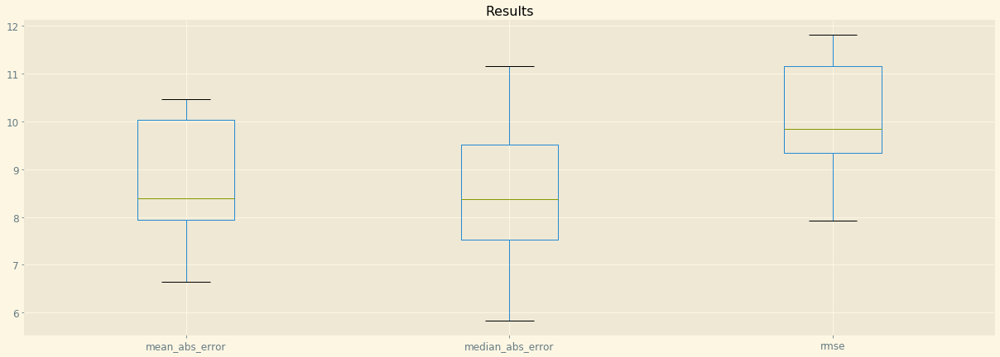

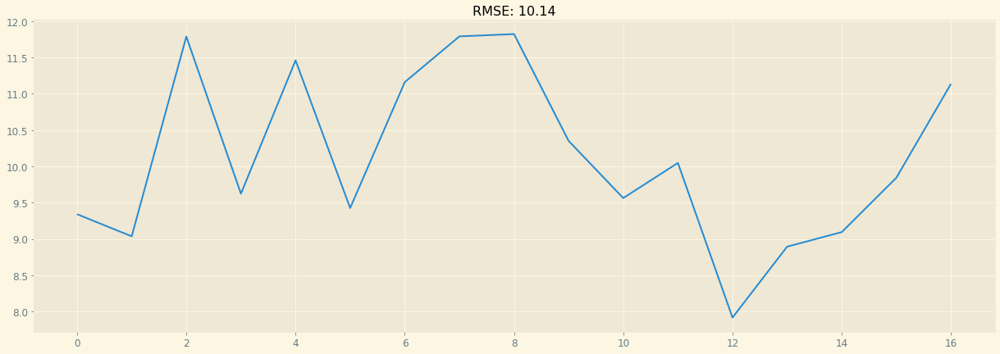

NameError: name 'plot_importance' is not defined

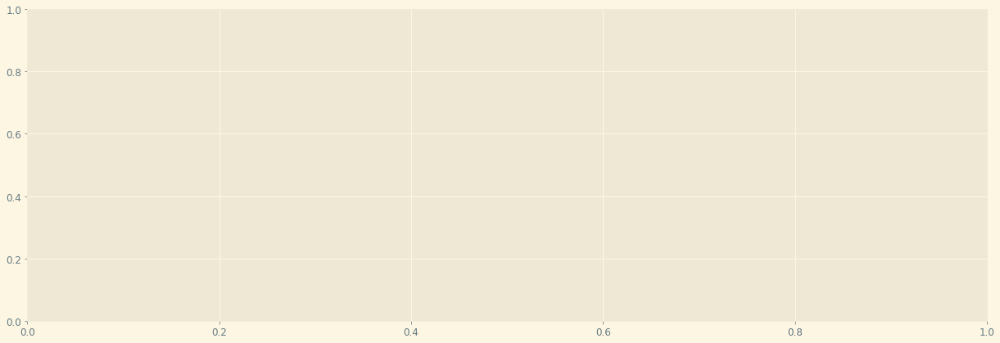

In [5]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_08 = pd.DataFrame(results_over_time)
predictions_over_time_08 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_08

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

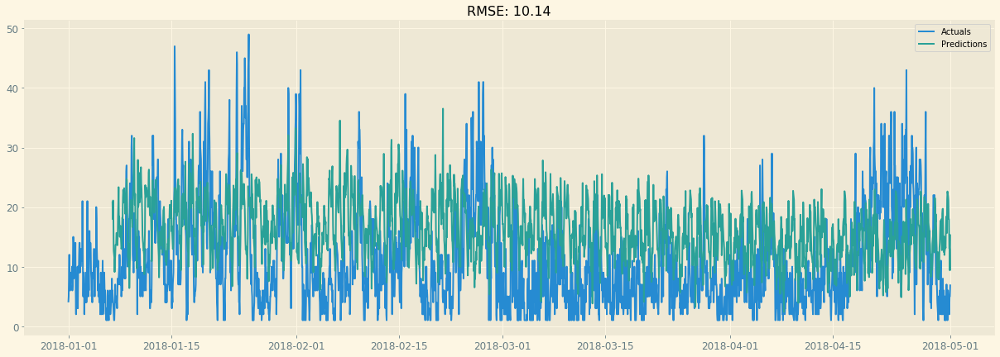

In [6]:
plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_08, results_over_time_08)

### Station nr 28079018  - San Isidro/Calle Farolillo

In [4]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079018

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079018

Missing values for particle and station of interest: 1.93%

One particle, one station DF shape: (54416, 9)


,PM10,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,54.0,1,1,1,52,6,0,2012,1
2012-01-01 03:00:00,43.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,29.0,1,1,1,52,6,4,2012,1
2012-01-01 05:00:00,18.0,1,1,1,52,6,5,2012,1
2012-01-01 06:00:00,26.0,1,1,1,52,6,6,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.811, BIC=2703.211, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.118, BIC=2695.584, Time=0.064 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.887, BIC=2692.087, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.218, BIC=2692.418, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2955.996, BIC=2959.729, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.915, BIC=2698.582, Time=0.370 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.110, BIC=2698.044, Time=0.092 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.509, BIC=2693.443, Time=0.326 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.063, BIC=2698.730, Time=0.442 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.417, BIC=2537.325, Time=0.277 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2524.169, BIC=2542.803, Time=0.344 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2529.883, BIC=2544.790, Time=0.077 seconds
Total fit time: 1.786 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.057, BIC=2652.379, Time=0.198 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.021, BIC=2809.461, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.502, BIC=2747.663, Time=0.045 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.541, BIC=2640.702, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2800.021, BIC=2803.741, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.275, BIC=2642.156, Time=0.323 seconds
Near non-invertible roots for order (1, 1, 1

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.213, BIC=2862.831, Time=0.308 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.020, BIC=2874.085, Time=0.397 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2845.563, BIC=2871.628, Time=0.739 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2843.146, BIC=2858.041, Time=0.318 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.762, BIC=2684.162, Time=0.479 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.968, BIC=2684.435, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.747, BIC=2683.947, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.327, BIC=2685.527, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2978.179, BIC=2981.913, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.593, BIC=2679.260, Time=0.368 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.163, BIC=2684.097, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.727, BIC=2674.660, Time=0.314 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.607, BIC=2679.274, Time=0.740 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2666.129, BIC=2681.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2320.021, BIC=2338.687, Time=0.493 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2327.613, BIC=2342.547, Time=0.151 seconds
Total fit time: 2.702 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2305.766, BIC=2328.147, Time=0.213 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2434.329, BIC=2441.790, Time=0.030 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2381.811, BIC=2393.002, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2304.447, BIC=2315.637, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2432.331, BIC=2436.061, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2304.592, BIC=2319.512, Time=0.199 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2304.078, BIC=2318.999, Time=0.154 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2469.716, BIC=2488.234, Time=0.205 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.792, BIC=2482.607, Time=0.229 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2469.684, BIC=2488.203, Time=0.205 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2467.925, BIC=2482.740, Time=0.200 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2469.451, BIC=2491.673, Time=0.488 seconds
Total fit time: 1.929 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2465.601, BIC=2487.883, Time=0.353 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2612.221, BIC=2619.648, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2557.271, BIC=2568.412, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2463.720, BIC=2474.861, Time=0.093 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.710, BIC=2756.344, Time=0.282 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.233, BIC=2763.140, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.113, BIC=2751.020, Time=0.217 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.767, BIC=2756.402, Time=0.338 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2742.189, BIC=2757.096, Time=0.143 seconds
Total fit time: 1.956 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.061, BIC=2696.442, Time=0.496 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.147, BIC=2695.607, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.426, BIC=2689.617, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.040, BIC=2691.230, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2283.402, BIC=2313.294, Time=0.745 seconds
Total fit time: 3.694 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2316.120, BIC=2338.540, Time=0.543 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2329.492, BIC=2336.965, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2324.865, BIC=2336.075, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2325.144, BIC=2336.354, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2651.540, BIC=2655.277, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2315.128, BIC=2333.811, Time=0.350 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2327.065, BIC=2342.012, Time=0.137 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2313.396, BIC=2328.342, Time=0.270 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.769, BIC=2636.677, Time=0.359 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.757, BIC=2642.392, Time=0.441 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.493, BIC=2645.401, Time=0.097 seconds
Total fit time: 2.297 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.789, BIC=2619.170, Time=0.372 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.955, BIC=2797.415, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.097, BIC=2705.288, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.618, BIC=2604.808, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2787.956, BIC=2791.686, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.961, BIC=2608.882, Time=0.101 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.808, BIC=2874.017, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3152.631, BIC=3156.368, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.208, BIC=2868.891, Time=0.324 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.802, BIC=2872.749, Time=0.189 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2848.297, BIC=2863.244, Time=0.256 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2850.210, BIC=2868.893, Time=0.279 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.776, BIC=2867.722, Time=0.137 seconds
Total fit time: 1.831 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.349, BIC=2865.768, Time=0.491 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.831, BIC=2868.304, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.181, BIC=2638.115, Time=0.279 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2621.590, BIC=2643.990, Time=0.360 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2630.375, BIC=2649.042, Time=0.204 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.010, BIC=2639.677, Time=0.276 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2622.897, BIC=2649.030, Time=0.656 seconds
Total fit time: 2.811 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.632, BIC=2553.032, Time=0.329 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.129, BIC=2550.596, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.748, BIC=2554.948, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.080, BIC=2555.280, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.190, BIC=2786.792, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.723, BIC=2780.604, Time=0.234 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.622, BIC=2786.223, Time=0.396 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.051, BIC=2781.932, Time=0.145 seconds
Total fit time: 1.584 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.743, BIC=2773.084, Time=0.221 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.008, BIC=2776.455, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.317, BIC=2768.487, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.018, BIC=2772.189, Time=0.159 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3047.337, BIC=3051.061, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.910, BIC=2710.330, Time=0.407 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.517, BIC=2707.990, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.634, BIC=2708.844, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.783, BIC=2709.993, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2971.060, BIC=2974.797, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.323, BIC=2709.005, Time=0.366 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.309, BIC=2708.992, Time=0.306 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.874, BIC=2716.031, Time=0.421 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2689.865, BIC=2716.021, Time=0.499 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.296, BIC=2704.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2608.812, BIC=2634.946, Time=0.480 seconds
Total fit time: 2.776 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.224, BIC=2684.625, Time=0.487 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.459, BIC=2674.926, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2668.655, BIC=2679.855, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.766, BIC=2679.966, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2905.780, BIC=2909.513, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.735, BIC=2674.401, Time=0.341 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.078, BIC=2684.011, Time=0.130 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.580, BIC=2673.513, Time=0.316 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.199, BIC=2630.882, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.701, BIC=2638.648, Time=0.092 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.645, BIC=2628.591, Time=0.259 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2612.680, BIC=2635.099, Time=0.387 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2622.808, BIC=2641.491, Time=0.179 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.648, BIC=2631.331, Time=0.317 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2616.123, BIC=2642.279, Time=0.598 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.910 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.440, BIC=2679.860, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.363, BIC=2586.724, Time=0.508 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.665, BIC=2725.119, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2632.923, BIC=2644.104, Time=0.088 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.876, BIC=2580.057, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2715.665, BIC=2719.392, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.501, BIC=2581.136, Time=0.445 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.873, BIC=2582.508, Time=0.403 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2903.567, BIC=2907.304, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2588.314, BIC=2606.997, Time=0.329 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.580, BIC=2601.526, Time=0.177 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2588.280, BIC=2606.963, Time=0.226 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2588.495, BIC=2603.442, Time=0.223 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2590.315, BIC=2612.734, Time=0.215 seconds
Total fit time: 1.655 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.755, BIC=2701.175, Time=0.614 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2681.942, BIC=2689.415, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.050, BIC=2687.259, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.217, BIC=2541.637, Time=0.396 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2521.992, BIC=2551.884, Time=0.740 seconds
Total fit time: 4.706 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2414.045, BIC=2436.464, Time=0.676 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2424.799, BIC=2432.272, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2418.560, BIC=2429.770, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2419.379, BIC=2430.588, Time=0.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2765.848, BIC=2769.584, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2413.041, BIC=2431.724, Time=0.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2420.753, BIC=2435.699, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2386.345, BIC=2405.011, Time=0.345 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2394.104, BIC=2409.037, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2387.563, BIC=2402.496, Time=0.304 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2386.479, BIC=2408.879, Time=30.261 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2393.009, BIC=2411.676, Time=0.484 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2387.008, BIC=2405.675, Time=1.063 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2388.813, BIC=2414.947, Time=1.112 seconds
Total fit time: 34.328 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2461.253, BIC=2483.672, Time=0.500 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2477.338, BIC=2484.811, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.645, BIC=2533.344, Time=0.345 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.450, BIC=2531.409, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.205, BIC=2529.165, Time=0.167 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.275, BIC=2533.974, Time=0.256 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2513.806, BIC=2528.766, Time=0.093 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.729, BIC=2533.428, Time=0.117 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.119, BIC=2533.558, Time=0.405 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.783, BIC=2542.961, Time=0.288 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.942, BIC=2538.120, Time=0.616 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.785, BIC=2537.224, Time=0.142 seconds
Fit ARIMA: (4, 0, 2)

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2572.002, BIC=2594.402, Time=0.556 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2568.619, BIC=2598.485, Time=0.801 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 5.159 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.450, BIC=2688.850, Time=0.699 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.260, BIC=2681.727, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.836, BIC=2681.036, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.986, BIC=2681.186, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3017.268, BIC=3021.001, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.379, BIC=2686.045, Tim

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2423.651, BIC=2442.317, Time=0.452 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2422.296, BIC=2448.430, Time=0.664 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2420.296, BIC=2442.696, Time=0.486 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2423.483, BIC=2442.149, Time=0.197 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2422.296, BIC=2448.429, Time=0.597 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2428.248, BIC=2443.181, Time=0.142 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2423.939, BIC=2446.339, Time=0.241 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2423.508, BIC=2453.375, Time=0.748 seconds
Total fit time: 4.588 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2353.068, BIC=2375.449, Time=0.537 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2762.947, BIC=2766.678, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2374.895, BIC=2393.546, Time=0.332 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2382.618, BIC=2397.539, Time=0.145 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2372.956, BIC=2387.877, Time=0.266 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2374.899, BIC=2393.549, Time=0.324 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2380.140, BIC=2395.060, Time=0.144 seconds
Total fit time: 2.028 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2391.651, BIC=2414.051, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2407.821, BIC=2415.288, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2401.532, BIC=2412.732, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2557.333, BIC=2572.253, Time=0.327 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2560.482, BIC=2582.863, Time=0.605 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2556.484, BIC=2578.865, Time=0.511 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2558.729, BIC=2588.570, Time=0.802 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.935, BIC=2706.618, Time=0.422 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.779, BIC=2706.462, Time=0.435 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.048, BIC=2705.994, Time=0.100 seconds
Total fit time: 2.167 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.290, BIC=2648.691, Time=0.486 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2634.038, BIC=2641.505, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.482, BIC=2638.683, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.707, BIC=2638.907, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2892.266, BIC=2895.999, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.673, BIC=2644.339, Time=0.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.963, BIC=2649.857, Time=0.304 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.861, BIC=2652.479, Time=0.394 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.354 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.766, BIC=2716.029, Time=0.589 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.746, BIC=2874.167, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.492, BIC=2819.623, Time=0.093 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.173, BIC=2705.304, Time=0.163 seconds
Near non-invertible roo

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.741, BIC=2678.662, Time=0.205 seconds
Total fit time: 0.643 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.202, BIC=2679.602, Time=0.251 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.286, BIC=2658.753, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.808, BIC=2663.008, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.688, BIC=2662.888, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2899.984, BIC=2903.717, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.212, BIC=2668.145, Time=0.207 seconds
Total fit time: 0.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.809, BIC=2741.228, Time=0.293 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.025, BIC=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2456.464, BIC=2475.147, Time=0.353 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2461.547, BIC=2476.493, Time=0.136 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.223, BIC=2470.169, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.675, BIC=2475.358, Time=0.377 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2460.528, BIC=2475.474, Time=0.107 seconds
Total fit time: 1.869 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2377.998, BIC=2400.418, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2398.204, BIC=2405.677, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2383.944, BIC=2395.153, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2385.951, BIC=2397.160, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2582.001, BIC=2607.997, Time=0.633 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2580.146, BIC=2602.428, Time=0.429 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2581.902, BIC=2600.470, Time=0.129 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.723, BIC=2608.719, Time=0.257 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.149, BIC=2607.004, Time=0.091 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2580.723, BIC=2603.006, Time=0.154 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.839, BIC=2613.549, Time=0.720 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.017 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.485, BIC=2621.728, Time

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2487.543, BIC=2502.489, Time=0.080 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.329, BIC=2499.275, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.138, BIC=2504.820, Time=0.344 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2486.086, BIC=2504.769, Time=0.352 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2488.762, BIC=2503.708, Time=0.132 seconds
Total fit time: 1.839 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2500.425, BIC=2522.825, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2502.804, BIC=2510.271, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2497.699, BIC=2508.899, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.307, BIC=2509.508, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.672, BIC=2503.091, Time=0.521 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2490.111, BIC=2497.585, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2483.630, BIC=2494.839, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.712, BIC=2494.921, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2777.838, BIC=2781.575, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.191, BIC=2497.874, Time=0.269 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2485.709, BIC=2500.656, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.192, BIC=2492.138, Time=0.238 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.191, BIC=2497.874, Time=0.399 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.530, BIC=2500.476, Time=0.093 seconds
Total fit time: 1.8

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.873, BIC=2663.508, Time=0.450 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.954, BIC=2669.861, Time=0.142 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.424, BIC=2658.331, Time=0.334 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.991, BIC=2663.625, Time=0.453 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.024, BIC=2668.932, Time=0.089 seconds
Total fit time: 2.208 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.987, BIC=2641.309, Time=0.608 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2622.741, BIC=2630.181, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2622.887, BIC=2634.048, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.080, BIC=2634.241, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.473, BIC=2596.406, Time=0.316 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2583.382, BIC=2602.049, Time=0.392 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.354, BIC=2602.020, Time=0.431 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2584.271, BIC=2599.204, Time=0.160 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2584.117, BIC=2599.051, Time=0.112 seconds
Total fit time: 2.134 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.642, BIC=2633.062, Time=0.568 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2609.171, BIC=2616.644, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2609.689, BIC=2620.899, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2609.855, BIC=2621.065, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.960, BIC=2754.643, Time=0.277 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.762, BIC=2761.709, Time=0.126 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.541, BIC=2756.487, Time=0.268 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2737.950, BIC=2760.370, Time=0.413 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2744.497, BIC=2763.180, Time=0.193 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.258, BIC=2754.941, Time=0.263 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2737.229, BIC=2763.385, Time=0.444 seconds
Total fit time: 2.616 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.440, BIC=2798.860, Time=0.393 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.632, BIC=2801.105, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.700, BIC=2498.399, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2486.314, BIC=2501.273, Time=0.105 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.393, BIC=2494.353, Time=0.297 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.794, BIC=2498.493, Time=0.363 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2484.945, BIC=2499.904, Time=0.065 seconds
Total fit time: 1.764 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.431, BIC=2530.869, Time=0.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2529.030, BIC=2536.509, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2524.578, BIC=2535.798, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2526.321, BIC=2537.541, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2840.007, BIC=2866.118, Time=0.645 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 3.241 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.791, BIC=2822.172, Time=0.591 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2804.013, BIC=2811.473, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2805.200, BIC=2816.390, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.286, BIC=2816.476, Time=0.071 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3019.063, BIC=3022.793, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2797.265, BIC=2815.916, Time=0.384 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.483, BIC=2821.404, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.176, BIC=2888.794, Time=0.361 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.147, BIC=2888.765, Time=0.361 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.583, BIC=2897.648, Time=0.559 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2871.577, BIC=2897.642, Time=0.630 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.504, BIC=2883.399, Time=0.260 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.777, BIC=2890.671, Time=0.154 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.660, BIC=2887.554, Time=0.236 seconds
Total fit time: 3.245 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2876.048, BIC=2898.468, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2903.100, BIC=2910.573, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.756, BIC=2709.455, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.869, BIC=2714.828, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.481, BIC=2705.440, Time=0.260 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.175, BIC=2709.874, Time=0.344 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.178, BIC=2714.137, Time=0.139 seconds
Total fit time: 1.994 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.940, BIC=2647.378, Time=0.589 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.217, BIC=2637.697, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.631, BIC=2641.850, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.850, BIC=2642.069, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.026, BIC=2677.348, Time=0.500 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.237, BIC=2667.677, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.058, BIC=2667.219, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.822, BIC=2667.983, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3029.982, BIC=3033.702, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.374, BIC=2672.976, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.398, BIC=2672.279, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.471, BIC=2667.352, Time=0.331 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.381, BIC=2672.982, Time=0.539 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.539, BIC=2671.

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2567.192, BIC=2589.592, Time=0.612 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2568.564, BIC=2598.431, Time=0.806 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.792 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.834, BIC=2608.235, Time=0.564 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.753, BIC=2777.219, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.598, BIC=2675.798, Time=0.075 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2588.584, BIC=2599.784, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3142.382, BIC=3146.121, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.844, BIC=2840.543, Time=0.317 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.644, BIC=2847.603, Time=0.108 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.877, BIC=2834.837, Time=0.296 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2821.853, BIC=2840.552, Time=0.346 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2830.395, BIC=2845.355, Time=0.047 seconds
Total fit time: 1.965 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.521, BIC=2777.959, Time=0.581 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.739, BIC=2779.218, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2763.194, BIC=2774.413, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2312.925, BIC=2335.364, Time=0.509 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2336.875, BIC=2344.355, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2322.046, BIC=2333.265, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2324.144, BIC=2335.364, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2652.047, BIC=2655.787, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2313.617, BIC=2332.316, Time=0.334 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2313.742, BIC=2332.441, Time=0.375 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2314.726, BIC=2340.905, Time=0.631 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2,

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2410.374, BIC=2432.813, Time=0.506 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2418.045, BIC=2425.524, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2416.827, BIC=2428.046, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2417.155, BIC=2428.374, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2813.013, BIC=2816.753, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2413.111, BIC=2431.809, Time=0.504 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2413.114, BIC=2431.813, Time=0.477 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2412.059, BIC=2438.238, Time=0.623 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2,

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.820, BIC=2471.519, Time=0.358 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2452.674, BIC=2478.853, Time=0.560 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2452.696, BIC=2478.874, Time=0.733 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2451.207, BIC=2466.166, Time=0.246 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2454.538, BIC=2476.977, Time=0.545 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.611, BIC=2478.050, Time=0.175 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2453.650, BIC=2483.569, Time=0.531 seconds
Total fit time: 4.134 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2477.519, BIC=2499.977, Time=0.374 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2499.958, BIC=2507.444, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.536, BIC=2714.975, Time=0.584 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.312, BIC=2706.792, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.266, BIC=2704.485, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.827, BIC=2705.046, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3018.155, BIC=3021.895, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.461, BIC=2710.160, Time=0.404 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.388, BIC=2710.348, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.967, BIC=2704.926, Time=0.349 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.546, BIC=2710.245, Time=0.474 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.876, BIC=2709.835, Time=0.145 seconds
Total fit time: 2.3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.208, BIC=2534.890, Time=0.290 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.130, BIC=2532.076, Time=0.094 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.397, BIC=2533.343, Time=0.137 seconds
Total fit time: 1.812 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2323.402, BIC=2345.841, Time=0.464 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2330.464, BIC=2337.944, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2326.331, BIC=2337.550, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2326.547, BIC=2337.766, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2638.428, BIC=2642.168, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2325.318, BIC=2344.017, Time=0.397 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.000, BIC=2502.400, Time=0.236 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.183, BIC=2657.650, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2570.061, BIC=2581.262, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2474.814, BIC=2486.014, Time=0.244 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2648.187, BIC=2651.920, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2476.706, BIC=2491.639, Time=0.139 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.704, BIC=2491.638, Time=0.126 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.068, BIC=2496.735, Time=0.182 seconds
Total fit time: 1.028 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2445.996, BIC=2468.396, Time=0.177 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2635.632, BIC=2650.566, Time=0.096 seconds
Total fit time: 0.624 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.158, BIC=2627.558, Time=0.381 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2598.463, BIC=2605.929, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2599.794, BIC=2610.994, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.747, BIC=2610.947, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2917.159, BIC=2920.892, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2601.212, BIC=2616.145, Time=0.211 seconds
Total fit time: 0.781 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.494, BIC=2662.894, Time=0.591 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.654, BIC=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.393, BIC=2511.340, Time=0.096 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.430, BIC=2508.377, Time=0.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.270, BIC=2513.952, Time=0.292 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.237, BIC=2513.920, Time=0.325 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.918, BIC=2511.864, Time=0.141 seconds
Total fit time: 1.877 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2483.965, BIC=2506.385, Time=0.627 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2481.062, BIC=2488.535, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2481.695, BIC=2492.904, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2481.676, BIC=2492.886, Time=0.061 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.283, BIC=2736.414, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2979.011, BIC=2982.722, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.391, BIC=2742.232, Time=0.111 seconds
Total fit time: 0.725 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.230, BIC=2695.432, Time=0.376 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2666.579, BIC=2673.980, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2668.522, BIC=2679.623, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.517, BIC=2679.618, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2908.175, BIC=2911.875, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.538, BIC=2685.340, Time=0.118 seconds
Total fit time: 0.697 seconds
Performing st

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.607, BIC=2750.553, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.606, BIC=2756.289, Time=0.391 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.606, BIC=2756.289, Time=0.443 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.513, BIC=2753.459, Time=0.116 seconds
Total fit time: 2.270 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.309, BIC=2785.748, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2764.069, BIC=2771.548, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.874, BIC=2774.094, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.309, BIC=2774.528, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3094.454, BIC=3098.194, Time=0.008 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2320.670, BIC=2339.353, Time=0.443 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2335.862, BIC=2350.808, Time=0.146 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2320.277, BIC=2335.224, Time=0.280 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2321.071, BIC=2339.753, Time=0.350 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2331.258, BIC=2346.205, Time=0.101 seconds
Total fit time: 1.857 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2283.537, BIC=2305.956, Time=0.522 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2302.417, BIC=2309.890, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2291.950, BIC=2303.160, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2293.424, BIC=2304.634, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2602.316, BIC=2624.579, Time=0.160 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.982, BIC=2633.666, Time=0.676 seconds
Total fit time: 3.860 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.543, BIC=2629.766, Time=0.464 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2617.792, BIC=2625.200, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2612.258, BIC=2623.370, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.384, BIC=2624.495, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2937.991, BIC=2941.695, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.291, BIC=2623.810, Time=0.324 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.916, BIC=2628.731, Time=0.140 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.278, BIC=2657.211, Time=0.096 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2642.238, BIC=2657.171, Time=0.102 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.218, BIC=2662.885, Time=0.157 seconds
Total fit time: 1.095 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.275, BIC=2775.675, Time=0.455 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.993, BIC=2762.459, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2749.013, BIC=2760.213, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.346, BIC=2760.546, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3066.615, BIC=3070.349, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.870, BIC=2765.803, Time=0.056 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.222, BIC=2459.910, Time=0.902 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2423.680, BIC=2457.367, Time=0.763 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2420.701, BIC=2450.645, Time=0.715 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2424.225, BIC=2454.169, Time=0.514 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2428.243, BIC=2465.674, Time=0.923 seconds
Total fit time: 7.111 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2395.128, BIC=2417.586, Time=0.540 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2414.646, BIC=2422.132, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2403.759, BIC=2414.988, Time=0.050 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2404.377, BIC=2415.606, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2712.981, BIC=2735.342, Time=0.545 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.288, BIC=2725.742, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2716.511, BIC=2727.692, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.708, BIC=2727.889, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3045.360, BIC=3049.086, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.916, BIC=2730.550, Time=0.469 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.513, BIC=2733.420, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.963, BIC=2724.871, Time=0.354 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.933, BIC=2730.567, Time=0.457 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.286, BIC=2733.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.256, BIC=2634.955, Time=0.522 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.039, BIC=2634.738, Time=0.517 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.358, BIC=2633.317, Time=0.291 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2617.722, BIC=2632.682, Time=0.052 seconds
Total fit time: 2.418 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.740, BIC=2727.160, Time=0.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.373, BIC=2724.846, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2715.564, BIC=2726.773, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.617, BIC=2727.827, Time=0.069 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3015.416, BIC=3019.153, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.042, BIC=2802.741, Time=0.293 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.446, BIC=2815.405, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.987, BIC=2806.946, Time=0.323 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.961, BIC=2806.400, Time=0.354 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2798.590, BIC=2817.289, Time=0.137 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.220, BIC=2810.399, Time=0.450 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2782.297, BIC=2808.476, Time=0.565 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2784.019, BIC=2806.458, Time=0.275 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2774.063, BIC=2803.981, Time=0.558 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2775.429, BIC=2809.087, Time=0.517 seconds
Fit ARIMA: (2, 0, 5)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.374, BIC=2532.089, Time=0.279 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.705, BIC=2542.677, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.972, BIC=2528.944, Time=0.274 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.311, BIC=2537.769, Time=0.462 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2524.385, BIC=2543.100, Time=0.183 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.503, BIC=2532.218, Time=0.281 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2516.656, BIC=2542.857, Time=0.613 seconds
Total fit time: 2.954 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.291, BIC=2682.729, Time=0.301 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.103, BIC=2836.583, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2804.960, BIC=2819.893, Time=0.319 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.607, BIC=2824.273, Time=0.407 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.150, BIC=2829.084, Time=0.097 seconds
Total fit time: 2.140 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.631, BIC=2788.050, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.040, BIC=2776.513, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.030, BIC=2779.240, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.209, BIC=2779.418, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2971.840, BIC=2975.577, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.790, BIC=2782.473, Time=0.355 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.749, BIC=2907.187, Time=0.485 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2911.525, BIC=2919.005, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2897.919, BIC=2909.138, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2901.843, BIC=2913.062, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3184.644, BIC=3188.383, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.215, BIC=2902.914, Time=0.289 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.964, BIC=2911.923, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.728, BIC=2897.687, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2884.268, BIC=2902.967, Time=0.287 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.936, BIC=2905.896, Time=0.095 seconds
Total fit time: 1.7

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.510, BIC=2654.968, Time=0.547 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.661, BIC=2645.147, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.069, BIC=2649.298, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.289, BIC=2649.518, Time=0.068 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2832.914, BIC=2836.657, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.093, BIC=2647.808, Time=0.291 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.734, BIC=2653.706, Time=0.137 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.236, BIC=2644.208, Time=0.294 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2628.533, BIC=2650.991, Time=0.339 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2637.021, BIC=2655.736, Time=0.200 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.391, BIC=2681.009, Time=0.435 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.308, BIC=2680.202, Time=0.154 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.513, BIC=2675.407, Time=0.286 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.406, BIC=2681.024, Time=0.452 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.495, BIC=2679.389, Time=0.093 seconds
Total fit time: 2.169 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.071, BIC=2687.471, Time=0.517 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.698, BIC=2677.165, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2663.903, BIC=2675.103, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.422, BIC=2675.622, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.243, BIC=2615.663, Time=0.618 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.926, BIC=2785.399, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.211, BIC=2683.420, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.052, BIC=2607.261, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2775.926, BIC=2779.663, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.355, BIC=2618.038, Time=0.210 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.587, BIC=2610.269, Time=0.478 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.509, BIC=2621.665, Time=0.636 seconds
Near non-inver

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.301, BIC=2843.273, Time=0.298 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.269, BIC=2848.984, Time=0.360 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.717, BIC=2853.689, Time=0.050 seconds
Total fit time: 1.908 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.068, BIC=2788.526, Time=0.713 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.318, BIC=2788.804, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2772.994, BIC=2784.223, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2774.436, BIC=2785.665, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3076.843, BIC=3080.586, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.798, BIC=2783.513, Time=0.379 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2320.871, BIC=2339.586, Time=0.401 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2321.809, BIC=2348.010, Time=0.615 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2321.746, BIC=2347.947, Time=0.603 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2319.402, BIC=2334.374, Time=0.243 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2331.576, BIC=2346.548, Time=0.138 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2329.538, BIC=2344.510, Time=0.149 seconds
Total fit time: 3.168 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2421.945, BIC=2440.660, Time=0.515 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2421.832, BIC=2448.033, Time=0.783 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2422.380, BIC=2448.581, Time=0.694 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2419.927, BIC=2434.899, Time=0.416 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.736, BIC=2441.708, Time=0.145 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2425.890, BIC=2440.862, Time=0.147 seconds
Total fit time: 3.983 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2484.523, BIC=2507.000, Time=0.331 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.997, BIC=2514.489, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.221, BIC=2507.460, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.582, BIC=2508.821, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2819.697, BIC=2823.443, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.004, BIC=2513.735, Time=0.341 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.072, BIC=2513.803, Time=0.372 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2485.611, BIC=2511.834, Time=0.252 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2485.802, BIC=2512.026, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.398, BIC=2508.383, Time=0.211 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.385, BIC=2718.100, Time=0.407 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.507, BIC=2718.479, Time=0.146 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.901, BIC=2712.873, Time=0.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.473, BIC=2718.188, Time=0.457 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.978, BIC=2717.950, Time=0.147 seconds
Total fit time: 2.276 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.359, BIC=2616.778, Time=0.565 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2599.154, BIC=2606.627, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2596.386, BIC=2607.595, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.670, BIC=2607.879, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2332.308, BIC=2351.023, Time=0.381 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2332.348, BIC=2351.063, Time=0.406 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2331.642, BIC=2357.843, Time=0.551 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2331.499, BIC=2357.700, Time=0.462 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2330.477, BIC=2345.449, Time=0.333 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2330.251, BIC=2352.709, Time=0.388 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2334.950, BIC=2353.665, Time=0.191 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2331.944, BIC=2358.145, Time=0.528 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2335.672, BIC=2350.644, Time=0.130 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2336.833, BIC=2359.291, Time=0.235 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2485.196, BIC=2503.879, Time=0.165 seconds
Total fit time: 0.818 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.154, BIC=2475.573, Time=0.256 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2608.152, BIC=2615.626, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2544.952, BIC=2556.161, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.002, BIC=2467.212, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2606.153, BIC=2609.889, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.384, BIC=2470.067, Time=0.153 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.846, BIC=2469.792, Time=0.135 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.783, BIC=2469.729, Time=0.174 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.380, BIC=2658.326, Time=0.098 seconds
Total fit time: 0.673 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.629, BIC=2635.049, Time=0.417 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2605.944, BIC=2613.417, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2607.249, BIC=2618.459, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.201, BIC=2618.411, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2925.987, BIC=2929.723, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2608.691, BIC=2623.638, Time=0.223 seconds
Total fit time: 0.824 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.063, BIC=2670.483, Time=0.563 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.331, BIC=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2502.254, BIC=2520.953, Time=0.324 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2503.960, BIC=2518.919, Time=0.144 seconds
Total fit time: 1.879 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.942, BIC=2513.381, Time=0.510 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2488.077, BIC=2495.556, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2488.702, BIC=2499.921, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2488.684, BIC=2499.904, Time=0.065 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2701.353, BIC=2705.093, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2488.102, BIC=2503.061, Time=0.320 seconds
Total fit time: 0.982 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2469.218, BIC=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.137, BIC=2703.360, Time=0.393 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.486, BIC=2681.894, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.428, BIC=2687.540, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.423, BIC=2687.534, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2917.391, BIC=2921.095, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.445, BIC=2693.260, Time=0.112 seconds
Total fit time: 0.700 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.381, BIC=2786.723, Time=0.565 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2764.192, BIC=2771.639, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.090, BIC=2777.261, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.119, BIC=2794.577, Time=0.672 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2772.608, BIC=2780.094, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.566, BIC=2782.795, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.974, BIC=2783.203, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3105.058, BIC=3108.801, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.689, BIC=2786.661, Time=0.102 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.237, BIC=2783.209, Time=0.341 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.188, BIC=2788.903, Time=0.484 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.186, BIC=2788.901, Time=0.464 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.372, BIC=2787.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2327.830, BIC=2346.529, Time=0.281 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2337.891, BIC=2352.850, Time=0.088 seconds
Total fit time: 1.604 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2290.119, BIC=2312.558, Time=0.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2308.850, BIC=2316.329, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2298.361, BIC=2309.581, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2299.834, BIC=2311.053, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2639.337, BIC=2643.077, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2289.014, BIC=2307.713, Time=0.302 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2301.127, BIC=2316.087, Time=0.136 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.087, BIC=2641.797, Time=0.651 seconds
Total fit time: 3.980 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2615.220, BIC=2637.463, Time=0.570 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.505, BIC=2632.919, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.945, BIC=2631.067, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.074, BIC=2632.196, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2947.477, BIC=2951.184, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.991, BIC=2631.526, Time=0.297 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.602, BIC=2636.431, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.232, BIC=2626.060, Time=0.298 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.801, BIC=2665.747, Time=0.099 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.773, BIC=2665.719, Time=0.102 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.759, BIC=2671.442, Time=0.156 seconds
Total fit time: 1.027 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.078, BIC=2784.498, Time=0.396 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2763.524, BIC=2770.997, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.700, BIC=2768.910, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.012, BIC=2769.221, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3077.162, BIC=3080.899, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.572, BIC=2774.518, Time=0.060 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2433.322, BIC=2467.038, Time=0.712 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2431.218, BIC=2464.934, Time=0.752 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2432.627, BIC=2462.596, Time=0.733 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2431.322, BIC=2461.292, Time=0.517 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2435.300, BIC=2472.762, Time=0.963 seconds
Total fit time: 7.090 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2401.818, BIC=2424.295, Time=0.527 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2421.383, BIC=2428.875, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2410.458, BIC=2421.697, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.215, BIC=2645.122, Time=0.365 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.462, BIC=2650.096, Time=0.431 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.855, BIC=2653.762, Time=0.088 seconds
Total fit time: 2.227 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.155, BIC=2743.536, Time=0.563 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.291, BIC=2733.751, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.482, BIC=2735.672, Time=0.034 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.675, BIC=2735.865, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3055.369, BIC=3059.099, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.063, BIC=2738.713, Time=0.431 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.845, BIC=2638.817, Time=0.383 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2625.160, BIC=2643.875, Time=0.423 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.977, BIC=2643.692, Time=0.339 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.934, BIC=2641.906, Time=0.138 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2626.355, BIC=2641.327, Time=0.053 seconds
Total fit time: 2.112 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.066, BIC=2737.505, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.599, BIC=2734.079, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.947, BIC=2736.166, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.946, BIC=2737.165, Time=0.062 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.154, BIC=2811.869, Time=0.310 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.161, BIC=2824.134, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.861, BIC=2815.833, Time=0.295 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2793.080, BIC=2815.538, Time=0.346 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.383, BIC=2826.098, Time=0.144 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2793.500, BIC=2819.701, Time=0.417 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2791.358, BIC=2817.559, Time=0.583 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2792.973, BIC=2815.431, Time=0.284 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2783.486, BIC=2813.430, Time=0.531 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2784.834, BIC=2818.521, Time=0.739 seconds
Fit ARIMA: (2, 0, 5)

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.373, BIC=2538.358, Time=0.242 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2524.945, BIC=2547.422, Time=0.413 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2533.270, BIC=2552.001, Time=0.202 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.097, BIC=2541.828, Time=0.237 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2526.273, BIC=2552.497, Time=0.679 seconds
Total fit time: 2.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.785, BIC=2692.243, Time=0.322 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.814, BIC=2845.300, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.464, BIC=2749.693, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.917, BIC=2678.146, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.040, BIC=2827.987, Time=0.317 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2813.694, BIC=2832.377, Time=0.398 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2822.233, BIC=2837.179, Time=0.093 seconds
Total fit time: 2.140 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.628, BIC=2796.066, Time=0.541 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2776.975, BIC=2784.455, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.960, BIC=2787.179, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.139, BIC=2787.358, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2981.044, BIC=2984.784, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2771.745, BIC=2790.444, Time=0.400 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.709, BIC=2916.167, Time=0.566 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.795, BIC=2928.281, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.312, BIC=2918.541, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2911.250, BIC=2922.479, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3193.898, BIC=3197.641, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.031, BIC=2911.746, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.234, BIC=2921.206, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.628, BIC=2906.600, Time=0.240 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.094, BIC=2911.809, Time=0.288 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.007, BIC=2914.979, Time=0.101 seconds
Total fit time: 1.8

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.323, BIC=2662.800, Time=0.574 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.673, BIC=2653.165, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.076, BIC=2657.315, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.300, BIC=2657.539, Time=0.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2841.004, BIC=2844.750, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2636.764, BIC=2655.495, Time=0.271 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.678, BIC=2661.663, Time=0.142 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.999, BIC=2651.984, Time=0.269 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2636.168, BIC=2658.645, Time=0.365 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2644.884, BIC=2663.615, Time=0.188 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2670.901, BIC=2689.535, Time=0.458 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.137, BIC=2689.044, Time=0.138 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.978, BIC=2683.886, Time=0.284 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.906, BIC=2689.540, Time=0.427 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2673.268, BIC=2688.175, Time=0.094 seconds
Total fit time: 2.136 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.032, BIC=2695.451, Time=0.566 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.839, BIC=2685.312, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.098, BIC=2683.308, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.616, BIC=2683.826, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.977, BIC=2625.676, Time=0.221 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.496, BIC=2618.195, Time=0.467 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.003, BIC=2629.182, Time=0.372 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2603.262, BIC=2629.441, Time=0.758 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.681, BIC=2620.640, Time=0.195 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.724, BIC=2792.455, Time=0.391 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.333, BIC=2799.318, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2771.811, BIC=2786.796, Time=0.233 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.745, BIC=2792.476, Time=0.362 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.139, BIC=2797.124, Time=0.100 seconds
Total fit time: 1.943 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.729, BIC=2633.206, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.204, BIC=2638.697, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2620.114, BIC=2631.352, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.532, BIC=2632.770, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2337.387, BIC=2352.372, Time=0.143 seconds
Total fit time: 3.174 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2458.190, BIC=2480.667, Time=0.627 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2459.269, BIC=2466.762, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2459.248, BIC=2470.487, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2459.397, BIC=2470.636, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2717.188, BIC=2720.934, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2457.842, BIC=2476.573, Time=0.403 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2460.957, BIC=2475.941, Time=0.131 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.942, BIC=2470.927, Time=0.280 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2431.998, BIC=2454.456, Time=0.283 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2613.144, BIC=2620.630, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2531.367, BIC=2542.596, Time=0.094 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2428.489, BIC=2439.718, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2611.144, BIC=2614.887, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2430.463, BIC=2445.435, Time=0.140 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2430.460, BIC=2445.432, Time=0.106 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2431.378, BIC=2450.093, Time=0.321 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2493.261, BIC=2519.507, Time=0.241 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.031, BIC=2516.028, Time=0.227 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2493.945, BIC=2516.442, Time=0.419 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.491, BIC=2514.987, Time=0.411 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2494.691, BIC=2524.686, Time=0.722 seconds
Total fit time: 3.662 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.125, BIC=2565.622, Time=0.547 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.658, BIC=2569.157, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2548.308, BIC=2559.556, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.432, BIC=2560.680, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.922, BIC=2547.637, Time=0.420 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.923, BIC=2547.638, Time=0.629 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.633, BIC=2553.834, Time=0.862 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2525.163, BIC=2551.364, Time=0.552 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2526.926, BIC=2541.898, Time=0.350 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2526.001, BIC=2548.459, Time=0.398 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2526.626, BIC=2549.084, Time=0.425 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2531.942, BIC=2561.886, Time=0.805 seconds
Total fit time: 5.127 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.985, BIC=2535.327, Time=0.513 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2380.422, BIC=2399.137, Time=0.255 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2390.414, BIC=2405.386, Time=0.133 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2378.449, BIC=2393.421, Time=0.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2380.427, BIC=2399.142, Time=0.365 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2386.975, BIC=2401.947, Time=0.095 seconds
Total fit time: 1.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2350.951, BIC=2373.389, Time=0.442 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2376.719, BIC=2384.198, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2360.377, BIC=2371.597, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2363.744, BIC=2374.964, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2449.630, BIC=2464.576, Time=0.110 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2447.590, BIC=2470.010, Time=0.324 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2451.271, BIC=2469.954, Time=0.209 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2451.455, BIC=2470.138, Time=0.194 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2447.797, BIC=2473.953, Time=0.749 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 2.471 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2584.413, BIC=2606.852, Time=0.609 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.829, BIC=2774.309, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.662, BIC=2699.881, Time

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.730, BIC=2667.445, Time=0.432 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.303, BIC=2667.275, Time=0.089 seconds
Total fit time: 2.083 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.385, BIC=2851.843, Time=0.311 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2822.310, BIC=2829.796, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.495, BIC=2834.724, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.471, BIC=2834.700, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2973.500, BIC=2977.243, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2825.430, BIC=2840.402, Time=0.176 seconds
Total fit time: 0.688 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.769, BIC=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.479, BIC=2739.801, Time=0.573 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2892.506, BIC=2899.947, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.970, BIC=2845.131, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.952, BIC=2729.113, Time=0.192 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2890.508, BIC=2894.228, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.593, BIC=2734.194, Time=0.367 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.599, BIC=2737.200, Time=0.420 secon

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2940.346, BIC=2962.785, Time=0.320 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.334, BIC=2940.814, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.064, BIC=2946.284, Time=0.028 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2935.037, BIC=2946.256, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3062.064, BIC=3065.803, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2936.406, BIC=2951.365, Time=0.223 seconds
Total fit time: 0.716 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.068, BIC=2901.487, Time=0.313 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2871.638, BIC=2879.111, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2873.402, BIC=2884.611, Time=0.029 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.382, BIC=2572.081, Time=0.337 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.478, BIC=2574.438, Time=0.096 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2551.398, BIC=2566.357, Time=0.254 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.385, BIC=2572.084, Time=0.355 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.236, BIC=2573.195, Time=0.087 seconds
Total fit time: 1.866 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.735, BIC=2564.193, Time=0.535 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2555.714, BIC=2563.200, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2544.126, BIC=2555.355, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.426, BIC=2557.655, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2488.809, BIC=2503.716, Time=0.108 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2488.807, BIC=2503.714, Time=0.092 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.058, BIC=2508.692, Time=0.168 seconds
Total fit time: 0.781 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.983, BIC=2663.344, Time=0.258 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.482, BIC=2800.935, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2729.075, BIC=2740.255, Time=0.070 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.030, BIC=2648.211, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2791.482, BIC=2795.209, Time=0.019 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2634.044, BIC=2648.952, Time=0.400 seconds
Near non-invertible roots for order (1, 1, 1

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2492.258, BIC=2510.893, Time=0.249 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2493.250, BIC=2515.611, Time=0.446 seconds
Total fit time: 1.834 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.556, BIC=2545.994, Time=0.780 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.950, BIC=2696.430, Time=0.021 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.666, BIC=2639.886, Time=0.066 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.259, BIC=2533.478, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2686.950, BIC=2690.690, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.739, BIC=2534.698, Time=0.362 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.053, BIC=2716.025, Time=0.229 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.034, BIC=2721.750, Time=0.372 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.273, BIC=2724.245, Time=0.099 seconds
Total fit time: 1.944 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.513, BIC=2598.952, Time=0.581 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2587.339, BIC=2594.819, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2579.776, BIC=2590.995, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2580.875, BIC=2592.095, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2910.119, BIC=2913.858, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.746, BIC=2593.445, Time=0.369 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2342.684, BIC=2361.430, Time=0.372 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2354.608, BIC=2369.605, Time=0.146 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2340.997, BIC=2355.995, Time=0.306 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2342.804, BIC=2361.551, Time=0.381 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2354.222, BIC=2369.219, Time=0.075 seconds
Total fit time: 2.013 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2384.672, BIC=2407.149, Time=0.302 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2545.497, BIC=2552.989, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2466.029, BIC=2477.267, Time=0.052 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2379.167, BIC=2390.406, Time=0.065 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.585, BIC=2642.557, Time=0.093 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2627.430, BIC=2642.402, Time=0.111 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2627.517, BIC=2646.232, Time=0.276 seconds
Total fit time: 1.072 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2608.601, BIC=2631.040, Time=0.495 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.437, BIC=2800.916, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2710.689, BIC=2721.908, Time=0.112 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.725, BIC=2615.944, Time=0.164 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2791.437, BIC=2795.177, Time=0.028 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.646, BIC=2621.605, Time=0.311 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.521, BIC=2904.017, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2899.274, BIC=2906.773, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.161, BIC=2902.409, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.599, BIC=2904.847, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3184.892, BIC=3188.642, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.154, BIC=2898.901, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.687, BIC=2903.685, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.418, BIC=2893.415, Time=0.255 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2880.153, BIC=2898.900, Time=0.347 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2885.199, BIC=2900.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.094, BIC=2586.333, Time=0.315 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2784.748, BIC=2788.494, Time=0.022 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.230, BIC=2581.961, Time=0.749 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.249, BIC=2581.980, Time=0.775 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.973, BIC=2590.196, Time=1.534 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2563.932, BIC=2590.155, Time=0.458 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2564.105, BIC=2579.090, Time=0.262 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2565.227, BIC=2587.704, Time=0.418 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.248, BIC=2587.725, Time=0.443 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2563.066, BIC=2593.036, Time=0.766 seconds
Near non-invertible

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.403, BIC=2813.559, Time=0.537 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2787.278, BIC=2813.434, Time=0.533 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.723, BIC=2800.669, Time=0.574 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2788.305, BIC=2803.251, Time=0.343 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.587, BIC=2800.533, Time=0.344 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.584, BIC=2806.267, Time=0.317 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.582, BIC=2812.001, Time=0.560 seconds
Total fit time: 4.052 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.501, BIC=2876.940, Time=1.395 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2861.565, BIC=2869.045, Time=0.029 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2722.071, BIC=2748.317, Time=1.456 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.720, BIC=2736.717, Time=0.586 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2724.685, BIC=2747.181, Time=0.881 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.663, BIC=2747.159, Time=0.413 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2723.644, BIC=2753.639, Time=0.524 seconds
Total fit time: 8.015 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.506, BIC=2825.964, Time=0.565 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.161, BIC=2818.647, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.036, BIC=2817.265, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.737, BIC=2817.966, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.526, BIC=2716.511, Time=0.339 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.343, BIC=2705.328, Time=0.767 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.147, BIC=2707.624, Time=1.350 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2695.290, BIC=2714.021, Time=0.715 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2684.892, BIC=2711.115, Time=1.838 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.538, BIC=2715.508, Time=1.814 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2688.732, BIC=2718.702, Time=2.074 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2686.916, BIC=2713.140, Time=1.109 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.936, BIC=2718.159, Time=1.668 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.092, BIC=2710.588, Time=1.214 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.580, BIC=2721.079, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.834, BIC=2718.082, Time=0.145 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.424, BIC=2720.673, Time=0.178 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2951.973, BIC=2955.722, Time=0.021 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.264, BIC=2704.011, Time=0.673 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.436, BIC=2714.433, Time=0.344 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.623, BIC=2701.621, Time=0.568 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2687.247, BIC=2709.744, Time=0.906 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2695.860, BIC=2714.

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.325, BIC=2618.024, Time=1.007 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2602.555, BIC=2628.734, Time=1.635 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2600.380, BIC=2626.559, Time=2.038 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2603.125, BIC=2618.084, Time=0.338 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2599.106, BIC=2621.545, Time=1.590 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.748, BIC=2720.996, Time=0.260 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3017.454, BIC=3021.203, Time=0.022 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.698, BIC=2722.695, Time=0.327 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2709.497, BIC=2728.244, Time=0.456 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.654, BIC=2728.401, Time=0.211 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.553, BIC=2722.550, Time=0.595 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.508, BIC=2728.255, Time=0.784 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.303, BIC=2723.301, Time=0.386 seconds
Total fit time: 3.691 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.138, BIC=2790.635, Time=1.364 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2441.569, BIC=2460.316, Time=1.661 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2449.626, BIC=2464.624, Time=0.397 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2439.575, BIC=2454.573, Time=0.782 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2441.570, BIC=2460.317, Time=0.991 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2448.133, BIC=2463.131, Time=0.302 seconds
Total fit time: 6.144 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2417.491, BIC=2439.987, Time=1.384 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2429.098, BIC=2436.597, Time=0.038 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2422.228, BIC=2433.476, Time=0.176 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2422.842, BIC=2434.091, Time=0.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.128, BIC=2513.859, Time=0.480 seconds
Total fit time: 2.329 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.302, BIC=2516.779, Time=1.218 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2497.574, BIC=2505.066, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.054, BIC=2507.293, Time=0.159 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.067, BIC=2507.305, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2877.265, BIC=2881.011, Time=0.023 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.575, BIC=2512.306, Time=1.031 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2498.053, BIC=2513.038, Time=0.228 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2491.580, BIC=2506.565, Time=0.865 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2440.975, BIC=2459.738, Time=0.716 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2441.131, BIC=2459.894, Time=0.847 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2439.428, BIC=2465.696, Time=1.471 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2439.429, BIC=2465.697, Time=1.199 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2440.236, BIC=2455.247, Time=0.561 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2442.049, BIC=2464.564, Time=1.071 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2442.283, BIC=2464.799, Time=1.293 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2434.938, BIC=2464.959, Time=1.685 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2437.101, BIC=2470.875, Time=2.016 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2436.342, BIC=2470.115, Time=2.299 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.445, BIC=2725.668, Time=1.414 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2699.369, BIC=2725.592, Time=1.615 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.177, BIC=2712.162, Time=0.778 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.470, BIC=2719.455, Time=0.360 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2704.173, BIC=2719.157, Time=0.249 seconds
Total fit time: 8.331 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.451, BIC=2808.948, Time=1.338 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.492, BIC=2804.991, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.324, BIC=2805.572, Time=0.177 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.393, BIC=2805.641, Time=0.259 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2377.606, BIC=2392.578, Time=0.773 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2379.377, BIC=2398.092, Time=1.150 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2379.299, BIC=2398.014, Time=0.991 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2382.533, BIC=2397.505, Time=0.251 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2382.537, BIC=2397.509, Time=0.213 seconds
Total fit time: 5.264 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2539.573, BIC=2562.050, Time=1.234 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2542.506, BIC=2549.998, Time=0.042 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2539.923, BIC=2551.162, Time=0.254 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2539.248, BIC=2550.487, Time=0.237 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2420.316, BIC=2450.286, Time=2.079 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2420.504, BIC=2446.727, Time=1.350 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2420.190, BIC=2453.906, Time=2.065 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2418.641, BIC=2452.357, Time=2.377 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2422.113, BIC=2452.083, Time=1.422 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2424.318, BIC=2461.780, Time=2.662 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.018, BIC=2703.002, Time=0.209 seconds
Total fit time: 1.984 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.437, BIC=2684.895, Time=0.921 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.948, BIC=2662.434, Time=0.031 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.803, BIC=2668.032, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.792, BIC=2668.021, Time=0.243 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2904.999, BIC=2908.742, Time=0.019 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.813, BIC=2673.785, Time=0.240 seconds
Total fit time: 1.535 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.211, BIC=2650.669, Time=1.012 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.622, BIC=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.220, BIC=2533.204, Time=0.222 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.093, BIC=2530.078, Time=0.693 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.934, BIC=2535.665, Time=0.786 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.903, BIC=2535.634, Time=0.765 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.769, BIC=2533.754, Time=0.324 seconds
Total fit time: 4.495 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.512, BIC=2527.989, Time=1.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2502.860, BIC=2510.353, Time=0.048 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2503.438, BIC=2514.676, Time=0.220 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2503.421, BIC=2514.659, Time=0.283 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.482, BIC=2777.804, Time=0.691 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.976, BIC=2756.417, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.134, BIC=2761.295, Time=0.183 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.067, BIC=2761.228, Time=0.266 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3006.774, BIC=3010.495, Time=0.021 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.174, BIC=2767.055, Time=0.271 seconds
Total fit time: 1.474 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.576, BIC=2719.838, Time=0.849 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.865, BIC=2698.286, Time=0.041 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2692.814, BIC=2703.945, Time=0.151 seconds
F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.572, BIC=2773.811, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3079.056, BIC=3082.803, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2764.330, BIC=2779.315, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.053, BIC=2777.038, Time=0.305 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.050, BIC=2782.781, Time=0.442 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.049, BIC=2782.780, Time=0.373 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.565, BIC=2779.550, Time=0.106 seconds
Total fit time: 2.097 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.907, BIC=2812.403, Time=0.557 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.091, BIC=2797.590, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2356.737, BIC=2367.976, Time=0.484 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2358.548, BIC=2369.787, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2676.215, BIC=2679.962, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2341.768, BIC=2360.499, Time=0.250 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2357.142, BIC=2372.127, Time=0.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2341.335, BIC=2356.320, Time=0.258 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2342.158, BIC=2360.889, Time=0.306 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2352.584, BIC=2367.569, Time=0.096 seconds
Total fit time: 2.072 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2303.541, BIC=2326.018, Time=0.541 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.967, BIC=2653.010, Time=0.614 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.970, BIC=2647.292, Time=0.432 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.393, BIC=2647.995, Time=0.131 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2626.968, BIC=2653.010, Time=0.544 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.752, BIC=2657.633, Time=0.096 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.123, BIC=2649.445, Time=0.174 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.890, BIC=2658.652, Time=0.787 seconds
Total fit time: 4.268 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.030, BIC=2654.313, Time=0.532 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.318, BIC=2649.745, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.680, BIC=2692.138, Time=0.585 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.370, BIC=2679.856, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.553, BIC=2675.782, Time=0.102 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.714, BIC=2675.943, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2999.977, BIC=3003.720, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2666.547, BIC=2681.519, Time=0.111 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.523, BIC=2681.495, Time=0.129 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2668.509, BIC=2687.224, Time=0.158 seconds
Total fit time: 1.216 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.868, BIC=2801.326, Time=0.558 seconds
F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.957, BIC=2474.720, Time=0.383 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2441.646, BIC=2467.914, Time=0.516 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2445.302, BIC=2467.817, Time=0.345 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2441.421, BIC=2471.441, Time=0.830 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2444.676, BIC=2470.944, Time=0.375 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.242, BIC=2481.016, Time=0.772 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2445.026, BIC=2478.799, Time=0.817 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2442.216, BIC=2472.236, Time=0.809 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2445.243, BIC=2475.264, Time=0.585 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2449.226, BIC=2486.751, Time=1.038 seconds
Total fit time: 7.65

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.683, BIC=2665.350, Time=0.551 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.795, BIC=2669.729, Time=0.186 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.554, BIC=2660.487, Time=0.385 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.841, BIC=2665.508, Time=0.527 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.137, BIC=2669.070, Time=0.103 seconds
Total fit time: 2.651 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.285, BIC=2759.704, Time=0.653 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2742.478, BIC=2749.951, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.672, BIC=2751.882, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.862, BIC=2752.071, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.420, BIC=2652.668, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2949.894, BIC=2953.643, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.489, BIC=2654.487, Time=0.342 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2640.850, BIC=2659.597, Time=0.382 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.676, BIC=2659.423, Time=0.370 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.684, BIC=2657.682, Time=0.163 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.144, BIC=2657.142, Time=0.063 seconds
Total fit time: 2.252 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.621, BIC=2754.099, Time=0.407 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.121, BIC=2750.613, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2817.190, BIC=2832.187, Time=0.304 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2809.336, BIC=2831.832, Time=0.383 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2823.918, BIC=2842.664, Time=0.292 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2809.743, BIC=2835.988, Time=0.588 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2807.531, BIC=2833.777, Time=0.722 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2809.258, BIC=2831.755, Time=0.291 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2799.439, BIC=2829.434, Time=0.641 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2800.797, BIC=2834.541, Time=0.620 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2801.210, BIC=2834.954, Time=0.760 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2808.338, BIC=2838.333, Time=0.874 seconds
Fit ARIMA: (3, 0, 3)

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.832, BIC=2552.842, Time=0.262 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2539.495, BIC=2562.011, Time=0.475 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2548.141, BIC=2566.904, Time=0.202 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.665, BIC=2556.428, Time=0.304 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2540.842, BIC=2567.110, Time=0.694 seconds
Total fit time: 3.238 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.374, BIC=2707.870, Time=0.332 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.662, BIC=2862.161, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.190, BIC=2766.439, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.603, BIC=2693.851, Time=0.081 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.871, BIC=2845.843, Time=0.354 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2831.558, BIC=2850.273, Time=0.502 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.900, BIC=2854.872, Time=0.106 seconds
Total fit time: 2.380 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.414, BIC=2811.892, Time=0.608 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2792.922, BIC=2800.415, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2791.889, BIC=2803.128, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2792.068, BIC=2803.306, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2998.872, BIC=3002.618, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.580, BIC=2806.311, Time=0.453 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.736, BIC=2933.232, Time=0.605 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2938.875, BIC=2946.373, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.724, BIC=2935.972, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2928.823, BIC=2940.071, Time=0.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3212.479, BIC=3216.229, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2910.140, BIC=2928.887, Time=0.353 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2923.785, BIC=2938.783, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.705, BIC=2923.702, Time=0.300 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2910.202, BIC=2928.949, Time=0.308 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2917.413, BIC=2932.411, Time=0.105 seconds
Total fit time: 2.0

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.965, BIC=2677.481, Time=0.662 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.917, BIC=2668.422, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.236, BIC=2672.494, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.473, BIC=2672.730, Time=0.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2857.433, BIC=2861.185, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.650, BIC=2670.413, Time=0.356 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.832, BIC=2676.842, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.905, BIC=2666.915, Time=0.315 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2650.983, BIC=2673.498, Time=0.458 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2659.978, BIC=2678.741, Time=0.222 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.652, BIC=2707.319, Time=0.468 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.907, BIC=2706.840, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.737, BIC=2701.670, Time=0.358 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.660, BIC=2707.326, Time=0.501 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.081, BIC=2706.014, Time=0.102 seconds
Total fit time: 2.505 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.486, BIC=2714.944, Time=0.853 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2696.781, BIC=2704.267, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.426, BIC=2702.655, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.852, BIC=2703.081, Time=0.162 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.344, BIC=2639.821, Time=0.632 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2802.662, BIC=2810.154, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2696.170, BIC=2707.409, Time=0.077 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2619.692, BIC=2630.930, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2800.663, BIC=2804.409, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.961, BIC=2641.692, Time=0.240 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.780, BIC=2634.511, Time=0.456 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.692, BIC=2645.916, Time=0.450 seconds
Near non-inver

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.003, BIC=2868.013, Time=0.311 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.980, BIC=2873.743, Time=0.431 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.851, BIC=2878.862, Time=0.053 seconds
Total fit time: 2.150 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.268, BIC=2812.783, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.103, BIC=2813.608, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.229, BIC=2809.487, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.630, BIC=2810.888, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3104.373, BIC=3108.125, Time=0.182 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.380, BIC=2808.143, Time=0.432 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2343.071, BIC=2369.339, Time=0.705 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2343.013, BIC=2369.281, Time=0.694 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2340.610, BIC=2355.620, Time=0.248 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2353.516, BIC=2368.526, Time=0.155 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2351.336, BIC=2366.346, Time=0.146 seconds
Total fit time: 3.483 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2472.881, BIC=2495.397, Time=0.697 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2450.297, BIC=2465.307, Time=0.163 seconds
Total fit time: 3.949 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.610, BIC=2470.107, Time=0.549 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.135, BIC=2635.634, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.010, BIC=2558.258, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2443.043, BIC=2454.291, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2626.135, BIC=2629.885, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2445.020, BIC=2460.017, Time=0.126 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2445.017, BIC=2460.014, Time=0.128 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2445.725, BIC=2464.472, Time=0.602 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2508.763, BIC=2531.297, Time=0.539 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2507.207, BIC=2529.741, Time=0.458 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2509.148, BIC=2539.194, Time=0.788 seconds
Total fit time: 4.501 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.109, BIC=2580.644, Time=0.648 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.412, BIC=2584.924, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.516, BIC=2574.783, Time=0.121 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2564.659, BIC=2575.926, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2915.528, BIC=2919.284, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.928, BIC=2581.707, Time=0.497 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.143, BIC=2628.128, Time=0.369 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.142, BIC=2633.873, Time=0.441 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.743, BIC=2636.728, Time=0.142 seconds
Total fit time: 2.352 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2539.123, BIC=2561.620, Time=0.584 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2550.607, BIC=2558.106, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.911, BIC=2558.159, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.081, BIC=2558.329, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2869.720, BIC=2873.470, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.378, BIC=2562.125, Time=0.444 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2447.674, BIC=2462.659, Time=0.120 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.676, BIC=2462.661, Time=0.104 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2448.585, BIC=2467.316, Time=0.229 seconds
Total fit time: 0.951 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2395.010, BIC=2417.506, Time=0.475 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.700, BIC=2425.198, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2403.043, BIC=2414.291, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2405.928, BIC=2417.176, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2762.786, BIC=2766.535, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2394.283, BIC=2413.030, Time=0.334 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2462.808, BIC=2485.266, Time=0.351 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2642.423, BIC=2649.909, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.805, BIC=2584.034, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2463.907, BIC=2475.136, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2640.424, BIC=2644.167, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2460.814, BIC=2479.529, Time=0.218 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2464.975, BIC=2479.947, Time=0.113 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2465.058, BIC=2480.030, Time=0.159 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2462.808, BIC=2485.266, Time=0.313 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2466.462, BIC=2485.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.033, BIC=2683.780, Time=0.388 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2668.845, BIC=2683.842, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.437, BIC=2678.434, Time=0.340 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.158, BIC=2683.905, Time=0.486 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2668.667, BIC=2683.664, Time=0.095 seconds
Total fit time: 2.246 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.232, BIC=2868.728, Time=0.286 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.192, BIC=2846.691, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.321, BIC=2851.569, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.296, BIC=2851.544, Time=0.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.003, BIC=2756.364, Time=0.795 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.158, BIC=2917.612, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.250, BIC=2862.431, Time=0.133 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.524, BIC=2745.705, Time=0.254 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2908.159, BIC=2911.885, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.125, BIC=2750.759, Time=0.515 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.885, BIC=2719.381, Time=0.326 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.148, BIC=2698.647, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.512, BIC=2702.760, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.381, BIC=2702.629, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2943.334, BIC=2947.083, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.905, BIC=2707.903, Time=0.243 seconds
Total fit time: 0.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.893, BIC=2782.409, Time=0.334 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.169, BIC=2761.675, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.684, BIC=2765.942, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2491.248, BIC=2506.258, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.669, BIC=2511.432, Time=0.369 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.648, BIC=2511.658, Time=0.098 seconds
Total fit time: 2.053 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2412.994, BIC=2435.509, Time=0.634 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2434.100, BIC=2441.605, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2419.509, BIC=2430.767, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2421.566, BIC=2432.824, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2734.536, BIC=2738.289, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2410.819, BIC=2429.582, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.889, BIC=2647.000, Time=0.706 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2619.057, BIC=2641.437, Time=0.566 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2620.829, BIC=2639.479, Time=0.144 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.755, BIC=2647.866, Time=0.247 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.939, BIC=2645.860, Time=0.093 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.755, BIC=2642.136, Time=0.164 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.500, BIC=2652.340, Time=0.719 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.495 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2639.383, BIC=2661.725, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.742, BIC=2534.752, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.554, BIC=2540.317, Time=0.415 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.504, BIC=2540.267, Time=0.350 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.552, BIC=2539.563, Time=0.145 seconds
Total fit time: 1.983 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.814, BIC=2561.310, Time=0.618 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2541.644, BIC=2549.143, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2536.124, BIC=2547.372, Time=0.115 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2536.746, BIC=2547.994, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2905.521, BIC=2909.271, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.454, BIC=2539.969, Time=0.486 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.052, BIC=2535.557, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2521.306, BIC=2532.563, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.439, BIC=2532.697, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2818.682, BIC=2822.435, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.069, BIC=2534.832, Time=0.467 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.439, BIC=2538.449, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.073, BIC=2529.084, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.071, BIC=2534.834, Time=0.357 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2523.157, BIC=2538.167, Time=0.103 seconds
Total fit time: 1.9

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.711, BIC=2702.426, Time=0.465 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.095, BIC=2709.067, Time=0.153 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.205, BIC=2697.177, Time=0.350 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.815, BIC=2702.530, Time=0.472 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.148, BIC=2708.120, Time=0.094 seconds
Total fit time: 2.387 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.244, BIC=2680.663, Time=0.597 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.204, BIC=2669.677, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.279, BIC=2673.489, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.475, BIC=2673.685, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.231, BIC=2636.229, Time=0.370 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.205, BIC=2641.952, Time=0.417 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.197, BIC=2641.944, Time=0.472 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.737, BIC=2638.734, Time=0.149 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2623.645, BIC=2638.643, Time=0.097 seconds
Total fit time: 2.411 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.516, BIC=2673.032, Time=0.713 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2648.697, BIC=2656.202, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.121, BIC=2660.379, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.282, BIC=2660.540, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.834, BIC=2796.597, Time=0.283 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2778.904, BIC=2805.172, Time=0.458 seconds
Total fit time: 2.782 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2818.131, BIC=2840.646, Time=0.403 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.150, BIC=2842.655, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2836.969, BIC=2848.227, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.011, BIC=2848.269, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3025.131, BIC=3028.884, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.911, BIC=2836.674, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.114, BIC=2849.124, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.984, BIC=2569.518, Time=0.628 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.648, BIC=2574.160, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.125, BIC=2573.392, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.845, BIC=2575.112, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2878.798, BIC=2882.554, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.746, BIC=2563.525, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.445, BIC=2573.468, Time=0.173 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.955, BIC=2559.978, Time=0.240 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2546.693, BIC=2569.228, Time=0.478 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2555.509, BIC=2574.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.286, BIC=2864.763, Time=0.637 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2846.148, BIC=2853.641, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2847.348, BIC=2858.587, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.430, BIC=2858.668, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3066.128, BIC=3069.874, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.484, BIC=2858.215, Time=0.442 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.672, BIC=2863.657, Time=0.153 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.020, BIC=2854.004, Time=0.327 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.724, BIC=2858.455, Time=0.471 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2848.170, BIC=2863.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.460, BIC=2935.159, Time=0.408 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.440, BIC=2935.139, Time=0.388 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2917.487, BIC=2943.666, Time=0.695 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2917.403, BIC=2943.582, Time=0.661 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.766, BIC=2929.725, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.507, BIC=2937.466, Time=0.178 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.471, BIC=2934.430, Time=0.115 seconds
Total fit time: 3.466 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2919.475, BIC=2941.990, Time=0.629 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.279, BIC=2954.784, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.960, BIC=2749.739, Time=0.445 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.125, BIC=2755.148, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.701, BIC=2745.724, Time=0.304 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.387, BIC=2750.166, Time=0.403 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.432, BIC=2754.455, Time=0.158 seconds
Total fit time: 2.195 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2665.198, BIC=2687.733, Time=0.645 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2670.412, BIC=2677.924, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2670.805, BIC=2682.073, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.027, BIC=2682.294, Time=0.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.861, BIC=2719.280, Time=0.601 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.197, BIC=2709.670, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.278, BIC=2709.487, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.964, BIC=2710.174, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3078.116, BIC=3081.853, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.379, BIC=2715.062, Time=0.444 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.754, BIC=2714.700, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.451, BIC=2709.398, Time=0.332 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.385, BIC=2715.068, Time=0.484 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.903, BIC=2713.

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2609.375, BIC=2631.872, Time=0.618 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2611.880, BIC=2641.875, Time=0.883 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 5.001 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.378, BIC=2648.874, Time=0.710 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.582, BIC=2819.081, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.638, BIC=2717.886, Time=0.083 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.941, BIC=2640.190, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.876, BIC=2885.143, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3191.113, BIC=3194.869, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.995, BIC=2882.774, Time=0.384 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.862, BIC=2889.885, Time=0.116 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.030, BIC=2877.053, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.005, BIC=2882.783, Time=0.380 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2872.671, BIC=2887.694, Time=0.053 seconds
Total fit time: 2.057 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.957, BIC=2822.491, Time=0.767 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.017, BIC=2822.529, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2358.857, BIC=2385.147, Time=0.683 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2358.801, BIC=2385.091, Time=0.657 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2356.012, BIC=2371.035, Time=0.245 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2368.026, BIC=2383.049, Time=0.144 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2366.169, BIC=2381.192, Time=0.147 seconds
Total fit time: 3.410 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2486.013, BIC=2508.548, Time=0.733 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.915, BIC=2473.694, Time=0.578 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.920, BIC=2473.699, Time=0.486 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2456.462, BIC=2482.752, Time=0.742 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2457.253, BIC=2483.544, Time=0.712 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.915, BIC=2467.938, Time=0.441 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2459.986, BIC=2475.009, Time=0.109 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2459.315, BIC=2474.338, Time=0.171 seconds
Total fit time: 4.017 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.610, BIC=2470.107, Time=0.494 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.135, BIC=2635.634, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2527.376, BIC=2538.653, Time=0.180 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2852.217, BIC=2855.976, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.015, BIC=2542.809, Time=0.497 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2524.096, BIC=2542.891, Time=0.488 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.627, BIC=2540.939, Time=0.290 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2514.724, BIC=2541.036, Time=0.605 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.531, BIC=2537.566, Time=0.255 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.749, BIC=2538.302, Time=0.690 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.179, BIC=2536.733, Time=0.474 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2516.086, BIC=2546.157, Time=0.750 seconds
Total fit time: 4.9

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2949.955, BIC=2953.705, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.786, BIC=2641.533, Time=0.469 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.553, BIC=2644.551, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.787, BIC=2635.784, Time=0.364 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2622.786, BIC=2641.533, Time=0.507 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.194, BIC=2644.192, Time=0.139 seconds
Total fit time: 2.434 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.734, BIC=2569.249, Time=0.538 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2557.994, BIC=2565.500, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.381, BIC=2565.639, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2458.069, BIC=2480.565, Time=0.261 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.426, BIC=2611.925, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2529.583, BIC=2540.831, Time=0.068 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2453.622, BIC=2464.870, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2602.428, BIC=2606.177, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.140, BIC=2470.138, Time=0.132 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2455.146, BIC=2470.144, Time=0.091 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2456.070, BIC=2474.817, Time=0.207 seconds
Total fit time: 0.871 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2402.250, BIC=2424.766, Time=0.509 seconds
F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2481.832, BIC=2504.329, Time=0.220 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2485.780, BIC=2504.526, Time=0.202 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.950, BIC=2504.697, Time=0.212 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2476.894, BIC=2503.140, Time=0.740 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.186 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2469.687, BIC=2492.164, Time=0.338 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.112, BIC=2657.604, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2580.293, BIC=2591.531, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.797, BIC=2482.035, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.945, BIC=2695.460, Time=0.658 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2681.423, BIC=2688.928, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.198, BIC=2685.455, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.410, BIC=2685.668, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2943.731, BIC=2947.483, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.496, BIC=2691.259, Time=0.416 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.344, BIC=2691.354, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.903, BIC=2685.914, Time=0.355 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.622, BIC=2691.385, Time=0.446 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.158, BIC=2691.

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.033, BIC=2696.005, Time=0.348 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.891, BIC=2698.606, Time=0.501 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.626 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.853, BIC=2764.233, Time=0.640 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.707, BIC=2926.167, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.759, BIC=2870.949, Time=0.107 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2742.399, BIC=2753.589, Time=0.176 seconds
Near non-invertible roo

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.343, BIC=2726.340, Time=0.322 seconds
Total fit time: 0.850 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.713, BIC=2727.228, Time=0.261 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.066, BIC=2706.571, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.339, BIC=2710.596, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.205, BIC=2710.463, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2951.818, BIC=2955.571, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.744, BIC=2715.755, Time=0.218 seconds
Total fit time: 0.679 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2768.158, BIC=2790.692, Time=0.319 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.533, BIC=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.995, BIC=2518.774, Time=0.367 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.327, BIC=2520.350, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.791, BIC=2513.814, Time=0.262 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2500.208, BIC=2518.987, Time=0.345 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2504.265, BIC=2519.288, Time=0.097 seconds
Total fit time: 2.002 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2420.193, BIC=2442.727, Time=0.644 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2441.827, BIC=2449.339, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2427.055, BIC=2438.322, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2429.227, BIC=2440.494, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3054.972, BIC=3058.706, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.006, BIC=2651.673, Time=0.517 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2633.351, BIC=2652.018, Time=0.461 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.352, BIC=2654.486, Time=0.646 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2626.520, BIC=2648.920, Time=0.496 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2628.304, BIC=2646.971, Time=0.136 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.220, BIC=2655.353, Time=0.240 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.456, BIC=2653.389, Time=0.089 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.220, BIC=2649.620, Time=0.169 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.277, BIC=2660.144, Time=0.721 seconds
Near non-invertible

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2530.521, BIC=2545.544, Time=0.095 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2526.968, BIC=2541.991, Time=0.238 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.774, BIC=2547.553, Time=0.483 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.723, BIC=2547.501, Time=0.404 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.869, BIC=2546.892, Time=0.142 seconds
Total fit time: 2.128 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.129, BIC=2568.644, Time=0.573 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2549.299, BIC=2556.804, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.586, BIC=2554.844, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.255, BIC=2555.512, Time=0.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.039, BIC=2728.062, Time=0.298 seconds
Total fit time: 1.100 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.732, BIC=2547.267, Time=0.521 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2535.681, BIC=2543.193, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.697, BIC=2539.964, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.861, BIC=2540.129, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2826.703, BIC=2830.459, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.295, BIC=2542.074, Time=0.297 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.861, BIC=2545.884, Time=0.168 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.299, BIC=2536.322, Time=0.254 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.464, BIC=2711.195, Time=0.495 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.146, BIC=2718.131, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.916, BIC=2705.901, Time=0.395 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.558, BIC=2711.289, Time=0.474 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.151, BIC=2717.136, Time=0.094 seconds
Total fit time: 2.503 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.884, BIC=2689.322, Time=0.616 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.302, BIC=2678.782, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.152, BIC=2682.372, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.372, BIC=2682.591, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.423, BIC=2646.434, Time=0.095 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.962, BIC=2643.972, Time=0.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.938, BIC=2649.701, Time=0.459 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.930, BIC=2649.693, Time=0.470 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.535, BIC=2646.545, Time=0.141 seconds
Total fit time: 2.373 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.985, BIC=2680.519, Time=0.809 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.334, BIC=2663.846, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.705, BIC=2667.972, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.874, BIC=2668.142, Time=0.147 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2786.017, BIC=2804.796, Time=0.309 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2787.030, BIC=2813.320, Time=0.485 seconds
Total fit time: 2.741 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2826.123, BIC=2848.658, Time=0.356 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2843.343, BIC=2850.854, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.147, BIC=2856.414, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.193, BIC=2856.460, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3033.843, BIC=3037.599, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.997, BIC=2844.776, Time=0.357 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.225, BIC=2857.248, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.029, BIC=2576.583, Time=0.578 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2574.023, BIC=2581.541, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2569.422, BIC=2580.698, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2571.168, BIC=2582.445, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2887.131, BIC=2890.890, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.928, BIC=2570.722, Time=0.340 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.657, BIC=2580.693, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2552.108, BIC=2567.144, Time=0.245 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2553.889, BIC=2576.442, Time=0.489 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2562.699, BIC=2581.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.538, BIC=2866.285, Time=0.463 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2856.753, BIC=2871.751, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.083, BIC=2862.081, Time=0.354 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.780, BIC=2866.527, Time=0.440 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.251, BIC=2871.248, Time=0.101 seconds
Total fit time: 2.374 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.234, BIC=2827.749, Time=0.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2808.807, BIC=2816.312, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2807.744, BIC=2819.001, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2807.924, BIC=2819.181, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.961, BIC=2950.495, Time=0.588 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.039, BIC=2963.550, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2941.990, BIC=2953.258, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2946.067, BIC=2957.334, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3231.896, BIC=3235.652, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2927.220, BIC=2945.999, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.011, BIC=2956.034, Time=0.182 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2925.803, BIC=2940.826, Time=0.255 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2927.285, BIC=2946.064, Time=0.478 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2934.604, BIC=2949.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.619, BIC=2695.173, Time=0.635 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.959, BIC=2685.477, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.425, BIC=2689.702, Time=0.089 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.637, BIC=2689.913, Time=0.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2876.762, BIC=2880.521, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.363, BIC=2688.158, Time=0.326 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.049, BIC=2694.085, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.565, BIC=2684.601, Time=0.279 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2668.807, BIC=2691.361, Time=0.391 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2677.349, BIC=2696.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.045, BIC=2722.744, Time=0.409 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.468, BIC=2722.428, Time=0.169 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.118, BIC=2717.077, Time=0.353 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.051, BIC=2722.750, Time=0.444 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.615, BIC=2721.575, Time=0.099 seconds
Total fit time: 2.282 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.054, BIC=2731.551, Time=0.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.448, BIC=2720.947, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.491, BIC=2718.739, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.928, BIC=2719.176, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.806, BIC=2656.322, Time=0.728 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.797, BIC=2827.302, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.236, BIC=2725.494, Time=0.079 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.581, BIC=2647.839, Time=0.100 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2817.801, BIC=2821.553, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2639.996, BIC=2658.759, Time=0.264 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.135, BIC=2650.898, Time=0.434 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2636.077, BIC=2662.345, Time=0.493 seconds
Near non-inver

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.098, BIC=2885.134, Time=0.336 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2872.069, BIC=2890.864, Time=0.379 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.735, BIC=2895.771, Time=0.050 seconds
Total fit time: 2.105 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.389, BIC=2829.942, Time=0.741 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.094, BIC=2830.612, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2815.128, BIC=2826.405, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2816.537, BIC=2827.814, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3125.166, BIC=3128.925, Time=0.015 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.522, BIC=2825.316, Time=0.425 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2362.441, BIC=2377.477, Time=0.279 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2374.620, BIC=2389.655, Time=0.153 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2372.730, BIC=2387.766, Time=0.147 seconds
Total fit time: 3.418 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2492.962, BIC=2515.515, Time=0.688 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2492.826, BIC=2500.344, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.199, BIC=2504.476, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.325, BIC=2504.601, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2753.436, BIC=2757.195, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2490.063, BIC=2505.099, Time=0.306 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2466.517, BIC=2481.553, Time=0.204 seconds
Total fit time: 4.021 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.382, BIC=2476.897, Time=0.585 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.506, BIC=2643.011, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.283, BIC=2565.541, Time=0.095 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2449.797, BIC=2461.055, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2633.507, BIC=2637.260, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2451.774, BIC=2466.784, Time=0.116 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.771, BIC=2466.781, Time=0.118 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2452.490, BIC=2471.253, Time=0.295 seconds
Near non-invertible roots for order (1, 1, 2

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2521.629, BIC=2547.964, Time=0.502 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2529.468, BIC=2544.516, Time=0.230 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2522.644, BIC=2545.217, Time=0.512 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.071, BIC=2543.643, Time=0.507 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2522.986, BIC=2553.083, Time=0.789 seconds
Total fit time: 4.423 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.542, BIC=2595.114, Time=0.663 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.377, BIC=2599.901, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2578.130, BIC=2589.416, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.351, BIC=2590.637, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.486, BIC=2649.249, Time=0.496 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.736, BIC=2652.746, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.490, BIC=2643.501, Time=0.371 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.493, BIC=2649.256, Time=0.482 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.337, BIC=2652.347, Time=0.147 seconds
Total fit time: 2.408 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.539, BIC=2577.073, Time=0.518 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.203, BIC=2573.714, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.745, BIC=2574.012, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.916, BIC=2574.183, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2464.857, BIC=2487.372, Time=0.264 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.916, BIC=2619.422, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2536.622, BIC=2547.879, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2460.422, BIC=2471.679, Time=0.073 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2609.920, BIC=2613.673, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2461.931, BIC=2476.941, Time=0.122 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2461.937, BIC=2476.947, Time=0.101 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2462.857, BIC=2481.620, Time=0.210 seconds
Total fit time: 0.875 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2409.054, BIC=2431.588, Time=0.476 seconds
F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2488.745, BIC=2511.260, Time=0.214 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2492.711, BIC=2511.474, Time=0.187 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.887, BIC=2511.650, Time=0.184 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2483.951, BIC=2510.219, Time=0.771 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.308 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2477.621, BIC=2500.118, Time=0.310 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.004, BIC=2665.503, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2587.763, BIC=2599.011, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2478.677, BIC=2489.925, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.203, BIC=2698.982, Time=0.364 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.951, BIC=2698.974, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.638, BIC=2693.661, Time=0.329 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.338, BIC=2699.116, Time=0.411 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.786, BIC=2698.809, Time=0.095 seconds
Total fit time: 2.114 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.823, BIC=2885.357, Time=0.171 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.806, BIC=2863.317, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2856.915, BIC=2868.182, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.890, BIC=2868.157, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.216, BIC=2772.616, Time=0.601 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.391, BIC=2934.857, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.456, BIC=2879.656, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.741, BIC=2761.941, Time=0.198 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2925.395, BIC=2929.128, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.343, BIC=2767.009, Time=0.355 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); A

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.987, BIC=2745.502, Time=0.318 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2716.866, BIC=2724.371, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.846, BIC=2729.103, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.766, BIC=2729.024, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2927.020, BIC=2930.772, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.053, BIC=2734.064, Time=0.218 seconds
Total fit time: 0.703 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2712.286, BIC=2734.821, Time=0.273 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.659, BIC=2714.171, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.911, BIC=2718.178, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2509.469, BIC=2532.023, Time=0.561 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2523.762, BIC=2531.280, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2510.058, BIC=2521.335, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.577, BIC=2522.854, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2817.055, BIC=2820.814, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.070, BIC=2525.865, Time=0.345 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.503, BIC=2527.538, Time=0.146 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.893, BIC=2520.928, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2507.291, BIC=2526.085, Time=0.433 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2511.414, BIC=2526.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2639.092, BIC=2661.511, Time=0.596 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.135, BIC=2660.608, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2644.531, BIC=2655.741, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.870, BIC=2655.079, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3064.104, BIC=3067.841, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.866, BIC=2659.549, Time=0.476 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.207, BIC=2659.890, Time=0.443 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2636.107, BIC=2662.263, Time=0.620 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2634.298, BIC=2656.718, Time=0.482 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.068, BIC=2654.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.697, BIC=2572.459, Time=0.501 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.920 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.727, BIC=2561.280, Time=0.567 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.730, BIC=2555.247, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2537.387, BIC=2548.663, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2538.815, BIC=2550.092, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2898.403, BIC=2902.162, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2538.218, BIC=2553.254, Time=0.087 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.764, BIC=2549.799, Tim

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2603.406, BIC=2618.416, Time=0.292 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.403, BIC=2624.166, Time=0.372 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.119, BIC=2626.129, Time=0.091 seconds
Total fit time: 2.027 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.781, BIC=2746.334, Time=0.592 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.901, BIC=2727.419, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2721.141, BIC=2732.417, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.166, BIC=2732.443, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2964.498, BIC=2968.257, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.597, BIC=2735.633, Time=0.293 seconds
Total fit time: 1.075 seconds
Performing ste

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2408.955, BIC=2423.991, Time=0.127 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2408.938, BIC=2423.974, Time=0.094 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2410.570, BIC=2429.364, Time=0.242 seconds
Total fit time: 0.930 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2587.231, BIC=2609.785, Time=0.407 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.370, BIC=2765.887, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.769, BIC=2691.046, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.364, BIC=2593.640, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2756.370, BIC=2760.129, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2584.360, BIC=2599.395, Time=0.130 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.165, BIC=2655.944, Time=0.461 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.972, BIC=2665.995, Time=0.175 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.047, BIC=2651.069, Time=0.311 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.373, BIC=2656.152, Time=0.382 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.720, BIC=2664.743, Time=0.094 seconds
Total fit time: 2.475 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.496, BIC=2701.031, Time=0.588 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2681.699, BIC=2689.211, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.806, BIC=2691.073, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.027, BIC=2691.295, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.673, BIC=2849.959, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3127.737, BIC=3131.499, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2824.028, BIC=2842.839, Time=0.385 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2823.949, BIC=2842.759, Time=0.413 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2825.422, BIC=2851.756, Time=0.676 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.354, BIC=2851.688, Time=0.707 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.952, BIC=2838.000, Time=0.295 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.169, BIC=2846.217, Time=0.163 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.645, BIC=2843.693, Time=0.145 seconds
Total fit time: 3.584 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2532.379, BIC=2554.951, Time=0.413 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2538.413, BIC=2545.937, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2538.897, BIC=2550.183, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2539.174, BIC=2550.460, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2789.799, BIC=2793.561, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.698, BIC=2550.509, Time=0.393 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.106, BIC=2553.154, Time=0.101 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2531.119, BIC=2546.167, Time=0.286 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2531.765, BIC=2550.575, Time=0.380 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2536.787, BIC=2551.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2895.907, BIC=2914.670, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.366, BIC=2921.376, Time=0.173 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.003, BIC=2912.013, Time=0.413 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2897.273, BIC=2919.789, Time=0.530 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2902.674, BIC=2921.437, Time=0.229 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.292, BIC=2915.055, Time=0.416 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2899.975, BIC=2926.243, Time=0.698 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 3.566 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.332, BIC=2880.847, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2889.240, BIC=2904.250, Time=0.280 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.101, BIC=2909.864, Time=0.358 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.785, BIC=2908.796, Time=0.144 seconds
Total fit time: 1.996 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2933.545, BIC=2956.023, Time=0.452 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2952.175, BIC=2959.667, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.631, BIC=2955.870, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2947.066, BIC=2958.304, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3229.872, BIC=3233.618, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.295, BIC=2953.026, Time=0.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2758.777, BIC=2792.607, Time=0.888 seconds
Total fit time: 6.619 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.613, BIC=2772.185, Time=0.686 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.075, BIC=2761.599, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.393, BIC=2765.679, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.540, BIC=2765.826, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2940.430, BIC=2944.192, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.593, BIC=2765.403, Time=0.394 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.043, BIC=2771.092, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.379, BIC=2761.428, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.377, BIC=2789.156, Time=0.390 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.991, BIC=2796.013, Time=0.170 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.649, BIC=2783.672, Time=0.277 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.404, BIC=2789.182, Time=0.424 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.014, BIC=2793.037, Time=0.140 seconds
Total fit time: 2.228 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.057, BIC=2735.515, Time=0.514 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.758, BIC=2726.244, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.763, BIC=2725.992, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.469, BIC=2726.698, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2625.786, BIC=2648.320, Time=0.608 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2625.758, BIC=2648.293, Time=0.546 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2629.082, BIC=2659.128, Time=0.790 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.594 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.997, BIC=2664.532, Time=0.619 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2828.3

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.260, BIC=2905.832, Time=0.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2900.964, BIC=2908.488, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2889.603, BIC=2900.889, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2891.120, BIC=2902.406, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3210.091, BIC=3213.853, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2881.201, BIC=2900.011, Time=0.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.190, BIC=2907.238, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.244, BIC=2894.292, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2881.212, BIC=2900.023, Time=0.418 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2890.083, BIC=2905.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2371.992, BIC=2390.802, Time=0.348 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2372.103, BIC=2390.913, Time=0.385 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2373.029, BIC=2399.364, Time=0.649 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2372.958, BIC=2399.292, Time=0.612 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2370.494, BIC=2385.542, Time=0.268 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2382.682, BIC=2397.730, Time=0.133 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2381.035, BIC=2396.083, Time=0.137 second

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.006, BIC=2488.816, Time=0.463 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.043, BIC=2488.853, Time=0.452 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.994, BIC=2497.328, Time=0.635 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2470.194, BIC=2496.529, Time=0.708 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.009, BIC=2483.057, Time=0.400 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2474.993, BIC=2490.042, Time=0.158 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2474.411, BIC=2489.459, Time=0.158 seconds
Total fit time: 3.660 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2460.178, BIC=2482.712, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2541.582, BIC=2552.877, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2868.888, BIC=2872.653, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.013, BIC=2556.839, Time=0.357 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2538.094, BIC=2556.920, Time=7204.898 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.565, BIC=2554.921, Time=1.564 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2528.705, BIC=2555.062, Time=0.619 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2536.535, BIC=2551.596, Time=0.255 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2529.852, BIC=2552.443, Time=0.457 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.227, BIC=2550.818, Time=0.460 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2530.032, BIC=2560.154, Time=0.669 seconds
Total fit time: 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.740, BIC=2655.007, Time=0.187 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2967.843, BIC=2971.599, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.294, BIC=2657.072, Time=0.635 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.309, BIC=2660.332, Time=0.207 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.299, BIC=2651.322, Time=0.980 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.295, BIC=2657.074, Time=0.810 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2644.911, BIC=2659.934, Time=0.546 seconds
Total fit time: 6.620 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.055, BIC=2584.608, Time=0.713 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2573.459, BIC=2580.977, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2469.561, BIC=2484.584, Time=0.111 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2469.574, BIC=2484.597, Time=0.083 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.564, BIC=2489.343, Time=0.185 seconds
Total fit time: 0.796 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2416.541, BIC=2439.094, Time=0.451 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2438.606, BIC=2446.124, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2424.352, BIC=2435.629, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2427.223, BIC=2438.499, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2788.520, BIC=2792.279, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2415.695, BIC=2434.490, Time=0.266 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2501.526, BIC=2520.305, Time=0.206 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.629, BIC=2520.408, Time=0.180 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2492.291, BIC=2518.582, Time=0.708 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 2.035 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2485.247, BIC=2507.762, Time=0.241 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.221, BIC=2674.726, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2596.315, BIC=2607.572, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.251, BIC=2497.509, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2665.221, BIC=2668.974, Tim

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.898, BIC=2711.451, Time=0.493 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.356, BIC=2704.873, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.246, BIC=2701.523, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.448, BIC=2701.725, Time=0.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2961.370, BIC=2965.129, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.407, BIC=2707.201, Time=0.348 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.389, BIC=2707.425, Time=0.154 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.780, BIC=2701.815, Time=0.325 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.524, BIC=2707.318, Time=0.396 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2692.207, BIC=2707.

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.736, BIC=2711.734, Time=0.303 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.622, BIC=2714.369, Time=0.416 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.386 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.672, BIC=2781.091, Time=0.589 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2936.898, BIC=2944.371, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.540, BIC=2888.749, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.077, BIC=2770.287, Time=0.181 seconds
Near non-invertible roo

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2920.811, BIC=2943.326, Time=0.572 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.880, BIC=2921.385, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2915.638, BIC=2926.896, Time=0.029 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2915.620, BIC=2926.878, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3044.582, BIC=3048.335, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2917.366, BIC=2932.377, Time=0.209 seconds
Total fit time: 0.919 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.890, BIC=2752.424, Time=0.652 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.969, BIC=2732.480, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2725.971, BIC=2737.238, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2578.356, BIC=2597.151, Time=0.244 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2584.389, BIC=2599.425, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.366, BIC=2591.402, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.359, BIC=2597.153, Time=0.281 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2581.761, BIC=2596.796, Time=0.093 seconds
Total fit time: 1.644 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.988, BIC=2539.560, Time=0.527 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2531.722, BIC=2539.246, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.719, BIC=2529.005, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.332, BIC=2530.619, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.095, BIC=2689.067, Time=0.365 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.454, BIC=2689.426, Time=0.291 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.547, BIC=2698.262, Time=0.173 seconds
Total fit time: 1.243 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.698, BIC=2670.137, Time=0.527 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.138, BIC=2669.617, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.249, BIC=2664.468, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2551.854, BIC=2566.864, Time=0.334 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.710, BIC=2566.721, Time=0.295 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.697, BIC=2572.459, Time=0.454 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.777 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.567, BIC=2570.140, Time=0.495 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2556.5

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2952.637, BIC=2956.393, Time=0.017 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.425, BIC=2632.204, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.586, BIC=2636.609, Time=0.151 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.434, BIC=2626.457, Time=0.277 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.427, BIC=2632.206, Time=0.374 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.446, BIC=2634.469, Time=0.099 seconds
Total fit time: 2.062 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.029, BIC=2754.601, Time=0.497 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.301, BIC=2735.825, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2729.530, BIC=2740.816, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2419.665, BIC=2442.237, Time=0.299 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.635, BIC=2590.159, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2502.292, BIC=2513.578, Time=0.053 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2414.132, BIC=2425.418, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2580.638, BIC=2584.400, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2416.047, BIC=2431.095, Time=0.113 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2416.031, BIC=2431.079, Time=0.087 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2417.671, BIC=2436.481, Time=0.216 seconds
Total fit time: 0.863 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.789, BIC=2617.361, Time=0.268 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.036, BIC=2667.590, Time=0.602 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.815, BIC=2666.333, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.944, BIC=2668.221, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.423, BIC=2668.700, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2957.314, BIC=2961.073, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.508, BIC=2663.302, Time=0.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.426, BIC=2673.461, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.389, BIC=2658.424, Time=0.273 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2644.715, BIC=2663.509, Time=0.342 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.152, BIC=2672.187, Time=0.089 seconds
Total fit time: 2.0

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.747, BIC=2937.808, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.617, BIC=2943.443, Time=0.395 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2929.822, BIC=2944.882, Time=0.092 seconds
Total fit time: 2.002 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.261, BIC=2853.852, Time=0.540 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.246, BIC=2856.777, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.253, BIC=2856.549, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.854, BIC=2858.149, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3136.720, BIC=3140.486, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2831.958, BIC=2850.783, Time=0.393 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.932, BIC=2546.727, Time=0.296 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.162, BIC=2549.198, Time=0.132 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2527.399, BIC=2542.434, Time=0.275 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.018, BIC=2546.812, Time=0.327 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2532.750, BIC=2547.786, Time=0.068 seconds
Total fit time: 1.660 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2539.675, BIC=2562.266, Time=0.466 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.015, BIC=2553.545, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.395, BIC=2557.691, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.694, BIC=2557.990, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.263, BIC=2931.797, Time=0.584 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2913.337, BIC=2920.849, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.751, BIC=2926.018, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.840, BIC=2926.107, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3134.735, BIC=3138.491, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2904.203, BIC=2922.982, Time=0.349 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.696, BIC=2929.719, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.258, BIC=2920.281, Time=0.335 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2905.578, BIC=2928.112, Time=0.503 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2910.962, BIC=2929.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.279, BIC=2918.058, Time=0.356 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2903.900, BIC=2918.923, Time=0.175 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.436, BIC=2912.459, Time=0.215 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.292, BIC=2918.070, Time=0.321 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2902.025, BIC=2917.048, Time=0.133 seconds
Total fit time: 1.762 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2941.879, BIC=2964.375, Time=0.381 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.801, BIC=2968.300, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.085, BIC=2964.333, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2955.562, BIC=2966.811, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2763.956, BIC=2790.291, Time=0.550 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2773.197, BIC=2803.293, Time=0.673 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2766.207, BIC=2796.304, Time=0.708 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2766.229, BIC=2792.564, Time=0.383 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2764.012, BIC=2790.346, Time=0.599 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2766.604, BIC=2800.462, Time=0.813 seconds
Total fit time: 5.701 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.837, BIC=2780.428, Time=0.439 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.760, BIC=2769.290, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.093, BIC=2773.388, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.550, BIC=2785.360, Time=0.177 seconds
Total fit time: 0.821 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.382, BIC=2802.936, Time=0.523 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.728, BIC=2802.246, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.805, BIC=2800.082, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.287, BIC=2801.563, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3163.872, BIC=3167.631, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2778.274, BIC=2797.068, Time=0.374 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.051, BIC=2804.086, Time=0.141 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.535, BIC=2791.570, Time=0.251 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.063, BIC=2656.858, Time=0.291 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.176, BIC=2650.971, Time=0.335 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2635.790, BIC=2662.102, Time=0.446 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2635.084, BIC=2661.396, Time=0.467 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.639, BIC=2651.675, Time=0.127 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2633.634, BIC=2656.187, Time=0.571 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one in

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.562, BIC=2884.388, Time=0.426 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.601, BIC=2885.662, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2863.603, BIC=2878.663, Time=0.388 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.565, BIC=2884.391, Time=0.475 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.469, BIC=2884.530, Time=0.154 seconds
Total fit time: 2.349 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.068, BIC=2914.659, Time=0.558 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.126, BIC=2917.657, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2898.364, BIC=2909.660, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2899.917, BIC=2911.212, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2378.707, BIC=2401.298, Time=0.522 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2400.725, BIC=2408.255, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2387.301, BIC=2398.597, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2389.001, BIC=2400.297, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2720.151, BIC=2723.916, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2379.276, BIC=2398.102, Time=0.315 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2379.411, BIC=2398.237, Time=0.349 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2380.516, BIC=2406.872, Time=0.623 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2,

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2520.808, BIC=2543.399, Time=0.490 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2525.319, BIC=2544.145, Time=0.181 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2521.479, BIC=2547.836, Time=0.645 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2522.561, BIC=2548.917, Time=0.523 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2526.789, BIC=2549.380, Time=0.259 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2524.806, BIC=2554.927, Time=0.731 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 4.294 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.404, BIC=2498.995, Time=0.523 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2482.053, BIC=2489.583, Time

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.676, BIC=2502.286, Time=0.492 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2473.028, BIC=2503.175, Time=0.665 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2475.139, BIC=2509.054, Time=0.817 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2474.605, BIC=2508.520, Time=0.880 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2479.611, BIC=2509.758, Time=0.546 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.642, BIC=2509.788, Time=0.746 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2480.416, BIC=2518.099, Time=0.924 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 7.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.455, BIC=2531.046, Time

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.976, BIC=2762.024, Time=0.110 seconds
Total fit time: 3.827 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.075, BIC=2851.666, Time=0.571 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.692, BIC=2848.222, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.810, BIC=2849.106, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.918, BIC=2849.214, Time=0.118 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3148.356, BIC=3152.121, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.786, BIC=2852.612, Time=0.416 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2833.787, BIC=2852.613, Time=0.486 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2832.266, BIC=2858.623, Time=0.723 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2417.332, BIC=2436.127, Time=0.470 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2420.976, BIC=2436.011, Time=0.102 seconds
Total fit time: 2.220 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.190, BIC=2599.762, Time=0.538 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2579.965, BIC=2587.489, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.507, BIC=2588.793, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.900, BIC=2588.186, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2800.639, BIC=2804.401, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.465, BIC=2589.513, Time=0.203 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.463, BIC=2595.274, Time=0.340 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2496.075, BIC=2514.885, Time=0.326 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2503.138, BIC=2518.186, Time=0.095 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2494.586, BIC=2509.634, Time=0.308 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.128, BIC=2514.938, Time=0.341 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2501.727, BIC=2516.775, Time=0.082 seconds
Total fit time: 1.885 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2542.381, BIC=2564.934, Time=0.251 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.539, BIC=2727.057, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.654, BIC=2646.930, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.153, BIC=2548.430, Time=0.066 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.936, BIC=2724.730, Time=0.137 seconds
Total fit time: 1.099 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.776, BIC=2741.348, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.242, BIC=2727.766, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2717.535, BIC=2728.821, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.438, BIC=2728.724, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3045.739, BIC=3049.501, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.546, BIC=2734.595, Time=0.110 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.398, BIC=2734.446, Time=0.151 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.943, BIC=2736.753, Time=0.402 seconds
Total fit time: 1.474 seconds
2018-03-18 00:

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2517.153, BIC=2528.430, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2739.073, BIC=2742.832, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.222, BIC=2534.258, Time=0.142 seconds
Total fit time: 1.149 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.745, BIC=2622.299, Time=0.863 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2605.840, BIC=2613.358, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2603.852, BIC=2615.128, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.114, BIC=2615.391, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2868.987, BIC=2872.746, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2598.143, BIC=2616.937, Time=0.390 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.003, BIC=2846.734, Time=0.366 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.911, BIC=2846.642, Time=0.286 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.934, BIC=2850.157, Time=0.642 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2823.960, BIC=2850.184, Time=0.629 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.659, BIC=2841.644, Time=0.101 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2828.103, BIC=2850.580, Time=0.395 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.313, BIC=2850.791, Time=0.408 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.855, BIC=2855.824, Time=0.684 seconds
Total fit time: 4.345 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.083, BIC=2959.636, Time=0.359 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.189, BIC=2760.015, Time=0.336 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.672, BIC=2765.733, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.301, BIC=2755.362, Time=0.251 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.204, BIC=2760.030, Time=0.338 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.434, BIC=2762.495, Time=0.090 seconds
Total fit time: 1.735 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.996, BIC=2623.550, Time=0.452 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.084, BIC=2621.602, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2605.955, BIC=2617.232, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2607.700, BIC=2618.977, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2372.644, BIC=2387.692, Time=0.137 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2372.185, BIC=2387.233, Time=0.089 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2373.162, BIC=2391.972, Time=0.184 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2372.625, BIC=2391.435, Time=0.143 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2374.598, BIC=2397.170, Time=0.275 seconds
Total fit time: 1.208 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2536.292, BIC=2558.769, Time=0.230 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.604, BIC=2710.097, Time=0.023 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.439, BIC=2627.678, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2531.379, BIC=2542.618, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2539.618, BIC=2558.284, Time=0.200 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.965, BIC=2552.898, Time=0.170 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2539.485, BIC=2561.885, Time=0.340 seconds
Total fit time: 1.573 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2525.531, BIC=2547.970, Time=0.298 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.783, BIC=2684.263, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2620.594, BIC=2631.813, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.458, BIC=2534.677, Time=0.082 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2674.783, BIC=2678.523, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.984, BIC=2536.943, Time=0.140 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.469, BIC=2833.504, Time=0.259 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2820.160, BIC=2838.954, Time=0.358 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.264, BIC=2840.300, Time=0.137 seconds
Total fit time: 1.848 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.990, BIC=2775.562, Time=0.543 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2769.951, BIC=2777.475, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.842, BIC=2770.129, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2760.745, BIC=2772.032, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3084.929, BIC=3088.691, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.970, BIC=2769.780, Time=0.306 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2347.919, BIC=2370.529, Time=0.329 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2354.899, BIC=2373.741, Time=0.122 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2348.199, BIC=2374.577, Time=0.423 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2366.453, BIC=2381.527, Time=0.093 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2346.558, BIC=2369.168, Time=0.143 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2348.322, BIC=2374.701, Time=0.227 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2350.089, BIC=2380.235, Time=0.712 seconds
Total fit time: 3.823 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2383.379, BIC=2405.989, Time=0.637 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2397.617, BIC=2405.154, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.915, BIC=2714.694, Time=0.446 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.086, BIC=2718.109, Time=0.104 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.915, BIC=2708.938, Time=0.401 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.915, BIC=2714.694, Time=0.501 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.563, BIC=2717.586, Time=0.112 seconds
Total fit time: 2.384 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.356, BIC=2698.929, Time=0.453 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2874.223, BIC=2881.747, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2777.767, BIC=2789.053, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.855, BIC=2685.141, Time=0.069 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2956.338, BIC=2967.643, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3251.712, BIC=3255.480, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2945.337, BIC=2964.179, Time=0.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2951.750, BIC=2966.823, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2943.340, BIC=2958.413, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2945.337, BIC=2964.179, Time=0.335 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2947.333, BIC=2962.406, Time=0.135 seconds
Total fit time: 1.906 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.492, BIC=2957.102, Time=0.618 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2953.463, BIC=2960.999, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.252, BIC=2725.313, Time=0.266 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2700.647, BIC=2715.708, Time=0.357 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2699.442, BIC=2722.033, Time=0.385 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2708.383, BIC=2727.209, Time=0.209 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.695, BIC=2717.521, Time=0.290 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.559, BIC=2726.915, Time=0.658 seconds
Total fit time: 3.133 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.105, BIC=2629.696, Time=0.308 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.944, BIC=2627.475, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2620.196, BIC=2631.492, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.751, BIC=2858.285, Time=0.228 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2854.600, BIC=2862.112, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.847, BIC=2853.115, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.778, BIC=2857.046, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3143.289, BIC=3147.045, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2837.188, BIC=2855.967, Time=0.509 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.272, BIC=2856.051, Time=0.125 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.911, BIC=2863.201, Time=0.494 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2836.772, BIC=2863.062, Time=0.538 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.392, BIC=2850.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2780.345, BIC=2791.650, Time=0.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3059.178, BIC=3062.946, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.040, BIC=2788.881, Time=0.364 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.035, BIC=2788.876, Time=0.329 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2769.407, BIC=2795.785, Time=0.502 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2769.395, BIC=2795.774, Time=0.607 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.048, BIC=2784.121, Time=0.241 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2772.035, BIC=2794.645, Time=0.455 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.019, BIC=2794.629, Time=0.455 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.974, BIC=2801.121, Time=0.557 seconds
Total fit time: 4.0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.019, BIC=2753.844, Time=0.363 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.558, BIC=2764.619, Time=0.164 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.083, BIC=2753.143, Time=0.310 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2732.731, BIC=2755.323, Time=0.342 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2743.023, BIC=2761.849, Time=0.178 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2732.890, BIC=2759.246, Time=0.606 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2734.575, BIC=2760.931, Time=0.441 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2744.601, BIC=2767.192, Time=0.306 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2736.722, BIC=2766.844, Time=0.738 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.082, BIC=2757.692, Time=0.471 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.764, BIC=2769.301, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.467, BIC=2765.772, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.220, BIC=2768.525, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3003.991, BIC=3007.759, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.399, BIC=2751.241, Time=0.272 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.041, BIC=2762.114, Time=0.139 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.585, BIC=2748.658, Time=0.206 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2734.384, BIC=2756.994, Time=0.371 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2743.528, BIC=2762.

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2647.258, BIC=2666.053, Time=0.431 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.209, BIC=2676.521, Time=0.809 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2648.217, BIC=2674.529, Time=0.870 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.139, BIC=2665.175, Time=0.213 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2646.488, BIC=2669.041, Time=0.999 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.653, BIC=2770.726, Time=0.148 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.458, BIC=2776.300, Time=0.205 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.611, BIC=2776.453, Time=0.084 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2755.446, BIC=2770.519, Time=0.180 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.432, BIC=2776.273, Time=0.431 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.256, BIC=2771.329, Time=0.207 seconds
Total fit time: 2.071 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.931, BIC=2840.541, Time=0.698 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2821.579, BIC=2829.116, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2814.111, BIC=2825.416, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2475.973, BIC=2498.583, Time=0.629 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2484.696, BIC=2492.233, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2478.762, BIC=2490.067, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.225, BIC=2490.530, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2810.296, BIC=2814.064, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2474.871, BIC=2493.713, Time=0.424 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.976, BIC=2496.049, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2473.020, BIC=2488.094, Time=0.315 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2474.905, BIC=2493.747, Time=0.479 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2480.406, BIC=2495.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.444, BIC=2563.505, Time=0.101 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.270, BIC=2563.331, Time=0.099 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.124, BIC=2563.950, Time=0.481 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2542.521, BIC=2565.112, Time=0.698 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2547.543, BIC=2566.369, Time=0.234 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2544.308, BIC=2570.664, Time=1.418 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2544.424, BIC=2570.781, Time=0.884 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2548.928, BIC=2571.520, Time=0.448 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2546.501, BIC=2576.623, Time=1.710 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.090, BIC=2615.490, Time=0.629 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2591.064, BIC=2613.693, Time=0.150 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.881, BIC=2621.053, Time=0.734 seconds
Total fit time: 4.206 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2482.942, BIC=2505.570, Time=0.384 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2510.946, BIC=2518.489, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.859, BIC=2505.174, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.650, BIC=2507.964, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2833.822, BIC=2837.594, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2485.996, BIC=2504.853, Time=0.339 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2648.365, BIC=2678.486, Time=0.831 seconds
Total fit time: 5.430 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.298, BIC=2770.889, Time=0.693 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.770, BIC=2766.300, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.835, BIC=2765.131, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.114, BIC=2765.410, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3108.223, BIC=3111.988, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.331, BIC=2768.157, Time=0.500 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.344, BIC=2768.170, Time=0.538 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.721, BIC=2776.078, Time=0.726 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2499.464, BIC=2525.820, Time=0.683 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.248, BIC=2521.309, Time=0.147 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2501.809, BIC=2524.400, Time=0.292 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2500.671, BIC=2530.793, Time=0.837 seconds
Total fit time: 5.151 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.208, BIC=2448.780, Time=0.640 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2429.497, BIC=2437.021, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2426.098, BIC=2437.384, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2426.147, BIC=2437.433, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2723.995, BIC=2727.758, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.433, BIC=2494.729, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2863.261, BIC=2867.027, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2471.477, BIC=2490.303, Time=0.395 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2471.531, BIC=2490.357, Time=0.382 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2471.733, BIC=2498.090, Time=0.588 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2471.662, BIC=2498.018, Time=0.467 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2469.908, BIC=2484.969, Time=0.280 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2481.821, BIC=2496.882, Time=0.139 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2479.703, BIC=2494.764, Time=0.138 seconds
Total fit time: 3.125 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.308, BIC=2721.356, Time=0.093 seconds
Total fit time: 0.552 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.679, BIC=2699.251, Time=0.377 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2670.577, BIC=2678.101, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.508, BIC=2682.794, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.456, BIC=2682.742, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2994.949, BIC=2998.711, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.541, BIC=2688.589, Time=0.098 seconds
Total fit time: 0.653 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.297, BIC=2736.869, Time=0.586 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.219, BIC=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2560.937, BIC=2579.763, Time=0.338 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.223, BIC=2578.284, Time=0.142 seconds
Total fit time: 1.939 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.944, BIC=2571.536, Time=0.521 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.025, BIC=2554.555, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.358, BIC=2558.654, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.347, BIC=2558.642, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2764.029, BIC=2767.794, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.121, BIC=2561.182, Time=0.344 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.077, BIC=2566.903, Time=0.571 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.897, BIC=2813.116, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3062.139, BIC=3065.879, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.322, BIC=2818.281, Time=0.279 seconds
Total fit time: 0.913 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.961, BIC=2771.341, Time=0.403 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2742.043, BIC=2749.503, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2744.001, BIC=2755.191, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.997, BIC=2755.187, Time=0.139 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2991.097, BIC=2994.827, Time=0.013 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.014, BIC=2760.935, Time=0.125 seconds
Total fit time: 0.776 seconds
Performing st

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2854.557, BIC=2869.630, Time=0.406 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2857.135, BIC=2875.977, Time=0.155 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2856.011, BIC=2874.853, Time=0.506 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.907, BIC=2870.981, Time=0.169 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.140, BIC=2870.213, Time=0.115 seconds
Total fit time: 2.063 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.352, BIC=2772.962, Time=0.529 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.313, BIC=2775.850, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2763.048, BIC=2774.353, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.936, BIC=2776.241, Time=0.125 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2393.914, BIC=2412.756, Time=0.359 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2405.785, BIC=2420.858, Time=0.136 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2391.949, BIC=2407.022, Time=0.260 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2393.923, BIC=2412.764, Time=0.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2402.675, BIC=2417.748, Time=0.089 seconds
Total fit time: 1.936 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2381.831, BIC=2404.422, Time=0.288 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2515.464, BIC=2522.994, Time=0.026 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2459.434, BIC=2470.729, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2379.918, BIC=2391.214, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2549.916, BIC=2572.335, Time=0.466 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2685.471, BIC=2692.944, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.751, BIC=2648.961, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2552.672, BIC=2563.881, Time=0.074 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2683.477, BIC=2687.213, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.412, BIC=2567.095, Time=0.171 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.435, BIC=2561.382, Time=0.102 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2548.398, BIC=2567.081, Time=0.193 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.718, BIC=2561.664, Time=0.539 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2548.198, BIC=2570.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.298, BIC=2851.871, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.209, BIC=2862.733, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.133, BIC=2851.419, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.204, BIC=2855.490, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3174.010, BIC=3177.772, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.145, BIC=2846.955, Time=0.394 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.428, BIC=2855.476, Time=0.211 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2826.500, BIC=2841.548, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2828.187, BIC=2846.997, Time=0.456 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.432, BIC=2848.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2372.723, BIC=2384.037, Time=0.165 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2716.817, BIC=2720.589, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2362.214, BIC=2381.071, Time=0.328 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2362.221, BIC=2381.078, Time=0.403 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2355.480, BIC=2381.880, Time=0.497 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2354.612, BIC=2377.240, Time=0.547 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2361.688, BIC=2380.546, Time=0.140 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2354.903, BIC=2381.303, Time=0.725 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2373.254, BIC=2388.340, Time=0.182 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2353.293, BIC=2375.921, Time=0.221 seconds
Fit ARIMA: (5, 0, 0

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2817.300, BIC=2843.634, Time=0.674 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2821.112, BIC=2843.684, Time=0.267 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2816.261, BIC=2846.358, Time=0.748 seconds
Total fit time: 4.727 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.407, BIC=2727.960, Time=0.675 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2711.722, BIC=2719.240, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.648, BIC=2719.924, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2709.011, BIC=2720.288, Time=0.144 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3052.359, BIC=3056.118, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.429, BIC=2722.223, Time=0.519 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2905.284, BIC=2924.110, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2909.661, BIC=2924.722, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.947, BIC=2920.008, Time=0.261 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2905.200, BIC=2924.026, Time=0.394 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.486, BIC=2920.547, Time=0.147 seconds
Total fit time: 2.101 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2954.770, BIC=2977.399, Time=0.536 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2978.098, BIC=2985.641, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2960.544, BIC=2971.859, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.062, BIC=2976.376, Time=0.145 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2885.807, BIC=2904.649, Time=0.384 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2888.177, BIC=2914.555, Time=0.547 seconds
Total fit time: 3.415 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.464, BIC=2730.074, Time=0.445 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.323, BIC=2726.859, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.199, BIC=2731.504, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.445, BIC=2731.750, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2919.026, BIC=2922.794, Time=0.027 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.805, BIC=2724.647, Time=0.497 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.110, BIC=2733.183, Time=0.199 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2859.450, BIC=2870.717, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.587, BIC=2872.854, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3176.277, BIC=3180.033, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.316, BIC=2873.339, Time=0.096 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.311, BIC=2879.090, Time=0.130 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.313, BIC=2879.092, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.041, BIC=2873.064, Time=0.229 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.952, BIC=2878.731, Time=0.457 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.140, BIC=2874.163, Time=0.157 seconds
Total fit time: 2.053 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.240, BIC=2786.097, Time=0.318 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.248, BIC=2789.334, Time=0.174 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2765.413, BIC=2780.499, Time=0.227 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.266, BIC=2786.123, Time=0.339 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2772.662, BIC=2787.748, Time=0.098 seconds
Total fit time: 1.938 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.092, BIC=2797.720, Time=0.322 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.522, BIC=2798.065, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2786.833, BIC=2798.147, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2788.207, BIC=2799.521, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.600, BIC=2712.442, Time=0.336 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.195, BIC=2724.268, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.928, BIC=2710.001, Time=0.255 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2694.917, BIC=2717.527, Time=0.477 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2697.304, BIC=2716.146, Time=0.186 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.147, BIC=2712.989, Time=0.346 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2695.924, BIC=2722.302, Time=0.632 seconds
Total fit time: 3.211 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.254, BIC=2771.864, Time=0.782 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2755.669, BIC=2763.205, Time=0.032 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.927, BIC=2715.784, Time=0.324 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.291, BIC=2724.376, Time=0.100 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.429, BIC=2713.514, Time=0.265 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2697.201, BIC=2719.830, Time=0.384 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2708.259, BIC=2727.116, Time=0.199 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.407, BIC=2716.264, Time=0.301 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.832, BIC=2727.232, Time=0.669 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 3.017 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.080, BIC=2765.708, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.139, BIC=2676.711, Time=0.742 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2812.923, BIC=2820.447, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2730.619, BIC=2741.905, Time=0.109 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.697, BIC=2668.983, Time=0.165 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2810.923, BIC=2814.685, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.137, BIC=2670.947, Time=0.750 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.079, BIC=2673.890, Time=0.528 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2998.224, BIC=3001.996, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.471, BIC=2692.329, Time=0.246 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.916, BIC=2687.002, Time=0.161 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2673.484, BIC=2692.342, Time=0.206 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.035, BIC=2688.121, Time=0.217 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.430, BIC=2698.058, Time=0.177 seconds
Total fit time: 1.641 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2767.694, BIC=2790.323, Time=0.612 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.743, BIC=2779.286, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2764.830, BIC=2776.144, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.608, BIC=2634.694, Time=0.110 seconds
Total fit time: 3.337 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.591, BIC=2530.220, Time=0.636 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.556, BIC=2524.099, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2510.333, BIC=2521.648, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.163, BIC=2522.477, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2862.599, BIC=2866.371, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.723, BIC=2524.580, Time=0.397 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.416, BIC=2527.502, Time=0.171 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2503.739, BIC=2518.824, Time=0.461 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.384, BIC=2559.689, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2703.742, BIC=2707.510, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.432, BIC=2563.505, Time=0.204 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.186, BIC=2563.259, Time=0.123 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.839, BIC=2567.681, Time=0.323 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2549.311, BIC=2568.153, Time=0.182 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2550.836, BIC=2573.446, Time=0.340 seconds
Total fit time: 1.864 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.442, BIC=2576.052, Time=0.865 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2557.182, BIC=2564.719, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2597.170, BIC=2612.268, Time=0.209 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2598.456, BIC=2617.329, Time=0.336 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2596.930, BIC=2612.028, Time=0.121 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2598.009, BIC=2616.881, Time=0.178 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2594.912, BIC=2617.560, Time=0.572 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2600.295, BIC=2626.717, Time=0.462 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.353, BIC=2622.775, Time=0.760 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2598.337, BIC=2620.984, Time=0.164 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.755, BIC=2627.951, Time=0.799 seconds
Total fit time: 4.766 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2654.674, BIC=2681.053, Time=0.711 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.967, BIC=2670.040, Time=0.299 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2655.882, BIC=2678.492, Time=0.508 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.125, BIC=2678.735, Time=0.517 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2652.437, BIC=2682.584, Time=0.793 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 5.147 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2756.497, BIC=2779.107, Time=0.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2767.834, BIC=2775.371, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.524, BIC=2773.829, Time

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.818, BIC=2526.659, Time=0.437 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2507.827, BIC=2526.669, Time=0.434 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.074, BIC=2533.453, Time=0.626 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2506.397, BIC=2532.775, Time=0.566 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2504.405, BIC=2527.015, Time=0.393 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2510.899, BIC=2529.740, Time=0.181 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2506.403, BIC=2532.781, Time=0.589 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.901, BIC=2528.975, Time=0.096 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2511.521, BIC=2534.131, Time=0.247 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2508.271, BIC=2538.418, Time=0.811 seconds
Near non-invertible 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2457.403, BIC=2476.229, Time=0.308 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2463.519, BIC=2478.580, Time=0.146 seconds
Total fit time: 2.319 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.055, BIC=2501.665, Time=0.683 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2494.212, BIC=2501.749, Time=0.045 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2489.103, BIC=2500.408, Time=0.251 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2490.440, BIC=2501.745, Time=0.194 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2871.543, BIC=2875.311, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.357, BIC=2497.199, Time=0.391 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2488.684, BIC=2503.757, Time=0.131 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.141, BIC=2723.437, Time=0.191 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2964.550, BIC=2968.315, Time=0.050 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.169, BIC=2729.230, Time=0.211 seconds
Total fit time: 1.041 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.199, BIC=2706.790, Time=1.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.385, BIC=2685.915, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.230, BIC=2690.526, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.176, BIC=2690.471, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3003.529, BIC=3007.294, Time=0.007 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.263, BIC=2696.324, Time=0.101 seconds
Total fit time: 1.402 seconds
Performing st

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.367, BIC=2581.441, Time=0.239 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2568.210, BIC=2587.051, Time=0.351 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.181, BIC=2587.023, Time=0.490 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.584, BIC=2585.657, Time=0.168 seconds
Total fit time: 2.362 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.937, BIC=2578.547, Time=0.684 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.139, BIC=2561.675, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.436, BIC=2565.741, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.426, BIC=2565.731, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2771.876, BIC=2775.644, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.744, BIC=2838.202, Time=0.330 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.512, BIC=2816.998, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.438, BIC=2821.667, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.355, BIC=2821.584, Time=0.254 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3071.051, BIC=3074.794, Time=0.015 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.482, BIC=2827.454, Time=0.139 seconds
Total fit time: 0.835 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.556, BIC=2779.956, Time=0.530 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.791, BIC=2758.258, Time=0.027 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.728, BIC=2763.928, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3188.279, BIC=3192.051, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2847.176, BIC=2866.034, Time=0.580 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2850.338, BIC=2865.424, Time=0.252 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2845.199, BIC=2860.285, Time=0.593 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2847.177, BIC=2866.035, Time=0.511 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2849.514, BIC=2864.600, Time=0.051 seconds
Total fit time: 2.829 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.383, BIC=2888.012, Time=0.642 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.314, BIC=2872.857, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.091, BIC=2877.405, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2348.938, BIC=2367.779, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2363.105, BIC=2378.178, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2347.012, BIC=2362.085, Time=0.297 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2348.963, BIC=2367.805, Time=0.364 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2359.604, BIC=2374.677, Time=0.095 seconds
Total fit time: 1.930 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2402.431, BIC=2425.060, Time=0.527 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2420.807, BIC=2428.350, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2410.214, BIC=2421.528, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2412.077, BIC=2423.391, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.201, BIC=2625.602, Time=0.270 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.597, BIC=2773.064, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2685.687, BIC=2696.887, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2598.706, BIC=2609.906, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2763.600, BIC=2767.333, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2600.621, BIC=2615.554, Time=0.122 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.620, BIC=2615.553, Time=0.130 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.896, BIC=2620.562, Time=0.227 seconds
Total fit time: 0.920 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2557.536, BIC=2579.975, Time=0.332 seconds
F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2862.823, BIC=2874.128, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3204.535, BIC=3208.303, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.198, BIC=2878.271, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.586, BIC=2873.659, Time=0.342 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.534, BIC=2879.375, Time=0.468 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2860.516, BIC=2879.358, Time=0.435 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.423, BIC=2879.496, Time=0.219 seconds
Total fit time: 2.568 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.981, BIC=2858.572, Time=0.959 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.823, BIC=2871.353, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2458.407, BIC=2481.054, Time=0.318 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2463.430, BIC=2482.302, Time=0.122 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2460.195, BIC=2486.617, Time=0.476 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2475.395, BIC=2490.493, Time=0.110 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2459.996, BIC=2482.643, Time=0.188 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2462.229, BIC=2492.426, Time=0.793 seconds
Total fit time: 3.964 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2367.933, BIC=2390.580, Time=0.544 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2389.080, BIC=2396.629, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2378.594, BIC=2389.918, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.053, BIC=2851.878, Time=0.479 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.819, BIC=2855.880, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.299, BIC=2856.360, Time=0.119 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2823.694, BIC=2846.285, Time=0.414 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2837.734, BIC=2856.560, Time=0.129 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2825.354, BIC=2851.710, Time=0.631 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2825.161, BIC=2851.517, Time=0.602 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2829.003, BIC=2851.595, Time=0.268 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2824.152, BIC=2854.274, Time=0.606 seconds
Total fit time: 4.228 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2914.998, BIC=2937.608, Time=0.720 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2932.801, BIC=2940.338, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2923.771, BIC=2935.075, Time=0.116 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2926.795, BIC=2938.100, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3223.599, BIC=3227.367, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.833, BIC=2932.675, Time=0.329 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2918.495, BIC=2933.568, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.498, BIC=2928.571, Time=0.384 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2913.740, BIC=2932.581, Time=0.287 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.140, BIC=2929.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.878, BIC=2912.735, Time=0.365 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.453, BIC=2914.539, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2897.067, BIC=2912.152, Time=0.355 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2895.874, BIC=2918.503, Time=0.482 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2899.344, BIC=2918.202, Time=0.140 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2893.996, BIC=2912.854, Time=0.354 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2896.350, BIC=2922.750, Time=0.679 seconds
Total fit time: 3.304 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.987, BIC=2737.616, Time=0.468 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2727.144, BIC=2734.687, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2888.532, BIC=2907.357, Time=0.498 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2888.532, BIC=2907.357, Time=0.873 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2890.244, BIC=2905.305, Time=0.215 seconds
Total fit time: 2.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2869.929, BIC=2892.482, Time=0.449 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.892, BIC=2885.410, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2868.181, BIC=2879.458, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.385, BIC=2881.662, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3185.368, BIC=3189.127, Time=0.008 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.923, BIC=2881.959, Time=0.091 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.468, BIC=2772.566, Time=0.270 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.370, BIC=2777.242, Time=0.382 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2765.430, BIC=2780.528, Time=0.106 seconds
Total fit time: 1.955 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.034, BIC=2798.682, Time=0.654 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2784.949, BIC=2792.498, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.149, BIC=2792.473, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.984, BIC=2793.308, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3041.316, BIC=3045.091, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.075, BIC=2793.948, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2788.224, BIC=2814.646, Time=0.605 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.324 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.932, BIC=2725.561, Time=0.525 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.312, BIC=2731.855, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.433, BIC=2730.748, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.042, BIC=2732.356, Time=0.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3029.583, BIC=3033.355, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.251, BIC=2720.108, Time=0.384 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2717.045, BIC=2732.130, Tim

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2684.822, BIC=2711.244, Time=0.461 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2695.943, BIC=2718.591, Time=0.263 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2685.971, BIC=2716.168, Time=0.575 seconds
Total fit time: 3.754 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.318, BIC=2730.965, Time=0.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.648, BIC=2726.197, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.974, BIC=2730.298, Time=0.037 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.303, BIC=2730.626, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2920.269, BIC=2924.043, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.700, BIC=2723.572, Time=0.330 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.287, BIC=2691.840, Time=0.497 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.986, BIC=2690.504, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.764, BIC=2688.041, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.296, BIC=2689.572, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3038.327, BIC=3042.086, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.919, BIC=2686.714, Time=0.303 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.903, BIC=2691.938, Time=0.154 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.999, BIC=2681.035, Time=0.289 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2667.927, BIC=2686.721, Time=0.391 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.685, BIC=2689.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.262, BIC=2683.119, Time=0.275 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.281, BIC=2677.367, Time=0.178 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2664.258, BIC=2683.115, Time=0.218 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.113, BIC=2680.199, Time=0.297 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2666.264, BIC=2688.892, Time=0.170 seconds
Total fit time: 1.883 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.611, BIC=2705.259, Time=0.395 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2689.041, BIC=2696.590, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.969, BIC=2696.293, Time=0.075 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2686.447, BIC=2697.771, Time=0.150 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.508, BIC=2641.381, Time=0.369 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2622.584, BIC=2641.457, Time=0.564 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.654, BIC=2650.076, Time=0.852 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2623.651, BIC=2650.072, Time=0.682 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.826, BIC=2635.924, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.799, BIC=2643.897, Time=0.123 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.795, BIC=2642.893, Time=0.106 seconds
Total fit time: 3.648 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.582, BIC=2538.230, Time=0.604 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.110, BIC=2532.659, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2482.621, BIC=2501.462, Time=0.197 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2482.690, BIC=2497.763, Time=0.154 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2484.503, BIC=2507.113, Time=0.368 seconds
Total fit time: 1.524 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2557.814, BIC=2580.443, Time=0.434 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.197, BIC=2720.740, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.324, BIC=2661.639, Time=0.101 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.555, BIC=2566.869, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2711.198, BIC=2714.970, Time=0.025 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.611, BIC=2570.697, Time=0.183 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.668, BIC=2628.334, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2622.813, BIC=2630.368, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2608.607, BIC=2619.940, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.319, BIC=2623.652, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2909.410, BIC=2913.188, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.043, BIC=2623.931, Time=0.250 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.575, BIC=2621.686, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.237, BIC=2619.348, Time=0.192 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.524, BIC=2624.413, Time=0.276 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2603.993, BIC=2619.104, Time=0.110 seconds
Fit ARIMA: (3, 0, 0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.556, BIC=2683.185, Time=0.710 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.564, BIC=2686.107, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.732, BIC=2676.046, Time=0.148 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.965, BIC=2677.279, Time=0.313 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3034.332, BIC=3038.103, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.241, BIC=2681.098, Time=0.660 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.562, BIC=2681.419, Time=0.442 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.061, BIC=2688.461, Time=0.680 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2661.970, BIC=2688.370, Time=0.650 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.259, BIC=2677.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2572.563, BIC=2587.561, Time=0.402 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.329, BIC=2593.076, Time=0.641 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2578.149, BIC=2593.146, Time=0.142 seconds
Total fit time: 3.473 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.200, BIC=2536.829, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2523.624, BIC=2531.167, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2519.399, BIC=2530.714, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.490, BIC=2530.804, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2814.963, BIC=2818.734, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.127, BIC=2533.984, Time=0.424 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2466.820, BIC=2489.430, Time=0.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2483.978, BIC=2491.515, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2475.542, BIC=2486.847, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.870, BIC=2489.175, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2863.492, BIC=2867.260, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2464.683, BIC=2483.524, Time=0.314 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2473.890, BIC=2488.963, Time=0.151 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2462.826, BIC=2477.899, Time=0.235 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2464.688, BIC=2483.529, Time=0.333 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2470.927, BIC=2486.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.188, BIC=2671.030, Time=0.235 seconds
Total fit time: 1.002 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.973, BIC=2730.602, Time=0.583 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.311, BIC=2710.854, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2704.438, BIC=2715.753, Time=0.051 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.412, BIC=2715.726, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2902.406, BIC=2906.177, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.455, BIC=2721.541, Time=0.095 seconds
Total fit time: 0.858 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.774, BIC=2777.403, Time=0.296 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2747.302, BIC=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2602.896, BIC=2617.982, Time=0.089 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2600.183, BIC=2615.269, Time=0.312 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.167, BIC=2621.024, Time=0.413 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2602.164, BIC=2621.021, Time=0.417 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.121, BIC=2618.206, Time=0.146 seconds
Total fit time: 2.145 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.553, BIC=2597.182, Time=0.558 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.540, BIC=2580.083, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.617, BIC=2583.931, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2572.589, BIC=2583.903, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2790.821, BIC=2805.818, Time=0.349 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2790.876, BIC=2813.372, Time=0.602 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.288, BIC=2807.784, Time=0.574 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2791.492, BIC=2821.487, Time=0.790 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3099.883, BIC=3103.658, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.413, BIC=2829.512, Time=0.117 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.094, BIC=2829.193, Time=0.143 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2816.272, BIC=2835.144, Time=0.117 seconds
Total fit time: 1.179 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2830.517, BIC=2853.146, Time=0.493 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2831.606, BIC=2839.148, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.244, BIC=2840.559, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.415, BIC=2840.729, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3151.029, BIC=3154.801, Time=0.011 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2459.198, BIC=2478.070, Time=0.303 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2472.286, BIC=2487.384, Time=0.101 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2457.376, BIC=2472.474, Time=0.226 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2459.250, BIC=2478.122, Time=0.363 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2469.721, BIC=2484.819, Time=0.085 seconds
Total fit time: 2.119 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2396.619, BIC=2419.248, Time=0.460 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2421.766, BIC=2429.309, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2413.144, BIC=2424.458, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2415.421, BIC=2426.735, Time=0.063 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.402, BIC=2707.117, Time=0.351 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.435, BIC=2707.150, Time=0.424 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.464, BIC=2709.665, Time=0.524 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.464, BIC=2703.922, Time=0.414 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2686.130, BIC=2704.845, Time=0.162 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.464, BIC=2709.665, Time=0.588 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.358, BIC=2715.330, Time=0.086 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.675, BIC=2706.133, Time=0.155 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.395, BIC=2715.339, Time=0.751 seconds
Total fit time: 4.114 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.294, BIC=2756.904, Time=0.452 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.377, BIC=2746.913, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2729.574, BIC=2740.879, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.043, BIC=2741.348, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3069.613, BIC=3073.382, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.486, BIC=2746.559, Time=0.107 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.083, BIC=2746.157, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.807, BIC=2751.649, Time=0.422 seconds
Total fit time: 1.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.734, BIC=2868.344, Time=0.534 seconds
F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.931, BIC=2534.597, Time=0.602 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2532.861, BIC=2540.416, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2521.922, BIC=2533.255, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.265, BIC=2533.598, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2824.507, BIC=2828.284, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.343, BIC=2531.232, Time=0.417 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.345, BIC=2531.233, Time=0.341 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.724, BIC=2524.168, Time=0.494 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.201, BIC=2523.867, Time=0.307 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.697, BIC=2527.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.323, BIC=2738.877, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.048, BIC=2730.565, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.503, BIC=2733.780, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.812, BIC=2734.088, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3143.175, BIC=3146.934, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.371, BIC=2732.165, Time=0.437 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2723.708, BIC=2738.743, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2712.307, BIC=2727.343, Time=0.436 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.535, BIC=2732.330, Time=0.483 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.741, BIC=2737.776, Time=0.093 seconds
Total fit time: 2.4

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.301, BIC=2696.158, Time=0.450 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.288, BIC=2696.145, Time=0.476 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.826, BIC=2693.912, Time=0.160 seconds
Total fit time: 2.346 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.502, BIC=2728.149, Time=0.543 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.766, BIC=2713.315, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.481, BIC=2716.804, Time=0.133 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.754, BIC=2717.077, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3017.707, BIC=3021.481, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.862, BIC=2720.961, Time=0.062 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.821, BIC=2897.469, Time=0.437 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.933, BIC=2901.482, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2895.595, BIC=2906.918, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2895.676, BIC=2907.000, Time=0.156 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3085.588, BIC=3089.363, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2874.649, BIC=2893.522, Time=0.396 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.271, BIC=2907.369, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2882.401, BIC=2897.500, Time=0.375 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2874.584, BIC=2897.232, Time=0.386 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2890.332, BIC=2909.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2595.954, BIC=2614.842, Time=0.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2611.053, BIC=2626.164, Time=0.200 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.101, BIC=2611.212, Time=0.267 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2597.930, BIC=2620.596, Time=0.437 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2607.525, BIC=2626.413, Time=0.216 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.026, BIC=2614.915, Time=0.296 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2599.190, BIC=2625.634, Time=0.670 seconds
Total fit time: 3.309 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.803, BIC=2769.450, Time=0.320 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.682, BIC=2927.231, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2896.696, BIC=2915.538, Time=0.439 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2906.480, BIC=2921.553, Time=0.167 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.310, BIC=2911.383, Time=0.385 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2896.944, BIC=2915.786, Time=0.530 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2905.932, BIC=2921.006, Time=0.096 seconds
Total fit time: 2.394 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2853.208, BIC=2875.837, Time=0.656 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2857.178, BIC=2864.721, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.999, BIC=2867.314, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2856.186, BIC=2867.501, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2978.189, BIC=3004.523, Time=0.754 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2975.325, BIC=2990.373, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2984.728, BIC=2999.776, Time=0.170 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2981.099, BIC=2996.147, Time=0.111 seconds
Total fit time: 3.601 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2978.806, BIC=3001.453, Time=0.666 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3009.364, BIC=3016.913, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2994.424, BIC=3005.748, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2998.777, BIC=3010.101, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3288.262, BIC=3292.036, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.958, BIC=2804.847, Time=0.367 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2794.629, BIC=2809.739, Time=0.148 seconds
Total fit time: 2.284 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.505, BIC=2741.170, Time=0.757 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.352, BIC=2731.908, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.777, BIC=2736.110, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2724.993, BIC=2736.326, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2926.516, BIC=2930.294, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.181, BIC=2734.070, Time=0.340 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2725.403, BIC=2740.513, Time=0.154 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.941, BIC=2769.218, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3142.605, BIC=3146.364, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.158, BIC=2772.952, Time=0.451 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2758.318, BIC=2773.354, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.214, BIC=2767.249, Time=0.381 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.162, BIC=2772.956, Time=0.550 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.284, BIC=2772.319, Time=0.160 seconds
Total fit time: 2.561 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.229, BIC=2781.839, Time=0.703 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2764.655, BIC=2772.192, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.381, BIC=2705.009, Time=0.649 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2869.710, BIC=2877.253, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2763.763, BIC=2775.077, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.973, BIC=2695.287, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2867.714, BIC=2871.486, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.359, BIC=2706.216, Time=0.232 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.684, BIC=2699.541, Time=0.551 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.604, BIC=2711.004, Time=0.756 seconds
Near non-inver

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2922.263, BIC=2937.373, Time=0.279 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2924.193, BIC=2943.081, Time=0.382 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2933.312, BIC=2948.423, Time=0.113 seconds
Total fit time: 2.312 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.233, BIC=2881.899, Time=0.694 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2876.596, BIC=2884.151, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.220, BIC=2878.553, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2868.857, BIC=2880.190, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3178.808, BIC=3182.586, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.518, BIC=2877.407, Time=0.379 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2405.640, BIC=2420.750, Time=0.262 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2418.175, BIC=2433.286, Time=0.149 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2416.244, BIC=2431.354, Time=0.142 seconds
Total fit time: 3.366 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2537.375, BIC=2560.041, Time=0.601 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2538.259, BIC=2545.815, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2538.095, BIC=2549.428, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2538.265, BIC=2549.597, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2799.789, BIC=2803.566, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2536.290, BIC=2555.178, Time=0.418 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.769, BIC=2513.642, Time=0.466 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.700, BIC=2523.798, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.988, BIC=2508.086, Time=0.376 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2494.801, BIC=2513.673, Time=0.459 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.691, BIC=2521.789, Time=0.147 seconds
Total fit time: 2.457 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2579.570, BIC=2602.236, Time=0.293 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.155, BIC=2769.710, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.280, BIC=2698.613, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2580.709, BIC=2592.042, Time=0.084 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.027, BIC=2593.931, Time=0.595 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.356, BIC=2591.821, Time=0.626 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2565.461, BIC=2591.926, Time=0.540 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2573.559, BIC=2588.682, Time=0.223 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2567.460, BIC=2590.144, Time=0.461 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.532, BIC=2588.216, Time=0.441 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2566.797, BIC=2597.043, Time=0.607 seconds
Total fit time: 4.640 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2617.411, BIC=2640.095, Time=0.751 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.628, BIC=2648.189, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.732, BIC=2695.589, Time=0.416 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.335, BIC=2700.421, Time=0.153 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.740, BIC=2689.826, Time=0.343 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.734, BIC=2695.591, Time=0.414 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.799, BIC=2699.884, Time=0.130 seconds
Total fit time: 2.340 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.183, BIC=2622.830, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2613.870, BIC=2621.419, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2609.636, BIC=2620.960, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2609.945, BIC=2621.269, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.286, BIC=2529.915, Time=0.294 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.358, BIC=2664.900, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2580.431, BIC=2591.745, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.856, BIC=2514.171, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2655.362, BIC=2659.133, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2504.327, BIC=2519.412, Time=0.115 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.339, BIC=2519.424, Time=0.088 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.286, BIC=2524.144, Time=0.204 seconds
Total fit time: 0.871 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2459.196, BIC=2481.824, Time=0.309 seconds
F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.462, BIC=2550.319, Time=0.153 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2535.451, BIC=2550.536, Time=0.127 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.522, BIC=2550.608, Time=0.183 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2533.340, BIC=2555.969, Time=0.199 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2537.407, BIC=2556.264, Time=0.215 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.513, BIC=2556.371, Time=0.257 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2528.266, BIC=2554.666, Time=0.859 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 2.410 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.238, BIC=2543.848, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.191, BIC=2809.524, Time=0.137 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3079.259, BIC=3083.037, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.782, BIC=2813.670, Time=0.399 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.937, BIC=2815.048, Time=0.113 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.325, BIC=2808.435, Time=0.317 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.918, BIC=2813.806, Time=1.236 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.343, BIC=2814.453, Time=0.182 seconds
Total fit time: 3.148 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2727.815, BIC=2750.462, Time=1.211 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.723, BIC=2745.272, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.731, BIC=2650.817, Time=0.334 seconds
Total fit time: 5.643 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.194, BIC=2760.785, Time=0.182 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2918.287, BIC=2925.817, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2850.208, BIC=2861.504, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.901, BIC=2749.197, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2916.287, BIC=2920.052, Time=0.010 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.716, BIC=2750.776, Time=0.352 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.570, BIC=2750.631, Tim

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=3026.187, BIC=3048.815, Time=0.353 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3019.167, BIC=3026.710, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3020.880, BIC=3032.194, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3020.852, BIC=3032.166, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3152.224, BIC=3155.996, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3022.230, BIC=3037.316, Time=0.245 seconds
Total fit time: 0.770 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2963.595, BIC=2986.205, Time=0.383 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2956.141, BIC=2963.678, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2957.898, BIC=2969.203, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.789, BIC=2648.646, Time=0.336 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.931, BIC=2653.017, Time=0.102 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.818, BIC=2642.904, Time=0.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.794, BIC=2648.651, Time=0.396 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.236, BIC=2651.322, Time=0.112 seconds
Total fit time: 1.924 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2616.855, BIC=2639.502, Time=0.627 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2633.907, BIC=2641.456, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.002, BIC=2632.326, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.726, BIC=2635.050, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.724, BIC=2577.760, Time=0.097 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.721, BIC=2577.757, Time=0.086 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.128, BIC=2582.922, Time=0.186 seconds
Total fit time: 0.759 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.917, BIC=2743.470, Time=0.235 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.456, BIC=2884.974, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.190, BIC=2822.467, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.113, BIC=2728.390, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2875.461, BIC=2879.220, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.106, BIC=2733.142, Time=0.153 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2594.478, BIC=2617.088, Time=0.364 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.279, BIC=2767.816, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.512, BIC=2710.817, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.942, BIC=2603.246, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2758.281, BIC=2762.050, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.869, BIC=2606.943, Time=0.167 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.523, BIC=2611.365, Time=0.191 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.123, BIC=2611.964, Time=0.191 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2591.538, BIC=2606.611, Time=0.133 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2592.792, BIC=2611.633, Time=0.203 seconds
Fit ARIMA: (1, 1, 3

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2653.000, BIC=2675.629, Time=0.529 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.857, BIC=2675.399, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.389, BIC=2669.703, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.834, BIC=2671.148, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2994.813, BIC=2998.585, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.234, BIC=2670.092, Time=0.355 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.772, BIC=2675.858, Time=0.154 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.244, BIC=2664.329, Time=0.303 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.237, BIC=2670.094, Time=0.360 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.249, BIC=2673.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2409.587, BIC=2428.490, Time=0.367 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2423.444, BIC=2438.567, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2407.924, BIC=2423.047, Time=0.289 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2409.716, BIC=2428.619, Time=0.397 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2422.852, BIC=2437.975, Time=0.072 seconds
Total fit time: 1.996 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.852, BIC=2476.518, Time=0.302 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2620.122, BIC=2627.678, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2537.934, BIC=2549.267, Time=0.054 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2448.320, BIC=2459.653, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.654, BIC=2719.753, Time=0.102 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.458, BIC=2719.557, Time=0.107 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.616, BIC=2723.489, Time=0.277 seconds
Total fit time: 1.023 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.276, BIC=2705.923, Time=0.614 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.858, BIC=2706.407, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2696.516, BIC=2707.839, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2697.087, BIC=2708.411, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2999.590, BIC=3003.365, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.703, BIC=2701.576, Time=0.307 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2982.548, BIC=2993.890, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3276.553, BIC=3280.334, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2966.973, BIC=2985.877, Time=0.353 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.027, BIC=2992.150, Time=0.195 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.135, BIC=2980.258, Time=0.284 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2966.973, BIC=2985.877, Time=0.849 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2973.042, BIC=2988.165, Time=0.104 seconds
Total fit time: 2.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2872.483, BIC=2895.168, Time=0.512 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2893.957, BIC=2901.518, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2864.389, BIC=2868.167, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.452, BIC=2656.341, Time=0.434 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.459, BIC=2656.347, Time=0.459 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.081, BIC=2664.525, Time=0.598 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2638.045, BIC=2664.489, Time=0.527 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.272, BIC=2653.383, Time=0.323 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2639.452, BIC=2662.118, Time=0.452 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.459, BIC=2662.125, Time=0.481 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2638.486, BIC=2668.708, Time=0.816 seconds
Total fit time: 5.141 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.585, BIC=2887.942, Time=0.594 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2860.381, BIC=2875.442, Time=0.216 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2863.060, BIC=2878.121, Time=0.155 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2860.185, BIC=2875.246, Time=0.137 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2862.184, BIC=2881.010, Time=0.147 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.181, BIC=2886.772, Time=0.240 seconds
Total fit time: 3.056 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2937.453, BIC=2960.082, Time=0.537 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2945.174, BIC=2952.717, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2943.112, BIC=2954.427, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2800.248, BIC=2815.371, Time=0.307 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2803.227, BIC=2825.912, Time=0.431 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.213, BIC=2825.897, Time=0.520 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2802.108, BIC=2832.354, Time=0.631 seconds
Total fit time: 4.656 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.195, BIC=2909.824, Time=0.347 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3052.390, BIC=3059.932, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2976.706, BIC=2988.020, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2883.702, BIC=2895.016, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3050.402, BIC=3054.174, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.894, BIC=2748.227, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3046.921, BIC=3050.698, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.511, BIC=2735.400, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.716, BIC=2747.827, Time=0.153 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.969, BIC=2733.080, Time=0.301 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2717.868, BIC=2740.534, Time=0.518 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.741, BIC=2739.630, Time=0.244 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.068, BIC=2735.956, Time=0.423 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2718.933, BIC=2745.376, Time=0.689 seconds
Total fit time: 3.410 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.743, BIC=2738.647, Time=0.339 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.561, BIC=2747.684, Time=0.107 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.387, BIC=2736.510, Time=0.259 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.091, BIC=2742.775, Time=0.410 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2731.508, BIC=2750.412, Time=0.214 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.230, BIC=2739.134, Time=0.313 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2723.719, BIC=2750.184, Time=0.521 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 3.021 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2766.557, BIC=2789.242, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.666, BIC=2701.295, Time=0.604 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.038, BIC=2844.581, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.230, BIC=2765.544, Time=0.096 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.579, BIC=2691.893, Time=0.064 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2835.039, BIC=2838.810, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.381, BIC=2694.238, Time=0.760 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.713, BIC=2697.570, Time=0.488 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2696.002, BIC=2714.905, Time=0.313 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.477, BIC=2709.600, Time=0.227 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2696.027, BIC=2714.930, Time=0.260 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.506, BIC=2710.629, Time=0.288 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2697.954, BIC=2720.639, Time=0.256 seconds
Total fit time: 2.027 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.822, BIC=2813.506, Time=0.585 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.753, BIC=2803.314, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2788.341, BIC=2799.683, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.916, BIC=2801.258, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.195, BIC=2551.879, Time=0.632 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2539.323, BIC=2546.885, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2532.360, BIC=2543.702, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.344, BIC=2544.686, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2886.836, BIC=2890.616, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.187, BIC=2546.091, Time=0.530 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.430, BIC=2549.553, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2525.200, BIC=2540.323, Time=0.458 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2527.189, BIC=2546.093, Time=0.470 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2532.912, BIC=2548.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2570.558, BIC=2585.669, Time=0.149 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.318, BIC=2585.429, Time=0.105 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.961, BIC=2589.849, Time=0.155 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2571.460, BIC=2590.348, Time=0.161 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2572.958, BIC=2595.624, Time=0.285 seconds
Total fit time: 1.956 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.544, BIC=2599.210, Time=0.615 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2581.196, BIC=2588.751, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2578.023, BIC=2589.356, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.009, BIC=2589.341, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.979, BIC=2648.466, Time=0.297 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.133, BIC=2644.620, Time=0.732 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.985, BIC=2642.688, Time=0.171 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.751, BIC=2650.021, Time=0.838 seconds
Total fit time: 4.546 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.223, BIC=2533.926, Time=0.391 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2539.458, BIC=2547.026, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2521.991, BIC=2533.343, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2524.882, BIC=2536.233, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2866.708, BIC=2870.492, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.973, BIC=2701.639, Time=0.621 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2680.043, BIC=2710.264, Time=0.882 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 5.781 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.985, BIC=2802.651, Time=0.692 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.082, BIC=2800.637, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.077, BIC=2798.410, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.508, BIC=2798.841, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3143.513, BIC=3147.290, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.171, BIC=2800.059, Tim

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.416, BIC=2548.288, Time=0.169 seconds
Total fit time: 0.891 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.179, BIC=2476.826, Time=0.753 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2459.023, BIC=2466.572, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2455.011, BIC=2466.335, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.153, BIC=2466.476, Time=0.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2754.683, BIC=2758.458, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2452.538, BIC=2471.411, Time=0.504 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2457.134, BIC=2472.232, Time=0.126 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2450.716, BIC=2465.814, Time=0.369 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.131, BIC=2520.019, Time=0.471 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2509.530, BIC=2524.640, Time=0.165 seconds
Total fit time: 2.704 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2532.703, BIC=2555.369, Time=0.597 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.205, BIC=2550.760, Time=0.024 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2540.818, BIC=2552.151, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2541.580, BIC=2552.913, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2890.657, BIC=2894.434, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.021, BIC=2551.910, Time=0.451 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.074, BIC=2551.962, Time=0.386 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.921, BIC=2754.019, Time=0.111 seconds
Total fit time: 0.922 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.647, BIC=2731.294, Time=0.593 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.801, BIC=2711.350, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2704.372, BIC=2715.696, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.333, BIC=2715.657, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3028.960, BIC=3032.734, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.388, BIC=2721.487, Time=0.105 seconds
Total fit time: 0.891 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2746.234, BIC=2768.882, Time=0.774 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2746.445, BIC=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2590.076, BIC=2605.187, Time=0.106 seconds
Total fit time: 2.625 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2591.824, BIC=2614.490, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2591.992, BIC=2599.547, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2591.384, BIC=2602.717, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.639, BIC=2602.972, Time=0.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2800.819, BIC=2804.596, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.214, BIC=2607.325, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2588.263, BIC=2603.374, Time=0.397 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.102, BIC=2608.991, Time=0.478 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2819.846, BIC=2831.094, Time=0.199 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3106.748, BIC=3110.497, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.066, BIC=2837.064, Time=0.205 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2821.571, BIC=2836.568, Time=0.309 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2823.835, BIC=2842.582, Time=0.342 seconds
Total fit time: 1.896 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.085, BIC=2863.601, Time=1.131 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.062, BIC=2842.567, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.813, BIC=2847.071, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.728, BIC=2846.986, Time=0.430 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.834, BIC=2865.722, Time=0.456 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2846.832, BIC=2865.720, Time=0.447 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2848.483, BIC=2863.594, Time=0.105 seconds
Total fit time: 2.618 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.556, BIC=2896.241, Time=0.712 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.061, BIC=2884.623, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2874.743, BIC=2886.085, Time=0.099 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.370, BIC=2886.713, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3215.544, BIC=3219.325, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2871.526, BIC=2890.430, Time=0.675 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2408.822, BIC=2427.710, Time=0.315 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.892, BIC=2442.003, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2408.354, BIC=2423.465, Time=0.255 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2409.178, BIC=2428.066, Time=0.297 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2421.240, BIC=2436.350, Time=0.102 seconds
Total fit time: 1.775 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2369.117, BIC=2391.783, Time=0.798 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2393.623, BIC=2401.179, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2380.393, BIC=2391.726, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2382.428, BIC=2393.761, Time=0.134 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.950, BIC=2731.945, Time=1.126 seconds
Total fit time: 5.041 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.214, BIC=2730.672, Time=0.828 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2720.755, BIC=2728.241, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.170, BIC=2725.399, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.522, BIC=2726.751, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3048.615, BIC=3052.358, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.012, BIC=2724.727, Time=0.430 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.783, BIC=2730.755, Time=0.220 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.269, BIC=2719.241, Time=0.344 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.248, BIC=2760.105, Time=0.405 seconds
Total fit time: 1.593 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.596, BIC=2877.224, Time=0.506 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2858.710, BIC=2866.253, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.028, BIC=2862.343, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.568, BIC=2862.882, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3177.173, BIC=3180.945, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2852.765, BIC=2867.851, Time=0.067 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.366, BIC=2866.452, Time=0.306 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2853.083, BIC=2871.940, Time=0.505 seconds
Total fit time: 1.617 seconds
Performing ste

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.902, BIC=2531.367, Time=0.586 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2508.418, BIC=2531.103, Time=0.330 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.882, BIC=2535.128, Time=0.743 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2507.563, BIC=2534.028, Time=0.375 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2510.091, BIC=2544.118, Time=0.945 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2508.259, BIC=2542.286, Time=0.932 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2507.776, BIC=2538.022, Time=0.870 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2508.106, BIC=2538.352, Time=0.559 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2512.089, BIC=2549.896, Time=1.077 seconds
Total fit time: 7.970 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.917, BIC=2740.727, Time=0.481 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.939, BIC=2747.987, Time=0.123 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.818, BIC=2735.866, Time=0.444 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2722.087, BIC=2740.898, Time=0.545 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.957, BIC=2747.006, Time=0.110 seconds
Total fit time: 2.506 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.081, BIC=2835.672, Time=0.691 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.643, BIC=2828.174, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2817.907, BIC=2829.203, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.197, BIC=2829.493, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.067, BIC=2725.400, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3026.094, BIC=3029.872, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.485, BIC=2730.374, Time=0.352 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.939, BIC=2730.049, Time=0.180 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.332, BIC=2725.443, Time=0.306 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.665, BIC=2730.554, Time=0.432 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2714.035, BIC=2729.146, Time=0.063 seconds
Total fit time: 2.278 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2804.888, BIC=2827.536, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.547, BIC=2827.096, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2890.450, BIC=2905.560, Time=0.379 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2882.563, BIC=2905.229, Time=0.441 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2898.567, BIC=2917.455, Time=0.167 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2882.769, BIC=2909.213, Time=0.485 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2880.727, BIC=2907.170, Time=0.628 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2883.090, BIC=2905.756, Time=0.504 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2872.368, BIC=2902.590, Time=0.696 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2873.661, BIC=2907.660, Time=0.648 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2874.108, BIC=2908.106, Time=0.838 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2881.443, BIC=2911.664, Time=1.039 seconds
Fit ARIMA: (3, 0, 3)

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2614.757, BIC=2633.661, Time=0.237 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2603.063, BIC=2621.967, Time=0.301 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2606.220, BIC=2632.685, Time=0.659 seconds
Total fit time: 3.261 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.297, BIC=2776.963, Time=0.364 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2927.735, BIC=2935.290, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.525, BIC=2836.858, Time=0.114 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.597, BIC=2762.930, Time=0.127 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2925.737, BIC=2929.514, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2753.533, BIC=2768.643, Time=0.149 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2904.989, BIC=2923.846, Time=0.483 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2914.046, BIC=2929.132, Time=0.113 seconds
Total fit time: 2.517 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.080, BIC=2883.727, Time=0.806 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.105, BIC=2872.654, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.896, BIC=2875.220, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2864.086, BIC=2875.410, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3078.611, BIC=3082.386, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2859.133, BIC=2878.006, Time=0.389 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2865.897, BIC=2880.996, Time=0.123 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2951.801, BIC=2981.973, Time=1.156 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 6.498 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2993.378, BIC=3015.988, Time=0.577 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3015.148, BIC=3022.684, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=3006.222, BIC=3017.527, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3009.103, BIC=3020.408, Time=0.143 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3295.778, BIC=3299.546, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2994.068, BIC=3012.910, Time=0.433 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2994.049, BIC=3012.891, Tim

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.787, BIC=2839.252, Time=0.767 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2815.508, BIC=2849.535, Time=0.959 seconds
Total fit time: 6.942 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.809, BIC=2828.512, Time=0.779 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.205, BIC=2817.773, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.604, BIC=2821.956, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.755, BIC=2822.106, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3001.261, BIC=3005.045, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2802.277, BIC=2821.196, Time=0.420 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.119, BIC=2827.254, Time=0.175 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.894, BIC=2854.227, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3220.849, BIC=3224.627, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2829.531, BIC=2848.419, Time=0.419 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.826, BIC=2855.936, Time=0.176 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.968, BIC=2843.079, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2829.562, BIC=2848.451, Time=0.419 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2837.571, BIC=2852.682, Time=0.157 seconds
Total fit time: 2.294 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.510, BIC=2796.101, Time=0.917 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.793, BIC=2786.323, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.606, BIC=2710.049, Time=0.572 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.936, BIC=2710.379, Time=0.654 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.500, BIC=2699.610, Time=0.195 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2681.327, BIC=2703.993, Time=0.677 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.324, BIC=2703.990, Time=0.696 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2916.534, BIC=2935.453, Time=0.469 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2922.097, BIC=2937.232, Time=0.215 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2914.562, BIC=2929.697, Time=0.359 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2916.536, BIC=2935.455, Time=1.099 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2920.646, BIC=2935.781, Time=0.631 seconds
Total fit time: 3.661 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2943.083, BIC=2965.786, Time=0.727 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2963.790, BIC=2971.357, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2950.667, BIC=2962.019, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2952.603, BIC=2963.954, Time=0.133 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2441.739, BIC=2456.874, Time=0.365 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.066, BIC=2462.201, Time=0.180 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2446.605, BIC=2461.740, Time=0.362 seconds
Total fit time: 4.944 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2424.838, BIC=2447.541, Time=0.811 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2447.508, BIC=2455.075, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2432.899, BIC=2444.250, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.743, BIC=2446.094, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2769.861, BIC=2773.644, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2425.587, BIC=2444.506, Time=1.126 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.597, BIC=2589.516, Time=0.557 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.697, BIC=2588.832, Time=0.154 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.291, BIC=2584.426, Time=0.423 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2570.761, BIC=2589.680, Time=0.717 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2573.605, BIC=2588.741, Time=0.239 seconds
Total fit time: 2.966 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.694, BIC=2547.397, Time=0.651 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2531.825, BIC=2539.393, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2529.118, BIC=2540.470, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2529.449, BIC=2540.800, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.905, BIC=2575.824, Time=0.411 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2556.962, BIC=2575.881, Time=0.504 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.626, BIC=2583.113, Time=0.641 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2556.635, BIC=2583.121, Time=0.651 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.559, BIC=2570.694, Time=0.279 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2558.539, BIC=2581.242, Time=0.549 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.200, BIC=2582.903, Time=0.193 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2557.796, BIC=2588.067, Time=0.497 seconds
Total fit time: 4.390 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.659, BIC=2604.381, Time=0.412 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2809.352, BIC=2820.704, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3143.306, BIC=3147.090, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.914, BIC=2822.833, Time=0.564 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2810.473, BIC=2825.608, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2802.284, BIC=2817.419, Time=0.368 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.973, BIC=2822.892, Time=0.530 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2809.555, BIC=2824.690, Time=0.057 seconds
Total fit time: 2.791 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.908, BIC=2716.574, Time=0.749 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.614, BIC=2711.169, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2419.773, BIC=2434.908, Time=0.368 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2419.829, BIC=2442.532, Time=0.398 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2420.909, BIC=2443.612, Time=0.498 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2422.790, BIC=2453.061, Time=0.633 seconds
Total fit time: 5.017 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2520.996, BIC=2543.662, Time=0.365 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.209, BIC=2679.764, Time=0.019 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2594.601, BIC=2605.934, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.579, BIC=2527.912, Time=0.079 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2670.214, BIC=2673.992, Time=0.021 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2546.962, BIC=2565.850, Time=0.163 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.071, BIC=2566.182, Time=0.148 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2551.105, BIC=2566.216, Time=0.177 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2548.863, BIC=2571.529, Time=0.190 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2553.055, BIC=2571.943, Time=0.243 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.105, BIC=2571.993, Time=0.205 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2543.939, BIC=2570.382, Time=0.946 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.511 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2537.308, BIC=2559.955, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2815.232, BIC=2826.583, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3098.609, BIC=3102.393, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.255, BIC=2831.174, Time=0.443 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2817.032, BIC=2832.168, Time=0.112 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.830, BIC=2825.965, Time=0.321 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2812.401, BIC=2831.320, Time=0.420 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.509, BIC=2831.644, Time=0.100 seconds
Total fit time: 2.271 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2744.362, BIC=2767.047, Time=0.627 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.056, BIC=2761.617, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.674, BIC=2777.303, Time=0.370 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2935.814, BIC=2943.357, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.768, BIC=2879.083, Time=0.065 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.439, BIC=2765.753, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2933.818, BIC=2937.590, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.979, BIC=2767.065, Time=0.410 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.821, BIC=2766.907, Time=0.397 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3039.204, BIC=3054.315, Time=0.273 seconds
Total fit time: 0.831 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2980.304, BIC=3002.952, Time=0.432 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2972.850, BIC=2980.399, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2974.611, BIC=2985.934, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2974.594, BIC=2985.917, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3107.911, BIC=3111.685, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2976.335, BIC=2991.434, Time=0.258 seconds
Total fit time: 0.880 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.678, BIC=2808.344, Time=0.653 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.727, BIC=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.101, BIC=2663.989, Time=0.403 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.301, BIC=2666.412, Time=0.105 seconds
Total fit time: 1.955 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.425, BIC=2656.109, Time=0.818 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.167, BIC=2657.728, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.264, BIC=2648.606, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.907, BIC=2651.250, Time=0.175 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2945.354, BIC=2949.135, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.876, BIC=2650.779, Time=0.395 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.745, BIC=2653.868, Time=0.179 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.006, BIC=2596.067, Time=0.127 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.006, BIC=2596.067, Time=0.101 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2582.426, BIC=2601.252, Time=0.245 seconds
Total fit time: 0.931 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.805, BIC=2760.396, Time=0.311 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2894.950, BIC=2902.480, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.162, BIC=2840.458, Time=0.082 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.150, BIC=2745.445, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2892.951, BIC=2896.716, Time=0.016 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.487, BIC=2745.548, Time=0.418 seconds
Near non-invertible roots for order (1, 1, 1

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2573.250, BIC=2592.045, Time=0.209 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.771, BIC=2592.565, Time=0.249 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.832, BIC=2586.868, Time=0.169 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2573.695, BIC=2592.490, Time=0.281 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2574.709, BIC=2597.263, Time=0.609 seconds
Total fit time: 2.188 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.291, BIC=2635.939, Time=0.607 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2778.123, BIC=2785.672, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.721, BIC=2730.045, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.975, BIC=2622.299, Time=0.103 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3130.824, BIC=3134.602, Time=0.019 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2793.111, BIC=2811.999, Time=0.366 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.887, BIC=2818.998, Time=0.170 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.146, BIC=2806.257, Time=0.299 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.120, BIC=2812.008, Time=0.387 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2800.588, BIC=2815.699, Time=0.098 seconds
Total fit time: 2.482 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2663.568, BIC=2686.215, Time=0.608 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2676.935, BIC=2684.484, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2668.200, BIC=2679.524, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2385.913, BIC=2412.400, Time=0.416 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2404.303, BIC=2419.439, Time=0.114 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2384.337, BIC=2407.040, Time=0.173 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2386.045, BIC=2412.532, Time=0.283 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2387.813, BIC=2418.084, Time=0.929 seconds
Total fit time: 4.373 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2422.289, BIC=2444.992, Time=0.567 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2436.425, BIC=2443.993, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2431.955, BIC=2443.307, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2432.223, BIC=2443.574, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3089.360, BIC=3093.131, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.517, BIC=2755.374, Time=0.656 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.863, BIC=2758.948, Time=0.155 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2734.517, BIC=2749.603, Time=0.488 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.517, BIC=2755.374, Time=0.594 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2743.323, BIC=2758.409, Time=0.160 seconds
Total fit time: 3.124 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.903, BIC=2743.569, Time=0.680 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2919.810, BIC=2927.365, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2823.699, BIC=2835.032, Time=0.071 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=3000.304, BIC=3011.656, Time=0.155 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3298.582, BIC=3302.365, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2988.136, BIC=3007.056, Time=0.404 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2995.293, BIC=3010.428, Time=0.194 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2986.138, BIC=3001.273, Time=0.290 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2988.136, BIC=3007.056, Time=0.454 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2990.447, BIC=3005.582, Time=0.190 seconds
Total fit time: 2.290 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2977.367, BIC=3000.070, Time=0.630 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2998.094, BIC=3005.662, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.208, BIC=2754.331, Time=0.323 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2737.891, BIC=2760.575, Time=0.458 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2747.170, BIC=2766.073, Time=0.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.202, BIC=2756.106, Time=0.329 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2739.053, BIC=2765.519, Time=0.752 seconds
Total fit time: 3.556 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.831, BIC=2666.515, Time=0.347 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.621, BIC=2665.182, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.659, BIC=2669.001, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.132, BIC=2669.474, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2884.068, BIC=2899.129, Time=0.803 seconds
Total fit time: 3.585 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2868.916, BIC=2891.526, Time=0.374 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2888.086, BIC=2895.623, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2875.168, BIC=2886.473, Time=0.112 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2879.145, BIC=2890.450, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3181.566, BIC=3185.334, Time=0.012 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.420, BIC=2889.262, Time=1.115 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2870.454, BIC=2889.296, Time=0.383 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2870.096, BIC=2896.474, Time=0.820 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.197, BIC=2831.900, Time=0.471 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2824.682, BIC=2832.250, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2820.921, BIC=2832.272, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2822.312, BIC=2833.663, Time=0.179 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3105.080, BIC=3108.864, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.774, BIC=2830.693, Time=0.636 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.768, BIC=2830.687, Time=0.548 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2811.150, BIC=2837.637, Time=0.595 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2811.136, BIC=2837.623, Time=0.774 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2810.795, BIC=2825.

Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.223, BIC=2763.359, Time=0.215 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.911, BIC=2749.046, Time=0.334 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2733.850, BIC=2756.553, Time=0.634 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2736.345, BIC=2755.265, Time=0.251 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.040, BIC=2751.959, Time=0.403 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2734.914, BIC=2761.401, Time=0.605 seconds
Total fit time: 3.699 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.424, BIC=2812.127, Time=0.744 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2795.957, BIC=2803.525, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2797.003, BIC=2808.355, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2738.385, BIC=2757.319, Time=0.433 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.378, BIC=2765.525, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.886, BIC=2755.034, Time=0.349 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2738.862, BIC=2761.584, Time=0.524 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2749.523, BIC=2768.458, Time=0.266 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2738.834, BIC=2757.769, Time=0.355 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2742.378, BIC=2768.886, Time=0.690 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 3.593 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.355, BIC=2807.076, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.155, BIC=2716.821, Time=0.854 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.701, BIC=2863.256, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.933, BIC=2783.266, Time=0.103 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.046, BIC=2709.379, Time=0.073 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2853.702, BIC=2857.480, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.214, BIC=2711.102, Time=0.587 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.253, BIC=2714.141, Time=0.515 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.113, BIC=2728.474, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3044.087, BIC=3047.874, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2711.740, BIC=2730.675, Time=0.295 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.169, BIC=2725.317, Time=0.172 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2711.746, BIC=2730.680, Time=0.209 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.603, BIC=2726.750, Time=0.297 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.707, BIC=2736.428, Time=0.185 seconds
Total fit time: 1.776 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.380, BIC=2830.102, Time=0.520 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2811.683, BIC=2819.256, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2659.104, BIC=2674.252, Time=0.130 seconds
Total fit time: 3.997 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.176, BIC=2567.898, Time=0.558 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2555.285, BIC=2562.859, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2548.964, BIC=2560.325, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.883, BIC=2561.243, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2905.318, BIC=2909.105, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.073, BIC=2563.007, Time=0.386 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.936, BIC=2566.084, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.081, BIC=2557.229, Time=0.299 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.214, BIC=2614.917, Time=0.592 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.093, BIC=2758.661, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.796, BIC=2699.148, Time=0.111 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.513, BIC=2601.865, Time=0.083 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2749.095, BIC=2752.878, Time=0.015 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.407, BIC=2605.542, Time=0.216 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.594, BIC=2610.513, Time=0.266 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.697, BIC=2609.616, Time=0.253 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.146, BIC=2605.281, Time=0.150 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2591.240, BIC=2610.159, Time=0.187 seconds
Fit ARIMA: (1, 1, 3

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.169, BIC=2669.699, Time=0.275 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2639.904, BIC=2666.433, Time=0.797 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2641.172, BIC=2663.912, Time=0.201 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.290, BIC=2671.609, Time=0.955 seconds
Total fit time: 5.277 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.271, BIC=2554.011, Time=0.451 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.910, BIC=2566.490, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2541.105, BIC=2552.475, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2543.802, BIC=2555.172, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2888.564, BIC=2892.354, Time=0.018 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.186, BIC=2820.889, Time=0.710 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2810.430, BIC=2817.998, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2805.050, BIC=2816.401, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2805.437, BIC=2816.789, Time=0.170 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3162.989, BIC=3166.773, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.222, BIC=2818.142, Time=0.477 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.230, BIC=2818.149, Time=0.495 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.763, BIC=2826.250, Time=0.739 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2799.688, BIC=2826.175, Time=0.810 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2797.251, BIC=2812.

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2548.185, BIC=2567.104, Time=0.238 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2543.832, BIC=2570.319, Time=0.862 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.726, BIC=2566.862, Time=0.120 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2548.725, BIC=2571.428, Time=0.315 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2545.694, BIC=2575.965, Time=2.201 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Total fit time: 7.566 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.588, BIC=2493.273, Time=0.757 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2474.626, BIC=2482.187, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2470.719, BIC=2482.061, Time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2529.723, BIC=2541.074, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2914.552, BIC=2918.336, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.773, BIC=2536.692, Time=0.507 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2517.812, BIC=2536.731, Time=0.465 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.062, BIC=2544.549, Time=0.802 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2518.025, BIC=2544.512, Time=0.747 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.109, BIC=2531.244, Time=0.394 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.009, BIC=2543.145, Time=0.176 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.822, BIC=2540.958, Time=0.188 seconds
Total fit time: 4.194 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.643, BIC=2792.995, Time=0.335 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2987.227, BIC=2991.011, Time=0.011 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.643, BIC=2798.779, Time=0.147 seconds
Total fit time: 1.610 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.960, BIC=2780.644, Time=0.914 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.902, BIC=2758.464, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2752.561, BIC=2763.904, Time=0.033 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.545, BIC=2763.887, Time=0.181 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3007.913, BIC=3011.693, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.576, BIC=2769.699, Time=0.130 seconds
Total fit time: 1.286 seconds
Performing st

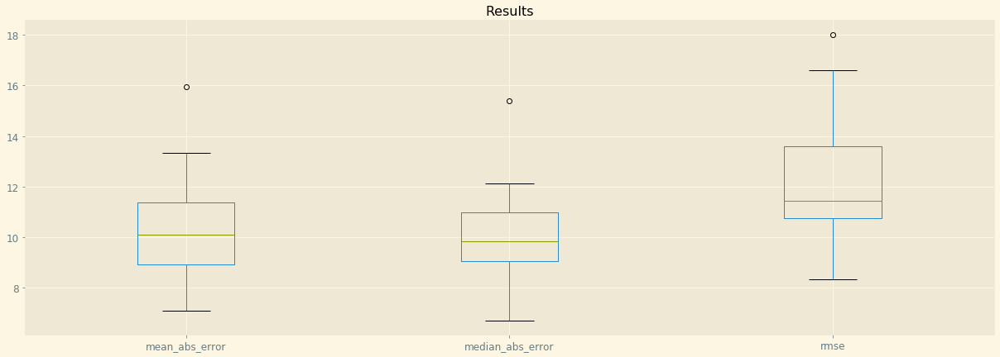

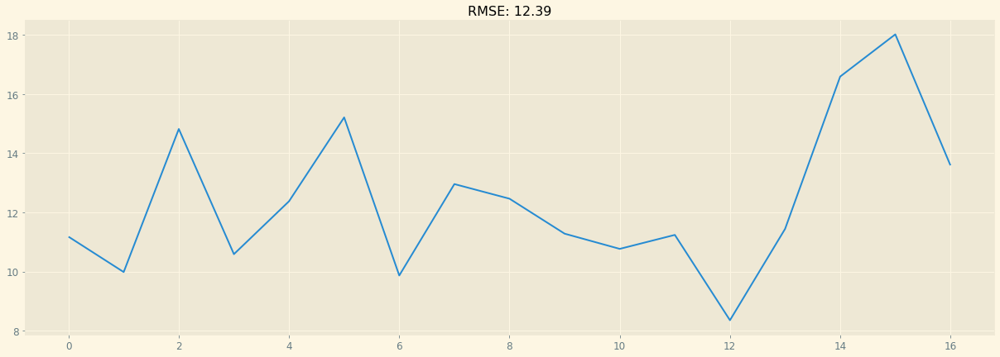

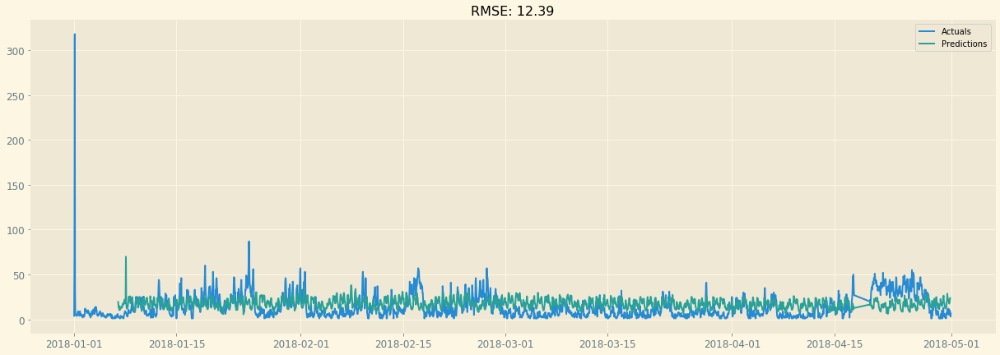

In [5]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_18 = pd.DataFrame(results_over_time)
predictions_over_time_18 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_18

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_18, results_over_time_18)

### Station nr 28079024 - Casa de Campo

In [7]:
# Generate dataframe for one particle and one station of interest

station_of_interest = 28079024

print(f'The station of interest is: {station_of_interest}')
print('')

oneparticle_onestation = df_temp.loc[df_temp['station'] == station_of_interest]
oneparticle_onestation = oneparticle_onestation.drop(columns = [x for x in particles_of_interest if x is not particle_of_interest], axis=1)
oneparticle_onestation.drop('station', axis=1, inplace=True)

print(f'Missing values for particle and station of interest: {round(oneparticle_onestation[particle_of_interest].isnull().mean()*100, 2)}%')
print('')
oneparticle_onestation.dropna(inplace=True)

oneparticle_onestation['quarter'] = oneparticle_onestation.index.quarter
oneparticle_onestation['dayofyear'] = oneparticle_onestation.index.dayofyear
oneparticle_onestation['dayofmonth'] = oneparticle_onestation.index.day
oneparticle_onestation['weekyear'] = oneparticle_onestation.index.weekofyear
oneparticle_onestation['weekday'] = oneparticle_onestation.index.weekday
oneparticle_onestation['hour'] = oneparticle_onestation.index.hour
oneparticle_onestation['year'] = oneparticle_onestation.index.year
oneparticle_onestation['month'] = oneparticle_onestation.index.month
oneparticle_onestation.fillna(0, inplace=True)

print(f'One particle, one station DF shape: {oneparticle_onestation.shape}')
oneparticle_onestation.head()

The station of interest is: 28079024

Missing values for particle and station of interest: 2.09%

One particle, one station DF shape: (54326, 9)


,PM10,quarter,dayofyear,dayofmonth,weekyear,weekday,hour,year,month
date,,,,,,,,,
2012-01-01 00:00:00,20.0,1,1,1,52,6,0,2012,1
2012-01-01 01:00:00,15.0,1,1,1,52,6,1,2012,1
2012-01-01 02:00:00,14.0,1,1,1,52,6,2,2012,1
2012-01-01 03:00:00,21.0,1,1,1,52,6,3,2012,1
2012-01-01 04:00:00,31.0,1,1,1,52,6,4,2012,1


2018-01-07 00:00:00
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2519.429, BIC=2541.810, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.472, BIC=2523.932, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.114, BIC=2527.304, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.038, BIC=2527.228, Time=0.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2777.850, BIC=2781.581, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.135, BIC=2533.055, Time=0.092 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.926, BIC=2532.846, Time=0.117 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2520.014, BIC=2538.665, Time=0.142 seconds
Total fit time: 0.996 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.956, BIC=2541.337, 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.292, BIC=2598.614, Time=0.480 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2585.224, BIC=2592.664, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.028, BIC=2588.189, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2577.555, BIC=2588.715, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2849.373, BIC=2853.094, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.622, BIC=2595.224, Time=0.334 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.737, BIC=2595.338, Time=0.441 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.259, BIC=2603.301, Time=0.624 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2577.337, BIC=2603.380, Time=0.570 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.073, BIC=2589.

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.545, BIC=2805.565, Time=0.352 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.641, BIC=2800.660, Time=0.668 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.250, BIC=2790.118, Time=0.258 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2779.248, BIC=2801.550, Time=0.186 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.268, BIC=2678.687, Time=0.550 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.572, BIC=2661.045, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.195, BIC=2663.405, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.916, BIC=2663.126, Time=0.068 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2863.757, BIC=2867.493, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.424, BIC=2668.370, Time=0.154 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2653.538, BIC=2668.484, Time=0.128 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.413, BIC=2674.096, Time=0.360 seconds
Total fit time: 1.348 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.058, BIC=2629.458, Time=0.515 seconds
F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2401.938, BIC=2420.605, Time=0.269 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.002, BIC=2420.669, Time=0.326 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2384.703, BIC=2410.837, Time=0.433 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2395.826, BIC=2418.226, Time=0.304 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2380.002, BIC=2409.869, Time=0.468 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2378.836, BIC=2404.969, Time=0.284 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2378.764, BIC=2401.164, Time=0.235 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2409.511, BIC=2428.178, Time=0.198 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2378.274, BIC=2404.407, Time=0.361 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2379.247, BIC=2409.114, Time=0.846 seconds
Total fit time: 4.40

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.140, BIC=2469.481, Time=0.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2480.096, BIC=2487.543, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2458.816, BIC=2469.986, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2461.592, BIC=2472.762, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2831.077, BIC=2834.801, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.140, BIC=2465.758, Time=0.262 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2447.183, BIC=2465.801, Time=0.304 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2439.281, BIC=2465.346, Time=0.525 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2439.867, BIC=2462.208, Time=0.469 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2437.972, BIC=2467.

Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2460.022, BIC=2478.541, Time=0.259 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2457.199, BIC=2479.421, Time=0.593 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.572 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2432.331, BIC=2454.574, Time=0.607 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2583.376, BIC=2590.791, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2520.845, BIC=2531.966, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2438.427, BIC=2449.549, Time=0.075 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2581.376, BIC=2585.083, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2430.365, BIC=2448.901, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.919, BIC=2523.537, Time=0.324 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.705, BIC=2523.600, Time=0.142 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.981, BIC=2517.875, Time=0.385 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2504.927, BIC=2523.545, Time=0.323 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2507.445, BIC=2522.339, Time=0.098 seconds
Total fit time: 2.047 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.992, BIC=2530.314, Time=1.405 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2515.739, BIC=2523.180, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2507.711, BIC=2518.872, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2509.310, BIC=2520.471, Time=0.193 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2431.631, BIC=2454.012, Time=0.739 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2439.440, BIC=2446.900, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2437.747, BIC=2448.937, Time=0.085 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2438.023, BIC=2449.214, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2727.970, BIC=2731.700, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2429.360, BIC=2448.011, Time=0.347 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2439.753, BIC=2454.674, Time=0.191 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2428.402, BIC=2443.323, Time=0.307 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2429.722, BIC=2448.372, Time=0.444 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2439.054, BIC=2453.975, Time=0.097 seconds
Total fit time: 2.3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.664, BIC=2513.200, Time=0.288 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.109, BIC=2528.938, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.190, BIC=2510.018, Time=0.300 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2491.174, BIC=2513.417, Time=0.378 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2507.279, BIC=2525.815, Time=0.176 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2489.248, BIC=2515.198, Time=0.699 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2491.524, BIC=2521.181, Time=1.193 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2494.413, BIC=2524.070, Time=0.845 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2492.751, BIC=2518.701, Time=0.537 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.309, BIC=2515.259, Time=0.763 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.358, BIC=2663.291, Time=0.147 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.344, BIC=2663.278, Time=0.155 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.537, BIC=2669.203, Time=0.140 seconds
Total fit time: 1.142 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2635.482, BIC=2657.882, Time=0.760 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.748, BIC=2644.215, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.322, BIC=2649.522, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.376, BIC=2649.576, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2869.751, BIC=2873.484, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.382, BIC=2651.049, Time=0.419 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2665.789, BIC=2691.922, Time=0.858 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2662.470, BIC=2688.604, Time=0.548 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2664.691, BIC=2687.091, Time=0.280 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2659.848, BIC=2689.714, Time=0.586 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2661.815, BIC=2695.415, Time=0.827 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2661.834, BIC=2695.434, Time=0.806 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2664.128, BIC=2693.995, Time=0.734 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2663.631, BIC=2693.498, Time=0.868 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2663.825, BIC=2701.158, Time=0.617 seconds
Total fit time: 8.554 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.276, BIC=2618.409, Time=0.585 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2592.103, BIC=2618.236, Time=0.697 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.249, BIC=2611.182, Time=0.309 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2594.965, BIC=2617.365, Time=0.582 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2595.424, BIC=2617.824, Time=0.403 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2593.778, BIC=2623.644, Time=0.906 seconds
Total fit time: 5.206 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2517.147, BIC=2539.547, Time=0.396 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.571, BIC=2536.037, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2530.501, BIC=2541.701, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.156, BIC=2515.997, Time=0.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.705, BIC=2520.257, Time=0.361 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2508.660, BIC=2523.502, Time=0.113 seconds
Total fit time: 2.022 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2486.734, BIC=2509.016, Time=0.628 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2483.790, BIC=2491.218, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2483.484, BIC=2494.625, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2483.746, BIC=2494.887, Time=0.127 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2848.786, BIC=2852.500, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2484.276, BIC=2499.131, Time=0.111 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.402, BIC=2684.361, Time=0.094 seconds
Total fit time: 3.426 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2642.194, BIC=2664.614, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.819, BIC=2659.292, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2653.185, BIC=2664.395, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.316, BIC=2664.526, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2903.835, BIC=2907.571, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.029, BIC=2663.712, Time=0.389 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.234, BIC=2663.916, Time=0.363 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.089, BIC=2670.245, Time=0.614 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2569.477, BIC=2591.897, Time=0.698 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.991, BIC=2585.464, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.933, BIC=2589.142, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.320, BIC=2589.529, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2871.479, BIC=2875.216, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.573, BIC=2583.256, Time=0.360 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.869, BIC=2591.815, Time=0.089 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.098, BIC=2581.044, Time=0.327 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2564.858, BIC=2587.278, Time=0.364 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2572.900, BIC=2591.

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2781.705, BIC=2785.438, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.304, BIC=2586.971, Time=0.327 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.401, BIC=2592.334, Time=0.159 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.896, BIC=2584.829, Time=0.305 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2567.266, BIC=2589.666, Time=0.421 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2577.805, BIC=2596.472, Time=0.148 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2571.000, BIC=2597.134, Time=0.742 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2563.402, BIC=2589.535, Time=0.452 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2579.130, BIC=2601.530, Time=0.283 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2563.106, BIC=2592.972, Time=0.698 seconds
Fit ARIMA: (3, 0, 4

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.552, BIC=2608.170, Time=0.365 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2598.041, BIC=2612.935, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2587.742, BIC=2602.636, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2589.619, BIC=2608.237, Time=0.492 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2596.796, BIC=2611.690, Time=0.104 seconds
Total fit time: 2.242 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.664, BIC=2655.025, Time=0.755 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2635.876, BIC=2643.330, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2632.451, BIC=2643.631, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.709, BIC=2643.890, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.691, BIC=2580.585, Time=0.393 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.879, BIC=2586.497, Time=0.491 seconds
Total fit time: 1.973 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.665, BIC=2613.027, Time=0.476 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2599.255, BIC=2606.709, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2598.037, BIC=2609.218, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2598.908, BIC=2610.088, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2841.413, BIC=2845.140, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.826, BIC=2608.460, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.222, BIC=2562.889, Time=0.438 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.215, BIC=2566.148, Time=0.119 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.755, BIC=2557.688, Time=0.399 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.255, BIC=2562.922, Time=0.445 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2549.557, BIC=2564.490, Time=0.194 seconds
Total fit time: 2.397 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.291, BIC=2642.691, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.113, BIC=2631.579, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.232, BIC=2635.432, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2624.640, BIC=2635.840, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2349.788, BIC=2372.207, Time=0.369 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2356.115, BIC=2363.588, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2351.228, BIC=2362.438, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2352.315, BIC=2363.524, Time=0.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2645.986, BIC=2649.723, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2347.821, BIC=2366.504, Time=0.404 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2351.385, BIC=2366.331, Time=0.145 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2345.853, BIC=2360.799, Time=0.288 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2347.822, BIC=2366.505, Time=0.538 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2350.595, BIC=2365.542, Time=0.148 seconds
Total fit time: 2.0

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2427.860, BIC=2442.793, Time=0.133 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2424.315, BIC=2442.982, Time=0.515 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.694 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.870, BIC=2474.251, Time=0.271 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2617.326, BIC=2624.786, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2540.437, BIC=2551.627, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2452.481, BIC=2463.671, Time=0.092 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2615.326, BIC=2619.056, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2449.907, BIC=2468.557, Tim

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2522.474, BIC=2544.874, Time=0.590 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2520.202, BIC=2542.602, Time=0.384 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2517.288, BIC=2547.155, Time=0.859 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2519.055, BIC=2552.655, Time=0.901 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2521.602, BIC=2555.202, Time=0.926 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2519.475, BIC=2549.342, Time=0.722 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2519.550, BIC=2549.417, Time=0.838 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2518.246, BIC=2555.579, Time=1.336 seconds
Total fit time: 9.088 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.297, BIC=2572.658, Time=0.409 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2432.361, BIC=2447.282, Time=0.103 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2425.222, BIC=2447.602, Time=0.496 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2432.815, BIC=2451.466, Time=0.282 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2428.209, BIC=2454.320, Time=0.684 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2425.497, BIC=2451.608, Time=0.494 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2429.861, BIC=2452.242, Time=0.282 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2427.497, BIC=2457.338, Time=0.790 seconds
Total fit time: 4.614 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2417.059, BIC=2439.459, Time=0.579 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2425.149, BIC=2432.615, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2342.062, BIC=2371.903, Time=0.555 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2341.833, BIC=2379.134, Time=0.948 seconds
Total fit time: 7.435 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2334.457, BIC=2356.838, Time=0.385 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2346.700, BIC=2354.160, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2344.530, BIC=2355.721, Time=0.096 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2344.355, BIC=2355.545, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2611.253, BIC=2614.983, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2342.027, BIC=2360.677, Time=0.410 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2342.043, BIC=2360.693, Time=0.442 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2405.537, BIC=2424.204, Time=0.327 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2409.321, BIC=2424.255, Time=0.124 seconds
Total fit time: 2.057 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2450.817, BIC=2473.178, Time=0.577 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2622.970, BIC=2630.424, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.925, BIC=2558.105, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2448.300, BIC=2459.480, Time=0.224 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2620.972, BIC=2624.698, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2450.131, BIC=2468.765, Tim

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2440.710, BIC=2470.551, Time=1.057 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.895 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2442.873, BIC=2465.234, Time=0.512 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.547, BIC=2619.000, Time=0.024 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.514, BIC=2557.694, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2440.445, BIC=2451.626, Time=0.100 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2609.548, BIC=2613.275, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2439.099, BIC=2454.006, Time=0.323 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2525.676, BIC=2540.610, Time=0.104 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2525.429, BIC=2540.363, Time=0.131 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.545, BIC=2546.211, Time=0.148 seconds
Total fit time: 1.017 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2526.333, BIC=2548.734, Time=1.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2528.608, BIC=2536.074, Time=0.010 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2523.669, BIC=2534.869, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.283, BIC=2534.483, Time=0.333 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2775.621, BIC=2779.355, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2525.061, BIC=2539.994, Time=0.528 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2857.745, BIC=2861.469, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2584.512, BIC=2603.130, Time=0.377 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2584.630, BIC=2603.248, Time=0.388 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.081, BIC=2611.146, Time=0.538 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2585.160, BIC=2611.225, Time=0.599 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.974, BIC=2597.868, Time=0.226 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2587.505, BIC=2602.399, Time=0.293 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2586.640, BIC=2601.534, Time=0.160 seconds
Total fit time: 3.292 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.738, BIC=2647.020, Time=0.569 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.531, BIC=2798.412, Time=0.354 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2787.529, BIC=2809.850, Time=0.364 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.717, BIC=2808.039, Time=0.643 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2787.297, BIC=2817.060, Time=0.870 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.467, BIC=2670.686, Time=0.152 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2872.315, BIC=2876.055, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.973, BIC=2675.933, Time=0.184 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.088, BIC=2676.047, Time=0.135 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.962, BIC=2681.661, Time=0.280 seconds
Total fit time: 1.435 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.474, BIC=2636.894, Time=0.553 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2612.562, BIC=2620.035, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.206, BIC=2622.416, Time=0.098 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.894, BIC=2622.104, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2408.763, BIC=2427.446, Time=0.378 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2408.821, BIC=2427.504, Time=0.426 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2391.412, BIC=2417.568, Time=0.578 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.604, BIC=2425.024, Time=0.392 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2386.657, BIC=2416.549, Time=0.590 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2385.487, BIC=2411.643, Time=0.455 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2385.423, BIC=2407.843, Time=0.245 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2416.352, BIC=2435.035, Time=0.239 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2384.924, BIC=2411.080, Time=0.351 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2385.894, BIC=2415.786, Time=0.810 seconds
Total fit time: 5.47

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.095, BIC=2476.456, Time=0.664 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2487.337, BIC=2494.791, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2465.834, BIC=2477.015, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.638, BIC=2479.818, Time=0.328 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2839.693, BIC=2843.420, Time=0.016 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.103, BIC=2472.737, Time=0.353 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.146, BIC=2472.780, Time=0.344 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2446.207, BIC=2472.295, Time=0.577 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2446.801, BIC=2469.163, Time=0.443 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2444.892, BIC=2474.

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2490.144, BIC=2516.001, Time=0.470 seconds
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2485.462, BIC=2518.705, Time=0.986 seconds
Fit ARIMA: (4, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2485.360, BIC=2522.298, Time=1.319 seconds
Near non-invertible roots for order (4, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2470.952, BIC=2507.889, Time=1.321 seconds
Near non-invertible roots for order (3, 1, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 5)x(0, 0, 0, 0) (constant=True); AIC=2468.925, BIC=2502.169, Time=1.284 seconds
Near non-invertible roots for order (2, 1, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (4, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2513.905, BIC=2543.668, Time=1.039 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 8.735 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.987, BIC=2520.309, Time=1.036 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2648.658, BIC=2656.098, Time=0.017 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.807, BIC=2587.968, Time=0.078 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2500.046, BIC=2511.207, Time=0.103 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2646.658, BIC=2650.378, Time=0.027 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2491.174, BIC=2509.775, Time=0.642 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2501.081, BIC=2523.481, Time=0.693 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.762, BIC=2526.229, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.186, BIC=2517.386, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2508.421, BIC=2519.621, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2833.269, BIC=2837.002, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2500.811, BIC=2519.478, Time=0.303 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.022, BIC=2522.955, Time=0.146 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.972, BIC=2513.906, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2500.842, BIC=2519.508, Time=0.386 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2506.105, BIC=2521.

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2625.139, BIC=2628.869, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2314.959, BIC=2333.610, Time=0.332 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2325.284, BIC=2340.204, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2313.063, BIC=2327.984, Time=0.256 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2314.988, BIC=2333.638, Time=0.507 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2323.795, BIC=2338.715, Time=0.097 seconds
Total fit time: 2.155 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2310.289, BIC=2332.669, Time=0.581 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2331.179, BIC=2338.639, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2323.328, BIC=2334.518, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.670, BIC=2660.353, Time=0.248 seconds
Total fit time: 1.201 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.071, BIC=2683.509, Time=0.303 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.218, BIC=2847.697, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.650, BIC=2769.869, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.736, BIC=2668.956, Time=0.099 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2838.219, BIC=2841.959, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.483, BIC=2674.442, Time=0.175 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.492, BIC=2674.451, Time=0.152 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.157, BIC=2678.856, Time=0.230 seconds
Total fit time: 1.048 seconds
Performing ste

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.901, BIC=2693.111, Time=0.226 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2937.985, BIC=2941.722, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.607, BIC=2691.290, Time=0.426 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.037, BIC=2691.719, Time=0.369 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.140, BIC=2700.296, Time=0.767 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2673.970, BIC=2700.126, Time=0.921 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.579, BIC=2687.525, Time=0.304 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2671.927, BIC=2694.347, Time=0.466 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2682.317, BIC=2700.999, Time=0.173 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2670.863, BIC=2697.019, Time=0.865 seconds
Fit ARIMA: (0, 0, 4

Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2671.469, BIC=2708.835, Time=0.862 seconds
Total fit time: 8.483 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2598.183, BIC=2620.602, Time=0.533 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2608.906, BIC=2616.379, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2610.885, BIC=2622.095, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.889, BIC=2622.099, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2810.242, BIC=2813.979, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.027, BIC=2619.710, Time=0.507 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2601.349, BIC=2620.032, Time=0.387 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.842, BIC=2625.998, Time=0.562 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2433.298, BIC=2455.679, Time=0.469 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.110, BIC=2456.491, Time=0.474 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2435.732, BIC=2465.572, Time=0.754 seconds
Total fit time: 5.083 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2510.883, BIC=2533.165, Time=0.622 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2524.617, BIC=2532.044, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2521.081, BIC=2532.222, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.349, BIC=2533.490, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2829.644, BIC=2833.358, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.912, BIC=2527.480, Time=1.061 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.741, BIC=2696.199, Time=0.660 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.878, BIC=2686.364, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.804, BIC=2689.033, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.258, BIC=2689.487, Time=0.818 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2911.698, BIC=2915.441, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.882, BIC=2693.597, Time=1.468 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.917, BIC=2693.632, Time=0.717 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.721, BIC=2701.922, Time=1.614 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.760, BIC=2701.961, Time=0.750 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.260, BIC=2688.232, Time=0.410 seconds
Fit ARIMA: (0, 0, 2

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2811.053, BIC=2833.472, Time=0.696 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2811.083, BIC=2833.503, Time=0.677 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2809.852, BIC=2839.744, Time=0.970 seconds
Total fit time: 5.813 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.408, BIC=2651.847, Time=0.472 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.328, BIC=2646.807, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.736, BIC=2648.956, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2638.463, BIC=2649.682, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2926.797, BIC=2930.536, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.169, BIC=2643.868, Time=0.370 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.275, BIC=2646.958, Time=0.364 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.054, BIC=2653.000, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.644, BIC=2644.590, Time=0.344 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2626.283, BIC=2648.702, Time=0.363 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2635.660, BIC=2654.343, Time=0.241 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2631.946, BIC=2658.102, Time=0.783 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2625.860, BIC=2652.016, Time=0.574 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2637.557, BIC=2659.976, Time=0.255 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2626.152, BIC=2656.045, Time=0.651 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2621.176, BIC=2651.069, Time=0.750 seconds
Fit ARIMA: (0, 0, 5)

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.086, BIC=2684.447, Time=0.493 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.603, BIC=2691.057, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.336, BIC=2686.517, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.031, BIC=2688.211, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2946.417, BIC=2950.144, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2658.496, BIC=2677.130, Time=0.329 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.398, BIC=2692.305, Time=0.170 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.141, BIC=2673.048, Time=0.257 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.995, BIC=2677.629, Time=0.346 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2672.768, BIC=2687.675, Time=0.097 seconds
Total fit time: 1.9

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.410, BIC=2594.044, Time=0.321 seconds
Total fit time: 1.970 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.900, BIC=2620.280, Time=0.839 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2606.900, BIC=2614.360, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2605.602, BIC=2616.793, Time=0.114 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.497, BIC=2617.688, Time=0.126 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2849.860, BIC=2853.590, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.279, BIC=2615.930, Time=0.242 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.001, BIC=2610.922, Time=0.164 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2596.878, BIC=2615.529, Time=0.293 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2627.755, BIC=2650.174, Time=0.880 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.628, BIC=2639.101, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.764, BIC=2642.973, Time=0.095 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2632.166, BIC=2643.376, Time=0.158 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2881.320, BIC=2885.056, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.942, BIC=2644.625, Time=0.547 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.730, BIC=2643.676, Time=0.218 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2625.357, BIC=2640.303, Time=0.349 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2625.886, BIC=2644.569, Time=0.452 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.688, BIC=2642.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2354.398, BIC=2373.097, Time=0.412 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2358.182, BIC=2373.141, Time=0.146 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2352.425, BIC=2367.384, Time=0.312 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2354.399, BIC=2373.097, Time=0.441 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2357.374, BIC=2372.333, Time=0.174 seconds
Total fit time: 2.232 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2322.526, BIC=2344.965, Time=0.644 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2329.377, BIC=2336.857, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2322.864, BIC=2334.084, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2324.094, BIC=2335.314, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2437.291, BIC=2463.447, Time=0.840 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2435.427, BIC=2450.373, Time=0.168 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2433.693, BIC=2456.113, Time=0.729 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2431.778, BIC=2454.197, Time=0.634 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2431.652, BIC=2461.545, Time=1.027 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.539 seconds
Perfor

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2833.956, BIC=2837.693, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.696, BIC=2548.379, Time=0.338 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2529.706, BIC=2548.389, Time=0.339 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2525.271, BIC=2551.427, Time=0.472 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2525.341, BIC=2551.497, Time=0.458 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2527.749, BIC=2542.695, Time=0.251 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2531.144, BIC=2553.563, Time=0.178 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2527.605, BIC=2550.025, Time=0.353 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2524.784, BIC=2554.677, Time=0.795 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2526.555, BIC=2560.185, Time=1.043 seconds
Fit ARIMA: (3, 0, 4

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2436.536, BIC=2455.202, Time=0.485 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2440.164, BIC=2455.098, Time=0.184 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.537, BIC=2449.470, Time=0.419 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2436.536, BIC=2455.203, Time=0.611 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2440.173, BIC=2455.107, Time=0.120 seconds
Total fit time: 2.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2424.399, BIC=2446.818, Time=0.524 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2432.959, BIC=2440.432, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2427.561, BIC=2438.771, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2426.945, BIC=2438.155, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2346.002, BIC=2379.602, Time=0.872 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2346.387, BIC=2379.987, Time=0.888 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2349.046, BIC=2378.913, Time=0.562 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2348.847, BIC=2386.181, Time=0.977 seconds
Total fit time: 9.726 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2341.838, BIC=2364.238, Time=0.666 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2354.280, BIC=2361.747, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2352.183, BIC=2363.383, Time=0.118 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2352.008, BIC=2363.208, Time=0.122 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2618.737, BIC=2622.470, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2412.049, BIC=2426.996, Time=0.297 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2413.753, BIC=2432.436, Time=0.316 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.787, BIC=2432.733, Time=0.133 seconds
Total fit time: 2.124 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2459.678, BIC=2482.059, Time=0.785 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.770, BIC=2638.230, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2555.015, BIC=2566.206, Time=0.069 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2459.064, BIC=2470.254, Time=0.126 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2628.775, BIC=2632.505, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.362, BIC=2471.282, Time=0.504 seconds
Near non-invertible roots for order (1, 1, 1

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2560.404, BIC=2582.785, Time=0.321 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.310, BIC=2561.770, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2555.848, BIC=2567.039, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.823, BIC=2567.013, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2823.337, BIC=2827.067, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2557.871, BIC=2572.792, Time=0.112 seconds
Total fit time: 0.619 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.501, BIC=2530.862, Time=0.535 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2507.906, BIC=2515.360, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2507.628, BIC=2518.809, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2661.932, BIC=2665.662, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2448.432, BIC=2463.352, Time=0.089 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2448.270, BIC=2463.191, Time=0.175 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2448.762, BIC=2467.412, Time=1.489 seconds
Total fit time: 2.683 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2442.262, BIC=2464.662, Time=1.036 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2438.154, BIC=2445.621, Time=0.026 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2438.576, BIC=2449.776, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2438.546, BIC=2449.746, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2653.575, BIC=2657.309, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.458, BIC=2744.044, Time=0.534 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.069, BIC=2755.088, Time=0.700 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2721.531, BIC=2747.550, Time=0.913 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2728.042, BIC=2750.344, Time=0.907 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2725.724, BIC=2755.460, Time=1.162 seconds
Near non-invertible roots for order 

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.500, BIC=2853.199, Time=0.897 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.399, BIC=2862.577, Time=0.958 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.049, BIC=2864.228, Time=0.929 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2832.878, BIC=2847.837, Time=0.397 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.523, BIC=2489.206, Time=0.294 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.763, BIC=2493.710, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.593, BIC=2483.539, Time=0.256 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.535, BIC=2489.218, Time=0.367 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2476.876, BIC=2491.823, Time=0.094 seconds
Total fit time: 1.854 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.424, BIC=2560.862, Time=0.574 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2552.193, BIC=2559.673, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2548.458, BIC=2559.678, Time=0.110 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.038, BIC=2560.257, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2259.774, BIC=2278.457, Time=0.451 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2259.935, BIC=2278.618, Time=0.445 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2253.827, BIC=2279.983, Time=0.639 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2252.298, BIC=2274.718, Time=0.426 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2258.567, BIC=2277.250, Time=0.266 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2253.944, BIC=2280.100, Time=0.543 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2266.660, BIC=2281.606, Time=0.102 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2254.971, BIC=2277.390, Time=0.291 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2256.046, BIC=2285.938, Time=0.861 seconds
Total fit time: 4.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.888, BIC=2576.131, Time=0.516 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.722, BIC=2583.379, Time=0.851 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2553.692, BIC=2583.349, Time=0.953 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2552.179, BIC=2578.129, Time=0.560 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.759, BIC=2579.708, Time=0.612 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2551.616, BIC=2584.980, Time=0.988 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2553.709, BIC=2590.780, Time=1.353 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2553.175, BIC=2590.246, Time=1.289 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2555.517, BIC=2588.881, Time=0.749 seconds
Fit ARIMA: (5, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.528, BIC=2589.892, Time=1.164 seconds
Fit ARIMA: (5, 0, 4)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.035, BIC=2540.653, Time=0.617 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2524.888, BIC=2543.506, Time=0.558 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.537, BIC=2553.602, Time=0.723 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2523.098, BIC=2549.164, Time=0.941 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.394, BIC=2600.028, Time=0.488 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.468, BIC=2600.102, Time=0.509 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2582.781, BIC=2608.869, Time=0.949 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2582.452, BIC=2608.540, Time=0.915 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.637, BIC=2594.544, Time=0.322 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.297, BIC=2604.204, Time=0.157 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2587.764, BIC=2602.671, Time=0.104 seconds
Total fit time: 4.256 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.852, BIC=2571.233, Time=0.655 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2560.505, BIC=2567.965, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2403.991, BIC=2418.924, Time=0.339 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2405.902, BIC=2424.569, Time=0.414 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.633, BIC=2432.566, Time=0.110 seconds
Total fit time: 2.523 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2329.370, BIC=2351.731, Time=0.817 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2342.092, BIC=2349.546, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2338.255, BIC=2349.435, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2338.623, BIC=2349.804, Time=0.315 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2633.532, BIC=2637.259, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2328.466, BIC=2347.101, Time=0.497 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.248, BIC=2639.833, Time=0.578 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.292, BIC=2644.160, Time=0.242 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.947, BIC=2636.816, Time=0.686 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2615.708, BIC=2638.010, Time=0.498 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2627.748, BIC=2646.333, Time=0.269 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2615.156, BIC=2641.175, Time=1.084 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2615.803, BIC=2645.539, Time=1.131 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2614.862, BIC=2644.598, Time=1.483 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=261

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.718, BIC=2742.157, Time=0.475 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.314, BIC=2747.794, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.612, BIC=2752.832, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.854, BIC=2753.073, Time=0.212 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2973.389, BIC=2977.128, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.471, BIC=2741.170, Time=0.459 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.048, BIC=2739.747, Time=0.370 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.723, BIC=2746.902, Time=1.061 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.467, BIC=2746.645, Time=0.787 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.340, BIC=2746.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.536, BIC=2733.495, Time=0.342 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.813, BIC=2730.252, Time=0.578 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2724.211, BIC=2742.910, Time=0.321 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2709.176, BIC=2735.355, Time=0.998 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2709.573, BIC=2735.752, Time=0.395 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2707.306, BIC=2729.745, Time=0.389 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2709.278, BIC=2735.456, Time=0.483 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2706.642, BIC=2736.560, Time=0.979 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2700.054, BIC=2733.712, Time=0.998 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2698.799, BIC=2728.718, Time=0.847 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2468.072, BIC=2486.771, Time=0.952 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2473.357, BIC=2488.317, Time=0.398 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2469.383, BIC=2484.342, Time=1.151 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2470.050, BIC=2492.489, Time=1.092 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2473.126, BIC=2491.825, Time=0.162 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.178, BIC=2486.877, Time=0.387 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2469.277, BIC=2495.455, Time=0.898 seconds
Total fit time: 6.009 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2450.582, BIC=2473.021, Time=1.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2453.652, BIC=2461.131, Time=0.034 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.453, BIC=2794.891, Time=0.837 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.471, BIC=2778.951, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2773.217, BIC=2784.436, Time=0.031 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.234, BIC=2784.453, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2971.751, BIC=2975.491, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.490, BIC=2784.449, Time=0.450 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2770.392, BIC=2789.091, Time=0.441 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.147, BIC=2788.846, Time=0.527 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2774.873, BIC=2789.832, Time=0.188 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2774.687, BIC=2789.646, Time=0.108 seconds
Total fit time: 2.7

Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2756.570, BIC=2775.285, Time=0.327 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2750.041, BIC=2776.242, Time=0.780 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2747.623, BIC=2773.824, Time=0.566 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2754.140, BIC=2776.599, Time=0.285 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2746.451, BIC=2776.395, Time=0.649 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2748.403, BIC=2782.090, Time=0.881 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2748.442, BIC=2782.129, Time=0.831 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2748.879, BIC=2778.823, Time=0.759 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2749.849, BIC=2779.793, Time=0.829 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2750.198, BIC=2787.628, Time=0.799 seconds
Total fit time: 9.03

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.684, BIC=2707.643, Time=0.390 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.737, BIC=2710.436, Time=0.413 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.743, BIC=2714.702, Time=0.100 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.167, BIC=2710.605, Time=0.524 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.321, BIC=2712.020, Time=0.149 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.156, BIC=2716.334, Time=0.589 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.834, BIC=2709.013, Time=1.004 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.129, BIC=2719.048, Time=0.828 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2687.050, BIC=2716.968, Time=0.898 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2600.158, BIC=2611.378, Time=0.168 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2793.995, BIC=2797.735, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.663, BIC=2609.362, Time=0.444 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.257, BIC=2614.216, Time=0.166 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.157, BIC=2607.116, Time=0.356 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2590.779, BIC=2613.218, Time=0.400 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2599.123, BIC=2617.822, Time=0.241 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2591.151, BIC=2609.850, Time=0.425 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2593.889, BIC=2620.067, Time=0.772 seconds
Total fit time: 3.819 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2603.390, BIC=2618.297, Time=0.287 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.451, BIC=2618.358, Time=0.146 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.766, BIC=2622.400, Time=0.436 seconds
Total fit time: 1.750 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.896, BIC=2586.276, Time=0.637 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.541, BIC=2747.001, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.496, BIC=2656.686, Time=0.111 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.822, BIC=2577.012, Time=0.123 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2737.544, BIC=2741.274, Time=0.016 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.984, BIC=2587.634, Time=0.654 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.491, BIC=2647.174, Time=0.385 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.082, BIC=2644.029, Time=0.163 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.357, BIC=2652.776, Time=0.502 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.208, BIC=2648.891, Time=0.152 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.147, BIC=2658.303, Time=0.689 seconds
Total fit time: 3.625 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.473, BIC=2648.931, Time=0.588 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.602, BIC=2647.088, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.068, BIC=2640.297, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.525, BIC=2642.754, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.871, BIC=2470.329, Time=0.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2461.335, BIC=2468.821, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2455.894, BIC=2467.123, Time=0.243 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.759, BIC=2467.988, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2754.431, BIC=2758.174, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2446.100, BIC=2464.815, Time=0.345 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2457.896, BIC=2472.868, Time=0.155 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2444.411, BIC=2459.383, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2446.178, BIC=2464.893, Time=0.387 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2456.011, BIC=2470.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2461.446, BIC=2480.129, Time=0.395 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2467.382, BIC=2482.328, Time=0.103 seconds
Total fit time: 2.303 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2473.382, BIC=2495.840, Time=0.721 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2476.488, BIC=2483.974, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2473.237, BIC=2484.466, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2473.227, BIC=2484.456, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2806.265, BIC=2810.008, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.768, BIC=2485.740, Time=0.372 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.128, BIC=2495.843, Time=0.156 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2523.219, BIC=2538.192, Time=0.259 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2525.159, BIC=2543.874, Time=0.367 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2526.008, BIC=2540.980, Time=0.157 seconds
Total fit time: 2.155 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2455.628, BIC=2478.086, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2486.787, BIC=2494.273, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2471.726, BIC=2482.955, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2473.880, BIC=2485.109, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2773.736, BIC=2777.479, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2465.915, BIC=2484.630, Time=0.565 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2921.304, BIC=2925.043, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.169, BIC=2583.868, Time=0.313 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2580.072, BIC=2595.031, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.345, BIC=2580.304, Time=0.272 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2563.713, BIC=2586.151, Time=0.400 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2578.484, BIC=2597.183, Time=0.256 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2569.106, BIC=2595.284, Time=0.788 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2564.475, BIC=2590.654, Time=0.549 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2574.276, BIC=2596.715, Time=0.315 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2566.470, BIC=2596.388, Time=0.933 seconds
Total fit time: 4.6

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2429.516, BIC=2455.694, Time=0.510 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2434.647, BIC=2449.606, Time=0.123 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2431.131, BIC=2453.570, Time=0.238 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2431.731, BIC=2461.649, Time=0.827 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Total fit time: 4.553 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2383.081, BIC=2405.481, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2387.706, BIC=2395.173, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2385.040, BIC=2396.240, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2384.633, BIC=2395.833, Time

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2303.662, BIC=2329.818, Time=0.604 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2307.050, BIC=2329.470, Time=0.413 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2305.315, BIC=2335.207, Time=0.695 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2302.825, BIC=2332.717, Time=0.738 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2302.892, BIC=2329.048, Time=0.396 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2304.859, BIC=2338.488, Time=0.870 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2304.954, BIC=2338.583, Time=0.897 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2304.265, BIC=2334.158, Time=0.552 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2305.042, BIC=2342.408, Time=1.136 seconds
Total fit time: 9.330 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2455.899, BIC=2467.099, Time=0.164 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2625.211, BIC=2628.944, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.541, BIC=2469.475, Time=0.414 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2454.485, BIC=2469.419, Time=0.389 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2456.418, BIC=2475.085, Time=0.405 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.887 seconds
Perfo

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2792.041, BIC=2795.780, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2539.704, BIC=2554.663, Time=0.163 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2539.781, BIC=2554.740, Time=0.118 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.304, BIC=2559.003, Time=0.461 seconds
Total fit time: 1.612 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.870, BIC=2544.309, Time=0.673 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.877, BIC=2524.356, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.048, BIC=2529.267, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.009, BIC=2529.228, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2759.618, BIC=2763.357, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant

Total fit time: 4.104 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.482, BIC=2662.804, Time=0.695 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.194, BIC=2646.634, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2637.647, BIC=2648.807, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.654, BIC=2648.815, Time=0.142 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2897.285, BIC=2901.006, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2639.628, BIC=2654.509, Time=0.124 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.616, BIC=2652.497, Time=0.356 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.547, BIC=2658.148, Time=0.524 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2639.524, BIC=2658.126, Time=0.550 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2803.406, BIC=2833.221, Time=1.107 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.572 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2866.929, BIC=2889.348, Time=0.618 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3068.146, BIC=3075.619, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2992.176, BIC=3003.385, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.786, BIC=2872.995, Time=0.265 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3066.147, BIC=3069.883, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2626.117, BIC=2637.346, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2871.253, BIC=2874.996, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.420, BIC=2642.392, Time=0.200 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2627.626, BIC=2642.598, Time=0.150 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.398, BIC=2648.113, Time=0.328 seconds
Total fit time: 1.547 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2504.018, BIC=2526.457, Time=0.586 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2510.631, BIC=2518.110, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2502.474, BIC=2513.693, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.743, BIC=2513.962, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2399.513, BIC=2425.714, Time=0.312 seconds
Total fit time: 5.544 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2382.827, BIC=2405.285, Time=0.629 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2392.575, BIC=2400.061, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2388.625, BIC=2399.854, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2388.810, BIC=2400.039, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2696.268, BIC=2700.011, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2382.525, BIC=2401.240, Time=0.358 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2390.745, BIC=2405.717, Time=0.129 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2380.764, BIC=2395.736, Time=0.330 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2458.974, BIC=2488.840, Time=0.566 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2457.619, BIC=2483.753, Time=0.386 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2455.628, BIC=2478.028, Time=0.264 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2468.742, BIC=2487.408, Time=0.211 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2457.615, BIC=2483.748, Time=0.371 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2459.609, BIC=2489.475, Time=0.296 seconds
Total fit time: 4.480 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.710, BIC=2513.071, Time=0.469 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2509.205, BIC=2516.659, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2497.981, BIC=2509.162, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.657, BIC=2497.226, Time=0.534 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.006, BIC=2502.575, Time=0.517 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2484.059, BIC=2510.055, Time=0.326 seconds
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2478.713, BIC=2504.709, Time=0.384 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2481.693, BIC=2503.976, Time=0.586 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2513.565, BIC=2535.927, Time=0.625 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.894, BIC=2533.255, Time=0.628 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2514.287, BIC=2544.102, Time=0.881 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.829 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.708, BIC=2550.108, Time=0.529 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2535.2

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.785, BIC=2526.468, Time=0.359 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.671, BIC=2527.617, Time=0.167 seconds
Total fit time: 2.063 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.391, BIC=2500.830, Time=0.571 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2486.897, BIC=2494.377, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2480.300, BIC=2491.519, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2480.725, BIC=2491.945, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2790.531, BIC=2794.271, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.759, BIC=2495.458, Time=0.491 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2482.579, BIC=2497.539, Time=0.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2416.685, BIC=2439.027, Time=0.459 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2436.196, BIC=2443.644, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2430.369, BIC=2441.540, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2432.244, BIC=2443.415, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2730.117, BIC=2733.840, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2414.678, BIC=2433.296, Time=0.332 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2428.264, BIC=2443.158, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2414.325, BIC=2429.220, Time=0.225 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2414.877, BIC=2433.495, Time=0.323 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2424.458, BIC=2439.353, Time=0.093 seconds
Total fit time: 1.7

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.444, BIC=2690.429, Time=0.185 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.456, BIC=2690.441, Time=0.160 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.487, BIC=2695.218, Time=0.185 seconds
Total fit time: 1.067 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.384, BIC=2698.842, Time=0.337 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2866.316, BIC=2873.802, Time=0.022 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2776.868, BIC=2788.097, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.919, BIC=2682.148, Time=0.102 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2864.318, BIC=2868.061, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.765, BIC=2687.737, Time=0.136 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2645.192, BIC=2667.631, Time=0.487 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.768, BIC=2657.247, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.334, BIC=2662.554, Time=0.070 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.394, BIC=2662.614, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2912.728, BIC=2916.468, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2644.917, BIC=2663.616, Time=0.428 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.850, BIC=2666.809, Time=0.166 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.624, BIC=2660.583, Time=0.356 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2645.838, BIC=2668.277, Time=0.520 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2651.354, BIC=2670.

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.230, BIC=2564.460, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2774.479, BIC=2778.222, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.404, BIC=2559.119, Time=0.457 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2540.724, BIC=2559.439, Time=0.422 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.035, BIC=2567.236, Time=0.828 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2540.709, BIC=2566.910, Time=0.916 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2543.843, BIC=2558.815, Time=0.379 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2542.266, BIC=2564.724, Time=0.569 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.527, BIC=2564.985, Time=0.579 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2541.627, BIC=2571.571, Time=0.939 seconds
Total fit time: 5.8

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.941, BIC=2520.835, Time=0.475 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2509.215, BIC=2527.833, Time=0.143 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.941, BIC=2526.559, Time=0.453 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.633, BIC=2522.528, Time=0.147 seconds
Total fit time: 2.100 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.916, BIC=2653.238, Time=1.053 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.232, BIC=2637.673, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.690, BIC=2640.851, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.994, BIC=2641.155, Time=0.174 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2936.958, BIC=2940.678, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2667.124, BIC=2693.347, Time=0.517 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.865, BIC=2684.849, Time=0.301 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2670.093, BIC=2692.571, Time=0.571 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2670.627, BIC=2693.104, Time=0.523 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2668.619, BIC=2698.589, Time=0.683 seconds
Total fit time: 6.573 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2739.041, BIC=2761.518, Time=0.509 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.180, BIC=2747.673, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.764, BIC=2753.003, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.801, BIC=2753.040, Time=0.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2644.700, BIC=2670.924, Time=0.778 seconds
Total fit time: 3.731 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.660, BIC=2615.137, Time=0.680 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2602.362, BIC=2609.854, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2602.331, BIC=2613.570, Time=0.111 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.728, BIC=2613.966, Time=0.140 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2897.378, BIC=2901.124, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2588.492, BIC=2607.223, Time=0.395 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.924, BIC=2615.909, Time=0.177 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.293, BIC=2605.277, Time=0.339 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2631.246, BIC=2664.933, Time=1.128 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2629.936, BIC=2667.366, Time=1.339 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2643.183, BIC=2676.870, Time=1.074 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2629.338, BIC=2670.511, Time=1.241 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2636.041, BIC=2673.471, Time=1.211 seconds
Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2636.390, BIC=2681.306, Time=1.406 seconds
Near non-invertible roots for order (5, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2629.676, BIC=2670.849, Time=1.238 seconds
Total fit time: 13.979 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.382, BIC=2614.840, Tim

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2954.921, BIC=2958.654, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.636, BIC=2631.302, Time=0.325 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.695, BIC=2636.628, Time=0.099 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.869, BIC=2625.802, Time=0.227 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.719, BIC=2631.385, Time=0.342 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2620.256, BIC=2635.190, Time=0.069 seconds
Total fit time: 1.794 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2657.614, BIC=2680.033, Time=0.623 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.666, BIC=2668.140, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.029, BIC=2668.239, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.363, BIC=2631.310, Time=0.392 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2614.531, BIC=2636.950, Time=0.382 seconds
Total fit time: 2.084 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.964, BIC=2655.422, Time=0.610 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.226, BIC=2647.712, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2641.355, BIC=2652.584, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.603, BIC=2652.832, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2881.332, BIC=2885.075, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.715, BIC=2650.430, Time=0.213 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.409, BIC=2645.381, Time=0.144 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.158, BIC=2656.130, Time=0.328 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2641.662, BIC=2660.377, Time=0.378 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2643.529, BIC=2658.501, Time=0.148 seconds
Total fit time: 2.210 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.994, BIC=2573.472, Time=0.622 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.660, BIC=2570.152, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.988, BIC=2574.227, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.221, BIC=2574.460, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2856.440, BIC=2860.187, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.834, BIC=2570.565, Time=1.027 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2335.288, BIC=2354.019, Time=0.418 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2338.262, BIC=2353.246, Time=0.141 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2333.570, BIC=2348.555, Time=0.285 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2335.298, BIC=2354.029, Time=0.495 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2337.623, BIC=2352.607, Time=0.158 seconds
Total fit time: 2.132 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2371.387, BIC=2393.845, Time=0.556 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2384.976, BIC=2392.462, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2375.972, BIC=2387.201, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2377.296, BIC=2388.525, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2474.161, BIC=2492.876, Time=0.431 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2474.163, BIC=2492.878, Time=0.472 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2471.269, BIC=2497.470, Time=0.620 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2471.446, BIC=2497.647, Time=0.687 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2472.196, BIC=2487.168, Time=0.342 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2472.728, BIC=2495.186, Time=0.424 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2472.110, BIC=2494.568, Time=0.466 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2467.005, BIC=2496.949, Time=0.820 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2469.056, BIC=2502.743, Time=0.930 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2469.030, BIC=2502.717, Time=0.958 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2570.880, BIC=2593.300, Time=0.304 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2574.157, BIC=2592.840, Time=0.186 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2572.727, BIC=2598.883, Time=0.574 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2584.739, BIC=2599.686, Time=0.159 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2573.345, BIC=2595.764, Time=0.305 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2573.654, BIC=2603.546, Time=0.612 seconds
Total fit time: 4.355 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.691, BIC=2653.110, Time=0.354 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.448, BIC=2686.921, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.806, BIC=2661.016, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2433.655, BIC=2452.289, Time=0.565 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2434.440, BIC=2453.074, Time=0.362 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2432.521, BIC=2458.609, Time=0.726 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2426.976, BIC=2453.064, Time=0.653 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2427.810, BIC=2450.171, Time=0.393 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2435.294, BIC=2465.109, Time=0.606 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2430.634, BIC=2460.449, Time=0.775 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2428.903, BIC=2454.991, Time=0.737 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=243

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2297.842, BIC=2316.541, Time=0.369 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2297.844, BIC=2316.543, Time=0.401 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2294.909, BIC=2321.088, Time=0.543 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2295.352, BIC=2317.790, Time=0.429 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2296.622, BIC=2326.541, Time=0.720 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2294.291, BIC=2324.209, Time=0.829 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2294.300, BIC=2320.478, Time=0.467 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2292.801, BIC=2315.240, Time=0.381 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=230

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.195, BIC=2491.142, Time=0.295 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.258, BIC=2498.941, Time=0.192 seconds
Total fit time: 1.711 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2464.253, BIC=2486.692, Time=0.611 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.388, BIC=2645.868, Time=0.018 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.250, BIC=2574.469, Time=0.076 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2461.853, BIC=2473.073, Time=0.146 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2636.388, BIC=2640.128, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2460.745, BIC=2475.704, Tim

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.755, BIC=2525.975, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2803.138, BIC=2806.878, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.780, BIC=2531.739, Time=0.101 seconds
Total fit time: 0.972 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.852, BIC=2571.310, Time=0.685 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.200, BIC=2553.686, Time=0.040 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2545.614, BIC=2556.843, Time=0.146 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2545.534, BIC=2556.763, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2810.622, BIC=2814.365, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.634, BIC=2562.606, Time=0.109 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.881, BIC=2483.788, Time=0.313 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.771, BIC=2489.406, Time=0.452 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2473.798, BIC=2488.706, Time=0.158 seconds
Total fit time: 2.160 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.611, BIC=2629.011, Time=0.457 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.559, BIC=2624.026, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2607.818, BIC=2619.018, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2608.403, BIC=2619.603, Time=0.138 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2883.370, BIC=2887.103, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.002, BIC=2625.668, Time=0.312 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2809.945, BIC=2828.596, Time=0.222 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2808.398, BIC=2827.049, Time=0.437 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2812.223, BIC=2838.334, Time=0.443 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2807.414, BIC=2833.525, Time=0.777 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.610, BIC=2721.607, Time=0.369 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.103, BIC=2726.850, Time=0.247 seconds
Total fit time: 1.755 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2686.951, BIC=2709.447, Time=0.568 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.321, BIC=2691.820, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.905, BIC=2694.153, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.633, BIC=2693.881, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2898.208, BIC=2901.957, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.163, BIC=2699.160, Tim

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.931, BIC=2535.662, Time=0.420 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.243, BIC=2540.228, Time=0.092 seconds
Total fit time: 2.057 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2429.754, BIC=2452.231, Time=0.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2442.455, BIC=2449.948, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2437.286, BIC=2448.525, Time=0.090 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2437.700, BIC=2448.939, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2745.199, BIC=2748.946, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2430.497, BIC=2449.228, Time=0.318 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2430.547, BIC=2449.278, Time=0.374 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2349.939, BIC=2368.606, Time=0.297 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2364.786, BIC=2379.719, Time=0.162 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2349.200, BIC=2364.133, Time=0.278 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2350.299, BIC=2368.965, Time=0.386 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2360.691, BIC=2375.625, Time=0.143 seconds
Total fit time: 2.012 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2475.459, BIC=2497.878, Time=0.602 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2509.836, BIC=2517.309, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2487.759, BIC=2498.969, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2490.685, BIC=2501.895, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2508.285, BIC=2541.619, Time=1.265 seconds
Total fit time: 6.937 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.738, BIC=2513.041, Time=0.709 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.969, BIC=2654.403, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2584.033, BIC=2595.184, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2491.174, BIC=2502.325, Time=0.076 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2644.969, BIC=2648.686, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2485.834, BIC=2504.420, Time=0.585 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2491.186, BIC=2509.771, Tim

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.181, BIC=2547.292, Time=0.682 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2522.688, BIC=2548.798, Time=0.819 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.388, BIC=2533.308, Time=0.375 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2520.740, BIC=2543.121, Time=0.638 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.028, BIC=2540.409, Time=0.584 seconds
Near non-invertible roots for order 

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2829.272, BIC=2833.012, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.452, BIC=2533.411, Time=0.067 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.438, BIC=2528.398, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.969, BIC=2533.668, Time=0.376 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.846, BIC=2533.545, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2519.765, BIC=2534.724, Time=0.167 seconds
Total fit time: 1.998 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2485.384, BIC=2507.842, Time=0.565 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.886, BIC=2501.372, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2487.256, BIC=2498.485, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2327.894, BIC=2342.853, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2329.280, BIC=2347.979, Time=0.383 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2342.119, BIC=2357.079, Time=0.114 seconds
Total fit time: 1.939 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2423.721, BIC=2446.082, Time=0.472 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2443.321, BIC=2450.775, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2437.402, BIC=2448.583, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2439.285, BIC=2450.466, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2738.309, BIC=2742.036, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2421.710, BIC=2440.344, Time=0.343 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.939, BIC=2645.557, Time=0.290 seconds
Total fit time: 1.006 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2669.203, BIC=2691.680, Time=0.371 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2851.304, BIC=2858.796, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.819, BIC=2783.058, Time=0.072 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.275, BIC=2675.514, Time=0.087 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2849.304, BIC=2853.050, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.231, BIC=2681.216, Time=0.180 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.227, BIC=2681.212, Time=0.149 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.566, BIC=2686.297, Time=0.334 seconds
Total fit time: 1.226 seconds
Performing ste

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.880, BIC=2729.081, Time=0.550 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2701.093, BIC=2723.551, Time=0.323 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2722.851, BIC=2741.566, Time=0.140 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.939, BIC=2729.140, Time=0.180 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.939, BIC=2734.883, Time=0.459 seconds
Total fit time: 4.612 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.821, BIC=2721.299, Time=0.758 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.999, BIC=2715.491, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2707.073, BIC=2718.311, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.519, BIC=2718.757, Time=0.128 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2693.985, BIC=2727.700, Time=1.053 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2697.784, BIC=2727.754, Time=0.895 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2695.673, BIC=2733.135, Time=0.748 seconds
Total fit time: 12.901 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.118, BIC=2643.596, Time=0.420 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.639, BIC=2639.132, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2633.616, BIC=2644.854, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2633.620, BIC=2644.859, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2836.653, BIC=2840.400, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.904, BIC=2642.635, Time=0.351 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.687, BIC=2552.305, Time=0.398 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.133, BIC=2558.027, Time=0.168 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.029, BIC=2547.923, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.810, BIC=2552.428, Time=0.452 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2540.030, BIC=2554.924, Time=0.107 seconds
Total fit time: 2.330 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2519.397, BIC=2541.758, Time=0.598 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.462, BIC=2523.916, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2515.764, BIC=2526.944, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.075, BIC=2527.255, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2696.344, BIC=2711.354, Time=0.267 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.634, BIC=2716.645, Time=0.149 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.621, BIC=2715.631, Time=0.100 seconds
Total fit time: 3.394 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2673.061, BIC=2695.557, Time=0.581 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.755, BIC=2691.254, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2685.027, BIC=2696.275, Time=0.131 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.180, BIC=2696.428, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2938.166, BIC=2941.915, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2676.157, BIC=2694.904, Time=0.421 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.151, BIC=2667.898, Time=0.384 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.055, BIC=2676.053, Time=0.154 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.596, BIC=2664.594, Time=0.280 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2650.393, BIC=2672.890, Time=0.438 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2656.635, BIC=2675.382, Time=0.220 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.468, BIC=2668.215, Time=0.507 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2652.917, BIC=2679.163, Time=0.860 seconds
Total fit time: 3.761 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.122, BIC=2623.619, Time=0.622 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2610.931, BIC=2618.430, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2644.204, BIC=2674.173, Time=0.483 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2661.647, BIC=2687.870, Time=0.343 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2638.744, BIC=2672.460, Time=0.884 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2637.388, BIC=2674.850, Time=1.035 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2650.948, BIC=2684.664, Time=0.872 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2636.710, BIC=2677.918, Time=1.136 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2642.014, BIC=2679.476, Time=1.094 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2644.511, BIC=2689.465, Time=1.198 seconds
Near non-invertible roots for order (5, 0, 5)(0, 0, 0, 0);

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.268, BIC=2700.950, Time=0.289 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.049, BIC=2716.996, Time=0.178 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.002, BIC=2696.948, Time=0.307 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.804, BIC=2701.486, Time=0.352 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.145, BIC=2712.091, Time=0.100 seconds
Total fit time: 1.803 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.102, BIC=2644.522, Time=0.566 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2633.539, BIC=2641.012, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.489, BIC=2638.699, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.048, BIC=2639.257, Time=0.123 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.451, BIC=2622.870, Time=0.678 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.467, BIC=2788.940, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.310, BIC=2690.520, Time=0.102 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2597.699, BIC=2608.909, Time=0.126 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2779.467, BIC=2783.203, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2598.142, BIC=2613.089, Time=0.360 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2598.477, BIC=2613.424, Time=0.359 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.040, BIC=2576.787, Time=0.249 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2560.565, BIC=2575.562, Time=0.143 seconds
Total fit time: 1.859 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.398, BIC=2598.875, Time=0.905 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2586.449, BIC=2593.941, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.683, BIC=2593.922, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2583.871, BIC=2595.110, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2887.752, BIC=2891.498, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2574.190, BIC=2592.921, Time=0.549 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2581.301, BIC=2596.285, Time=0.105 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2442.378, BIC=2461.125, Time=0.392 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2449.381, BIC=2464.379, Time=0.129 seconds
Total fit time: 2.071 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2412.932, BIC=2435.429, Time=0.534 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2423.772, BIC=2431.271, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2415.975, BIC=2427.223, Time=0.113 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2417.564, BIC=2428.812, Time=0.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2707.453, BIC=2711.202, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2411.167, BIC=2429.914, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2416.733, BIC=2431.730, Time=0.153 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2465.700, BIC=2488.158, Time=0.237 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.269, BIC=2661.755, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.502, BIC=2583.731, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2463.144, BIC=2474.373, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2652.269, BIC=2656.012, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2465.127, BIC=2480.099, Time=0.174 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2465.123, BIC=2480.095, Time=0.181 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2463.712, BIC=2482.427, Time=0.521 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.811, BIC=2523.059, Time=0.454 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2810.204, BIC=2813.953, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2506.452, BIC=2525.199, Time=1.139 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2506.613, BIC=2525.360, Time=0.329 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2495.813, BIC=2522.059, Time=1.974 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2495.930, BIC=2522.176, Time=1.023 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.467, BIC=2520.465, Time=1.063 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2497.877, BIC=2520.373, Time=0.424 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.064, BIC=2518.561, Time=0.428 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2495.245, BIC=2525.240, Time=0.639 seconds
Total fit time: 8.2

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2498.464, BIC=2520.941, Time=0.750 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2501.882, BIC=2509.375, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2498.534, BIC=2509.772, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.947, BIC=2510.185, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2815.703, BIC=2819.449, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2498.225, BIC=2516.956, Time=0.475 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2500.439, BIC=2515.424, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2496.370, BIC=2511.355, Time=0.308 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.243, BIC=2516.974, Time=0.448 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2499.960, BIC=2514.

Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2393.545, BIC=2430.943, Time=0.983 seconds
Total fit time: 9.816 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2372.764, BIC=2395.222, Time=0.539 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2382.513, BIC=2389.999, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2380.024, BIC=2391.253, Time=0.278 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2379.653, BIC=2390.882, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2654.372, BIC=2658.115, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2379.659, BIC=2398.374, Time=0.390 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2375.760, BIC=2394.475, Time=0.423 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2371.421, BIC=2397.622, Time=0.554 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2418.118, BIC=2436.849, Time=0.269 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.878, BIC=2441.863, Time=0.151 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2416.159, BIC=2431.144, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2418.130, BIC=2436.861, Time=0.354 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2424.748, BIC=2439.732, Time=0.106 seconds
Total fit time: 1.741 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2436.692, BIC=2459.169, Time=0.582 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2444.954, BIC=2452.447, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2440.875, BIC=2452.114, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2441.803, BIC=2453.041, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.576, BIC=2695.548, Time=0.088 seconds
Total fit time: 0.847 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.527, BIC=2605.965, Time=0.667 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2578.025, BIC=2585.505, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2579.385, BIC=2590.604, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.359, BIC=2590.578, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2848.003, BIC=2851.742, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.406, BIC=2596.365, Time=0.104 seconds
Total fit time: 0.936 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.125, BIC=2553.544, Time=0.501 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2531.439, BIC=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2471.441, BIC=2493.880, Time=0.520 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2469.886, BIC=2477.366, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2468.151, BIC=2479.370, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2468.074, BIC=2479.294, Time=0.077 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2685.325, BIC=2689.064, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2470.158, BIC=2485.117, Time=0.082 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.023, BIC=2484.982, Time=0.143 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.420, BIC=2489.119, Time=0.384 seconds
Total fit time: 1.306 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2463.997, BIC=2486.455, Time=0.635 seconds
F

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.373, BIC=2760.553, Time=0.203 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2954.110, BIC=2957.837, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.353, BIC=2771.987, Time=0.299 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.130, BIC=2768.764, Time=0.441 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2753.660, BIC=2779.748, Time=0.642 seconds
Near non-invertible roots for order

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.910, BIC=2867.158, Time=0.224 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3058.117, BIC=3061.866, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2857.494, BIC=2876.240, Time=0.482 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.450, BIC=2878.197, Time=0.183 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2861.291, BIC=2887.537, Time=0.801 seconds
Near non-invertible roots for order

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.708, BIC=2517.185, Time=0.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.823, BIC=2525.315, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2501.934, BIC=2513.173, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.547, BIC=2516.785, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2840.837, BIC=2844.583, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.954, BIC=2512.685, Time=0.298 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2502.377, BIC=2517.362, Time=0.144 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2492.014, BIC=2506.999, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.965, BIC=2512.696, Time=0.323 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2500.505, BIC=2515.

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2278.395, BIC=2300.872, Time=0.388 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2293.952, BIC=2301.445, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2284.920, BIC=2296.159, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2284.604, BIC=2295.843, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2612.777, BIC=2616.523, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2279.781, BIC=2298.512, Time=0.349 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2279.930, BIC=2298.661, Time=0.375 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2273.616, BIC=2299.839, Time=0.515 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2272.054, BIC=2294.532, Time=0.350 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2278.449, BIC=2297.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2584.862, BIC=2603.447, Time=0.544 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2585.465, BIC=2604.050, Time=0.507 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.409, BIC=2603.428, Time=0.635 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.484, BIC=2600.786, Time=0.554 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2579.251, BIC=2608.987, Time=0.720 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2579.225, BIC=2608.961, Time=0.672 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2577.661, BIC=2603.680, Time=0.439 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.582, BIC=2604.601, Time=0.392 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2577.722, BIC=2611.175, Time=0.822 seconds
Total fit time: 6.155 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2547.121, BIC=2569.521, Time=0.603 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2548.883, BIC=2571.283, Time=0.624 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2543.547, BIC=2573.414, Time=0.927 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.286 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.368, BIC=2550.768, Time=1.906 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.1

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.695, BIC=2589.394, Time=0.286 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2578.670, BIC=2593.630, Time=0.169 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.321, BIC=2584.280, Time=0.228 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2570.804, BIC=2589.503, Time=0.357 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.323, BIC=2591.282, Time=0.086 seconds
Total fit time: 1.765 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.226, BIC=2553.704, Time=0.582 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2549.312, BIC=2556.805, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2536.452, BIC=2547.691, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2538.749, BIC=2549.988, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2349.665, BIC=2368.348, Time=0.365 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2360.850, BIC=2375.797, Time=0.096 seconds
Total fit time: 1.887 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2342.452, BIC=2364.910, Time=0.566 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2356.473, BIC=2363.959, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2350.060, BIC=2361.289, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2351.005, BIC=2362.234, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2656.527, BIC=2660.270, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2341.560, BIC=2360.275, Time=0.277 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2352.154, BIC=2367.126, Time=0.155 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2650.269, BIC=2672.630, Time=0.253 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2642.368, BIC=2672.182, Time=0.709 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2644.016, BIC=2677.557, Time=0.848 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2644.348, BIC=2677.890, Time=0.719 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2645.365, BIC=2675.180, Time=0.762 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2642.505, BIC=2672.320, Time=0.816 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2637.903, BIC=2675.171, Time=0.997 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2638.434, BIC=2679.429, Time=1.167 seconds
Near non-invertible roots for order (4, 0, 5)(0, 0, 0, 0);

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.165, BIC=2780.413, Time=0.132 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3004.006, BIC=3007.756, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.052, BIC=2770.799, Time=0.261 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.676, BIC=2769.423, Time=0.235 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.333, BIC=2776.578, Time=0.532 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2750.162, BIC=2776.408, Time=0.441 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2759.430, BIC=2774.428, Time=0.277 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2753.122, BIC=2775.619, Time=0.469 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2752.386, BIC=2774.883, Time=0.380 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2752.070, BIC=2782.065, Time=0.713 seconds
Total fit time: 3.8

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2723.399, BIC=2753.394, Time=0.409 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2724.326, BIC=2758.070, Time=0.752 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2729.113, BIC=2759.108, Time=0.701 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2725.985, BIC=2763.479, Time=1.015 seconds
Total fit time: 9.147 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.971, BIC=2724.467, Time=0.430 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2716.929, BIC=2724.428, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.881, BIC=2730.129, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.894, BIC=2730.142, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2910.146, BIC=2913.895, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2491.773, BIC=2510.519, Time=0.371 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2492.959, BIC=2519.205, Time=0.608 seconds
Total fit time: 3.862 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2472.872, BIC=2495.368, Time=0.624 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2475.734, BIC=2483.233, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2475.946, BIC=2487.194, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2476.197, BIC=2487.445, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2737.903, BIC=2741.652, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.928, BIC=2489.675, Time=0.368 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2476.541, BIC=2491.539, Time=0.133 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.884, BIC=2808.881, Time=0.392 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2794.799, BIC=2813.546, Time=0.417 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2794.567, BIC=2813.314, Time=0.457 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.271, BIC=2814.268, Time=0.160 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.091, BIC=2814.089, Time=0.106 seconds
Total fit time: 2.287 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.234, BIC=2823.730, Time=0.590 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2798.294, BIC=2805.793, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2799.862, BIC=2811.110, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.876, BIC=2811.124, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2772.770, BIC=2806.543, Time=0.870 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2772.692, BIC=2806.466, Time=0.674 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2773.191, BIC=2803.212, Time=0.599 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2774.535, BIC=2804.556, Time=0.851 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2774.523, BIC=2812.049, Time=0.858 seconds
Total fit time: 8.190 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2770.010, BIC=2792.526, Time=0.389 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2787.067, BIC=2794.572, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.841, BIC=2795.099, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.975, BIC=2796.233, Time=0.073 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.149, BIC=2740.395, Time=0.576 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.997, BIC=2734.243, Time=0.650 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.052, BIC=2743.047, Time=0.784 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2712.853, BIC=2742.848, Time=0.753 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2702.159, BIC=2728.404, Time=0.650 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.727, BIC=2730.223, Time=0.452 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2705.359, BIC=2735.354, Time=0.689 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.580, BIC=2733.327, Time=0.403 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2706.941, BIC=2733.187, Time=0.495 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2704.068, BIC=2737.813, Time=0.914 seconds
Total fit time: 8.72

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2617.004, BIC=2643.250, Time=0.624 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2611.944, BIC=2638.190, Time=0.453 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2624.383, BIC=2646.879, Time=0.267 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2612.287, BIC=2642.282, Time=0.687 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2607.951, BIC=2637.946, Time=0.517 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2624.905, BIC=2651.151, Time=0.341 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2603.786, BIC=2637.530, Time=0.775 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2609.673, BIC=2647.167, Time=1.083 seconds
Near non-invertible roots for order (3, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=260

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2633.514, BIC=2648.460, Time=0.368 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.566, BIC=2649.512, Time=0.127 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2635.441, BIC=2654.124, Time=0.397 seconds
Total fit time: 1.637 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.108, BIC=2614.547, Time=0.620 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.224, BIC=2775.703, Time=0.219 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2677.157, BIC=2688.377, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.968, BIC=2604.188, Time=0.239 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.266, BIC=2676.743, Time=0.568 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2657.590, BIC=2665.082, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.156, BIC=2669.395, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.482, BIC=2669.721, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2927.354, BIC=2931.100, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.534, BIC=2671.265, Time=0.370 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.056, BIC=2669.041, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.556, BIC=2667.541, Time=0.308 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2654.395, BIC=2676.872, Time=0.486 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2655.667, BIC=2674.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2508.062, BIC=2523.072, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2509.868, BIC=2528.631, Time=0.371 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.666, BIC=2533.676, Time=0.160 seconds
Total fit time: 2.101 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2468.762, BIC=2491.278, Time=0.570 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2481.928, BIC=2489.433, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2477.806, BIC=2489.064, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2478.501, BIC=2489.759, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2795.813, BIC=2799.566, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2466.957, BIC=2485.720, Time=0.362 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.235, BIC=2534.982, Time=0.279 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.890, BIC=2542.888, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.310, BIC=2529.307, Time=0.219 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.242, BIC=2534.989, Time=0.351 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2524.145, BIC=2539.143, Time=0.128 seconds
Total fit time: 1.868 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2486.948, BIC=2509.425, Time=0.544 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2499.859, BIC=2507.351, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2491.944, BIC=2503.182, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.225, BIC=2504.463, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2549.426, BIC=2571.941, Time=0.312 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.944, BIC=2570.449, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2548.972, BIC=2560.230, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2552.217, BIC=2563.474, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2815.864, BIC=2819.616, Time=0.010 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.214, BIC=2561.224, Time=0.090 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.015, BIC=2565.778, Time=0.133 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.516, BIC=2565.279, Time=0.480 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2545.402, BIC=2560.412, Time=0.217 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.510, BIC=2566.

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.913, BIC=2674.628, Time=0.386 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2646.787, BIC=2672.988, Time=0.552 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2646.498, BIC=2672.699, Time=0.455 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.296, BIC=2669.268, Time=0.198 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2650.133, BIC=2672.591, Time=0.291 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.734, BIC=2672.192, Time=0.343 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2648.177, BIC=2678.121, Time=0.752 seconds
Total fit time: 3.844 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2587.944, BIC=2610.441, Time=0.452 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2633.231, BIC=2640.730, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2444.039, BIC=2477.639, Time=0.900 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 5.626 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2452.554, BIC=2475.051, Time=0.463 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2458.288, BIC=2465.787, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2454.596, BIC=2465.844, Time=0.106 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.425, BIC=2465.673, Time=0.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2742.741, BIC=2746.490, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.232, BIC=2471.979, Time=0.370 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2453.267, BIC=2472.014, Tim

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2306.251, BIC=2328.728, Time=0.381 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2313.578, BIC=2332.309, Time=0.193 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2308.078, BIC=2334.301, Time=0.476 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2317.335, BIC=2332.320, Time=0.105 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2315.494, BIC=2337.971, Time=0.248 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2308.607, BIC=2338.577, Time=0.623 seconds
Total fit time: 6.233 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2325.617, BIC=2348.094, Time=0.383 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2353.516, BIC=2361.009, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2340.394, BIC=2351.633, Time=0.082 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.585, BIC=2492.570, Time=0.442 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2477.794, BIC=2492.779, Time=0.347 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.145, BIC=2498.876, Time=0.200 seconds
Total fit time: 1.750 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2481.749, BIC=2504.207, Time=0.463 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2650.016, BIC=2657.502, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2584.872, BIC=2596.101, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.654, BIC=2586.151, Time=0.593 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.696, BIC=2574.195, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.161, BIC=2572.409, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.800, BIC=2572.048, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2816.143, BIC=2819.893, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.644, BIC=2577.641, Time=0.180 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.709, BIC=2577.706, Time=0.118 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.021, BIC=2581.767, Time=0.447 seconds
Total fit time: 1.533 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.324, BIC=2567.820, Time=0.619 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.010, BIC=2649.189, Time=0.560 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2623.085, BIC=2649.263, Time=0.579 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.917, BIC=2635.876, Time=0.251 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.071, BIC=2641.030, Time=0.182 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.041, BIC=2640.000, Time=0.166 seconds
Total fit time: 3.382 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.238, BIC=2686.619, Time=0.594 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2663.294, BIC=2670.754, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.626, BIC=2672.816, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.649, BIC=2672.839, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2829.093, BIC=2851.512, Time=0.253 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.220, BIC=2849.640, Time=0.543 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2828.852, BIC=2858.744, Time=0.848 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 4.889 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.764, BIC=2915.241, Time=0.590 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3095.2

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2649.323, BIC=2660.581, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2896.500, BIC=2900.253, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2650.600, BIC=2665.610, Time=0.173 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.804, BIC=2665.814, Time=0.143 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.577, BIC=2671.340, Time=0.415 seconds
Total fit time: 1.536 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.017, BIC=2549.513, Time=0.549 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2533.979, BIC=2541.478, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.442, BIC=2536.691, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2525.696, BIC=2536.945, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2421.426, BIC=2447.694, Time=0.310 seconds
Total fit time: 4.850 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2404.155, BIC=2426.671, Time=0.478 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2414.258, BIC=2421.763, Time=0.016 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2410.173, BIC=2421.430, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2410.346, BIC=2421.603, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2720.206, BIC=2723.958, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2403.875, BIC=2422.638, Time=0.343 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2412.290, BIC=2427.300, Time=0.121 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.110, BIC=2417.121, Time=0.340 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.344, BIC=2535.764, Time=0.520 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2531.865, BIC=2539.338, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2520.840, BIC=2532.050, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.656, BIC=2532.865, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2916.434, BIC=2920.171, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.344, BIC=2535.026, Time=0.362 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.453, BIC=2535.136, Time=0.466 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.670, BIC=2537.826, Time=0.622 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.896, BIC=2535.315, Time=0.483 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.197, BIC=2544.

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2477.604, BIC=2496.238, Time=0.561 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 2.113 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.402, BIC=2578.822, Time=0.726 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.005, BIC=2713.478, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2643.740, BIC=2654.950, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.491, BIC=2572.700, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2704.005, BIC=2707.742, Time=0.013 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.600, BIC=2571.283, Time=0.520 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2541.957, BIC=2560.639, Time=0.353 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.291, BIC=2558.237, Time=0.088 seconds
Total fit time: 1.739 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.556, BIC=2634.994, Time=0.449 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.944, BIC=2633.424, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.165, BIC=2630.384, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.345, BIC=2631.565, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2927.573, BIC=2931.313, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.916, BIC=2631.615, Time=0.325 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.979, BIC=2631.678, Time=258.957 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constan

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2452.745, BIC=2486.461, Time=0.832 seconds
Total fit time: 6.518 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2436.164, BIC=2458.641, Time=0.542 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2454.865, BIC=2462.358, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2445.437, BIC=2456.676, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2446.559, BIC=2457.798, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2736.246, BIC=2739.992, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2434.233, BIC=2452.964, Time=0.269 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2447.956, BIC=2462.941, Time=0.127 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2432.388, BIC=2447.373, Time=0.215 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.536, BIC=2607.878, Time=0.828 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2583.620, BIC=2591.067, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2585.462, BIC=2596.632, Time=0.026 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2585.472, BIC=2596.643, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2915.093, BIC=2918.817, Time=0.013 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2587.356, BIC=2602.251, Time=0.062 seconds
Total fit time: 1.043 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.315, BIC=2674.676, Time=0.600 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.568, BIC=2660.021, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.079, BIC=2665.260, Time=0.031 seconds
F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.711, BIC=2689.709, Time=0.099 seconds
Total fit time: 0.985 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2715.081, BIC=2737.577, Time=0.593 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2721.252, BIC=2728.750, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.248, BIC=2734.496, Time=0.101 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.249, BIC=2734.497, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2963.950, BIC=2967.699, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.318, BIC=2732.065, Time=0.278 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.408, BIC=2731.406, Time=0.131 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.292, BIC=2734.289, Time=0.293 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.856, BIC=2766.372, Time=0.395 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.282, BIC=2766.788, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.279, BIC=2772.536, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.280, BIC=2772.537, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2962.306, BIC=2966.059, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.562, BIC=2760.324, Time=0.267 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.534, BIC=2774.544, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.063, BIC=2766.073, Time=0.298 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2740.594, BIC=2763.109, Time=0.376 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2757.388, BIC=2776.

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2509.385, BIC=2543.159, Time=0.871 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2509.845, BIC=2543.618, Time=0.678 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2515.729, BIC=2545.750, Time=0.245 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2509.161, BIC=2539.182, Time=0.754 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2510.884, BIC=2548.409, Time=0.976 seconds
Total fit time: 7.413 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.595, BIC=2522.110, Time=0.592 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2503.305, BIC=2510.810, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2505.167, BIC=2516.425, Time=0.050 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.192, BIC=2516.450, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2839.560, BIC=2862.018, Time=0.592 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.766, BIC=2846.252, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2840.538, BIC=2851.767, Time=0.030 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.559, BIC=2851.788, Time=0.121 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3038.885, BIC=3042.628, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.336, BIC=2851.308, Time=0.421 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2837.112, BIC=2855.827, Time=0.572 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.953, BIC=2855.668, Time=0.413 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.727, BIC=2856.699, Time=0.158 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.470, BIC=2856.442, Time=0.107 seconds
Total fit time: 2.4

Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2758.395, BIC=2792.197, Time=0.727 seconds
Total fit time: 8.322 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.150, BIC=2804.685, Time=0.399 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.740, BIC=2801.251, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2793.107, BIC=2804.375, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2793.593, BIC=2804.860, Time=0.112 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3046.240, BIC=3049.996, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.645, BIC=2798.424, Time=0.304 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2792.689, BIC=2807.712, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.112, BIC=2796.135, Time=0.283 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2642.441, BIC=2661.204, Time=0.340 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2645.814, BIC=2672.082, Time=0.630 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 3.249 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.274, BIC=2750.789, Time=0.728 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.508, BIC=2736.013, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2730.343, BIC=2741.601, Time=0.041 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.351, BIC=2741.609, Time=0.129 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2930.878, BIC=2934.630, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.470, BIC=2741.233, Tim

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2605.356, BIC=2639.129, Time=0.834 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2609.625, BIC=2643.398, Time=0.710 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2607.096, BIC=2637.117, Time=0.515 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2624.926, BIC=2651.194, Time=0.285 seconds
Total fit time: 6.009 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.072, BIC=2646.588, Time=0.477 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.174, BIC=2637.679, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.485, BIC=2642.742, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.602, BIC=2642.860, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.770, BIC=2684.742, Time=0.333 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.679, BIC=2690.394, Time=0.456 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.874, BIC=2689.846, Time=0.093 seconds
Total fit time: 2.193 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2695.280, BIC=2717.738, Time=0.467 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.551, BIC=2710.037, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2700.871, BIC=2712.100, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.568, BIC=2712.797, Time=0.070 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3005.884, BIC=3009.627, Time=0.013 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.342, BIC=2712.057, Time=0.335 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.849, BIC=2671.860, Time=0.281 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2654.845, BIC=2677.360, Time=0.557 seconds
Total fit time: 2.155 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.563, BIC=2705.059, Time=0.431 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2689.645, BIC=2697.143, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2690.015, BIC=2701.263, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.443, BIC=2701.691, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2929.234, BIC=2932.983, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.288, BIC=2700.035, Time=0.365 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.542, BIC=2697.540, Time=0.137 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2576.156, BIC=2594.934, Time=0.315 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2576.895, BIC=2595.674, Time=0.405 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.579, BIC=2603.869, Time=0.572 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2577.417, BIC=2603.707, Time=0.628 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2577.378, BIC=2592.401, Time=0.330 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2575.598, BIC=2598.132, Time=0.452 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.579, BIC=2598.113, Time=0.417 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2579.414, BIC=2609.460, Time=0.666 seconds
Total fit time: 4.561 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.685, BIC=2547.219, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2397.787, BIC=2420.303, Time=0.530 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2410.263, BIC=2417.769, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2401.553, BIC=2412.811, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.803, BIC=2414.061, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2721.951, BIC=2725.703, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2396.216, BIC=2414.979, Time=0.332 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2403.580, BIC=2418.590, Time=0.134 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2394.367, BIC=2409.377, Time=0.288 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2396.241, BIC=2415.004, Time=0.366 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2402.121, BIC=2417.131, Time=0.134 seconds
Total fit time: 1.9

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.302, BIC=2515.817, Time=0.509 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2507.379, BIC=2514.884, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2501.981, BIC=2513.239, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2502.993, BIC=2514.251, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2798.947, BIC=2802.700, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.214, BIC=2515.977, Time=0.361 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.217, BIC=2515.980, Time=0.380 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.265, BIC=2520.533, Time=0.873 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2494.432, BIC=2520.700, Time=0.670 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.259, BIC=2510.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.654, BIC=2620.385, Time=0.301 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.854, BIC=2621.585, Time=0.357 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2596.016, BIC=2622.239, Time=0.443 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2595.877, BIC=2622.101, Time=0.436 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2594.061, BIC=2616.538, Time=0.328 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2597.786, BIC=2616.517, Time=0.165 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2595.869, BIC=2622.093, Time=0.432 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2608.430, BIC=2623.415, Time=0.131 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2596.775, BIC=2619.252, Time=0.227 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2596.952, BIC=2626.922, Time=0.594 seconds
Total fit time: 4.01

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2462.820, BIC=2492.841, Time=0.684 seconds
Total fit time: 3.918 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2455.464, BIC=2477.884, Time=0.480 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2460.045, BIC=2467.518, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2456.956, BIC=2468.166, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2456.593, BIC=2467.802, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2738.948, BIC=2742.685, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2460.572, BIC=2479.255, Time=0.146 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2458.100, BIC=2476.783, Time=0.349 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2456.258, BIC=2482.414, Time=0.601 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2371.353, BIC=2401.349, Time=0.470 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2368.005, BIC=2405.499, Time=0.884 seconds
Total fit time: 6.547 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2315.837, BIC=2338.333, Time=0.427 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2327.569, BIC=2335.068, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2321.900, BIC=2333.148, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2322.233, BIC=2333.481, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2630.558, BIC=2634.307, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2318.399, BIC=2337.146, Time=0.328 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2318.404, BIC=2337.151, Time=0.364 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.875, BIC=2516.860, Time=0.142 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2501.920, BIC=2516.905, Time=0.151 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2503.126, BIC=2521.857, Time=0.138 seconds
Total fit time: 0.851 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.949, BIC=2512.446, Time=0.236 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.363, BIC=2668.862, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2585.677, BIC=2596.926, Time=0.064 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2486.214, BIC=2497.462, Time=0.086 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2659.367, BIC=2663.116, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.918, BIC=2500.916, Time=0.490 seconds
Near non-invertible roots for order (1, 1, 1

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2539.793, BIC=2558.540, Time=0.426 seconds
Total fit time: 1.358 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.156, BIC=2594.672, Time=0.443 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2570.211, BIC=2577.716, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2569.249, BIC=2580.507, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.183, BIC=2580.441, Time=0.074 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2834.690, BIC=2838.443, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2571.250, BIC=2586.260, Time=0.105 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.114, BIC=2586.125, Time=0.138 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.213, BIC=2589.976, Time=0.399 seconds
Total fit time: 1.245 seconds
Performing ste

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2493.082, BIC=2511.765, Time=0.387 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.514, BIC=2511.460, Time=0.140 seconds
Total fit time: 1.971 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2629.684, BIC=2652.142, Time=0.368 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2640.459, BIC=2647.945, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.294, BIC=2642.523, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.972, BIC=2643.201, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2908.728, BIC=2912.471, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.038, BIC=2648.753, Time=0.291 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.148, BIC=2648.863, Time=0.363 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.511, BIC=2853.210, Time=0.404 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2838.320, BIC=2864.498, Time=0.492 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2833.305, BIC=2859.484, Time=0.776 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2834.000, BIC=2848.959, Time=0.333 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.828, BIC=2679.607, Time=0.340 seconds
Total fit time: 1.507 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2535.066, BIC=2557.581, Time=0.550 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2542.562, BIC=2550.068, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2533.632, BIC=2544.889, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.965, BIC=2545.223, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2876.311, BIC=2880.064, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2535.564, BIC=2550.575, Time=0.124 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2531.404, BIC=2546.414, Time=0.294 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2532.969, BIC=2551.732, Time=0.458 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2411.504, BIC=2430.282, Time=0.283 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2420.183, BIC=2435.206, Time=0.140 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2409.738, BIC=2424.761, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2411.603, BIC=2430.382, Time=0.353 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2419.904, BIC=2434.927, Time=0.094 seconds
Total fit time: 1.831 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2367.850, BIC=2390.384, Time=0.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2384.815, BIC=2392.327, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2376.875, BIC=2388.142, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2377.292, BIC=2388.559, Time=0.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.219, BIC=2542.918, Time=0.331 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2524.305, BIC=2543.004, Time=0.412 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2519.911, BIC=2546.090, Time=0.610 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2520.868, BIC=2543.307, Time=0.388 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.099, BIC=2552.017, Time=0.599 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2524.181, BIC=2554.099, Time=0.689 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2521.729, BIC=2547.908, Time=0.612 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2520.114, BIC=2546.293, Time=0.391 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2523.462, BIC=2557.120, Time=0.748 seconds
Total fit time: 5.458 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.912, BIC=2587.351, Time=0.560 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2713.764, BIC=2721.244, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.327, BIC=2662.547, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.871, BIC=2581.090, Time=0.069 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2711.765, BIC=2715.504, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2561.052, BIC=2579.751, Time=0.478 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2564.225, BIC=2582.924, Time=0.450 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2620.767, BIC=2643.225, Time=0.427 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2634.726, BIC=2642.212, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.611, BIC=2638.840, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2628.883, BIC=2640.112, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2935.984, BIC=2939.727, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.170, BIC=2639.885, Time=0.343 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2621.230, BIC=2639.945, Time=0.332 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.504, BIC=2648.705, Time=0.561 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2622.146, BIC=2648.347, Time=0.474 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2619.373, BIC=2634.

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2443.085, BIC=2465.581, Time=0.539 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2462.099, BIC=2469.598, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2452.505, BIC=2463.753, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2453.677, BIC=2464.926, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2744.115, BIC=2747.864, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2441.126, BIC=2459.873, Time=0.290 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2455.029, BIC=2470.027, Time=0.133 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2439.288, BIC=2454.286, Time=0.246 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2441.188, BIC=2459.935, Time=0.323 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2453.263, BIC=2468.260, Time=0.089 seconds
Total fit time: 1.7

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.212, BIC=2683.593, Time=0.611 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.128, BIC=2668.588, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.607, BIC=2673.797, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.603, BIC=2673.794, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2962.805, BIC=2966.535, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.577, BIC=2679.497, Time=0.061 seconds
Total fit time: 0.847 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.631, BIC=2666.011, Time=0.237 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.466, BIC=2833.926, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2762.052, BIC=2773.242, Time=0.062 seconds
F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2767.366, BIC=2793.656, Time=0.441 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2776.245, BIC=2791.268, Time=0.228 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.423, BIC=2792.958, Time=0.463 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2769.563, BIC=2792.097, Time=0.395 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2769.299, BIC=2799.345, Time=0.651 seconds
Total fit time: 3.911 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.433, BIC=2763.949, Time=0.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.618, BIC=2759.123, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.852, BIC=2760.109, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2749.436, BIC=2760.694, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.040, BIC=2740.575, Time=0.336 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2733.212, BIC=2740.723, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2735.138, BIC=2746.405, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.157, BIC=2746.424, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2926.718, BIC=2930.474, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.217, BIC=2736.996, Time=0.366 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.813, BIC=2737.592, Time=0.260 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2718.463, BIC=2744.753, Time=0.478 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2717.792, BIC=2744.082, Time=0.535 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2720.043, BIC=2742.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2485.204, BIC=2503.982, Time=0.442 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.870, BIC=2505.893, Time=0.086 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.095, BIC=2499.118, Time=0.260 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.301, BIC=2504.080, Time=0.354 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2489.988, BIC=2505.011, Time=0.090 seconds
Total fit time: 2.165 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2475.597, BIC=2498.093, Time=0.536 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.939, BIC=2501.438, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2490.485, BIC=2501.733, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2491.671, BIC=2502.920, Time=0.063 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2814.184, BIC=2829.207, Time=0.317 seconds
Total fit time: 1.112 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2748.998, BIC=2771.552, Time=0.462 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.931, BIC=2759.449, Time=0.019 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.714, BIC=2762.991, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2751.990, BIC=2763.267, Time=0.069 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2969.700, BIC=2973.459, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2747.592, BIC=2766.387, Time=0.291 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.792, BIC=2767.828, Time=0.140 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2746.497, BIC=2761.532, Time=0.283 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.137, BIC=2802.932, Time=0.311 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2798.335, BIC=2813.371, Time=0.109 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.888, BIC=2799.924, Time=0.278 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2784.596, BIC=2807.150, Time=0.394 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2794.948, BIC=2813.742, Time=0.200 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2784.623, BIC=2803.417, Time=0.371 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2786.618, BIC=2812.930, Time=0.649 seconds
Total fit time: 2.880 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2855.471, BIC=2878.006, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2867.647, BIC=2875.158, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.966, BIC=2749.500, Time=0.621 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.954, BIC=2736.465, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2730.693, BIC=2741.960, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.718, BIC=2741.985, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2914.879, BIC=2918.635, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.008, BIC=2742.787, Time=0.531 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.930, BIC=2746.953, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.217, BIC=2740.240, Time=0.313 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2721.928, BIC=2744.462, Time=0.444 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2730.048, BIC=2748.827, Time=0.123 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2624.834, BIC=2658.635, Time=0.848 seconds
Total fit time: 7.909 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.370, BIC=2663.905, Time=0.485 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2659.211, BIC=2666.722, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.967, BIC=2672.234, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2661.004, BIC=2672.271, Time=0.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2857.901, BIC=2861.657, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2650.267, BIC=2669.045, Time=0.284 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2651.188, BIC=2669.967, Time=0.322 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.747, BIC=2670.037, Time=0.731 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2783.839, BIC=2787.585, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.560, BIC=2631.291, Time=0.487 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.860, BIC=2625.591, Time=0.419 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.038, BIC=2636.262, Time=0.487 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2603.983, BIC=2630.207, Time=0.758 seconds
Near non-invertible roots for order

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.345, BIC=2691.861, Time=0.429 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.255, BIC=2688.018, Time=0.169 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2671.147, BIC=2697.415, Time=0.579 seconds
Total fit time: 3.697 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.245, BIC=2688.798, Time=0.560 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.700, BIC=2687.218, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2668.705, BIC=2679.982, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2671.217, BIC=2682.493, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2970.154, BIC=2973.913, Time=0.014 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2664.627, BIC=2683.422, Time=0.369 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2487.024, BIC=2505.818, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2498.085, BIC=2513.121, Time=0.146 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.273, BIC=2500.308, Time=0.248 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.084, BIC=2505.879, Time=0.347 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.281, BIC=2511.317, Time=0.129 seconds
Total fit time: 1.856 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2469.922, BIC=2492.475, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2483.087, BIC=2490.605, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2475.879, BIC=2487.156, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.319, BIC=2488.596, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.677, BIC=2530.712, Time=0.094 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.432, BIC=2530.467, Time=0.092 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.407, BIC=2532.201, Time=0.472 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2511.011, BIC=2533.565, Time=0.430 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.564, BIC=2534.359, Time=0.171 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2509.746, BIC=2536.058, Time=0.655 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2514.563, BIC=2544.635, Time=0.771 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2514.697, BIC=2544.768, Time=0.736 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=251

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2501.671, BIC=2520.466, Time=0.293 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2501.811, BIC=2520.606, Time=0.337 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2492.804, BIC=2519.117, Time=0.509 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2492.804, BIC=2519.116, Time=0.418 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2500.579, BIC=2515.614, Time=0.238 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2502.139, BIC=2524.693, Time=0.365 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2506.375, BIC=2528.929, Time=0.183 second

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2601.324, BIC=2623.858, Time=0.375 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2616.954, BIC=2635.733, Time=0.213 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2606.694, BIC=2632.985, Time=0.664 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2602.118, BIC=2628.408, Time=0.489 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2612.402, BIC=2634.936, Time=0.271 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2604.115, BIC=2634.161, Time=0.755 seconds
Total fit time: 4.227 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.179, BIC=2644.714, Time=0.567 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2627.470, BIC=2634.982, Time

Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2468.948, BIC=2491.482, Time=0.241 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2469.219, BIC=2499.265, Time=0.721 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Total fit time: 4.446 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2417.972, BIC=2440.468, Time=0.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2423.263, BIC=2430.762, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2420.474, BIC=2431.723, Time=0.091 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2420.096, BIC=2431.345, Time=0.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2702.510, BIC=2706.259, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2419.658, BIC=2438.405, Tim

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2338.424, BIC=2364.692, Time=0.506 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2341.830, BIC=2364.345, Time=0.306 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2340.062, BIC=2370.083, Time=0.626 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2337.741, BIC=2367.762, Time=0.655 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2337.710, BIC=2363.978, Time=0.356 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2339.342, BIC=2361.858, Time=0.310 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2339.102, BIC=2369.123, Time=0.565 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2340.780, BIC=2367.048, Time=0.475 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2339.860, BIC=2373.634, Time=0.910 seconds
Total fit time: 5.877 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2496.881, BIC=2519.377, Time=0.326 seconds
Total fit time: 1.978 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.231, BIC=2597.746, Time=0.607 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.868, BIC=2580.373, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.881, BIC=2584.139, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2572.879, BIC=2584.137, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2820.460, BIC=2824.212, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.876, BIC=2589.886, Time=0.096 seconds
Total fit time: 0.881 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.807, BIC=2675.342, Time=0.624 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.835, BIC=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.771, BIC=2580.794, Time=0.084 seconds
Total fit time: 0.799 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2539.332, BIC=2561.848, Time=0.356 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2531.891, BIC=2539.396, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2533.871, BIC=2545.129, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.869, BIC=2545.127, Time=0.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2747.936, BIC=2751.688, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.878, BIC=2550.888, Time=0.094 seconds
Total fit time: 0.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.276, BIC=2537.773, Time=0.560 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2512.803, BIC=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.452, BIC=2732.386, Time=0.188 seconds
Total fit time: 0.915 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.466, BIC=2728.788, Time=0.587 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.939, BIC=2714.379, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.839, BIC=2720.000, Time=0.027 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.812, BIC=2719.973, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2920.691, BIC=2924.411, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.598, BIC=2728.199, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.977, BIC=2727.578, Time=0.275 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.867, BIC=2731.910, Time=0.512 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2911.322, BIC=2937.590, Time=0.668 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2908.395, BIC=2934.663, Time=0.514 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2906.722, BIC=2921.732, Time=0.298 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2909.949, BIC=2932.464, Time=0.597 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.224, BIC=2548.019, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2537.212, BIC=2552.248, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2527.667, BIC=2542.703, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2529.349, BIC=2548.144, Time=0.403 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2535.610, BIC=2550.646, Time=0.143 seconds
Total fit time: 1.970 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.749, BIC=2545.302, Time=0.574 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2535.571, BIC=2543.088, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2527.775, BIC=2539.052, Time=0.086 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.579, BIC=2539.856, Time=0.092 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2364.169, BIC=2394.240, Time=0.530 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2362.468, BIC=2388.780, Time=0.367 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2361.596, BIC=2384.149, Time=0.227 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2378.989, BIC=2397.784, Time=0.191 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2362.257, BIC=2388.569, Time=0.285 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2364.204, BIC=2394.275, Time=0.641 seconds
Total fit time: 4.305 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2330.178, BIC=2352.713, Time=0.555 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2341.888, BIC=2349.399, Time=0.020 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2335.137, BIC=2346.404, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.390, BIC=2625.057, Time=0.377 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.494, BIC=2625.161, Time=0.387 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.674, BIC=2625.808, Time=0.523 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.812, BIC=2622.212, Time=0.371 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.674, BIC=2631.541, Time=0.619 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2601.674, BIC=2631.541, Time=0.640 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2600.301, BIC=2626.434, Time=0.542 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2600.083, BIC=2626.216, Time=0.413 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2602.271, BIC=2635.871, Time=0.819 seconds
Total fit time: 5.352 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2571.081, BIC=2593.539, Time=0.516 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2572.973, BIC=2595.431, Time=0.699 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2567.459, BIC=2597.403, Time=0.771 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.243 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.113, BIC=2573.571, Time=0.589 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.7

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.659, BIC=2612.406, Time=0.278 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.705, BIC=2616.702, Time=0.104 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.231, BIC=2607.229, Time=0.245 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.754, BIC=2612.501, Time=0.355 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2599.230, BIC=2614.228, Time=0.091 seconds
Total fit time: 1.717 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.846, BIC=2575.380, Time=0.508 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2572.069, BIC=2579.580, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2558.427, BIC=2569.694, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.912, BIC=2572.179, Time=0.109 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2369.864, BIC=2388.595, Time=0.330 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2381.292, BIC=2396.277, Time=0.095 seconds
Total fit time: 1.947 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2363.076, BIC=2385.591, Time=0.501 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2378.128, BIC=2385.633, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2371.038, BIC=2382.296, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2372.098, BIC=2383.356, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2679.347, BIC=2683.099, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2362.226, BIC=2380.989, Time=0.327 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2373.145, BIC=2388.155, Time=0.139 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.296, BIC=2672.963, Time=0.238 seconds
Total fit time: 0.952 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.939, BIC=2725.492, Time=0.321 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2884.374, BIC=2891.892, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2805.881, BIC=2817.158, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2698.049, BIC=2709.326, Time=0.077 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2882.376, BIC=2886.135, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.998, BIC=2715.033, Time=0.142 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.991, BIC=2715.027, Time=0.124 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.319, BIC=2720.114, Time=0.259 seconds
Total fit time: 1.016 seconds
Performing ste

Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2737.737, BIC=2764.028, Time=0.496 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2735.955, BIC=2758.490, Time=0.247 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.120, BIC=2775.899, Time=0.130 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.817, BIC=2764.107, Time=0.193 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.817, BIC=2769.863, Time=0.326 seconds
Total fit time: 4.164 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.342, BIC=2754.895, Time=0.592 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2741.663, BIC=2749.180, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2740.499, BIC=2751.775, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2740.966, BIC=2752.243, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2727.685, BIC=2765.274, Time=0.679 seconds
Total fit time: 7.418 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.136, BIC=2674.689, Time=0.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2663.120, BIC=2670.638, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2665.072, BIC=2676.349, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2665.082, BIC=2676.359, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2869.035, BIC=2872.794, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.018, BIC=2673.813, Time=0.379 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2655.320, BIC=2674.114, Time=0.352 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2653.818, BIC=2680.131, Time=0.595 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2486.942, BIC=2516.962, Time=0.712 seconds
Total fit time: 4.328 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2567.161, BIC=2589.581, Time=0.566 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2580.848, BIC=2588.321, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.056, BIC=2588.266, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2578.354, BIC=2589.564, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2892.148, BIC=2895.885, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.324, BIC=2584.007, Time=0.306 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.440, BIC=2590.387, Time=0.108 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2564.635, BIC=2579.581, Time=0.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.122, BIC=2750.713, Time=0.724 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2734.312, BIC=2741.843, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2732.975, BIC=2744.270, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.478, BIC=2744.773, Time=0.182 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2971.488, BIC=2975.253, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.283, BIC=2748.109, Time=0.520 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2729.324, BIC=2748.150, Time=0.423 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.098, BIC=2756.454, Time=0.671 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2730.086, BIC=2756.443, Time=0.633 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.703, BIC=2742.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2866.405, BIC=2892.717, Time=0.617 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.991, BIC=2881.027, Time=0.256 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2869.253, BIC=2891.806, Time=0.482 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2869.302, BIC=2891.855, Time=0.450 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2868.137, BIC=2898.208, Time=0.573 seconds
Total fit time: 4.417 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.745, BIC=2706.317, Time=0.548 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.841, BIC=2703.365, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.984, BIC=2705.270, Time=0.072 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.752, BIC=2706.038, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.982, BIC=2700.777, Time=0.301 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.413, BIC=2707.449, Time=0.132 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.556, BIC=2698.592, Time=0.289 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2679.697, BIC=2702.250, Time=0.387 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2689.847, BIC=2708.642, Time=0.184 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.610, BIC=2711.922, Time=0.574 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2679.221, BIC=2705.534, Time=0.387 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2691.627, BIC=2714.181, Time=0.248 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2679.207, BIC=2709.278, Time=0.530 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2677.201, BIC=2711.031, Time=0.854 seconds
Near non-invertible 

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.536, BIC=2693.283, Time=0.280 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.374, BIC=2702.372, Time=0.140 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.841, BIC=2690.838, Time=0.264 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2673.040, BIC=2695.537, Time=0.363 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.646, BIC=2702.393, Time=0.182 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2677.737, BIC=2703.983, Time=0.630 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2673.103, BIC=2699.349, Time=0.431 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2685.063, BIC=2707.559, Time=0.225 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2673.363, BIC=2703.359, Time=0.618 seconds
Total fit time: 3.744 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.307, BIC=2655.803, Time=0.635 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2816.952, BIC=2824.451, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2715.192, BIC=2726.441, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.654, BIC=2641.902, Time=0.090 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2814.952, BIC=2818.702, Time=0.013 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.164, BIC=2646.162, Time=0.334 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.497, BIC=2646.494, Time=0.473 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too c

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.320, BIC=2609.131, Time=0.244 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.888, BIC=2607.936, Time=0.162 seconds
Total fit time: 1.739 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2608.247, BIC=2630.801, Time=0.575 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2617.805, BIC=2625.323, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2613.933, BIC=2625.209, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.094, BIC=2626.371, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2924.617, BIC=2928.376, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.013, BIC=2624.808, Time=0.350 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.879, BIC=2627.915, Time=0.102 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2450.222, BIC=2461.508, Time=0.272 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2743.125, BIC=2746.887, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2444.554, BIC=2463.364, Time=0.381 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2449.928, BIC=2464.976, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2442.663, BIC=2457.711, Time=0.222 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2444.562, BIC=2463.373, Time=0.375 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2448.445, BIC=2463.494, Time=0.123 seconds
Total fit time: 2.228 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2409.673, BIC=2432.245, Time=0.580 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2415.552, BIC=2423.076, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2688.185, BIC=2691.941, Time=0.014 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.706, BIC=2512.729, Time=0.326 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.719, BIC=2512.742, Time=0.331 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.943, BIC=2516.722, Time=0.444 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.554 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2488.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2535.441, BIC=2554.251, Time=0.356 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.597, BIC=2554.407, Time=0.360 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.575, BIC=2550.909, Time=0.624 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2524.699, BIC=2551.033, Time=0.513 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.443, BIC=2549.491, Time=0.252 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2527.031, BIC=2549.603, Time=0.421 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2525.097, BIC=2547.669, Time=0.471 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2523.913, BIC=2554.009, Time=0.630 seconds
Total fit time: 4.261 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.173, BIC=2599.726, Time=0.366 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2530.110, BIC=2545.146, Time=0.096 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2526.442, BIC=2541.477, Time=0.271 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.357, BIC=2547.152, Time=0.413 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2528.346, BIC=2547.141, Time=0.397 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.614, BIC=2545.649, Time=0.118 seconds
Total fit time: 2.034 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2489.483, BIC=2512.017, Time=0.558 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2493.530, BIC=2501.041, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2491.224, BIC=2502.491, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2491.288, BIC=2502.556, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2411.009, BIC=2429.788, Time=0.370 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2415.516, BIC=2434.294, Time=0.148 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2403.624, BIC=2429.915, Time=0.583 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2405.716, BIC=2428.250, Time=0.492 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2404.860, BIC=2434.906, Time=0.689 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2398.407, BIC=2428.453, Time=0.765 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2402.308, BIC=2428.598, Time=0.371 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2399.879, BIC=2433.681, Time=0.769 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2400.163, BIC=2433.964, Time=0.884 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2402.230, BIC=2432.276, Time=0.626 seconds
Fit ARIMA: (4, 0, 4)

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2447.902, BIC=2466.697, Time=0.312 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2454.456, BIC=2469.491, Time=0.103 seconds
Total fit time: 1.608 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.524, BIC=2490.078, Time=0.513 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2476.664, BIC=2484.182, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2472.956, BIC=2484.233, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2473.856, BIC=2485.133, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2803.094, BIC=2806.853, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.686, BIC=2486.480, Time=0.305 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2467.762, BIC=2486.557, Time=0.333 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.273, BIC=2628.284, Time=0.091 seconds
Total fit time: 0.825 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2561.697, BIC=2584.194, Time=0.526 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.479, BIC=2570.978, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.259, BIC=2573.507, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.449, BIC=2573.697, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2860.599, BIC=2864.349, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2560.449, BIC=2579.196, Time=0.363 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.287, BIC=2579.284, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2558.684, BIC=2573.682, Time=0.251 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.224, BIC=2513.234, Time=0.245 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.952, BIC=2514.963, Time=0.146 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2500.090, BIC=2518.853, Time=0.388 seconds
Total fit time: 1.512 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.090, BIC=2515.624, Time=0.537 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2489.510, BIC=2497.022, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2489.732, BIC=2501.000, Time=0.077 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2489.723, BIC=2500.990, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2707.817, BIC=2711.573, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2489.819, BIC=2504.842, Time=0.275 seconds
Total fit time: 1.007 seconds
Performing ste

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.232, BIC=2798.915, Time=0.551 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2777.218, BIC=2795.900, Time=0.402 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2780.940, BIC=2807.096, Time=0.608 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2772.948, BIC=2799.104, Time=0.693 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of 

Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2891.876, BIC=2906.924, Time=0.344 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2893.602, BIC=2912.412, Time=0.701 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.110 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2752.498, BIC=2775.108, Time=0.719 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2751.967, BIC=2759.504, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2750.449, BIC=2761.754, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2750.314, BIC=2761.619, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.940, BIC=2577.512, Time=0.537 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2571.774, BIC=2579.298, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.833, BIC=2573.119, Time=0.119 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.460, BIC=2573.746, Time=0.246 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2848.806, BIC=2852.568, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.675, BIC=2573.485, Time=0.376 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.942, BIC=2578.990, Time=0.172 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2552.729, BIC=2567.777, Time=0.419 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.698, BIC=2573.508, Time=0.394 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.759, BIC=2578.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2291.008, BIC=2309.803, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2303.599, BIC=2318.635, Time=0.138 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2289.023, BIC=2304.058, Time=0.232 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2291.014, BIC=2309.809, Time=0.324 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2302.759, BIC=2317.795, Time=0.129 seconds
Total fit time: 1.873 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2387.496, BIC=2409.992, Time=0.411 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2408.711, BIC=2416.210, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2400.431, BIC=2411.679, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2402.498, BIC=2413.746, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.592, BIC=2565.474, Time=0.187 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2552.543, BIC=2571.145, Time=0.224 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.425, BIC=2571.026, Time=0.188 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.433, BIC=2565.314, Time=0.134 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2552.426, BIC=2571.027, Time=0.202 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2553.776, BIC=2576.098, Time=0.552 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 1.968 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2533.020, BIC=2555.420, Time=0.216 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2689.605, BIC=2697.072, Time

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2557.530, BIC=2580.007, Time=0.562 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2561.526, BIC=2591.495, Time=0.862 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.385 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.413, BIC=2587.909, Time=0.497 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2573.936, BIC=2581.435, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.422, BIC=2579.670, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.720, BIC=2580.968, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.451, BIC=2540.246, Time=0.349 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2527.967, BIC=2543.003, Time=0.133 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.474, BIC=2534.510, Time=0.258 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.459, BIC=2540.253, Time=0.383 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2527.285, BIC=2542.320, Time=0.095 seconds
Total fit time: 1.868 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2497.453, BIC=2520.006, Time=0.543 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2505.850, BIC=2513.368, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2504.024, BIC=2515.301, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2504.333, BIC=2515.610, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.939, BIC=2582.622, Time=0.238 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.422, BIC=2600.368, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2564.535, BIC=2579.481, Time=0.241 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2560.499, BIC=2582.919, Time=0.327 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2578.464, BIC=2597.147, Time=0.139 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2558.076, BIC=2584.232, Time=0.616 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2560.239, BIC=2590.131, Time=0.740 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2563.768, BIC=2593.660, Time=0.672 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2561.920, BIC=2588.076, Time=0.382 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2558.122, BIC=2584.278, Time=0.616 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.866, BIC=2743.692, Time=0.181 seconds
Total fit time: 0.874 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.065, BIC=2746.638, Time=0.338 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2916.423, BIC=2923.947, Time=0.015 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2825.917, BIC=2837.203, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.880, BIC=2730.166, Time=0.078 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2914.424, BIC=2918.186, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.651, BIC=2735.699, Time=0.114 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.632, BIC=2735.680, Time=0.147 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2722.853, BIC=2741.663, Time=0.152 seconds
Total fit time: 0.921 seconds
Performing ste

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.834, BIC=2715.387, Time=0.470 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.113, BIC=2705.631, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.456, BIC=2710.733, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.548, BIC=2710.824, Time=0.105 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2964.268, BIC=2968.027, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.036, BIC=2711.831, Time=0.319 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.375, BIC=2712.170, Time=0.358 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.516, BIC=2720.828, Time=0.587 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2694.385, BIC=2720.697, Time=0.555 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.396, BIC=2708.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.930, BIC=2604.740, Time=0.352 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2586.213, BIC=2605.024, Time=0.335 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.177, BIC=2612.512, Time=0.603 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2585.891, BIC=2612.226, Time=0.561 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2589.086, BIC=2604.134, Time=0.257 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2587.802, BIC=2610.374, Time=0.468 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2588.045, BIC=2610.617, Time=0.482 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2586.572, BIC=2616.668, Time=0.769 seconds
Total fit time: 4.484 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.680, BIC=2557.252, Time=0.638 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2556.028, BIC=2574.743, Time=0.474 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.590, BIC=2570.562, Time=0.138 seconds
Total fit time: 2.197 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2680.442, BIC=2702.881, Time=0.462 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.626, BIC=2687.106, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.065, BIC=2690.284, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2679.344, BIC=2690.564, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2992.345, BIC=2996.084, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.924, BIC=2694.883, Time=0.096 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2677.841, BIC=2692.800, Time=0.395 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2715.043, BIC=2733.869, Time=0.460 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.467, BIC=2739.824, Time=0.717 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.419, BIC=2739.775, Time=0.549 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.301, BIC=2731.362, Time=0.248 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2716.324, BIC=2738.915, Time=0.438 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.957, BIC=2739.548, Time=0.449 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2714.928, BIC=2745.050, Time=0.562 seconds
Total fit time: 4.675 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.946, BIC=2809.537, Time=0.622 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.652, BIC=2797.182, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.362, BIC=2653.188, Time=0.299 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2647.627, BIC=2662.687, Time=0.089 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.047, BIC=2651.108, Time=0.293 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2634.347, BIC=2656.938, Time=0.368 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2643.524, BIC=2662.350, Time=0.196 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2638.356, BIC=2664.712, Time=0.553 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.993)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2635.767, BIC=2662.123, Time=0.471 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2644.726, BIC=2667.318, Time=0.247 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=263

Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2682.711, BIC=2727.855, Time=1.215 seconds
Near non-invertible roots for order (5, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2675.927, BIC=2717.309, Time=1.053 seconds
Total fit time: 11.630 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.962, BIC=2660.535, Time=0.442 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2645.675, BIC=2653.199, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.943, BIC=2658.230, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2647.064, BIC=2658.350, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2856.402, BIC=2860.164, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2636.719, BIC=2655.529, Ti

Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2680.874, BIC=2710.895, Time=0.652 seconds
Total fit time: 3.761 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2724.596, BIC=2747.112, Time=0.376 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2748.607, BIC=2756.112, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.297, BIC=2750.554, Time=0.259 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2741.203, BIC=2752.461, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3016.669, BIC=3020.422, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.951, BIC=2739.714, Time=0.284 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2741.467, BIC=2756.478, Time=0.157 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.659, BIC=2735.669, Time=0.303 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2641.683, BIC=2660.446, Time=0.365 seconds
Total fit time: 1.880 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2662.213, BIC=2684.747, Time=0.568 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2670.375, BIC=2677.887, Time=0.017 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2668.885, BIC=2680.152, Time=0.120 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2669.813, BIC=2681.080, Time=0.136 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2919.008, BIC=2922.764, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.410, BIC=2680.189, Time=0.247 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.169, BIC=2675.191, Time=0.166 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2661.092, BIC=2679.871, Time=0.190 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2614.126, BIC=2632.936, Time=0.380 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.248, BIC=2634.296, Time=0.134 seconds
Total fit time: 2.122 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.921, BIC=2714.493, Time=0.536 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.491, BIC=2703.016, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2695.411, BIC=2706.697, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2695.840, BIC=2707.126, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2951.728, BIC=2955.490, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2690.074, BIC=2708.885, Time=0.386 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.923, BIC=2707.971, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2416.823, BIC=2439.414, Time=0.613 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2422.744, BIC=2430.275, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.563, BIC=2428.859, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2418.596, BIC=2429.892, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2719.647, BIC=2723.412, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2414.792, BIC=2433.618, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2418.140, BIC=2433.201, Time=0.141 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2412.881, BIC=2427.942, Time=0.251 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2414.796, BIC=2433.621, Time=0.385 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.391, BIC=2432.452, Time=0.142 seconds
Total fit time: 2.0

Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2495.444, BIC=2518.017, Time=0.602 seconds
Near non-invertible roots for order (1, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2495.868, BIC=2518.440, Time=0.493 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2494.398, BIC=2524.494, Time=0.782 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 4.794 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.003, BIC=2537.576, Time=0.464 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2529.6

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.849, BIC=2641.383, Time=0.368 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.608, BIC=2664.119, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.486, BIC=2640.753, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.058, BIC=2641.325, Time=0.111 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2937.549, BIC=2941.305, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2624.588, BIC=2643.367, Time=0.324 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2625.780, BIC=2644.559, Time=0.393 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.861, BIC=2645.151, Time=0.418 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2618.738, BIC=2645.028, Time=0.511 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2616.918, BIC=2639.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2484.980, BIC=2511.314, Time=0.686 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2484.197, BIC=2506.769, Time=0.400 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2488.099, BIC=2506.910, Time=0.118 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.991, BIC=2512.325, Time=0.515 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2492.031, BIC=2507.079, Time=0.076 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2487.386, BIC=2509.958, Time=0.142 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2487.441, BIC=2517.537, Time=0.664 seconds
Total fit time: 3.806 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.748, BIC=2502.225, Time=0.509 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2483.427, BIC=2490.919, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2400.952, BIC=2423.506, Time=0.350 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2398.181, BIC=2428.252, Time=0.783 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2390.471, BIC=2420.543, Time=0.956 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2394.831, BIC=2421.143, Time=0.560 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2392.394, BIC=2426.225, Time=0.990 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2392.437, BIC=2426.267, Time=0.880 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2394.737, BIC=2424.808, Time=0.589 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2391.588, BIC=2429.177, Time=1.030 seconds
Total fit time: 7.938 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2339.141, BIC=2361.694, Time=0.415 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.184, BIC=2536.207, Time=0.380 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.471, BIC=2536.494, Time=0.338 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.806, BIC=2543.585, Time=0.193 seconds
Total fit time: 1.686 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.219, BIC=2546.772, Time=0.497 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2531.082, BIC=2538.600, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2527.743, BIC=2539.020, Time=0.047 seconds
Fit ARIMA: (0, 0, 1)x(0

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.169, BIC=2537.948, Time=0.352 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.054, BIC=2540.077, Time=0.101 seconds
Total fit time: 1.774 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.359, BIC=2585.913, Time=0.553 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.310, BIC=2568.828, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2561.257, BIC=2572.533, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.250, BIC=2572.527, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2852.391, BIC=2856.150, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.352, BIC=2575.387, Time=0.359 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.172, BIC=2583.966, Time=0.086 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.638, BIC=2512.661, Time=0.236 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2499.514, BIC=2518.293, Time=0.353 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2499.472, BIC=2518.251, Time=0.296 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2501.047, BIC=2516.070, Time=0.137 seconds
Total fit time: 1.850 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2515.831, BIC=2538.308, Time=0.472 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.776, BIC=2526.269, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.044, BIC=2528.283, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2517.273, BIC=2528.511, Time=0.059 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2780.014, BIC=2783.760, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.579, BIC=2813.498, Time=0.871 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.538 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2862.752, BIC=2885.249, Time=0.623 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3067.543, BIC=3075.042, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2993.620, BIC=3004.868, Time=0.051 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2858.110, BIC=2869.359, Time=0.174 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3065.543, BIC=3069.292, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.712, BIC=2752.554, Time=0.292 seconds
Total fit time: 1.295 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.905, BIC=2706.496, Time=0.523 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.699, BIC=2690.230, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.954, BIC=2692.250, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2680.644, BIC=2691.940, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2929.882, BIC=2933.647, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.002, BIC=2697.063, Time=0.198 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2682.222, BIC=2697.283, Time=0.146 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.995, BIC=2702.821, Time=0.309 seconds
Total fit time: 1.385 seconds
Performing ste

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2451.750, BIC=2481.871, Time=0.486 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2450.832, BIC=2477.188, Time=0.441 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2451.254, BIC=2473.845, Time=0.209 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2451.152, BIC=2481.273, Time=0.652 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2482.707, BIC=2501.533, Time=0.191 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2450.088, BIC=2476.444, Time=0.265 seconds
Total fit time: 4.581 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2432.619, BIC=2455.211, Time=0.512 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2444.439, BIC=2451.969, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2439.623, BIC=2450.918, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2520.756, BIC=2539.534, Time=0.256 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.319, BIC=2553.342, Time=0.141 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.783, BIC=2533.806, Time=0.204 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2520.767, BIC=2539.546, Time=0.318 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2534.209, BIC=2549.232, Time=0.083 seconds
Total fit time: 1.693 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.698, BIC=2566.194, Time=0.480 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.306, BIC=2570.805, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2551.741, BIC=2562.990, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2552.695, BIC=2563.943, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2509.673, BIC=2528.372, Time=0.562 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2517.421, BIC=2536.120, Time=0.487 seconds
Near non-invertible roots for order (0, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2519.679, BIC=2542.118, Time=0.266 seconds
Total fit time: 2.505 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.174, BIC=2611.670, Time=0.586 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.388, BIC=2746.887, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2675.845, BIC=2687.093, Time=0.062 seconds
Fit ARIMA: (0, 1, 1)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.362, BIC=2591.109, Time=0.353 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.783, BIC=2590.780, Time=0.154 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2570.372, BIC=2585.370, Time=0.231 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2572.363, BIC=2591.110, Time=0.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2574.018, BIC=2589.016, Time=0.088 seconds
Total fit time: 1.736 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.613, BIC=2666.129, Time=0.428 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2658.846, BIC=2666.351, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2651.199, BIC=2662.457, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2652.597, BIC=2663.854, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2483.435, BIC=2505.989, Time=0.263 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2480.214, BIC=2510.285, Time=0.708 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2481.346, BIC=2507.658, Time=0.335 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2481.586, BIC=2515.416, Time=0.855 seconds
Total fit time: 6.340 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2463.828, BIC=2486.381, Time=0.854 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2483.464, BIC=2490.982, Time=0.021 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2473.647, BIC=2484.924, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2474.869, BIC=2486.146, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2768.149, BIC=2771.907, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2574.321, BIC=2589.293, Time=0.281 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.955, BIC=2594.670, Time=0.367 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2584.002, BIC=2598.974, Time=0.071 seconds
Total fit time: 1.992 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.130, BIC=2640.550, Time=0.559 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.865, BIC=2624.338, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2618.551, BIC=2629.761, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2618.576, BIC=2629.785, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2949.543, BIC=2953.279, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2620.398, BIC=2635.344, Time=0.057 seconds
Total fit time: 0.808 seconds
Performing ste

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.659, BIC=2736.250, Time=0.520 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2717.611, BIC=2736.437, Time=0.203 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2713.525, BIC=2732.351, Time=0.416 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2715.619, BIC=2741.975, Time=0.651 seconds
Total fit time: 3.749 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.822, BIC=2730.394, Time=0.579 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.702, BIC=2711.226, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.667, BIC=2716.953, Time=0.030 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.668, BIC=2716.954, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2947.076, BIC=2950.838, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.823, BIC=2724.649, Time=0.478 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.894, BIC=2724.720, Time=0.340 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.161, BIC=2731.518, Time=0.646 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2704.941, BIC=2731.297, Time=0.530 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.206, BIC=2723.267, Time=0.245 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.822, BIC=2730.413, Time=0.499 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2707.864, BIC=2730.455, Time=0.422 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2706.714, BIC=2736.835, Time=0.997 seconds
Total fit time: 4.901 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2775.803, BIC=2798.394, Time=0.449 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2539.949, BIC=2562.540, Time=0.443 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2547.984, BIC=2566.810, Time=0.188 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2541.730, BIC=2568.086, Time=0.614 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2540.258, BIC=2566.615, Time=0.562 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2541.158, BIC=2563.749, Time=0.234 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2537.641, BIC=2567.762, Time=0.439 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2538.684, BIC=2572.571, Time=0.744 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2539.174, BIC=2573.061, Time=0.715 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2541.725, BIC=2571.846, Time=0.694 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2539.792, BIC=2569.913, Time=0.744 seconds
Fit ARIMA: (3, 0, 5)

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2799.584, BIC=2814.581, Time=0.176 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.584, BIC=2814.582, Time=0.149 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2799.593, BIC=2818.340, Time=0.214 seconds
Total fit time: 1.008 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2864.957, BIC=2887.473, Time=0.580 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2863.985, BIC=2871.491, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2865.746, BIC=2877.004, Time=0.028 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2865.769, BIC=2877.026, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3065.958, BIC=3069.711, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2861.543, BIC=2876.554, Time=0.400 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2788.609, BIC=2818.756, Time=0.802 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2788.379, BIC=2818.526, Time=0.810 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2787.395, BIC=2813.773, Time=0.530 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2781.552, BIC=2807.931, Time=0.864 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2789.667, BIC=2823.582, Time=0.899 seconds
Total fit time: 7.354 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2814.695, BIC=2837.304, Time=0.563 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2827.587, BIC=2835.124, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.612, BIC=2837.917, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2827.176, BIC=2838.481, Time=0.280 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2672.492, BIC=2691.318, Time=0.315 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.958, BIC=2697.018, Time=0.092 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.768, BIC=2689.828, Time=0.324 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2673.030, BIC=2695.621, Time=0.417 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2679.170, BIC=2697.996, Time=0.200 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2673.133, BIC=2691.959, Time=0.372 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2676.385, BIC=2702.741, Time=0.618 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.993 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2760.090, BIC=2782.681, Time

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2636.044, BIC=2669.931, Time=0.815 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2639.975, BIC=2673.862, Time=0.779 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2636.722, BIC=2666.843, Time=0.522 seconds
Fit ARIMA: (0, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2655.264, BIC=2681.621, Time=0.308 seconds
Total fit time: 6.276 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.221, BIC=2676.813, Time=0.453 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.799, BIC=2668.329, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.082, BIC=2673.377, Time=0.069 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.205, BIC=2673.501, Time

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.354, BIC=2672.364, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2659.191, BIC=2677.953, Time=0.374 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2667.829, BIC=2682.840, Time=0.076 seconds
Total fit time: 1.845 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.906, BIC=2727.441, Time=0.577 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2710.434, BIC=2717.946, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.899, BIC=2717.166, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2706.312, BIC=2717.580, Time=0.113 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3037.883, BIC=3041.639, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2703.518, BIC=2722.297, Time=0.398 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2940.305, BIC=2944.070, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2686.748, BIC=2705.574, Time=0.127 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.598, BIC=2700.659, Time=0.143 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2686.768, BIC=2705.594, Time=0.182 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.122, BIC=2703.183, Time=0.262 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2686.174, BIC=2708.765, Time=0.500 seconds
Total fit time: 1.907 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2713.296, BIC=2735.868, Time=0.463 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2721.308, BIC=2728.832, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2721.531, BIC=2732.817, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2607.913, BIC=2626.755, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2619.401, BIC=2634.474, Time=0.152 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2608.759, BIC=2623.832, Time=0.337 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2607.107, BIC=2629.717, Time=0.407 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2613.883, BIC=2632.724, Time=0.131 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2609.014, BIC=2635.392, Time=0.577 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2609.066, BIC=2635.444, Time=0.543 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2613.209, BIC=2635.819, Time=0.256 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2608.832, BIC=2638.978, Time=0.755 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2388.293, BIC=2407.135, Time=0.380 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2391.033, BIC=2406.106, Time=0.141 seconds
Total fit time: 2.054 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.410, BIC=2449.001, Time=0.574 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2439.471, BIC=2447.002, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2430.452, BIC=2441.747, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2431.643, BIC=2442.938, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2753.919, BIC=2757.684, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2425.131, BIC=2443.957, Time=0.358 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2432.598, BIC=2447.659, Time=0.139 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2525.220, BIC=2547.811, Time=0.500 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2519.488, BIC=2549.609, Time=0.726 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2521.546, BIC=2555.433, Time=0.820 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2521.461, BIC=2555.348, Time=0.942 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2524.928, BIC=2555.049, Time=0.579 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2524.928, BIC=2555.050, Time=0.679 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2524.322, BIC=2561.974, Time=1.107 seconds
Total fit time: 8.734 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2586.512, BIC=2609.122, Time=0.330 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.771, BIC=2608.308, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.329, BIC=2706.882, Time=0.327 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.080, BIC=2745.598, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2705.773, BIC=2717.050, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.134, BIC=2721.411, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3015.268, BIC=3019.027, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2694.698, BIC=2713.493, Time=0.261 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2694.950, BIC=2713.745, Time=0.278 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2685.316, BIC=2711.628, Time=0.586 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2685.054, BIC=2711.366, Time=0.475 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2693.344, BIC=2708.380, Time=0.210 seconds
Fit ARIMA: (1, 0, 3

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2487.661, BIC=2513.907, Time=0.585 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2481.796, BIC=2508.042, Time=0.607 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2483.093, BIC=2505.589, Time=0.384 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2490.330, BIC=2520.325, Time=0.550 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2486.011, BIC=2516.006, Time=0.740 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2484.029, BIC=2510.274, Time=0.467 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2488.030, BIC=2521.775, Time=0.900 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2347.630, BIC=2366.440, Time=0.605 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2345.302, BIC=2371.636, Time=0.658 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2345.534, BIC=2368.106, Time=0.500 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.158, BIC=2497.255, Time=1.014 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2345.806, BIC=2375.903, Time=0.779 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2344.753, BIC=2371.087, Time=0.426 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2343.243, BIC=2365.815, Time=0.392 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2350.852, BIC=2369.662, Time=0.184 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=234

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2528.278, BIC=2543.326, Time=0.247 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.217, BIC=2549.027, Time=0.349 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2535.425, BIC=2550.473, Time=0.102 seconds
Total fit time: 1.854 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2519.042, BIC=2541.615, Time=0.248 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2693.169, BIC=2700.693, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.897, BIC=2628.183, Time=0.060 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.173, BIC=2526.459, Time=0.078 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2691.170, BIC=2694.932, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2515.760, BIC=2530.808, Time=0.178 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2571.084, BIC=2586.132, Time=0.098 seconds
Total fit time: 1.827 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2602.639, BIC=2625.230, Time=0.455 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2601.203, BIC=2608.733, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.073, BIC=2611.369, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2600.021, BIC=2611.316, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2867.703, BIC=2871.468, Time=0.009 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2602.056, BIC=2617.117, Time=0.115 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.973, BIC=2617.034, Time=0.128 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2601.657, BIC=2620.483, Time=0.388 seconds
Total fit time: 1.246 seconds
Performing ste

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2521.828, BIC=2540.575, Time=0.365 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.634, BIC=2540.631, Time=0.138 seconds
Total fit time: 1.941 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.857, BIC=2682.392, Time=0.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2671.668, BIC=2679.180, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2661.958, BIC=2673.225, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2662.713, BIC=2673.980, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2942.649, BIC=2946.405, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2660.224, BIC=2679.003, Time=0.319 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2660.336, BIC=2679.115, Time=0.406 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2931.219, BIC=2942.505, Time=0.214 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3138.699, BIC=3142.461, Time=0.018 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2934.498, BIC=2953.308, Time=0.527 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2934.592, BIC=2953.402, Time=0.176 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2938.411, BIC=2964.746, Time=0.606 seconds
Near non-invertible roots for order

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.418, BIC=2563.260, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.093, BIC=2569.166, Time=0.161 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.436, BIC=2557.509, Time=0.250 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.424, BIC=2563.266, Time=0.343 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.173, BIC=2568.246, Time=0.094 seconds
Total fit time: 1.922 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.407, BIC=2560.998, Time=0.467 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2564.588, BIC=2572.119, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.050, BIC=2558.346, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2551.232, BIC=2562.528, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2348.454, BIC=2367.280, Time=0.296 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2358.334, BIC=2373.395, Time=0.140 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2346.481, BIC=2361.542, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2348.464, BIC=2367.290, Time=0.359 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2357.536, BIC=2372.597, Time=0.130 seconds
Total fit time: 1.930 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2318.109, BIC=2340.700, Time=0.409 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2336.262, BIC=2343.793, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2325.886, BIC=2337.182, Time=0.074 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2325.756, BIC=2337.051, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2630.264, BIC=2652.683, Time=0.452 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2648.245, BIC=2655.719, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.644, BIC=2647.853, Time=0.083 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2636.222, BIC=2647.431, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2960.396, BIC=2964.132, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.400, BIC=2652.083, Time=0.381 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2634.026, BIC=2652.709, Time=0.414 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2626.077, BIC=2652.233, Time=0.451 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2627.149, BIC=2649.569, Time=0.431 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2628.027, BIC=2657.919, Time=0.664 seconds
Fit ARIMA: (3, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.527, BIC=2582.289, Time=0.287 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.191, BIC=2586.201, Time=0.139 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2561.529, BIC=2576.539, Time=0.208 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.527, BIC=2582.290, Time=0.318 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2568.381, BIC=2583.391, Time=0.091 seconds
Total fit time: 1.760 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.897, BIC=2595.413, Time=0.470 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2581.784, BIC=2589.289, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2576.008, BIC=2587.266, Time=0.051 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2577.345, BIC=2588.603, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2535.575, BIC=2554.401, Time=0.343 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2542.369, BIC=2557.430, Time=0.132 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2533.601, BIC=2548.662, Time=0.240 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2535.584, BIC=2554.410, Time=0.333 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2541.652, BIC=2556.713, Time=0.094 seconds
Total fit time: 1.893 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.289, BIC=2533.880, Time=0.585 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2520.113, BIC=2527.643, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2518.118, BIC=2529.414, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.443, BIC=2529.738, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2578.533, BIC=2597.248, Time=0.282 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.656, BIC=2615.628, Time=0.156 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.196, BIC=2594.168, Time=0.250 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2575.052, BIC=2597.510, Time=0.342 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2593.554, BIC=2612.269, Time=0.140 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2572.592, BIC=2598.793, Time=0.600 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2574.750, BIC=2604.694, Time=0.823 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2578.295, BIC=2608.239, Time=0.658 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2576.454, BIC=2602.655, Time=0.394 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.630, BIC=2598.831, Time=0.633 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2731.984, BIC=2747.057, Time=0.166 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.982, BIC=2747.055, Time=0.111 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.780, BIC=2751.621, Time=0.189 seconds
Total fit time: 0.898 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2731.940, BIC=2754.532, Time=0.256 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2924.587, BIC=2932.117, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2833.787, BIC=2845.083, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2726.839, BIC=2738.134, Time=0.073 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2922.588, BIC=2926.353, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2728.573, BIC=2743.634, Time=0.105 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.291, BIC=2771.352, Time=0.177 seconds
Total fit time: 3.598 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.255, BIC=2723.827, Time=0.476 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.806, BIC=2714.330, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2708.099, BIC=2719.385, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2708.200, BIC=2719.486, Time=0.141 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2972.612, BIC=2976.374, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.266, BIC=2720.077, Time=0.404 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2701.620, BIC=2720.431, Time=0.362 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2702.904, BIC=2729.239, Time=0.683 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.448, BIC=2615.039, Time=0.429 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.650, BIC=2612.181, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2606.459, BIC=2617.755, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2606.501, BIC=2617.797, Time=0.096 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2831.107, BIC=2834.873, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.265, BIC=2612.091, Time=0.335 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.551, BIC=2612.377, Time=0.349 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.569, BIC=2619.926, Time=0.585 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2593.282, BIC=2619.638, Time=0.543 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.448, BIC=2611.

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.378, BIC=2578.363, Time=0.139 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2562.153, BIC=2577.138, Time=0.416 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.340, BIC=2584.071, Time=0.140 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2564.136, BIC=2582.867, Time=0.482 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.754, BIC=2578.739, Time=0.136 seconds
Total fit time: 2.036 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.648, BIC=2711.106, Time=0.529 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.993, BIC=2695.479, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2687.337, BIC=2698.566, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2687.640, BIC=2698.869, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.638, BIC=2749.495, Time=0.311 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.869, BIC=2749.726, Time=0.351 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2729.299, BIC=2755.699, Time=0.593 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2729.250, BIC=2755.650, Time=0.476 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.145, BIC=2747.231, Time=0.215 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2732.172, BIC=2754.800, Time=0.454 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.787, BIC=2755.416, Time=0.474 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2730.775, BIC=2760.947, Time=0.570 seconds
Total fit time: 4.053 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2803.162, BIC=2825.790, Time=0.495 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2704.496, BIC=2727.125, Time=0.373 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2711.476, BIC=2730.333, Time=0.191 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.673, BIC=2722.530, Time=0.337 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.149, BIC=2733.550, Time=0.704 seconds
Total fit time: 3.428 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2654.183, BIC=2676.812, Time=0.625 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.860, BIC=2672.403, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.407, BIC=2675.721, Time=0.108 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2664.876, BIC=2676.191, Time=0.072 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2965.878, BIC=2969.649, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2690.866, BIC=2728.550, Time=1.005 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2699.318, BIC=2733.233, Time=0.929 seconds
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2690.571, BIC=2732.022, Time=1.164 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2694.823, BIC=2732.506, Time=1.049 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2697.771, BIC=2742.991, Time=1.236 seconds
Near non-invertible roots for order (5, 0, 5)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Fit ARIMA: (5, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2690.160, BIC=2731.611, Time=1.104 seconds
Fit ARIMA: (5, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2699.707, BIC=2737.390, Time=0.978 second

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2697.710, BIC=2716.505, Time=0.287 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2710.833, BIC=2725.868, Time=0.139 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.050, BIC=2714.086, Time=0.233 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2696.144, BIC=2718.697, Time=0.349 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.102, BIC=2725.897, Time=0.183 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2700.974, BIC=2727.286, Time=0.637 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2696.136, BIC=2722.448, Time=0.467 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2708.518, BIC=2731.071, Time=0.225 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2696.527, BIC=2726.598, Time=0.615 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2692.874, BIC=2722.945, Time=0.472 seconds
Fit ARIMA: (0, 0, 5)

Fit ARIMA: (3, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2642.027, BIC=2664.580, Time=0.555 seconds
Near non-invertible roots for order (3, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2644.122, BIC=2674.193, Time=0.819 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Total fit time: 5.246 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.685, BIC=2679.238, Time=0.562 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2841.374, BIC=2848.892, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.727, BIC=2750.004, Time=0.087 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2653.834, BIC=2665.111, Time=0.092 seconds
Fit ARIMA: (0, 1, 0)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.796, BIC=2632.653, Time=0.283 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2625.366, BIC=2640.452, Time=0.151 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.430, BIC=2627.515, Time=0.227 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.738, BIC=2632.596, Time=0.257 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.033, BIC=2631.119, Time=0.134 seconds
Total fit time: 1.688 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2632.573, BIC=2655.183, Time=0.657 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2643.212, BIC=2650.749, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2638.434, BIC=2649.739, Time=0.073 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.816, BIC=2651.121, Time=0.107 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2498.879, BIC=2517.736, Time=0.382 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2505.588, BIC=2520.674, Time=0.124 seconds
Total fit time: 1.913 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2467.518, BIC=2490.147, Time=0.512 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2477.685, BIC=2485.228, Time=0.023 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2469.793, BIC=2481.107, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2471.272, BIC=2482.586, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2766.353, BIC=2770.125, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2465.504, BIC=2484.361, Time=0.359 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.836, BIC=2485.922, Time=0.146 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2510.054, BIC=2532.664, Time=0.521 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2686.056, BIC=2693.593, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2611.816, BIC=2623.121, Time=0.091 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.686, BIC=2521.991, Time=0.070 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2684.057, BIC=2687.826, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.099, BIC=2526.941, Time=0.369 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2513.865, BIC=2532.706, Time=0.209 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.460, BIC=2539.839, Time=0.658 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0)

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2551.091, BIC=2573.720, Time=0.416 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.133, BIC=2571.761, Time=0.399 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2547.652, BIC=2577.823, Time=0.679 seconds
Total fit time: 4.160 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.292, BIC=2621.902, Time=0.358 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.538, BIC=2633.075, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2613.432, BIC=2624.737, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2615.756, BIC=2627.061, Time=0.100 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2916.396, BIC=2920.165, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2603.462, BIC=2622.303, Time=0.325 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2512.403, BIC=2534.994, Time=0.589 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.990, BIC=2524.520, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2514.528, BIC=2525.824, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.636, BIC=2525.931, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2833.628, BIC=2837.394, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2511.769, BIC=2530.594, Time=0.386 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.603, BIC=2531.664, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2509.785, BIC=2524.845, Time=0.369 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2511.773, BIC=2530.599, Time=0.403 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.457, BIC=2531.

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2426.459, BIC=2452.815, Time=0.553 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2427.572, BIC=2450.163, Time=0.357 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2438.294, BIC=2468.415, Time=0.699 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2420.912, BIC=2451.034, Time=0.722 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2425.155, BIC=2451.511, Time=0.436 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2422.134, BIC=2456.021, Time=0.781 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2422.553, BIC=2456.440, Time=0.818 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2424.788, BIC=2454.910, Time=0.632 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=242

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2469.482, BIC=2488.324, Time=0.309 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2476.630, BIC=2491.703, Time=0.128 seconds
Total fit time: 1.943 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.248, BIC=2512.858, Time=0.601 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2499.740, BIC=2507.276, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.383, BIC=2507.688, Time=0.093 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.281, BIC=2508.586, Time=0.097 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2827.054, BIC=2830.822, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2490.403, BIC=2509.245, Time=0.325 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2490.484, BIC=2509.326, Time=0.342 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2637.042, BIC=2652.091, Time=0.107 seconds
Total fit time: 0.892 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2584.506, BIC=2607.059, Time=0.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2587.540, BIC=2595.058, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2586.023, BIC=2597.299, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2586.255, BIC=2597.532, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2885.027, BIC=2888.786, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.182, BIC=2601.976, Time=0.412 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2588.039, BIC=2603.074, Time=0.149 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.458, BIC=2596.493, Time=0.252 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2519.669, BIC=2534.717, Time=0.295 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.595, BIC=2536.643, Time=0.152 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2521.522, BIC=2540.333, Time=0.339 seconds
Total fit time: 1.531 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.143, BIC=2536.734, Time=0.546 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2510.826, BIC=2518.357, Time=0.018 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2510.919, BIC=2522.215, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.913, BIC=2522.209, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2731.136, BIC=2734.901, Time=0.010 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.863, BIC=2525.924, Time=0.269 seconds
Total fit time: 1.032 seconds
Performing ste

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2880.070, BIC=2902.605, Time=0.545 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3085.051, BIC=3092.562, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3010.642, BIC=3021.909, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.549, BIC=2886.817, Time=0.189 seconds
Near non-invertible roots for order (0, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3083.051, BIC=3086.806, Time=0.012 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2879.462, BIC=2898.241, Time=0.238 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.997)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2878.098, BIC=2896.876, Time=0.258 secon

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2557.829, BIC=2572.915, Time=0.253 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2559.581, BIC=2578.439, Time=0.410 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2566.523, BIC=2581.609, Time=0.126 seconds
Total fit time: 1.942 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2553.402, BIC=2576.030, Time=0.534 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2567.620, BIC=2575.163, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2559.087, BIC=2570.401, Time=0.092 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2560.109, BIC=2571.423, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2918.735, BIC=2922.506, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.405, BIC=2570.262, Time=0.339 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2388.200, BIC=2410.829, Time=0.217 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2406.505, BIC=2425.362, Time=0.205 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2388.887, BIC=2415.287, Time=0.290 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2390.848, BIC=2421.019, Time=0.697 seconds
Total fit time: 4.483 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2356.468, BIC=2379.077, Time=0.468 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2369.874, BIC=2377.411, Time=0.022 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2362.342, BIC=2373.647, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2362.870, BIC=2374.175, Time=0.094 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2688.692, BIC=2692.460, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.489, BIC=2657.713, Time=0.467 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.814, BIC=2654.291, Time=0.370 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2633.483, BIC=2663.453, Time=0.578 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2633.484, BIC=2663.453, Time=0.719 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2632.280, BIC=2658.504, Time=0.608 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2631.944, BIC=2658.167, Time=0.437 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2651.608, BIC=2685.324, Time=0.869 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Total fit time: 5.686 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2637.901, BIC=2660.340, Time

Fit ARIMA: (1, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2605.845, BIC=2632.135, Time=0.683 seconds
Near non-invertible roots for order (1, 1, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 4)x(0, 0, 0, 0) (constant=True); AIC=2605.114, BIC=2638.916, Time=0.983 seconds
Total fit time: 6.951 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2572.159, BIC=2594.694, Time=0.553 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2589.306, BIC=2596.817, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.659, BIC=2588.926, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2580.273, BIC=2591.540, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2868.419, BIC=2872.175, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2570.768, BIC=2589.546, Tim

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.602, BIC=2592.427, Time=0.290 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2579.544, BIC=2594.605, Time=0.153 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2572.154, BIC=2587.215, Time=0.224 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2573.720, BIC=2592.546, Time=0.345 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2577.941, BIC=2593.001, Time=0.066 seconds
Total fit time: 1.775 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2544.402, BIC=2567.012, Time=0.578 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.664, BIC=2562.200, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.104, BIC=2558.409, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.652, BIC=2558.957, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2383.202, BIC=2402.028, Time=0.318 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2396.874, BIC=2411.935, Time=0.105 seconds
Total fit time: 1.807 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.531, BIC=2503.046, Time=0.384 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2502.123, BIC=2509.628, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2495.365, BIC=2506.623, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2497.482, BIC=2508.739, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2803.525, BIC=2807.278, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2478.523, BIC=2497.286, Time=0.279 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2493.211, BIC=2508.221, Time=0.151 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2678.190, BIC=2693.162, Time=0.147 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2678.132, BIC=2693.104, Time=0.283 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.133, BIC=2697.848, Time=0.224 seconds
Total fit time: 1.107 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.719, BIC=2749.329, Time=0.420 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2908.659, BIC=2916.195, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2829.397, BIC=2840.702, Time=0.061 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2721.777, BIC=2733.081, Time=0.067 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2906.660, BIC=2910.428, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2723.761, BIC=2738.834, Time=0.129 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2773.400, BIC=2795.991, Time=0.342 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.117, BIC=2792.238, Time=0.331 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.030, BIC=2787.387, Time=0.453 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2759.242, BIC=2781.833, Time=0.242 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2780.986, BIC=2799.812, Time=0.134 seconds
Fit ARIMA: (5, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2761.099, BIC=2787.456, Time=0.199 seconds
Fit ARIMA: (5, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.099, BIC=2793.221, Time=0.340 seconds
Total fit time: 4.018 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2755.988, BIC=2778.598, Time=0.614 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.226, BIC=2773.763, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2751.297, BIC=2777.675, Time=0.573 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2748.872, BIC=2782.787, Time=0.744 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2752.858, BIC=2783.004, Time=0.734 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2750.565, BIC=2788.248, Time=0.712 seconds
Total fit time: 8.441 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.695, BIC=2697.305, Time=0.488 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2686.479, BIC=2694.016, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.393, BIC=2699.698, Time=0.054 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2688.411, BIC=2699.716, Time=0.104 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2893.337, BIC=2897.105, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2505.069, BIC=2520.118, Time=0.244 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2506.740, BIC=2529.312, Time=0.426 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2507.334, BIC=2529.906, Time=0.409 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2508.647, BIC=2538.744, Time=0.665 seconds
Total fit time: 4.418 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.731, BIC=2612.208, Time=0.681 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.828, BIC=2612.320, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.450, BIC=2611.689, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2601.911, BIC=2613.150, Time=0.069 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2917.382, BIC=2921.128, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.296, BIC=2798.153, Time=0.308 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.052, BIC=2800.138, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.203, BIC=2793.289, Time=0.294 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.450, BIC=2798.307, Time=0.359 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.961, BIC=2799.047, Time=0.093 seconds
Total fit time: 1.825 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.430, BIC=2774.078, Time=0.522 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.608, BIC=2766.157, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2756.914, BIC=2768.238, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2757.488, BIC=2768.812, Time=0.114 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2826.875, BIC=2853.297, Time=0.658 seconds
Total fit time: 2.934 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2897.345, BIC=2919.974, Time=0.468 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2910.059, BIC=2917.602, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2907.586, BIC=2918.900, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2908.469, BIC=2919.783, Time=0.116 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3118.753, BIC=3122.525, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2900.033, BIC=2918.890, Time=0.369 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2900.064, BIC=2918.921, Time=0.358 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2899.345, BIC=2925.745, Time=0.633 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2754.201, BIC=2780.601, Time=0.628 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2760.441, BIC=2790.613, Time=0.798 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2758.198, BIC=2788.369, Time=0.625 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2760.423, BIC=2786.823, Time=0.471 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2754.096, BIC=2780.496, Time=0.680 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2762.530, BIC=2785.159, Time=0.410 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.214, BIC=2793.385, Time=0.682 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.428, BIC=2782.285, Time=0.351 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2764.527, BIC=2790.928, Time=0.530 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2758.566, BIC=2792.509, Time=0.872 seconds
Total fit time: 8.61

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2679.129, BIC=2701.757, Time=0.602 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.002, BIC=2705.545, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.725, BIC=2711.039, Time=0.061 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.768, BIC=2711.082, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2899.145, BIC=2902.916, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2688.326, BIC=2707.183, Time=0.306 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2689.289, BIC=2708.146, Time=0.337 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.167, BIC=2707.567, Time=0.717 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2691.998, BIC=2718.398, Time=0.713 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.446, BIC=2706.

Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2824.364, BIC=2828.126, Time=0.014 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2655.210, BIC=2674.020, Time=0.394 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.854, BIC=2667.664, Time=0.406 seconds
Near non-invertible roots for order (2, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2652.522, BIC=2678.856, Time=0.516 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2652.426, BIC=2678.760, Time=0.858 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.994)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2704.471, BIC=2723.344, Time=0.493 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.635, BIC=2723.733, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2702.614, BIC=2717.713, Time=0.267 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2704.474, BIC=2723.347, Time=0.366 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2706.847, BIC=2721.946, Time=0.137 seconds
Total fit time: 2.189 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.148, BIC=2644.795, Time=0.365 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.486, BIC=2670.035, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2636.987, BIC=2648.311, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2645.639, BIC=2656.962, Time=0.115 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2524.789, BIC=2543.662, Time=0.381 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2534.378, BIC=2549.476, Time=0.147 seconds
Total fit time: 2.068 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2507.095, BIC=2529.742, Time=0.589 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2521.698, BIC=2529.247, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2513.395, BIC=2524.719, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.992, BIC=2526.315, Time=0.086 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2807.496, BIC=2811.271, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2505.860, BIC=2524.733, Time=0.306 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.540, BIC=2529.638, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.615, BIC=2571.488, Time=0.519 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2550.271, BIC=2572.918, Time=0.436 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2554.835, BIC=2573.708, Time=0.194 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2549.459, BIC=2575.881, Time=0.823 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2553.078, BIC=2583.275, Time=0.837 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2553.839, BIC=2584.035, Time=0.791 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2551.533, BIC=2577.954, Time=0.503 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.567, BIC=2577.989, Time=0.687 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=255

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.162, BIC=2552.810, Time=1.120 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2563.725, BIC=2571.274, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2547.728, BIC=2559.051, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.134, BIC=2561.458, Time=0.124 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2855.170, BIC=2858.944, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.208, BIC=2559.081, Time=0.418 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2540.333, BIC=2559.206, Time=0.423 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2531.269, BIC=2557.691, Time=0.767 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2531.269, BIC=2557.691, Time=0.801 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2539.023, BIC=2554.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2643.995, BIC=2670.395, Time=0.676 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2639.368, BIC=2665.768, Time=0.464 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2650.802, BIC=2673.431, Time=0.275 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2641.355, BIC=2671.527, Time=0.800 seconds
Total fit time: 4.058 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.584, BIC=2682.213, Time=0.570 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2666.838, BIC=2674.381, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2662.493, BIC=2673.808, Time=0.071 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.130, BIC=2674.445, Time

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2508.352, BIC=2538.523, Time=0.723 seconds
Near non-invertible roots for order (4, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.391 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2456.669, BIC=2479.261, Time=0.437 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2461.779, BIC=2469.309, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2459.034, BIC=2470.330, Time=0.104 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2458.740, BIC=2470.035, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2743.213, BIC=2746.978, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2457.908, BIC=2476.734, Time=0.405 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2463.034, BIC=2481.860, Tim

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2377.646, BIC=2400.256, Time=0.358 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2376.300, BIC=2406.446, Time=0.598 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2376.621, BIC=2406.767, Time=0.756 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2374.059, BIC=2400.438, Time=0.362 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2375.522, BIC=2398.132, Time=0.330 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2375.452, BIC=2405.598, Time=0.646 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2377.100, BIC=2403.478, Time=0.475 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2376.147, BIC=2410.062, Time=0.868 seconds
Total fit time: 6.194 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2425.249, BIC=2447.877, Time=0.361 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.516, BIC=2622.821, Time=0.130 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2860.908, BIC=2864.677, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2611.644, BIC=2630.486, Time=0.608 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.657, BIC=2630.498, Time=0.512 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2614.428, BIC=2640.806, Time=0.617 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2613.210, BIC=2639.588, Time=0.673 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.998)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2613.464, BIC=2628.537, Time=0.104 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2612.008, BIC=2634.617, Time=0.752 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=26

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.263, BIC=2619.892, Time=0.544 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2593.177, BIC=2600.720, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2594.027, BIC=2605.342, Time=0.084 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2593.992, BIC=2605.306, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2840.453, BIC=2844.225, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.044, BIC=2611.129, Time=0.091 seconds
Total fit time: 0.835 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.564, BIC=2628.192, Time=0.522 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2599.991, BIC=2607.534, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2601.678, BIC=2612.992, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2718.012, BIC=2729.270, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2985.001, BIC=2988.754, Time=0.009 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2719.910, BIC=2734.920, Time=0.087 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2717.297, BIC=2732.307, Time=0.351 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2719.230, BIC=2737.993, Time=0.433 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2719.210, BIC=2737.973, Time=0.437 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.012, BIC=2735.022, Time=0.102 seconds
Total fit time: 2.176 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.300, BIC=2783.796, Time=0.527 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.641, BIC=2765.140, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.090, BIC=2805.774, Time=0.554 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2782.852, BIC=2790.414, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2781.141, BIC=2792.483, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2781.007, BIC=2792.349, Time=0.102 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2979.136, BIC=2982.917, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2783.175, BIC=2798.298, Time=0.253 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.879, BIC=2798.002, Time=0.151 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2782.200, BIC=2801.104, Time=0.448 seconds
Total fit time: 1.599 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.186, BIC=2779.852, Time=0.543 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2583.205, BIC=2602.078, Time=0.342 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.157, BIC=2608.255, Time=0.148 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2581.248, BIC=2596.346, Time=0.287 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2583.224, BIC=2602.096, Time=0.341 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2592.912, BIC=2608.010, Time=0.085 seconds
Total fit time: 1.931 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2494.690, BIC=2517.337, Time=0.542 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2509.960, BIC=2517.509, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2504.269, BIC=2515.593, Time=0.094 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2504.893, BIC=2516.217, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2414.666, BIC=2437.238, Time=0.407 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2437.406, BIC=2444.930, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2428.746, BIC=2440.032, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2430.951, BIC=2442.238, Time=0.068 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2793.901, BIC=2797.663, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2412.265, BIC=2431.075, Time=0.265 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2429.417, BIC=2444.465, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2411.897, BIC=2426.945, Time=0.216 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2412.705, BIC=2431.515, Time=0.285 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2424.530, BIC=2439.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2563.243, BIC=2578.228, Time=0.173 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.236, BIC=2583.967, Time=0.228 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.237, BIC=2583.968, Time=0.253 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2563.250, BIC=2578.234, Time=0.139 seconds
Fit ARIMA: (2, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2623.898, BIC=2638.883, Time=0.107 seconds
Total fit time: 1.332 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2542.950, BIC=2565.447, Time=0.405 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2688.888, BIC=2696.387, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2624.504, BIC=2635.752, Time=0.063 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2539.332, BIC=2550.580, Time=0.080 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2594.514, BIC=2613.308, Time=0.357 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2596.510, BIC=2611.545, Time=0.090 seconds
Total fit time: 1.681 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.147, BIC=2688.719, Time=0.390 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.913, BIC=2690.437, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2674.634, BIC=2685.921, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2676.194, BIC=2687.480, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2987.098, BIC=2990.860, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.623, BIC=2685.433, Time=0.348 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2666.704, BIC=2685.514, Time=0.319 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2482.850, BIC=2501.691, Time=0.270 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2498.027, BIC=2513.100, Time=0.140 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2481.046, BIC=2496.120, Time=0.226 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2482.926, BIC=2501.767, Time=0.297 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2496.006, BIC=2511.080, Time=0.102 seconds
Total fit time: 1.762 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2404.152, BIC=2426.725, Time=0.571 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2419.439, BIC=2426.963, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2414.683, BIC=2425.970, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2415.190, BIC=2426.476, Time=0.090 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.481, BIC=2723.958, Time=0.576 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2702.513, BIC=2710.005, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2703.679, BIC=2714.917, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2703.687, BIC=2714.926, Time=0.110 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3006.397, BIC=3010.144, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2699.035, BIC=2717.766, Time=0.430 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2705.686, BIC=2720.671, Time=0.158 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2705.604, BIC=2720.589, Time=0.063 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2694.413, BIC=2716.890, Time=0.490 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2705.151, BIC=2723.882, Time=0.192 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2761.119, BIC=2779.961, Time=0.281 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2765.004, BIC=2780.077, Time=0.142 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.438, BIC=2782.511, Time=0.246 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2763.100, BIC=2785.710, Time=0.421 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2763.359, BIC=2782.201, Time=0.181 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.270, BIC=2780.112, Time=0.259 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2762.829, BIC=2789.207, Time=0.383 seconds
Total fit time: 2.571 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2805.793, BIC=2828.422, Time=0.446 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2826.014, BIC=2833.557, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2789.361, BIC=2808.218, Time=0.346 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2808.308, BIC=2823.393, Time=0.180 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2798.949, BIC=2814.034, Time=0.336 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2788.509, BIC=2811.137, Time=0.368 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2806.012, BIC=2824.869, Time=0.193 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2789.901, BIC=2816.301, Time=0.696 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2790.653, BIC=2817.053, Time=0.260 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2788.563, BIC=2811.192, Time=0.255 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2779.348, BIC=2809.520, Time=0.650 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2780.261, BIC=2814.204, Time=0.905 seconds
Fit ARIMA: (2, 0, 5)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.995, BIC=2560.852, Time=0.363 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.363, BIC=2562.449, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.891, BIC=2557.977, Time=0.299 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2543.982, BIC=2566.610, Time=0.523 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2547.112, BIC=2565.969, Time=0.126 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2542.068, BIC=2560.925, Time=0.339 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2543.355, BIC=2569.755, Time=0.643 seconds
Total fit time: 3.231 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2522.903, BIC=2545.532, Time=0.555 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2527.443, BIC=2534.986, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2878.654, BIC=2897.448, Time=0.454 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2883.444, BIC=2898.479, Time=0.113 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2883.164, BIC=2898.199, Time=0.095 seconds
Total fit time: 2.200 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2845.828, BIC=2868.438, Time=0.593 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2845.056, BIC=2852.593, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2846.757, BIC=2858.062, Time=0.030 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2846.777, BIC=2858.082, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3052.493, BIC=3056.261, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.863, BIC=2857.936, Time=0.369 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3107.602, BIC=3111.380, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2835.242, BIC=2854.130, Time=0.357 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2849.857, BIC=2864.967, Time=0.113 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2836.864, BIC=2851.975, Time=0.285 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2834.666, BIC=2857.332, Time=0.420 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.617, BIC=2865.505, Time=0.246 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.288, BIC=2864.732, Time=0.617 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2835.107, BIC=2861.551, Time=0.516 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2843.354, BIC=2866.020, Time=0.286 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2834.209, BIC=2864.430, Time=0.650 seconds
Fit ARIMA: (3, 0, 4

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2783.063, BIC=2805.710, Time=0.572 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.500, BIC=2791.049, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2785.321, BIC=2796.645, Time=0.027 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2785.330, BIC=2796.654, Time=0.117 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2990.743, BIC=2994.518, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2776.629, BIC=2795.502, Time=0.319 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2787.094, BIC=2802.192, Time=0.147 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.179, BIC=2794.277, Time=0.291 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2769.443, BIC=2792.090, Time=0.361 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2783.625, BIC=2802.498, Time=0.133 seconds
Fit ARIMA: (2, 0, 3

Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2662.335, BIC=2696.306, Time=0.729 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2660.952, BIC=2694.923, Time=0.797 seconds
Near non-invertible roots for order (4, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (4, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2660.273, BIC=2701.793, Time=1.112 seconds
Total fit time: 10.439 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2677.047, BIC=2699.694, Time=0.475 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.447, BIC=2690.996, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2684.808, BIC=2696.132, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.919, BIC=2696.243, Time=0.106 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2885.233, BIC=2889.007, Ti

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2725.187, BIC=2740.248, Time=0.353 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.136, BIC=2745.962, Time=0.435 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2731.479, BIC=2746.540, Time=0.103 seconds
Total fit time: 2.272 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2751.698, BIC=2774.290, Time=0.518 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2760.462, BIC=2767.992, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2758.127, BIC=2769.423, Time=0.063 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2758.982, BIC=2770.277, Time=0.095 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3067.773, BIC=3071.538, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2749.866, BIC=2768.692, Time=0.376 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.958, BIC=2752.044, Time=0.273 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2737.472, BIC=2760.101, Time=0.484 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2739.312, BIC=2758.170, Time=0.185 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.034, BIC=2754.892, Time=0.332 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.083, BIC=2752.169, Time=0.094 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2739.526, BIC=2762.155, Time=0.195 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2737.530, BIC=2756.387, Time=0.114 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2740.021, BIC=2766.421, Time=0.616 seconds
Total fit time: 3.540 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2716.050, BIC=2738.678, Time=0.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.289, BIC=2594.177, Time=0.369 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2585.398, BIC=2600.509, Time=0.129 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2573.429, BIC=2588.540, Time=0.276 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.324, BIC=2594.212, Time=0.394 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2583.652, BIC=2598.762, Time=0.172 seconds
Total fit time: 2.149 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.689, BIC=2557.355, Time=0.467 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2548.215, BIC=2555.770, Time=0.184 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.275, BIC=2554.608, Time=0.068 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2544.042, BIC=2555.375, Time=0.101 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2577.297, BIC=2596.170, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2589.483, BIC=2604.581, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2575.404, BIC=2590.503, Time=0.241 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2577.308, BIC=2596.181, Time=0.317 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2585.779, BIC=2600.877, Time=0.132 seconds
Total fit time: 1.845 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.258, BIC=2570.886, Time=0.525 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2562.408, BIC=2569.951, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.474, BIC=2564.788, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.838, BIC=2566.152, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.463, BIC=2623.796, Time=0.119 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2880.911, BIC=2884.689, Time=0.011 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.605, BIC=2624.493, Time=0.557 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.418, BIC=2624.307, Time=0.513 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2598.199, BIC=2624.642, Time=0.653 seconds
Near non-invertible roots for order (3, 0, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2598.192, BIC=2624.636, Time=0.681 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2604.602, BIC=2619.712, Time=0.243 secon

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.857, BIC=2734.235, Time=0.599 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2707.590, BIC=2733.968, Time=0.503 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2716.045, BIC=2731.119, Time=0.182 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2711.955, BIC=2734.565, Time=0.310 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2711.576, BIC=2734.186, Time=0.285 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2709.289, BIC=2739.435, Time=0.758 seconds
Total fit time: 3.790 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2648.179, BIC=2670.826, Time=0.879 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2697.893, BIC=2705.442, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2660.241, BIC=2671.565, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2499.042, BIC=2525.332, Time=0.517 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2502.708, BIC=2536.509, Time=0.874 seconds
Total fit time: 5.785 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.632, BIC=2537.280, Time=0.502 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2520.122, BIC=2527.671, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2516.630, BIC=2527.954, Time=0.105 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2516.576, BIC=2527.900, Time=0.087 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2809.300, BIC=2813.075, Time=0.010 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2514.880, BIC=2533.753, Time=0.472 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.899, BIC=2533.772, Time=0.479 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2365.057, BIC=2391.457, Time=0.454 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2374.412, BIC=2389.498, Time=0.096 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2372.968, BIC=2395.596, Time=0.243 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2365.762, BIC=2395.934, Time=0.577 seconds
Total fit time: 6.181 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2388.766, BIC=2411.376, Time=0.197 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.776, BIC=2554.312, Time=0.016 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2482.084, BIC=2493.389, Time=0.084 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2392.706, BIC=2404.011, Time=0.071 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2544.780, BIC=2548.548, Time=0.011 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2537.086, BIC=2552.159, Time=0.163 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2536.937, BIC=2552.010, Time=0.146 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2538.455, BIC=2557.297, Time=0.221 seconds
Total fit time: 1.024 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.362, BIC=2640.991, Time=0.581 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2619.111, BIC=2626.654, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2618.733, BIC=2630.047, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2618.760, BIC=2630.074, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2869.067, BIC=2872.838, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.781, BIC=2637.638, Time=0.502 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2623.675, BIC=2638.773, Time=0.167 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.707, BIC=2638.805, Time=0.095 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2623.204, BIC=2642.077, Time=0.373 seconds
Total fit time: 1.290 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2604.416, BIC=2627.063, Time=0.491 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.422, BIC=2607.971, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2601.266, BIC=2612.589, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2601.232, BIC=2612.556, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2848.494, BIC=2852.269, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2603.280, BIC=2618.378, Time=0.089 seconds
Total fit time: 0.769 seconds
Performing ste

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.935, BIC=2701.761, Time=0.350 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2683.352, BIC=2709.709, Time=0.502 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.419, BIC=2709.776, Time=0.506 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2681.265, BIC=2696.326, Time=0.226 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2687.525, BIC=2702.585, Time=0.132 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2686.213, BIC=2701.274, Time=0.132 seconds
Total fit time: 2.718 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.461, BIC=2750.995, Time=0.470 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2728.574, BIC=2736.085, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2726.427, BIC=2737.695, Time=0.066 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2938.766, BIC=2953.889, Time=0.096 seconds
Total fit time: 0.610 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.935, BIC=2813.638, Time=0.460 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2790.987, BIC=2798.555, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.260, BIC=2800.611, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2789.132, BIC=2800.484, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2987.339, BIC=2991.123, Time=0.014 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2791.290, BIC=2806.425, Time=0.102 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2791.013, BIC=2806.148, Time=0.135 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2790.174, BIC=2809.093, Time=0.548 seconds
Total fit time: 1.436 seconds
Performing ste

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.413, BIC=2609.301, Time=0.307 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.639, BIC=2615.749, Time=0.138 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2588.451, BIC=2603.562, Time=0.258 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.429, BIC=2609.318, Time=0.297 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.374, BIC=2615.484, Time=0.080 seconds
Total fit time: 1.786 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2501.545, BIC=2524.211, Time=0.459 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2517.199, BIC=2524.754, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2511.361, BIC=2522.694, Time=0.088 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2512.004, BIC=2523.337, Time=0.079 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2421.793, BIC=2444.384, Time=0.394 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2445.044, BIC=2452.574, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2436.189, BIC=2447.485, Time=0.067 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2438.439, BIC=2449.734, Time=0.062 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2801.744, BIC=2805.510, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2419.272, BIC=2438.098, Time=0.231 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2436.905, BIC=2451.966, Time=0.134 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2418.920, BIC=2433.981, Time=0.241 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2419.719, BIC=2438.545, Time=0.327 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2431.900, BIC=2446.

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2571.119, BIC=2586.116, Time=0.137 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2571.090, BIC=2586.088, Time=0.128 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2573.089, BIC=2591.836, Time=0.239 seconds
Total fit time: 0.902 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.691, BIC=2573.206, Time=0.487 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2696.489, BIC=2703.995, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2631.892, BIC=2643.149, Time=0.055 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.754, BIC=2558.011, Time=0.072 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2694.491, BIC=2698.243, Time=0.012 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2546.791, BIC=2561.801, Time=0.136 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2674.439, BIC=2693.265, Time=0.301 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2674.524, BIC=2693.350, Time=0.318 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2675.802, BIC=2702.159, Time=0.729 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2675.513, BIC=2701.869, Time=0.525 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2672.719, BIC=2687.780, Time=0.228 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.504, BIC=2699.565, Time=0.102 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2682.379, BIC=2697.440, Time=0.088 seconds
Total fit time: 2.855 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.201, BIC=2662.811, Time=0.440 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2655.226, BIC=2662.762, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2488.044, BIC=2503.130, Time=0.207 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2489.921, BIC=2508.778, Time=0.284 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2503.241, BIC=2518.327, Time=0.087 seconds
Total fit time: 1.606 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2411.132, BIC=2433.723, Time=0.525 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2426.993, BIC=2434.524, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2422.092, BIC=2433.388, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2422.625, BIC=2433.921, Time=0.085 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2726.926, BIC=2730.691, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2410.107, BIC=2428.933, Time=0.257 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2707.385, BIC=2726.132, Time=0.419 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.366, BIC=2729.363, Time=0.137 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2714.269, BIC=2729.267, Time=0.056 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2702.568, BIC=2725.064, Time=0.410 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2713.773, BIC=2732.520, Time=0.180 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2709.613, BIC=2735.859, Time=0.629 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2702.199, BIC=2728.444, Time=0.504 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2709.268, BIC=2731.765, Time=0.233 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=270

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2775.155, BIC=2790.241, Time=0.213 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.783, BIC=2793.411, Time=0.368 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2771.111, BIC=2789.968, Time=0.166 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2768.947, BIC=2787.804, Time=0.255 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2770.496, BIC=2796.896, Time=0.362 seconds
Total fit time: 2.307 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2813.637, BIC=2836.284, Time=0.341 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2834.159, BIC=2841.709, Time=0.159 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2835.053, BIC=2846.377, Time=0.024 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2835.425, BIC=2846.749, Time=0.108 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2806.694, BIC=2821.792, Time=0.387 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2796.179, BIC=2818.826, Time=0.367 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2813.879, BIC=2832.751, Time=0.181 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2797.568, BIC=2823.990, Time=0.643 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2798.407, BIC=2824.829, Time=0.189 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2796.368, BIC=2819.015, Time=0.269 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2786.978, BIC=2817.174, Time=0.530 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2787.897, BIC=2821.868, Time=0.708 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2788.395, BIC=2822.366, Time=0.521 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2794.851, BIC=2825.047, Time=0.647 seconds
Fit ARIMA: (3, 0, 3)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2548.945, BIC=2567.818, Time=0.304 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.455, BIC=2569.553, Time=0.165 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.863, BIC=2564.961, Time=0.305 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2550.930, BIC=2573.577, Time=0.511 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2554.184, BIC=2573.057, Time=0.120 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2549.022, BIC=2567.895, Time=0.318 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2550.267, BIC=2576.689, Time=0.667 seconds
Total fit time: 3.122 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2529.736, BIC=2552.383, Time=0.520 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2534.470, BIC=2542.019, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2887.170, BIC=2905.980, Time=0.399 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2892.071, BIC=2907.119, Time=0.099 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2891.773, BIC=2906.821, Time=0.086 seconds
Total fit time: 1.907 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2854.812, BIC=2877.441, Time=0.494 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2853.380, BIC=2860.923, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2855.066, BIC=2866.381, Time=0.028 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2855.088, BIC=2866.403, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3061.069, BIC=3064.840, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2851.051, BIC=2866.136, Time=0.325 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2843.203, BIC=2862.106, Time=0.302 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.162, BIC=2873.285, Time=0.100 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2844.868, BIC=2859.991, Time=0.257 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.585, BIC=2865.270, Time=0.360 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2854.877, BIC=2873.781, Time=0.198 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2846.277, BIC=2872.743, Time=0.527 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2842.996, BIC=2869.461, Time=0.475 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2851.492, BIC=2874.176, Time=0.262 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2842.102, BIC=2872.348, Time=0.560 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2844.176, BIC=2878.202, Time=0.776 seconds
Fit ARIMA: (2, 0, 5)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2784.615, BIC=2803.503, Time=0.289 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2795.340, BIC=2810.450, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.269, BIC=2802.380, Time=0.262 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2777.396, BIC=2800.062, Time=0.349 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2791.831, BIC=2810.719, Time=0.112 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2772.250, BIC=2798.694, Time=0.469 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2782.738, BIC=2812.959, Time=0.719 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2775.051, BIC=2805.272, Time=0.496 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2776.642, BIC=2803.086, Time=0.412 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2772.739, BIC=2799.183, Time=0.620 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (5, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2666.516, BIC=2711.847, Time=1.023 seconds
Total fit time: 11.569 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2684.646, BIC=2707.312, Time=0.465 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2691.231, BIC=2698.786, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2692.593, BIC=2703.926, Time=0.062 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.705, BIC=2704.038, Time=0.093 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2893.221, BIC=2896.999, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2681.802, BIC=2700.691, Time=0.274 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.454, BIC=2706.564, Time=0.122 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2683.791, BIC=2698.902, Time=0.248 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2733.165, BIC=2748.238, Time=0.293 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2735.128, BIC=2753.969, Time=0.378 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2739.814, BIC=2754.888, Time=0.098 seconds
Total fit time: 2.139 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2759.436, BIC=2782.046, Time=0.447 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2768.557, BIC=2776.093, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2766.229, BIC=2777.534, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2767.097, BIC=2778.402, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3076.521, BIC=3080.289, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2757.595, BIC=2776.437, Time=0.335 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.544, BIC=2728.416, Time=0.112 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2708.571, BIC=2723.669, Time=0.130 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2709.610, BIC=2728.482, Time=0.160 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2710.812, BIC=2725.911, Time=0.261 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2708.796, BIC=2731.443, Time=0.500 seconds
Total fit time: 1.770 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2745.526, BIC=2768.173, Time=0.435 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2753.900, BIC=2761.449, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2754.098, BIC=2765.422, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2754.577, BIC=2765.900, Time=0.098 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2638.978, BIC=2657.882, Time=0.320 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2651.017, BIC=2666.139, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2639.946, BIC=2655.069, Time=0.270 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2638.320, BIC=2661.005, Time=0.421 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2644.907, BIC=2663.811, Time=0.177 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2640.174, BIC=2666.639, Time=0.575 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2640.244, BIC=2666.709, Time=0.464 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2644.253, BIC=2666.937, Time=0.222 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2639.736, BIC=2669.982, Time=0.663 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close t

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2415.080, BIC=2433.984, Time=0.357 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2417.597, BIC=2432.720, Time=0.126 seconds
Total fit time: 1.775 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.744, BIC=2476.410, Time=0.497 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2467.770, BIC=2475.325, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2458.109, BIC=2469.442, Time=0.081 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2459.411, BIC=2470.744, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2785.277, BIC=2789.055, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2452.346, BIC=2471.234, Time=0.334 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2460.278, BIC=2475.388, Time=0.134 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2555.793, BIC=2574.682, Time=0.321 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.799, BIC=2574.687, Time=0.337 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2552.770, BIC=2579.214, Time=0.584 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2552.910, BIC=2579.354, Time=0.527 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.876, BIC=2568.987, Time=0.315 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2561.497, BIC=2584.163, Time=0.153 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.710, BIC=2577.376, Time=0.406 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2548.176, BIC=2578.397, Time=0.701 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2550.190, BIC=2584.189, Time=0.758 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2550.197, BIC=2584.195, Time=0.833 seconds
Fit ARIMA: (2, 0, 4)

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2661.879, BIC=2680.736, Time=0.384 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2663.075, BIC=2681.933, Time=0.372 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2656.189, BIC=2682.589, Time=0.485 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.266, BIC=2676.895, Time=0.278 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.789, BIC=2671.646, Time=0.128 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2669.362, BIC=2684.448, Time=0.087 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2654.342, BIC=2676.971, Time=0.155 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2656.343, BIC=2682.744, Time=0.229 seconds
Total fit time: 2.664 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2714.367, BIC=2736.996, Time=0.305 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2523.506, BIC=2553.727, Time=0.657 seconds
Total fit time: 4.423 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2509.149, BIC=2531.702, Time=0.420 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2513.935, BIC=2521.453, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2510.868, BIC=2522.144, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2510.685, BIC=2521.962, Time=0.081 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2795.699, BIC=2799.458, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2510.240, BIC=2529.034, Time=0.415 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2514.867, BIC=2533.661, Time=0.084 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2510.060, BIC=2536.372, Time=0.540 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2426.371, BIC=2460.342, Time=0.788 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2428.642, BIC=2458.839, Time=0.492 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2425.715, BIC=2463.461, Time=0.813 seconds
Total fit time: 6.366 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2372.005, BIC=2394.652, Time=0.448 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2384.741, BIC=2392.290, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2378.999, BIC=2390.322, Time=0.078 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2379.512, BIC=2390.836, Time=0.080 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2692.055, BIC=2695.829, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2373.999, BIC=2392.872, Time=0.316 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2559.660, BIC=2578.533, Time=0.318 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2566.793, BIC=2581.891, Time=0.099 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2557.723, BIC=2572.821, Time=0.228 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2559.672, BIC=2578.544, Time=0.333 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2565.581, BIC=2580.679, Time=0.085 seconds
Total fit time: 1.698 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2547.875, BIC=2570.522, Time=0.224 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.161, BIC=2730.710, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2646.077, BIC=2657.400, Time=0.059 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2543.727, BIC=2555.050, Time=0.063 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2600.746, BIC=2615.845, Time=0.090 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2597.094, BIC=2612.192, Time=0.319 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2599.067, BIC=2617.940, Time=0.450 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.058, BIC=2617.931, Time=0.370 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2600.778, BIC=2615.876, Time=0.133 seconds
Total fit time: 2.013 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2631.711, BIC=2654.377, Time=0.437 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2630.952, BIC=2638.507, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2629.579, BIC=2640.912, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.545, BIC=2640.878, Time=0.075 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2532.670, BIC=2547.755, Time=0.240 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2534.543, BIC=2553.400, Time=0.327 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2534.501, BIC=2553.358, Time=0.291 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2536.402, BIC=2551.488, Time=0.126 seconds
Total fit time: 1.827 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.537, BIC=2574.110, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2555.461, BIC=2562.985, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2553.411, BIC=2564.697, Time=0.080 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2553.679, BIC=2564.965, Time=0.057 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2820.286, BIC=2824.048, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2971.597, BIC=2994.244, Time=0.214 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3176.429, BIC=3183.978, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3097.581, BIC=3108.904, Time=0.058 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2965.520, BIC=2976.843, Time=0.096 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=3174.429, BIC=3178.204, Time=0.010 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2967.516, BIC=2982.614, Time=0.210 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2967.643, BIC=2982.741, Time=0.142 seconds
Near non-invertible roots for order (0, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.990)
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2969.266, BIC=2988.138, Time=0.289 seconds
Total fit time: 1.038 seconds
Performing stepwise search 

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2566.173, BIC=2585.061, Time=0.296 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2573.965, BIC=2589.075, Time=0.081 seconds
Total fit time: 1.568 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.792, BIC=2657.476, Time=0.468 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.573, BIC=2660.134, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2647.579, BIC=2658.921, Time=0.100 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.408, BIC=2659.750, Time=0.078 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2929.590, BIC=2933.371, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2634.217, BIC=2653.121, Time=0.305 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2649.262, BIC=2664.385, Time=0.143 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2332.120, BIC=2358.541, Time=0.478 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2330.575, BIC=2353.223, Time=0.348 seconds
Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2337.800, BIC=2356.672, Time=0.179 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2332.231, BIC=2358.653, Time=0.421 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2347.279, BIC=2362.377, Time=0.087 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2333.658, BIC=2356.305, Time=0.215 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2334.222, BIC=2364.418, Time=0.612 seconds
Total fit time: 3.590 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2324.667, BIC=2347.314, Time=0.476 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2347.226, BIC=2354.775, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2593.964, BIC=2616.384, Time=0.244 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2738.489, BIC=2745.962, Time=0.014 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2683.250, BIC=2694.459, Time=0.057 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.012, BIC=2603.222, Time=0.062 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2736.495, BIC=2740.232, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2590.809, BIC=2605.756, Time=0.141 seconds
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2592.026, BIC=2610.709, Time=0.163 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2592.292, BIC=2610.975, Time=0.167 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2590.442, BIC=2605.388, Time=0.107 seconds
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2592.224, BIC=2610.

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.876, BIC=2637.718, Time=0.292 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2621.901, BIC=2636.975, Time=0.129 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.924, BIC=2631.997, Time=0.216 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2618.880, BIC=2637.722, Time=0.297 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2620.297, BIC=2635.370, Time=0.081 seconds
Total fit time: 1.613 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2610.117, BIC=2632.709, Time=0.362 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.832, BIC=2633.363, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2613.496, BIC=2624.791, Time=0.049 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.271, BIC=2627.566, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2530.488, BIC=2549.361, Time=0.250 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2530.496, BIC=2549.369, Time=0.320 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2513.668, BIC=2540.090, Time=0.475 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2522.464, BIC=2545.111, Time=0.332 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2516.505, BIC=2546.701, Time=0.665 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2515.371, BIC=2545.568, Time=0.608 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2513.421, BIC=2539.843, Time=0.376 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2518.688, BIC=2541.336, Time=0.247 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2515.390, BIC=2545.587, Time=0.588 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2516.578, BIC=2542.999, Time=0.347 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.647, BIC=2635.181, Time=0.548 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2625.018, BIC=2632.530, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.388, BIC=2632.655, Time=0.059 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2622.145, BIC=2633.412, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2983.469, BIC=2987.224, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.605, BIC=2631.384, Time=0.310 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2622.817, BIC=2637.840, Time=0.132 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2611.161, BIC=2626.184, Time=0.265 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2612.717, BIC=2631.495, Time=0.345 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2621.036, BIC=2636.059, Time=0.074 seconds
Total fit time: 1.8

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2743.329, BIC=2762.217, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2750.828, BIC=2765.939, Time=0.150 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.704, BIC=2758.814, Time=0.288 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2743.798, BIC=2766.464, Time=0.422 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2748.260, BIC=2767.149, Time=0.391 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2743.757, BIC=2762.646, Time=0.412 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2746.683, BIC=2773.127, Time=0.682 seconds
Total fit time: 3.201 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2737.855, BIC=2760.502, Time=0.610 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2734.858, BIC=2742.407, Time=0.015 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.060, BIC=2750.933, Time=0.354 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2733.253, BIC=2759.675, Time=0.526 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2733.095, BIC=2759.517, Time=0.435 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.223, BIC=2747.321, Time=0.309 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2732.575, BIC=2755.222, Time=0.440 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2732.934, BIC=2755.581, Time=0.427 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2735.691, BIC=2765.887, Time=0.845 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 4.216 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2734.753, BIC=2757.419, Time

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2627.540, BIC=2653.984, Time=0.574 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2630.876, BIC=2645.987, Time=0.274 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2629.721, BIC=2652.387, Time=0.401 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2629.931, BIC=2652.597, Time=0.419 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2628.208, BIC=2658.429, Time=0.670 seconds
Total fit time: 4.260 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2575.157, BIC=2597.823, Time=0.579 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2580.153, BIC=2587.708, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.077, BIC=2593.410, Time=0.036 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2582.087, BIC=2593.420, Time=0.068 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2720.590, BIC=2739.369, Time=0.427 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2720.590, BIC=2739.369, Time=0.431 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2721.170, BIC=2736.193, Time=0.129 seconds
Total fit time: 2.039 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.617, BIC=2856.208, Time=0.484 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.078, BIC=2845.608, Time=0.011 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.649, BIC=2849.944, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2838.924, BIC=2850.220, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3091.590, BIC=3095.356, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2833.740, BIC=2852.566, Time=0.473 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2761.719, BIC=2791.990, Time=0.635 seconds
Total fit time: 4.237 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.551, BIC=2857.254, Time=0.371 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2838.517, BIC=2846.084, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2839.686, BIC=2851.038, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.770, BIC=2851.121, Time=0.103 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3089.089, BIC=3092.873, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2828.518, BIC=2847.437, Time=0.306 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2841.066, BIC=2856.202, Time=0.139 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2830.581, BIC=2845.716, Time=0.286 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2685.479, BIC=2700.614, Time=0.301 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.665, BIC=2706.368, Time=0.367 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2692.553, BIC=2711.472, Time=0.196 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2684.011, BIC=2702.930, Time=0.335 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2687.254, BIC=2713.741, Time=0.562 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Total fit time: 2.894 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2709.433, BIC=2732.117, Time=0.605 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2723.097, BIC=2730.659, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2724.560, BIC=2735.902, Time

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2691.026, BIC=2713.710, Time=0.396 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2698.315, BIC=2705.877, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.778, BIC=2711.121, Time=0.056 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2699.872, BIC=2711.214, Time=0.099 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2912.135, BIC=2915.915, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2689.564, BIC=2708.468, Time=0.287 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2698.838, BIC=2713.961, Time=0.120 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.670, BIC=2706.793, Time=0.228 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2688.966, BIC=2711.651, Time=0.369 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2699.387, BIC=2718.

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2771.095, BIC=2797.495, Time=0.639 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2773.928, BIC=2804.099, Time=0.499 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2775.250, BIC=2805.421, Time=0.695 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2773.541, BIC=2799.941, Time=0.400 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2773.267, BIC=2799.667, Time=0.464 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2774.951, BIC=2808.894, Time=0.760 seconds
Total fit time: 5.203 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2706.317, BIC=2728.927, Time=0.498 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2718.050, BIC=2725.586, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2711.976, BIC=2723.281, Time=0.065 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2683.198, BIC=2713.370, Time=0.725 seconds
Near non-invertible roots for order (3, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.995)
Total fit time: 4.798 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.073, BIC=2715.701, Time=0.402 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2880.858, BIC=2888.401, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2775.646, BIC=2786.960, Time=0.085 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.192, BIC=2702.507, Time=0.089 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2878.877, BIC=2882.648, Time=0.011 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2691.834, BIC=2706.920, Time=0.268 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (a

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2646.964, BIC=2662.100, Time=0.194 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2648.131, BIC=2667.050, Time=0.221 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2649.661, BIC=2664.797, Time=0.140 seconds
Total fit time: 1.424 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2667.818, BIC=2690.502, Time=0.417 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2678.211, BIC=2685.772, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2673.959, BIC=2685.301, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2675.284, BIC=2686.626, Time=0.091 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2987.824, BIC=2991.605, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2666.449, BIC=2685.352, Time=0.344 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2506.502, BIC=2525.421, Time=0.328 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2510.769, BIC=2525.905, Time=0.139 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2504.744, BIC=2519.879, Time=0.220 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2506.518, BIC=2525.437, Time=0.359 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2509.469, BIC=2524.605, Time=0.093 seconds
Total fit time: 1.836 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2470.563, BIC=2493.266, Time=0.534 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2475.822, BIC=2483.389, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2470.397, BIC=2481.749, Time=0.052 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2471.428, BIC=2482.779, Time=0.070 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2550.420, BIC=2569.324, Time=0.203 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Fit ARIMA: (2, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2556.220, BIC=2575.123, Time=0.213 seconds
Fit ARIMA: (3, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2554.506, BIC=2580.972, Time=0.485 seconds
Near non-invertible roots for order (3, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (2, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2548.390, BIC=2574.855, Time=0.657 seconds
Near non-invertible roots for order (2, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2554.408, BIC=2569.531, Time=0.128 seconds
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (c

Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2596.738, BIC=2619.441, Time=0.396 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2594.709, BIC=2624.980, Time=0.630 seconds
Total fit time: 3.621 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2640.395, BIC=2663.080, Time=0.321 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2664.133, BIC=2671.694, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2652.399, BIC=2663.741, Time=0.076 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2654.600, BIC=2665.942, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2954.824, BIC=2958.605, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2643.378, BIC=2662.282, Time=0.259 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2643.385, BIC=2662.289, Time=0.251 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2579.501, BIC=2598.405, Time=0.391 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.113, BIC=2597.236, Time=0.083 seconds
Total fit time: 1.858 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.564, BIC=2563.230, Time=0.505 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2546.362, BIC=2553.917, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2543.444, BIC=2554.777, Time=0.057 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2543.597, BIC=2554.930, Time=0.088 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2865.771, BIC=2869.548, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2539.957, BIC=2558.845, Time=0.338 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2545.540, BIC=2560.651, Time=0.135 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2741.764, BIC=2745.541, Time=0.009 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2459.385, BIC=2478.273, Time=0.367 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2464.828, BIC=2483.716, Time=0.131 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2453.061, BIC=2479.505, Time=0.486 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2454.162, BIC=2476.828, Time=0.338 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2459.071, BIC=2489.292, Time=0.686 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2447.594, BIC=2477.815, Time=0.618 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2451.711, BIC=2478.155, Time=0.383 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2449.005, BIC=2483.004, Time=0.724 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2449.287, BIC=2483.286, Time=0.728 seconds
Fit ARIMA: (2, 0, 4

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.476, BIC=2541.160, Time=0.508 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2529.224, BIC=2536.785, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2525.333, BIC=2536.675, Time=0.087 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2526.341, BIC=2537.683, Time=0.082 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2859.094, BIC=2862.875, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2518.683, BIC=2537.587, Time=0.284 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2518.765, BIC=2537.668, Time=0.288 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2520.537, BIC=2547.002, Time=0.510 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2520.431, BIC=2546.897, Time=0.484 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2517.263, BIC=2532.

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2667.931, BIC=2683.029, Time=0.090 seconds
Total fit time: 0.798 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2613.762, BIC=2636.391, Time=0.529 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2618.265, BIC=2625.808, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2616.296, BIC=2627.610, Time=0.058 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2616.589, BIC=2627.903, Time=0.076 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2917.903, BIC=2921.674, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2612.452, BIC=2631.310, Time=0.343 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2618.306, BIC=2633.392, Time=0.136 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2610.745, BIC=2625.830, Time=0.243 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2550.121, BIC=2565.219, Time=0.300 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.958, BIC=2567.056, Time=0.137 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2551.966, BIC=2570.839, Time=0.342 seconds
Total fit time: 1.589 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2543.729, BIC=2566.395, Time=0.479 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2540.338, BIC=2547.893, Time=0.014 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2540.464, BIC=2551.797, Time=0.079 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2540.451, BIC=2551.784, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2764.612, BIC=2768.390, Time=0.008 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2540.447, BIC=2555.558, Time=0.282 seconds
Total fit time: 0.949 seconds
Performing ste

Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2834.984, BIC=2861.318, Time=0.529 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2840.044, BIC=2862.617, Time=0.455 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2836.546, BIC=2866.643, Time=0.566 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2836.518, BIC=2866.615, Time=0.409 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2835.142, BIC=2861.476, Time=0.518 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2839.111, BIC=2865.445, Time=0.374 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2838.411, BIC=2872.270, Time=0.511 seconds
Total fit time: 4.513 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2913.655, BIC=2936.265, Time=0.488 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=3121.088, BIC=3128.625, Time=0.013 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2730.652, BIC=2745.788, Time=0.189 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.878, BIC=2746.014, Time=0.125 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2732.644, BIC=2751.563, Time=0.367 seconds
Total fit time: 1.340 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2605.652, BIC=2628.337, Time=0.504 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2614.110, BIC=2621.671, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.656, BIC=2615.998, Time=0.064 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.049, BIC=2616.391, Time=0.084 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2955.721, BIC=2959.501, Time=0.008 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2606.561, BIC=2621.684, Time=0.129 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.903, BIC=2502.606, Time=0.436 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2492.105, BIC=2499.672, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2487.070, BIC=2498.421, Time=0.060 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2487.408, BIC=2498.760, Time=0.083 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2802.468, BIC=2806.252, Time=0.007 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.939, BIC=2498.858, Time=0.269 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2480.046, BIC=2498.965, Time=0.300 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2463.387, BIC=2489.874, Time=0.396 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2472.824, BIC=2495.527, Time=0.328 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2461.785, BIC=2492.056, Time=0.466 seconds
Fit ARIMA: (4, 0, 1

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2567.490, BIC=2582.588, Time=0.192 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2569.461, BIC=2588.334, Time=0.286 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2582.598, BIC=2597.696, Time=0.074 seconds
Total fit time: 1.559 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2597.053, BIC=2619.663, Time=0.408 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2617.191, BIC=2624.728, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2604.171, BIC=2615.476, Time=0.055 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2605.195, BIC=2616.500, Time=0.089 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3007.123, BIC=3010.891, Time=0.008 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2599.890, BIC=2618.732, Time=0.324 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2567.363, BIC=2582.399, Time=0.334 seconds
Near non-invertible roots for order (1, 1, 1)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.681, BIC=2583.716, Time=0.136 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2562.025, BIC=2580.820, Time=0.503 seconds
Near non-invertible roots for order (1, 1, 2)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (0, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2569.679, BIC=2588.474, Time=0.453 seconds
Near non-invertible roots for order (0, 1, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 1, 3)x(0, 0, 0, 0) (constant=True); AIC=2571.792, BIC=2594.345, Time=0.366 seconds
Total fit time: 2.456 seconds
Perfor

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2692.162, BIC=2711.020, Time=0.295 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2692.232, BIC=2711.089, Time=0.299 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2693.423, BIC=2719.823, Time=0.499 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2693.075, BIC=2719.475, Time=0.482 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2690.391, BIC=2705.477, Time=0.223 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2701.483, BIC=2716.569, Time=0.094 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2699.516, BIC=2714.602, Time=0.081 seconds
Total fit time: 2.516 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2659.111, BIC=2681.758, Time=0.416 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2673.008, BIC=2680.557, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2427.230, BIC=2446.087, Time=0.292 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2440.369, BIC=2455.455, Time=0.121 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2425.966, BIC=2441.052, Time=0.201 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2427.518, BIC=2446.376, Time=0.286 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2439.369, BIC=2454.455, Time=0.068 seconds
Total fit time: 1.642 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2420.596, BIC=2443.262, Time=0.427 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2436.097, BIC=2443.652, Time=0.013 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2428.772, BIC=2440.105, Time=0.048 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2429.876, BIC=2441.209, Time=0.068 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2718.415, BIC=2744.683, Time=0.400 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2711.321, BIC=2737.589, Time=0.294 seconds
Fit ARIMA: (0, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2717.752, BIC=2740.268, Time=0.138 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2710.458, BIC=2740.479, Time=0.327 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2712.021, BIC=2745.794, Time=0.465 seconds
Fit ARIMA: (2, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2712.445, BIC=2746.218, Time=0.441 seconds
Fit ARIMA: (1, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2713.305, BIC=2743.325, Time=0.371 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2709.985, BIC=2740.005, Time=0.422 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0);

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2842.638, BIC=2861.541, Time=0.154 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2841.221, BIC=2860.125, Time=0.134 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2840.917, BIC=2867.382, Time=0.338 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2840.773, BIC=2867.238, Time=0.259 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2849.701, BIC=2864.824, Time=0.141 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2843.687, BIC=2866.372, Time=0.259 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2842.913, BIC=2865.597, Time=0.191 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2842.679, BIC=2872.925, Time=0.405 seconds
Total fit time: 2.241 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2806.007, BIC=2828.672, Time=0.264 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2812.151, BIC=2842.396, Time=0.344 seconds
Fit ARIMA: (3, 0, 5)x(0, 0, 0, 0) (constant=True); AIC=2808.738, BIC=2846.545, Time=0.505 seconds
Total fit time: 4.481 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.300, BIC=2808.985, Time=0.201 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2801.296, BIC=2808.857, Time=0.010 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2803.139, BIC=2814.481, Time=0.032 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2803.179, BIC=2814.521, Time=0.061 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2999.697, BIC=3003.477, Time=0.006 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2786.912, BIC=2805.816, Time=0.200 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2787.464, BIC=2806.368, Time=0.150 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2547.653, BIC=2566.556, Time=0.199 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2551.789, BIC=2566.912, Time=0.055 seconds
Total fit time: 1.054 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2540.225, BIC=2562.872, Time=0.308 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2559.117, BIC=2566.666, Time=0.012 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2554.069, BIC=2565.392, Time=0.038 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2555.618, BIC=2566.941, Time=0.052 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2877.280, BIC=2881.054, Time=0.006 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2541.270, BIC=2560.143, Time=0.194 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2541.356, BIC=2560.229, Time=0.185 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2873.717, BIC=2888.828, Time=0.181 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2875.362, BIC=2894.250, Time=0.247 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2875.279, BIC=2894.167, Time=0.259 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2877.187, BIC=2892.297, Time=0.086 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2877.104, BIC=2892.214, Time=0.051 seconds
Total fit time: 1.228 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2815.760, BIC=2838.463, Time=0.244 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2819.128, BIC=2826.696, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2818.492, BIC=2829.843, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2818.821, BIC=2830.173, Time=0.042 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2858.935, BIC=2877.870, Time=0.178 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2873.793, BIC=2888.941, Time=0.099 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.594, BIC=2874.741, Time=0.154 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2859.289, BIC=2882.010, Time=0.206 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2870.232, BIC=2889.167, Time=0.120 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2859.417, BIC=2878.351, Time=0.180 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2861.571, BIC=2888.080, Time=0.376 seconds
Total fit time: 1.707 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2932.068, BIC=2954.770, Time=0.256 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2944.394, BIC=2951.962, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=T

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2800.015, BIC=2818.934, Time=0.209 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2807.698, BIC=2822.834, Time=0.083 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2801.044, BIC=2816.179, Time=0.178 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2798.026, BIC=2820.729, Time=0.239 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2805.755, BIC=2824.674, Time=0.111 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2791.496, BIC=2817.983, Time=0.378 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2796.744, BIC=2827.015, Time=0.427 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2795.766, BIC=2826.037, Time=0.375 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2798.069, BIC=2824.556, Time=0.332 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2801.861, BIC=2828.348, Time=0.329 seconds
Fit ARIMA: (3, 0, 4)

Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2699.121, BIC=2733.175, Time=0.515 seconds
Total fit time: 4.342 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2730.730, BIC=2753.433, Time=0.223 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2734.868, BIC=2742.436, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2736.491, BIC=2747.843, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2736.548, BIC=2747.900, Time=0.064 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2940.063, BIC=2943.847, Time=0.005 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2726.430, BIC=2745.349, Time=0.175 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2736.177, BIC=2751.313, Time=0.087 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2728.841, BIC=2743.977, Time=0.163 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2779.447, BIC=2798.320, Time=0.201 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2785.648, BIC=2800.746, Time=0.082 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2778.711, BIC=2793.809, Time=0.167 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2779.517, BIC=2798.390, Time=0.224 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2783.986, BIC=2799.084, Time=0.061 seconds
Total fit time: 1.271 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2728.051, BIC=2750.680, Time=0.299 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2909.771, BIC=2917.314, Time=0.008 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2806.170, BIC=2817.484, Time=0.034 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2727.884, BIC=2739.199, Time=0.037 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=F

Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2728.911, BIC=2751.596, Time=0.307 seconds
Total fit time: 1.137 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.753, BIC=2786.438, Time=0.268 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2771.885, BIC=2779.446, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2772.268, BIC=2783.610, Time=0.046 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2772.702, BIC=2784.044, Time=0.063 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3019.011, BIC=3022.792, Time=0.005 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2762.602, BIC=2781.506, Time=0.199 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2763.803, BIC=2778.926, Time=0.084 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2763.555, BIC=2778.678, Time=0.143 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2657.408, BIC=2683.917, Time=0.359 seconds
Near non-invertible roots for order (2, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 1.000)
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2658.656, BIC=2673.804, Time=0.179 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2657.514, BIC=2680.235, Time=0.250 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2657.512, BIC=2680.233, Time=0.256 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2652.775, BIC=2683.070, Time=0.480 seconds
Near non-invertible roots for order (3, 0, 3)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.996)
Total fit time: 2.706 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2606.396, BIC=2629.117, Time=0.307 seconds
Fit ARIMA: (0, 0, 0)x(0

Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2480.025, BIC=2502.728, Time=0.302 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2492.068, BIC=2499.636, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2484.225, BIC=2495.577, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2485.168, BIC=2496.520, Time=0.047 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=2808.299, BIC=2812.083, Time=0.005 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2479.459, BIC=2498.378, Time=0.209 seconds
Fit ARIMA: (0, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2486.364, BIC=2501.500, Time=0.081 seconds
Fit ARIMA: (1, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2477.623, BIC=2492.758, Time=0.165 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2479.489, BIC=2498.408, Time=0.240 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2485.182, BIC=2500.

Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2577.865, BIC=2608.136, Time=0.425 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2583.065, BIC=2609.551, Time=0.355 seconds
Fit ARIMA: (4, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2579.987, BIC=2614.042, Time=0.492 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2579.855, BIC=2613.909, Time=0.534 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2584.254, BIC=2614.524, Time=0.424 seconds
Fit ARIMA: (4, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2583.520, BIC=2621.358, Time=0.627 seconds
Near non-invertible roots for order (4, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.991)
Total fit time: 4.688 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2635.183, BIC=2657.904, Time=0.352 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2656.299, BIC=2663.873, Time

Fit ARIMA: (3, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2679.240, BIC=2698.128, Time=0.077 seconds
Fit ARIMA: (2, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2694.972, BIC=2710.083, Time=0.056 seconds
Fit ARIMA: (4, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2680.786, BIC=2703.452, Time=0.135 seconds
Fit ARIMA: (4, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2682.788, BIC=2709.232, Time=0.140 seconds
Total fit time: 1.510 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2735.792, BIC=2758.457, Time=0.232 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2789.503, BIC=2797.058, Time=0.008 seconds
Fit ARIMA: (1, 0, 0)x(0, 0, 0, 0) (constant=True); AIC=2757.543, BIC=2768.876, Time=0.035 seconds
Fit ARIMA: (0, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2761.817, BIC=2773.150, Time=0.066 seconds
Fit ARIMA: (0, 0, 0)x(0, 0, 0, 0) (constant=False); AIC=3070.813, BIC=3074.591, Time=0.005 seconds
Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=

Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2523.994, BIC=2550.350, Time=0.408 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2525.303, BIC=2547.894, Time=0.225 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2531.885, BIC=2562.007, Time=0.292 seconds
Fit ARIMA: (2, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2527.967, BIC=2558.089, Time=0.425 seconds
Near non-invertible roots for order (2, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.999)
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2526.340, BIC=2552.697, Time=0.305 seconds
Fit ARIMA: (3, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2529.013, BIC=2562.899, Time=0.799 seconds
Near non-invertible roots for order (3, 0, 4)(0, 0, 0, 0); setting score to inf (at least one inverse root too close to the border of the unit circle: 0.992)
Total fit time: 3.674 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 0, 2)x(0

Fit ARIMA: (1, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2394.048, BIC=2412.952, Time=0.195 seconds
Fit ARIMA: (2, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2394.050, BIC=2412.954, Time=0.213 seconds
Fit ARIMA: (3, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2391.942, BIC=2418.407, Time=0.284 seconds
Fit ARIMA: (3, 0, 1)x(0, 0, 0, 0) (constant=True); AIC=2392.239, BIC=2414.924, Time=0.213 seconds
Fit ARIMA: (4, 0, 2)x(0, 0, 0, 0) (constant=True); AIC=2406.131, BIC=2436.377, Time=0.406 seconds
Fit ARIMA: (3, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2391.963, BIC=2422.209, Time=0.400 seconds
Fit ARIMA: (2, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2391.514, BIC=2417.979, Time=0.259 seconds
Fit ARIMA: (1, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2390.248, BIC=2412.932, Time=0.211 seconds
Fit ARIMA: (0, 0, 3)x(0, 0, 0, 0) (constant=True); AIC=2396.735, BIC=2415.639, Time=0.098 seconds
Fit ARIMA: (1, 0, 4)x(0, 0, 0, 0) (constant=True); AIC=2392.082, BIC=2418.548, Time=0.309 seconds
Fit ARIMA: (0, 0, 2)

Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.579, BIC=2591.264, Time=0.194 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2742.071, BIC=2749.633, Time=0.009 seconds
Fit ARIMA: (1, 1, 0)x(0, 0, 0, 0) (constant=True); AIC=2666.062, BIC=2677.404, Time=0.038 seconds
Fit ARIMA: (0, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2564.964, BIC=2576.306, Time=0.053 seconds
Fit ARIMA: (0, 1, 0)x(0, 0, 0, 0) (constant=False); AIC=2740.078, BIC=2743.859, Time=0.007 seconds
Fit ARIMA: (1, 1, 1)x(0, 0, 0, 0) (constant=True); AIC=2565.214, BIC=2580.337, Time=0.077 seconds
Fit ARIMA: (0, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2565.293, BIC=2580.416, Time=0.112 seconds
Fit ARIMA: (1, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2566.859, BIC=2585.763, Time=0.115 seconds
Total fit time: 0.610 seconds
Performing stepwise search to minimize aic
Fit ARIMA: (2, 1, 2)x(0, 0, 0, 0) (constant=True); AIC=2568.646, BIC=2591.312, Time=0.186 seconds
F

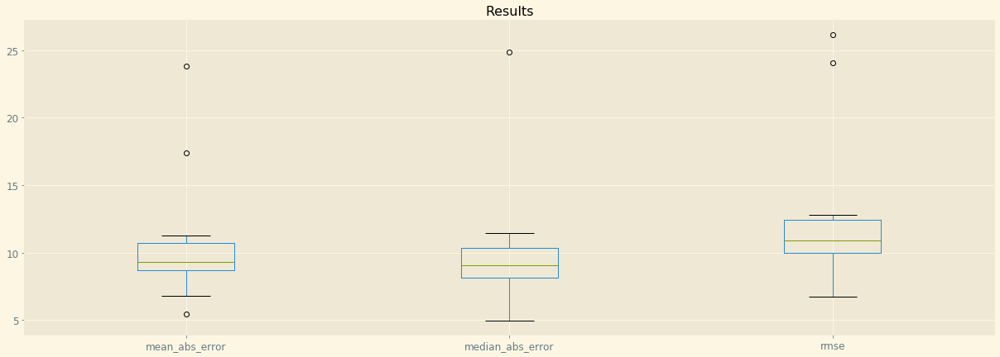

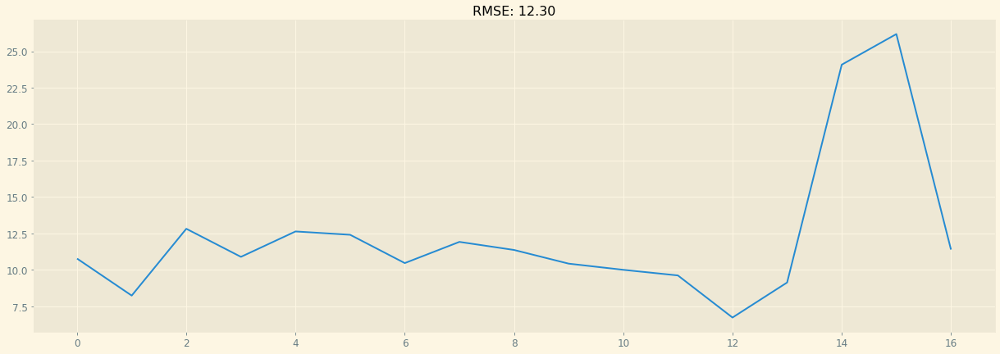

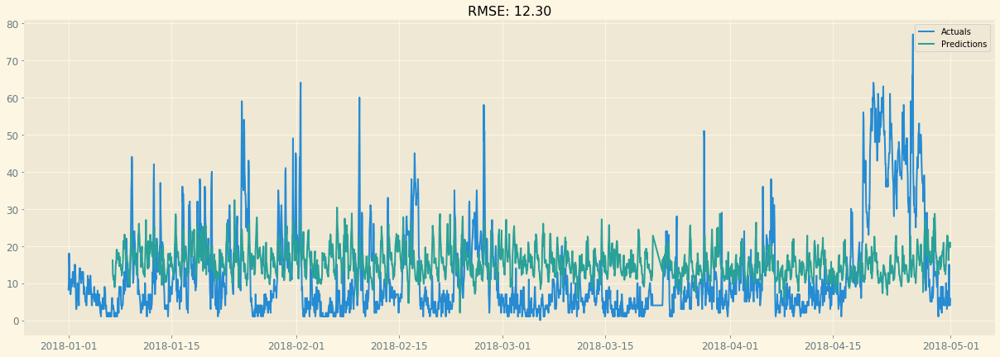

In [8]:
# Generate rolling predictions and results for particle of interest

data = oneparticle_onestation.sort_index().copy()
target = particle_of_interest

fit_func = fit_autoARIMA
predict_func = predict_autoARIMA

min_train_date = '2018-01-01'

week_starts = pd.date_range(min_train_date, data.index.max(), freq='W')

predictions_over_time, results_over_time = [], []

for i, week_start in enumerate(week_starts):
    if i % 10 == 0:
        print(week_start)

    train_set = data.loc[:(week_start - timedelta(hours=1))]
    test_set = data.loc[week_start:(week_start + timedelta(weeks=1, hours=-1))]
    models = train_set.groupby(['weekday', 'hour'])[target].apply(fit_func)
    predictions = test_set.apply(lambda x: predict_func(models.loc[tuple(x[['weekday', 'hour']])], x), axis=1)
    predictions_over_time.append(predictions)    
    results = evaluate_forecast(test_set[target], predictions, 'none')
    results['date'] = week_start
    results_over_time.append(results)  

results_over_time_24 = pd.DataFrame(results_over_time)
predictions_over_time_24 = pd.concat(predictions_over_time)

# Plot results statistics

results_over_time = results_over_time_24

fig, ax = plt.subplots(figsize=(21,7))
results_over_time.drop(['r2_score', 'mse'], axis=1).boxplot()
plt.title('Results')
plt.show()

# Plot RMSE overtime

fig, ax = plt.subplots(figsize=(21,7))
rmse_over_time = plt.plot(results_over_time['rmse'])
error = results_over_time['rmse'].mean()
plt.title('RMSE: %.2f'% error)
plt.show()

# Plot actuals and predictions overtime

plot_actuals_predictions(oneparticle_onestation[particle_of_interest][min_train_date:], predictions_over_time_24, results_over_time_24)

###  City average

In [ ]:
predictions_list =[predictions_over_time_08, predictions_over_time_18, predictions_over_time_35]
results_list = [results_over_time_08['rmse'], results_over_time_18['rmse'], results_over_time_35['rmse']]

predictions_final = pd.concat(predictions_list, axis=1).sort_index().mean(axis=1)
results_final = pd.concat(results_list, axis=1).sort_index().mean(axis=1)

target_mean = df_temp[particle_of_interest].groupby('date').mean()

fig, ax = plt.subplots(figsize=(21,7))
actuals = plt.plot(target_mean[min_train_date:], label='Actuals')
predictions = plt.plot(predictions_final, label='Predictions')
error = results_final.mean()
plt.legend(loc='best')
plt.title('RMSE: %.2f'% error)
plt.show()